# Afriat

In [1]:
import warnings
import os
import sys
import gc
import warnings

In [2]:
import anndata as ad
import scanpy as sc
import copy
import torch
from pathlib import Path
import networkx as nx
from sklearn.neighbors import kneighbors_graph
import numpy as np
import scanpy as sc
import pandas as pd
import numpy as np
import scipy.stats

sys.path.append("/home/icb/kemal.inecik/work/codes/tardis")
import tardis
tardis.config = tardis.config_server

In [3]:
torch.cuda.is_available()

False

In [4]:
%matplotlib inline
%config InlineBackend.figure_format='retina'
import matplotlib.pyplot as plt
import seaborn as sns

import pickle
_rcparams_path = "/home/icb/kemal.inecik/work/codes/tardis/training/local/figures/rcparams.pickle"
with open(_rcparams_path, 'rb') as file:
    _rcparams = pickle.load(file)
plt.rcParams.update(_rcparams)

In [5]:
adata_file_path = os.path.join(tardis.config.io_directories["processed"], "biolord_afriat.h5ad")
assert os.path.isfile(adata_file_path), f"File not already exist: `{adata_file_path}`"
adata = ad.read_h5ad(adata_file_path)
adata

AnnData object with n_obs × n_vars = 19053 × 5000
    obs: 'mouse', 'experiment', 'time_int', 'time_cat', 'zone', 'status_control'

In [6]:
asdp_1 = adata.X.sum()

In [7]:
ratio_true=0.98

from tardis._utils.functions import create_random_mask
mask = create_random_mask(adata.shape[1], ratio_true=ratio_true, seed=2024)
adata.X[:, mask] = 0.0

In [8]:
asdp_2 = adata.X.sum()

In [9]:
mask.sum()/adata.shape[1],  1-asdp_2/asdp_1

(0.9822, 0.985523134469986)

In [10]:
model_level_metrics = [
    dict(
        metric_identifier = "metric_mi|status_control",
        training_set = ["train"],
        every_n_epoch = 5,
        subsample = 1.0,
        progress_bar = True,
        metric_kwargs = dict(
            variation = "normalized",
            discretization_bins = 256,
            latent_subset=None,
            reduce=np.mean
        )
    ),
    dict(
        metric_identifier = "metric_mi|zone",
        training_set = ["train"],
        every_n_epoch = 5,
        subsample = 1.0,
        progress_bar = True,
        metric_kwargs = dict(
            variation = "normalized",
            discretization_bins = 128,
            latent_subset=None,
            reduce=np.mean
        )
    ),
    dict(
        metric_identifier = "metric_mi|time_cat",
        training_set = ["train"],
        every_n_epoch = 5,
        subsample = 1.0,
        progress_bar = True,
        metric_kwargs = dict(
            variation = "normalized",
            discretization_bins = 128,
            latent_subset=None,
            reduce=np.mean
        )
    ),
    dict(
        metric_identifier = "metric_mi|mouse",
        training_set = ["train"],
        every_n_epoch = 5,
        subsample = 1.0,
        progress_bar = True,
        metric_kwargs = dict(
            variation = "normalized",
            discretization_bins = 128,
            latent_subset=None,
            reduce=np.mean
        )
    )
]

In [11]:
warmup_epoch_range = [6, 48]
dtc_w1 = 100
dtc_w2 = 10

counteractive_minibatch_settings = dict(
    method = "categorical_random",
    method_kwargs = dict(
        within_labels = False,
        within_batch = False,
        within_categorical_covs = None,
        seed = "forward",
    )
)

disentenglement_targets_configurations=[
    dict(
        obs_key = "status_control",
        n_reserved_latent = 8,
        counteractive_minibatch_settings = counteractive_minibatch_settings,
        auxillary_losses = [
            dict(
                apply = True, 
                target_type="categorical",
                progress_bar = False,
                weight = dtc_w1,
                method = "mse_z", 
                latent_group = "reserved",
                counteractive_example = "negative",
                transformation = "inverse", 
                warmup_epoch_range=warmup_epoch_range,
                method_kwargs = {}
            ),
            dict(
                apply = True, 
                target_type="categorical",
                progress_bar = False,
                weight = dtc_w2, 
                method = "mse_z", 
                latent_group = "reserved",
                counteractive_example = "positive",
                transformation = "none",
                warmup_epoch_range=warmup_epoch_range,
                method_kwargs = {}
            ),
            dict(
                apply = True, 
                target_type="categorical",
                progress_bar = False,
                weight = dtc_w2 * 1,
                method = "mse_z", 
                latent_group = "unreserved_complete",
                counteractive_example = "negative",
                transformation = "none", 
                warmup_epoch_range=warmup_epoch_range,
                method_kwargs = {}
            ),
            dict(
                apply = True, 
                target_type="categorical",
                progress_bar = False,
                weight = dtc_w1 * 1, 
                method = "mse_z", 
                latent_group = "unreserved_complete",
                counteractive_example = "positive",
                transformation = "inverse",
                warmup_epoch_range=warmup_epoch_range,
                method_kwargs = {}
            ),
        ]
    ),
    dict(
        obs_key = "time_cat",
        n_reserved_latent = 8,
        counteractive_minibatch_settings = counteractive_minibatch_settings,
        auxillary_losses = [
            dict(
                apply = True, 
                target_type="categorical",
                progress_bar = False,
                weight = dtc_w1,
                method = "mse_z", 
                latent_group = "reserved",
                counteractive_example = "negative",
                transformation = "inverse", 
                warmup_epoch_range=warmup_epoch_range,
                method_kwargs = {}
            ),
            dict(
                apply = True, 
                target_type="categorical",
                progress_bar = False,
                weight = dtc_w2, 
                method = "mse_z", 
                latent_group = "reserved",
                counteractive_example = "positive",
                transformation = "none",
                warmup_epoch_range=warmup_epoch_range,
                method_kwargs = {}
            ),
            dict(
                apply = True, 
                target_type="categorical",
                progress_bar = False,
                weight = dtc_w2 * 1,
                method = "mse_z", 
                latent_group = "unreserved_complete",
                counteractive_example = "negative",
                transformation = "none", 
                warmup_epoch_range=warmup_epoch_range,
                method_kwargs = {}
            ),
            dict(
                apply = True, 
                target_type="categorical",
                progress_bar = False,
                weight = dtc_w1 * 1, 
                method = "mse_z", 
                latent_group = "unreserved_complete",
                counteractive_example = "positive",
                transformation = "inverse",
                warmup_epoch_range=warmup_epoch_range,
                method_kwargs = {}
            ),
        ]
    ),
    dict(
        obs_key = "zone",
        n_reserved_latent = 8,
        counteractive_minibatch_settings = counteractive_minibatch_settings,
        auxillary_losses = [
            dict(
                apply = True, 
                target_type="categorical",
                progress_bar = False,
                weight = dtc_w1,
                method = "mse_z", 
                latent_group = "reserved",
                counteractive_example = "negative",
                transformation = "inverse", 
                warmup_epoch_range=warmup_epoch_range,
                method_kwargs = {}
            ),
            dict(
                apply = True, 
                target_type="categorical",
                progress_bar = False,
                weight = dtc_w2, 
                method = "mse_z", 
                latent_group = "reserved",
                counteractive_example = "positive",
                transformation = "none",
                warmup_epoch_range=warmup_epoch_range,
                method_kwargs = {}
            ),
            dict(
                apply = True, 
                target_type="categorical",
                progress_bar = False,
                weight = dtc_w2 * 1,
                method = "mse_z", 
                latent_group = "unreserved_complete",
                counteractive_example = "negative",
                transformation = "none", 
                warmup_epoch_range=warmup_epoch_range,
                method_kwargs = {}
            ),
            dict(
                apply = True, 
                target_type="categorical",
                progress_bar = False,
                weight = dtc_w1 * 1, 
                method = "mse_z", 
                latent_group = "unreserved_complete",
                counteractive_example = "positive",
                transformation = "inverse",
                warmup_epoch_range=warmup_epoch_range,
                method_kwargs = {}
            ),
        ]
    )
]

In [12]:
n_epochs_kl_warmup = 600

model_params = dict(
    n_hidden=512,
    n_layers=3, 
    n_latent=(24 + 8 * len(disentenglement_targets_configurations)),
    gene_likelihood = "nb",
    use_batch_norm = "none",
    use_layer_norm = "both",
    dropout_rate = 0.25,
    deeply_inject_disentengled_latents = True,
    include_auxillary_loss = True,
    beta_kl_weight = 0.5,
)

train_params = dict(
    max_epochs=600,
    train_size=0.8,
    batch_size=128,
    check_val_every_n_epoch=10,
    limit_train_batches=1.0, 
    limit_val_batches=1.0,
    learning_rate_monitor=True,
    # early stopping:
    early_stopping=False,
    early_stopping_patience=150,
    early_stopping_monitor="elbo_train",
    plan_kwargs = dict(
        n_epochs_kl_warmup=n_epochs_kl_warmup,
        lr=1e-4,
        weight_decay=1e-4,
        optimizer="AdamW",
        # lr-scheduler:
        reduce_lr_on_plateau=True,
        lr_patience=100,
        lr_scheduler_metric="elbo_train",
    )
)

dataset_params = dict(
    layer=None, 
    labels_key=None,
    batch_key=None,
    categorical_covariate_keys=None,
    disentenglement_targets_configurations=disentenglement_targets_configurations,
    model_level_metrics=model_level_metrics,
    model_level_metrics_helper_covariates=['zone', 'status_control', 'time_cat', 'mouse']
)

tardis.MyModel.setup_anndata(adata, **dataset_params)
dataset_params["adata_path"] = adata_file_path
dataset_params["adata"] = os.path.split(adata_file_path)[1]

tardis.MyModel.setup_wandb(
    wandb_configurations=tardis.config.wandb,
    hyperparams=dict(
        model_params=model_params,
        train_params=train_params,
        dataset_params=dataset_params,
    )
)

vae = tardis.MyModel(
    adata,
    **model_params
)
vae.train(**train_params)

dir_path = os.path.join(
    tardis.config.io_directories["models"],
    f"afriat_v2_4_ablation_{ratio_true}"
)

vae.save(
    dir_path,
    overwrite=True,
)

/home/icb/kemal.inecik/work/codes/tardis/tardis/_mymodel.py:81: UserWarning: This dataset has some empty cells, this might fail inference.Data should be filtered with `scanpy.pp.filter_cells()`
  library_log_means, library_log_vars = _init_library_size(self.adata_manager, n_batch)


W&B logger initialized with the following parameters: 
Entity: inecik-academic
Project: tardis_figures
ID: jprz2b8z
Name: faithful-universe-120
Tags: tardis, conference, figures, final
Notes: Final runs for Tardis before conference.
URL: https://wandb.ai/inecik-academic/tardis_figures/runs/jprz2b8z
Directory: /lustre/groups/ml01/workspace/kemal.inecik/wandb/run-20240503_120409-jprz2b8z/files



GPU available: False, used: False


TPU available: False, using: 0 TPU cores


IPU available: False, using: 0 IPUs


HPU available: False, using: 0 HPUs


`Trainer(limit_train_batches=1.0)` was configured so 100% of the batches per epoch will be used..


`Trainer(limit_val_batches=1.0)` was configured so 100% of the batches will be used..


/home/icb/kemal.inecik/tools/apps/mamba/envs/tardis_env/lib/python3.10/site-packages/torch/optim/lr_scheduler.py:28: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn("The verbose parameter is deprecated. Please use get_last_lr() "
SLURM auto-requeueing enabled. Setting signal handlers.


Training:   0%|                                                                                                                                                                                                                                 | 0/600 [00:00<?, ?it/s]

Epoch 1/600:   0%|                                                                                                                                                                                                                              | 0/600 [00:00<?, ?it/s]

/home/icb/kemal.inecik/work/codes/tardis/tardis/_counteractivegenerator.py:237: UserWarning: Possible group definition indices are calculated for `status_control` for `training` set. Number of elements in each group: 2587,3295,9361
  possible_indices = CachedPossibleGroupDefinitionIndices.get(


/home/icb/kemal.inecik/work/codes/tardis/tardis/_counteractivegenerator.py:237: UserWarning: Possible group definition indices are calculated for `time_cat` for `training` set. Number of elements in each group: 2587,2553,1659,3449,1628,3367
  possible_indices = CachedPossibleGroupDefinitionIndices.get(


/home/icb/kemal.inecik/work/codes/tardis/tardis/_counteractivegenerator.py:237: UserWarning: Possible group definition indices are calculated for `zone` for `training` set. Number of elements in each group: 4424,10819
  possible_indices = CachedPossibleGroupDefinitionIndices.get(


/home/icb/kemal.inecik/work/codes/tardis/tardis/_counteractivegenerator.py:237: UserWarning: Possible group definition indices are calculated for `status_control` for `validation` set. Number of elements in each group: 618,814,2378
  possible_indices = CachedPossibleGroupDefinitionIndices.get(
/home/icb/kemal.inecik/work/codes/tardis/tardis/_counteractivegenerator.py:237: UserWarning: Possible group definition indices are calculated for `time_cat` for `validation` set. Number of elements in each group: 618,649,449,841,421,832
  possible_indices = CachedPossibleGroupDefinitionIndices.get(


/home/icb/kemal.inecik/work/codes/tardis/tardis/_counteractivegenerator.py:237: UserWarning: Possible group definition indices are calculated for `zone` for `validation` set. Number of elements in each group: 1160,2650
  possible_indices = CachedPossibleGroupDefinitionIndices.get(


Epoch 1/600:   0%|▎                                                                                                                                                                                                                   | 1/600 [00:14<2:21:29, 14.17s/it]

Epoch 1/600:   0%|▎                                                                                                                                                            | 1/600 [00:14<2:21:29, 14.17s/it, v_num=8z_1, total_loss_train=128, kl_local_train=29.8]

Epoch 2/600:   0%|▎                                                                                                                                                            | 1/600 [00:14<2:21:29, 14.17s/it, v_num=8z_1, total_loss_train=128, kl_local_train=29.8]

Epoch 2/600:   0%|▌                                                                                                                                                            | 2/600 [00:27<2:13:36, 13.41s/it, v_num=8z_1, total_loss_train=128, kl_local_train=29.8]

Epoch 2/600:   0%|▌                                                                                                                                                             | 2/600 [00:27<2:13:36, 13.41s/it, v_num=8z_1, total_loss_train=70, kl_local_train=42.2]

Epoch 3/600:   0%|▌                                                                                                                                                             | 2/600 [00:27<2:13:36, 13.41s/it, v_num=8z_1, total_loss_train=70, kl_local_train=42.2]

Epoch 3/600:   0%|▊                                                                                                                                                             | 3/600 [00:39<2:10:49, 13.15s/it, v_num=8z_1, total_loss_train=70, kl_local_train=42.2]

Epoch 3/600:   0%|▊                                                                                                                                                           | 3/600 [00:39<2:10:49, 13.15s/it, v_num=8z_1, total_loss_train=62.4, kl_local_train=37.7]

Epoch 4/600:   0%|▊                                                                                                                                                           | 3/600 [00:39<2:10:49, 13.15s/it, v_num=8z_1, total_loss_train=62.4, kl_local_train=37.7]

Epoch 4/600:   1%|█                                                                                                                                                           | 4/600 [00:52<2:09:38, 13.05s/it, v_num=8z_1, total_loss_train=62.4, kl_local_train=37.7]

Epoch 4/600:   1%|█                                                                                                                                                           | 4/600 [00:52<2:09:38, 13.05s/it, v_num=8z_1, total_loss_train=60.6, kl_local_train=28.2]

Epoch 5/600:   1%|█                                                                                                                                                           | 4/600 [00:52<2:09:38, 13.05s/it, v_num=8z_1, total_loss_train=60.6, kl_local_train=28.2]

Epoch 5/600:   1%|█▎                                                                                                                                                          | 5/600 [01:05<2:08:38, 12.97s/it, v_num=8z_1, total_loss_train=60.6, kl_local_train=28.2]

Epoch 5/600:   1%|█▎                                                                                                                                                          | 5/600 [01:05<2:08:38, 12.97s/it, v_num=8z_1, total_loss_train=59.9, kl_local_train=18.7]

Epoch 6/600:   1%|█▎                                                                                                                                                          | 5/600 [01:07<2:08:38, 12.97s/it, v_num=8z_1, total_loss_train=59.9, kl_local_train=18.7]

Epoch 6/600:   1%|█▌                                                                                                                                                          | 6/600 [01:19<2:10:25, 13.18s/it, v_num=8z_1, total_loss_train=59.9, kl_local_train=18.7]

Epoch 6/600:   1%|▏                       | 6/600 [01:19<2:10:25, 13.18s/it, v_num=8z_1, total_loss_train=59.4, kl_local_train=12.7, metric_mi|status_control_train=0.0193, metric_mi|zone_train=0.00776, metric_mi|time_cat_train=0.0129, metric_mi|mouse_train=0.0356]

Epoch 7/600:   1%|▏                       | 6/600 [01:19<2:10:25, 13.18s/it, v_num=8z_1, total_loss_train=59.4, kl_local_train=12.7, metric_mi|status_control_train=0.0193, metric_mi|zone_train=0.00776, metric_mi|time_cat_train=0.0129, metric_mi|mouse_train=0.0356]

Epoch 7/600:   1%|▎                       | 7/600 [01:31<2:07:02, 12.85s/it, v_num=8z_1, total_loss_train=59.4, kl_local_train=12.7, metric_mi|status_control_train=0.0193, metric_mi|zone_train=0.00776, metric_mi|time_cat_train=0.0129, metric_mi|mouse_train=0.0356]

Epoch 7/600:   1%|▎                         | 7/600 [01:31<2:07:02, 12.85s/it, v_num=8z_1, total_loss_train=59, kl_local_train=10.6, metric_mi|status_control_train=0.0193, metric_mi|zone_train=0.00776, metric_mi|time_cat_train=0.0129, metric_mi|mouse_train=0.0356]

Epoch 8/600:   1%|▎                         | 7/600 [01:31<2:07:02, 12.85s/it, v_num=8z_1, total_loss_train=59, kl_local_train=10.6, metric_mi|status_control_train=0.0193, metric_mi|zone_train=0.00776, metric_mi|time_cat_train=0.0129, metric_mi|mouse_train=0.0356]

Epoch 8/600:   1%|▎                         | 8/600 [01:43<2:04:30, 12.62s/it, v_num=8z_1, total_loss_train=59, kl_local_train=10.6, metric_mi|status_control_train=0.0193, metric_mi|zone_train=0.00776, metric_mi|time_cat_train=0.0129, metric_mi|mouse_train=0.0356]

Epoch 8/600:   1%|▎                       | 8/600 [01:43<2:04:30, 12.62s/it, v_num=8z_1, total_loss_train=66.4, kl_local_train=10.9, metric_mi|status_control_train=0.0193, metric_mi|zone_train=0.00776, metric_mi|time_cat_train=0.0129, metric_mi|mouse_train=0.0356]

Epoch 9/600:   1%|▎                       | 8/600 [01:43<2:04:30, 12.62s/it, v_num=8z_1, total_loss_train=66.4, kl_local_train=10.9, metric_mi|status_control_train=0.0193, metric_mi|zone_train=0.00776, metric_mi|time_cat_train=0.0129, metric_mi|mouse_train=0.0356]

Epoch 9/600:   2%|▎                       | 9/600 [01:55<2:02:39, 12.45s/it, v_num=8z_1, total_loss_train=66.4, kl_local_train=10.9, metric_mi|status_control_train=0.0193, metric_mi|zone_train=0.00776, metric_mi|time_cat_train=0.0129, metric_mi|mouse_train=0.0356]

Epoch 9/600:   2%|▍                         | 9/600 [01:55<2:02:39, 12.45s/it, v_num=8z_1, total_loss_train=73.6, kl_local_train=14, metric_mi|status_control_train=0.0193, metric_mi|zone_train=0.00776, metric_mi|time_cat_train=0.0129, metric_mi|mouse_train=0.0356]

Epoch 10/600:   2%|▍                        | 9/600 [01:55<2:02:39, 12.45s/it, v_num=8z_1, total_loss_train=73.6, kl_local_train=14, metric_mi|status_control_train=0.0193, metric_mi|zone_train=0.00776, metric_mi|time_cat_train=0.0129, metric_mi|mouse_train=0.0356]

Epoch 10/600:   2%|▍                       | 10/600 [02:07<2:01:44, 12.38s/it, v_num=8z_1, total_loss_train=73.6, kl_local_train=14, metric_mi|status_control_train=0.0193, metric_mi|zone_train=0.00776, metric_mi|time_cat_train=0.0129, metric_mi|mouse_train=0.0356]

Epoch 10/600:   2%|▎                     | 10/600 [02:07<2:01:44, 12.38s/it, v_num=8z_1, total_loss_train=79.3, kl_local_train=50.6, metric_mi|status_control_train=0.0193, metric_mi|zone_train=0.00776, metric_mi|time_cat_train=0.0129, metric_mi|mouse_train=0.0356]

Epoch 11/600:   2%|▎                     | 10/600 [02:09<2:01:44, 12.38s/it, v_num=8z_1, total_loss_train=79.3, kl_local_train=50.6, metric_mi|status_control_train=0.0193, metric_mi|zone_train=0.00776, metric_mi|time_cat_train=0.0129, metric_mi|mouse_train=0.0356]

Epoch 11/600:   2%|▍                     | 11/600 [02:21<2:04:58, 12.73s/it, v_num=8z_1, total_loss_train=79.3, kl_local_train=50.6, metric_mi|status_control_train=0.0193, metric_mi|zone_train=0.00776, metric_mi|time_cat_train=0.0129, metric_mi|mouse_train=0.0356]

Epoch 11/600:   2%|▍                      | 11/600 [02:21<2:04:58, 12.73s/it, v_num=8z_1, total_loss_train=81.7, kl_local_train=90.7, metric_mi|status_control_train=0.0369, metric_mi|zone_train=0.0686, metric_mi|time_cat_train=0.0245, metric_mi|mouse_train=0.0438]

Epoch 12/600:   2%|▍                      | 11/600 [02:21<2:04:58, 12.73s/it, v_num=8z_1, total_loss_train=81.7, kl_local_train=90.7, metric_mi|status_control_train=0.0369, metric_mi|zone_train=0.0686, metric_mi|time_cat_train=0.0245, metric_mi|mouse_train=0.0438]

Epoch 12/600:   2%|▍                      | 12/600 [02:33<2:03:03, 12.56s/it, v_num=8z_1, total_loss_train=81.7, kl_local_train=90.7, metric_mi|status_control_train=0.0369, metric_mi|zone_train=0.0686, metric_mi|time_cat_train=0.0245, metric_mi|mouse_train=0.0438]

Epoch 12/600:   2%|▌                        | 12/600 [02:33<2:03:03, 12.56s/it, v_num=8z_1, total_loss_train=85.7, kl_local_train=92, metric_mi|status_control_train=0.0369, metric_mi|zone_train=0.0686, metric_mi|time_cat_train=0.0245, metric_mi|mouse_train=0.0438]

Epoch 13/600:   2%|▌                        | 12/600 [02:33<2:03:03, 12.56s/it, v_num=8z_1, total_loss_train=85.7, kl_local_train=92, metric_mi|status_control_train=0.0369, metric_mi|zone_train=0.0686, metric_mi|time_cat_train=0.0245, metric_mi|mouse_train=0.0438]

Epoch 13/600:   2%|▌                        | 13/600 [02:45<2:01:29, 12.42s/it, v_num=8z_1, total_loss_train=85.7, kl_local_train=92, metric_mi|status_control_train=0.0369, metric_mi|zone_train=0.0686, metric_mi|time_cat_train=0.0245, metric_mi|mouse_train=0.0438]

Epoch 13/600:   2%|▍                      | 13/600 [02:45<2:01:29, 12.42s/it, v_num=8z_1, total_loss_train=89.8, kl_local_train=96.2, metric_mi|status_control_train=0.0369, metric_mi|zone_train=0.0686, metric_mi|time_cat_train=0.0245, metric_mi|mouse_train=0.0438]

Epoch 14/600:   2%|▍                      | 13/600 [02:45<2:01:29, 12.42s/it, v_num=8z_1, total_loss_train=89.8, kl_local_train=96.2, metric_mi|status_control_train=0.0369, metric_mi|zone_train=0.0686, metric_mi|time_cat_train=0.0245, metric_mi|mouse_train=0.0438]

Epoch 14/600:   2%|▌                      | 14/600 [02:57<2:00:20, 12.32s/it, v_num=8z_1, total_loss_train=89.8, kl_local_train=96.2, metric_mi|status_control_train=0.0369, metric_mi|zone_train=0.0686, metric_mi|time_cat_train=0.0245, metric_mi|mouse_train=0.0438]

Epoch 14/600:   2%|▌                       | 14/600 [02:57<2:00:20, 12.32s/it, v_num=8z_1, total_loss_train=93.1, kl_local_train=118, metric_mi|status_control_train=0.0369, metric_mi|zone_train=0.0686, metric_mi|time_cat_train=0.0245, metric_mi|mouse_train=0.0438]

Epoch 15/600:   2%|▌                       | 14/600 [02:57<2:00:20, 12.32s/it, v_num=8z_1, total_loss_train=93.1, kl_local_train=118, metric_mi|status_control_train=0.0369, metric_mi|zone_train=0.0686, metric_mi|time_cat_train=0.0245, metric_mi|mouse_train=0.0438]

Epoch 15/600:   2%|▌                       | 15/600 [03:09<1:59:50, 12.29s/it, v_num=8z_1, total_loss_train=93.1, kl_local_train=118, metric_mi|status_control_train=0.0369, metric_mi|zone_train=0.0686, metric_mi|time_cat_train=0.0245, metric_mi|mouse_train=0.0438]

Epoch 15/600:   2%|▌                       | 15/600 [03:09<1:59:50, 12.29s/it, v_num=8z_1, total_loss_train=96.9, kl_local_train=134, metric_mi|status_control_train=0.0369, metric_mi|zone_train=0.0686, metric_mi|time_cat_train=0.0245, metric_mi|mouse_train=0.0438]

Epoch 16/600:   2%|▌                       | 15/600 [03:11<1:59:50, 12.29s/it, v_num=8z_1, total_loss_train=96.9, kl_local_train=134, metric_mi|status_control_train=0.0369, metric_mi|zone_train=0.0686, metric_mi|time_cat_train=0.0245, metric_mi|mouse_train=0.0438]

Epoch 16/600:   3%|▋                       | 16/600 [03:23<2:03:17, 12.67s/it, v_num=8z_1, total_loss_train=96.9, kl_local_train=134, metric_mi|status_control_train=0.0369, metric_mi|zone_train=0.0686, metric_mi|time_cat_train=0.0245, metric_mi|mouse_train=0.0438]

Epoch 16/600:   3%|▊                            | 16/600 [03:23<2:03:17, 12.67s/it, v_num=8z_1, total_loss_train=101, kl_local_train=141, metric_mi|status_control_train=0.235, metric_mi|zone_train=0.175, metric_mi|time_cat_train=0.145, metric_mi|mouse_train=0.115]

Epoch 17/600:   3%|▊                            | 16/600 [03:23<2:03:17, 12.67s/it, v_num=8z_1, total_loss_train=101, kl_local_train=141, metric_mi|status_control_train=0.235, metric_mi|zone_train=0.175, metric_mi|time_cat_train=0.145, metric_mi|mouse_train=0.115]

Epoch 17/600:   3%|▊                            | 17/600 [03:35<2:01:34, 12.51s/it, v_num=8z_1, total_loss_train=101, kl_local_train=141, metric_mi|status_control_train=0.235, metric_mi|zone_train=0.175, metric_mi|time_cat_train=0.145, metric_mi|mouse_train=0.115]

Epoch 17/600:   3%|▊                            | 17/600 [03:35<2:01:34, 12.51s/it, v_num=8z_1, total_loss_train=105, kl_local_train=144, metric_mi|status_control_train=0.235, metric_mi|zone_train=0.175, metric_mi|time_cat_train=0.145, metric_mi|mouse_train=0.115]

Epoch 18/600:   3%|▊                            | 17/600 [03:35<2:01:34, 12.51s/it, v_num=8z_1, total_loss_train=105, kl_local_train=144, metric_mi|status_control_train=0.235, metric_mi|zone_train=0.175, metric_mi|time_cat_train=0.145, metric_mi|mouse_train=0.115]

Epoch 18/600:   3%|▊                            | 18/600 [03:47<2:00:17, 12.40s/it, v_num=8z_1, total_loss_train=105, kl_local_train=144, metric_mi|status_control_train=0.235, metric_mi|zone_train=0.175, metric_mi|time_cat_train=0.145, metric_mi|mouse_train=0.115]

Epoch 18/600:   3%|▊                            | 18/600 [03:47<2:00:17, 12.40s/it, v_num=8z_1, total_loss_train=109, kl_local_train=145, metric_mi|status_control_train=0.235, metric_mi|zone_train=0.175, metric_mi|time_cat_train=0.145, metric_mi|mouse_train=0.115]

Epoch 19/600:   3%|▊                            | 18/600 [03:47<2:00:17, 12.40s/it, v_num=8z_1, total_loss_train=109, kl_local_train=145, metric_mi|status_control_train=0.235, metric_mi|zone_train=0.175, metric_mi|time_cat_train=0.145, metric_mi|mouse_train=0.115]

Epoch 19/600:   3%|▉                            | 19/600 [03:59<1:59:19, 12.32s/it, v_num=8z_1, total_loss_train=109, kl_local_train=145, metric_mi|status_control_train=0.235, metric_mi|zone_train=0.175, metric_mi|time_cat_train=0.145, metric_mi|mouse_train=0.115]

Epoch 19/600:   3%|▉                            | 19/600 [03:59<1:59:19, 12.32s/it, v_num=8z_1, total_loss_train=113, kl_local_train=146, metric_mi|status_control_train=0.235, metric_mi|zone_train=0.175, metric_mi|time_cat_train=0.145, metric_mi|mouse_train=0.115]

Epoch 20/600:   3%|▉                            | 19/600 [03:59<1:59:19, 12.32s/it, v_num=8z_1, total_loss_train=113, kl_local_train=146, metric_mi|status_control_train=0.235, metric_mi|zone_train=0.175, metric_mi|time_cat_train=0.145, metric_mi|mouse_train=0.115]

Epoch 20/600:   3%|▉                            | 20/600 [04:12<1:59:00, 12.31s/it, v_num=8z_1, total_loss_train=113, kl_local_train=146, metric_mi|status_control_train=0.235, metric_mi|zone_train=0.175, metric_mi|time_cat_train=0.145, metric_mi|mouse_train=0.115]

Epoch 20/600:   3%|▉                            | 20/600 [04:12<1:59:00, 12.31s/it, v_num=8z_1, total_loss_train=117, kl_local_train=147, metric_mi|status_control_train=0.235, metric_mi|zone_train=0.175, metric_mi|time_cat_train=0.145, metric_mi|mouse_train=0.115]

Epoch 21/600:   3%|▉                            | 20/600 [04:13<1:59:00, 12.31s/it, v_num=8z_1, total_loss_train=117, kl_local_train=147, metric_mi|status_control_train=0.235, metric_mi|zone_train=0.175, metric_mi|time_cat_train=0.145, metric_mi|mouse_train=0.115]

Epoch 21/600:   4%|█                            | 21/600 [04:25<2:02:54, 12.74s/it, v_num=8z_1, total_loss_train=117, kl_local_train=147, metric_mi|status_control_train=0.235, metric_mi|zone_train=0.175, metric_mi|time_cat_train=0.145, metric_mi|mouse_train=0.115]

Epoch 21/600:   4%|█                             | 21/600 [04:25<2:02:54, 12.74s/it, v_num=8z_1, total_loss_train=121, kl_local_train=149, metric_mi|status_control_train=0.243, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.171, metric_mi|mouse_train=0.131]

Epoch 22/600:   4%|█                             | 21/600 [04:25<2:02:54, 12.74s/it, v_num=8z_1, total_loss_train=121, kl_local_train=149, metric_mi|status_control_train=0.243, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.171, metric_mi|mouse_train=0.131]

Epoch 22/600:   4%|█                             | 22/600 [04:38<2:01:24, 12.60s/it, v_num=8z_1, total_loss_train=121, kl_local_train=149, metric_mi|status_control_train=0.243, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.171, metric_mi|mouse_train=0.131]

Epoch 22/600:   4%|█                             | 22/600 [04:38<2:01:24, 12.60s/it, v_num=8z_1, total_loss_train=126, kl_local_train=153, metric_mi|status_control_train=0.243, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.171, metric_mi|mouse_train=0.131]

Epoch 23/600:   4%|█                             | 22/600 [04:38<2:01:24, 12.60s/it, v_num=8z_1, total_loss_train=126, kl_local_train=153, metric_mi|status_control_train=0.243, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.171, metric_mi|mouse_train=0.131]

Epoch 23/600:   4%|█▏                            | 23/600 [04:50<2:01:06, 12.59s/it, v_num=8z_1, total_loss_train=126, kl_local_train=153, metric_mi|status_control_train=0.243, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.171, metric_mi|mouse_train=0.131]

Epoch 23/600:   4%|█▏                            | 23/600 [04:50<2:01:06, 12.59s/it, v_num=8z_1, total_loss_train=130, kl_local_train=152, metric_mi|status_control_train=0.243, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.171, metric_mi|mouse_train=0.131]

Epoch 24/600:   4%|█▏                            | 23/600 [04:50<2:01:06, 12.59s/it, v_num=8z_1, total_loss_train=130, kl_local_train=152, metric_mi|status_control_train=0.243, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.171, metric_mi|mouse_train=0.131]

Epoch 24/600:   4%|█▏                            | 24/600 [05:03<2:00:39, 12.57s/it, v_num=8z_1, total_loss_train=130, kl_local_train=152, metric_mi|status_control_train=0.243, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.171, metric_mi|mouse_train=0.131]

Epoch 24/600:   4%|█▏                            | 24/600 [05:03<2:00:39, 12.57s/it, v_num=8z_1, total_loss_train=134, kl_local_train=156, metric_mi|status_control_train=0.243, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.171, metric_mi|mouse_train=0.131]

Epoch 25/600:   4%|█▏                            | 24/600 [05:03<2:00:39, 12.57s/it, v_num=8z_1, total_loss_train=134, kl_local_train=156, metric_mi|status_control_train=0.243, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.171, metric_mi|mouse_train=0.131]

Epoch 25/600:   4%|█▎                            | 25/600 [05:15<1:59:51, 12.51s/it, v_num=8z_1, total_loss_train=134, kl_local_train=156, metric_mi|status_control_train=0.243, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.171, metric_mi|mouse_train=0.131]

Epoch 25/600:   4%|█▎                            | 25/600 [05:15<1:59:51, 12.51s/it, v_num=8z_1, total_loss_train=138, kl_local_train=157, metric_mi|status_control_train=0.243, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.171, metric_mi|mouse_train=0.131]

Epoch 26/600:   4%|█▎                            | 25/600 [05:17<1:59:51, 12.51s/it, v_num=8z_1, total_loss_train=138, kl_local_train=157, metric_mi|status_control_train=0.243, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.171, metric_mi|mouse_train=0.131]

Epoch 26/600:   4%|█▎                            | 26/600 [05:29<2:03:15, 12.88s/it, v_num=8z_1, total_loss_train=138, kl_local_train=157, metric_mi|status_control_train=0.243, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.171, metric_mi|mouse_train=0.131]

Epoch 26/600:   4%|█▎                           | 26/600 [05:29<2:03:15, 12.88s/it, v_num=8z_1, total_loss_train=143, kl_local_train=159, metric_mi|status_control_train=0.251, metric_mi|zone_train=0.181, metric_mi|time_cat_train=0.189, metric_mi|mouse_train=0.142]

Epoch 27/600:   4%|█▎                           | 26/600 [05:29<2:03:15, 12.88s/it, v_num=8z_1, total_loss_train=143, kl_local_train=159, metric_mi|status_control_train=0.251, metric_mi|zone_train=0.181, metric_mi|time_cat_train=0.189, metric_mi|mouse_train=0.142]

Epoch 27/600:   4%|█▎                           | 27/600 [05:41<2:01:25, 12.71s/it, v_num=8z_1, total_loss_train=143, kl_local_train=159, metric_mi|status_control_train=0.251, metric_mi|zone_train=0.181, metric_mi|time_cat_train=0.189, metric_mi|mouse_train=0.142]

Epoch 27/600:   4%|█▎                           | 27/600 [05:41<2:01:25, 12.71s/it, v_num=8z_1, total_loss_train=147, kl_local_train=159, metric_mi|status_control_train=0.251, metric_mi|zone_train=0.181, metric_mi|time_cat_train=0.189, metric_mi|mouse_train=0.142]

Epoch 28/600:   4%|█▎                           | 27/600 [05:41<2:01:25, 12.71s/it, v_num=8z_1, total_loss_train=147, kl_local_train=159, metric_mi|status_control_train=0.251, metric_mi|zone_train=0.181, metric_mi|time_cat_train=0.189, metric_mi|mouse_train=0.142]

Epoch 28/600:   5%|█▎                           | 28/600 [05:54<2:00:07, 12.60s/it, v_num=8z_1, total_loss_train=147, kl_local_train=159, metric_mi|status_control_train=0.251, metric_mi|zone_train=0.181, metric_mi|time_cat_train=0.189, metric_mi|mouse_train=0.142]

Epoch 28/600:   5%|█▎                           | 28/600 [05:54<2:00:07, 12.60s/it, v_num=8z_1, total_loss_train=151, kl_local_train=157, metric_mi|status_control_train=0.251, metric_mi|zone_train=0.181, metric_mi|time_cat_train=0.189, metric_mi|mouse_train=0.142]

Epoch 29/600:   5%|█▎                           | 28/600 [05:54<2:00:07, 12.60s/it, v_num=8z_1, total_loss_train=151, kl_local_train=157, metric_mi|status_control_train=0.251, metric_mi|zone_train=0.181, metric_mi|time_cat_train=0.189, metric_mi|mouse_train=0.142]

Epoch 29/600:   5%|█▍                           | 29/600 [06:06<1:59:33, 12.56s/it, v_num=8z_1, total_loss_train=151, kl_local_train=157, metric_mi|status_control_train=0.251, metric_mi|zone_train=0.181, metric_mi|time_cat_train=0.189, metric_mi|mouse_train=0.142]

Epoch 29/600:   5%|█▍                           | 29/600 [06:06<1:59:33, 12.56s/it, v_num=8z_1, total_loss_train=155, kl_local_train=161, metric_mi|status_control_train=0.251, metric_mi|zone_train=0.181, metric_mi|time_cat_train=0.189, metric_mi|mouse_train=0.142]

Epoch 30/600:   5%|█▍                           | 29/600 [06:06<1:59:33, 12.56s/it, v_num=8z_1, total_loss_train=155, kl_local_train=161, metric_mi|status_control_train=0.251, metric_mi|zone_train=0.181, metric_mi|time_cat_train=0.189, metric_mi|mouse_train=0.142]

Epoch 30/600:   5%|█▍                           | 30/600 [06:19<1:59:27, 12.57s/it, v_num=8z_1, total_loss_train=155, kl_local_train=161, metric_mi|status_control_train=0.251, metric_mi|zone_train=0.181, metric_mi|time_cat_train=0.189, metric_mi|mouse_train=0.142]

Epoch 30/600:   5%|█▍                           | 30/600 [06:19<1:59:27, 12.57s/it, v_num=8z_1, total_loss_train=159, kl_local_train=160, metric_mi|status_control_train=0.251, metric_mi|zone_train=0.181, metric_mi|time_cat_train=0.189, metric_mi|mouse_train=0.142]

Epoch 31/600:   5%|█▍                           | 30/600 [06:20<1:59:27, 12.57s/it, v_num=8z_1, total_loss_train=159, kl_local_train=160, metric_mi|status_control_train=0.251, metric_mi|zone_train=0.181, metric_mi|time_cat_train=0.189, metric_mi|mouse_train=0.142]

Epoch 31/600:   5%|█▍                           | 31/600 [06:33<2:03:03, 12.98s/it, v_num=8z_1, total_loss_train=159, kl_local_train=160, metric_mi|status_control_train=0.251, metric_mi|zone_train=0.181, metric_mi|time_cat_train=0.189, metric_mi|mouse_train=0.142]

Epoch 31/600:   5%|█▍                           | 31/600 [06:33<2:03:03, 12.98s/it, v_num=8z_1, total_loss_train=164, kl_local_train=161, metric_mi|status_control_train=0.245, metric_mi|zone_train=0.181, metric_mi|time_cat_train=0.192, metric_mi|mouse_train=0.143]

Epoch 32/600:   5%|█▍                           | 31/600 [06:33<2:03:03, 12.98s/it, v_num=8z_1, total_loss_train=164, kl_local_train=161, metric_mi|status_control_train=0.245, metric_mi|zone_train=0.181, metric_mi|time_cat_train=0.192, metric_mi|mouse_train=0.143]

Epoch 32/600:   5%|█▌                           | 32/600 [06:45<2:01:50, 12.87s/it, v_num=8z_1, total_loss_train=164, kl_local_train=161, metric_mi|status_control_train=0.245, metric_mi|zone_train=0.181, metric_mi|time_cat_train=0.192, metric_mi|mouse_train=0.143]

Epoch 32/600:   5%|█▌                           | 32/600 [06:45<2:01:50, 12.87s/it, v_num=8z_1, total_loss_train=168, kl_local_train=161, metric_mi|status_control_train=0.245, metric_mi|zone_train=0.181, metric_mi|time_cat_train=0.192, metric_mi|mouse_train=0.143]

Epoch 33/600:   5%|█▌                           | 32/600 [06:45<2:01:50, 12.87s/it, v_num=8z_1, total_loss_train=168, kl_local_train=161, metric_mi|status_control_train=0.245, metric_mi|zone_train=0.181, metric_mi|time_cat_train=0.192, metric_mi|mouse_train=0.143]

Epoch 33/600:   6%|█▌                           | 33/600 [06:58<2:01:27, 12.85s/it, v_num=8z_1, total_loss_train=168, kl_local_train=161, metric_mi|status_control_train=0.245, metric_mi|zone_train=0.181, metric_mi|time_cat_train=0.192, metric_mi|mouse_train=0.143]

Epoch 33/600:   6%|█▌                           | 33/600 [06:58<2:01:27, 12.85s/it, v_num=8z_1, total_loss_train=172, kl_local_train=159, metric_mi|status_control_train=0.245, metric_mi|zone_train=0.181, metric_mi|time_cat_train=0.192, metric_mi|mouse_train=0.143]

Epoch 34/600:   6%|█▌                           | 33/600 [06:58<2:01:27, 12.85s/it, v_num=8z_1, total_loss_train=172, kl_local_train=159, metric_mi|status_control_train=0.245, metric_mi|zone_train=0.181, metric_mi|time_cat_train=0.192, metric_mi|mouse_train=0.143]

Epoch 34/600:   6%|█▋                           | 34/600 [07:11<2:01:13, 12.85s/it, v_num=8z_1, total_loss_train=172, kl_local_train=159, metric_mi|status_control_train=0.245, metric_mi|zone_train=0.181, metric_mi|time_cat_train=0.192, metric_mi|mouse_train=0.143]

Epoch 34/600:   6%|█▋                           | 34/600 [07:11<2:01:13, 12.85s/it, v_num=8z_1, total_loss_train=176, kl_local_train=162, metric_mi|status_control_train=0.245, metric_mi|zone_train=0.181, metric_mi|time_cat_train=0.192, metric_mi|mouse_train=0.143]

Epoch 35/600:   6%|█▋                           | 34/600 [07:11<2:01:13, 12.85s/it, v_num=8z_1, total_loss_train=176, kl_local_train=162, metric_mi|status_control_train=0.245, metric_mi|zone_train=0.181, metric_mi|time_cat_train=0.192, metric_mi|mouse_train=0.143]

Epoch 35/600:   6%|█▋                           | 35/600 [07:24<2:01:00, 12.85s/it, v_num=8z_1, total_loss_train=176, kl_local_train=162, metric_mi|status_control_train=0.245, metric_mi|zone_train=0.181, metric_mi|time_cat_train=0.192, metric_mi|mouse_train=0.143]

Epoch 35/600:   6%|█▋                           | 35/600 [07:24<2:01:00, 12.85s/it, v_num=8z_1, total_loss_train=181, kl_local_train=159, metric_mi|status_control_train=0.245, metric_mi|zone_train=0.181, metric_mi|time_cat_train=0.192, metric_mi|mouse_train=0.143]

Epoch 36/600:   6%|█▋                           | 35/600 [07:25<2:01:00, 12.85s/it, v_num=8z_1, total_loss_train=181, kl_local_train=159, metric_mi|status_control_train=0.245, metric_mi|zone_train=0.181, metric_mi|time_cat_train=0.192, metric_mi|mouse_train=0.143]

Epoch 36/600:   6%|█▋                           | 36/600 [07:38<2:04:37, 13.26s/it, v_num=8z_1, total_loss_train=181, kl_local_train=159, metric_mi|status_control_train=0.245, metric_mi|zone_train=0.181, metric_mi|time_cat_train=0.192, metric_mi|mouse_train=0.143]

Epoch 36/600:   6%|█▊                            | 36/600 [07:38<2:04:37, 13.26s/it, v_num=8z_1, total_loss_train=185, kl_local_train=159, metric_mi|status_control_train=0.241, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.192, metric_mi|mouse_train=0.143]

Epoch 37/600:   6%|█▊                            | 36/600 [07:38<2:04:37, 13.26s/it, v_num=8z_1, total_loss_train=185, kl_local_train=159, metric_mi|status_control_train=0.241, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.192, metric_mi|mouse_train=0.143]

Epoch 37/600:   6%|█▊                            | 37/600 [07:51<2:03:07, 13.12s/it, v_num=8z_1, total_loss_train=185, kl_local_train=159, metric_mi|status_control_train=0.241, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.192, metric_mi|mouse_train=0.143]

Epoch 37/600:   6%|█▊                            | 37/600 [07:51<2:03:07, 13.12s/it, v_num=8z_1, total_loss_train=190, kl_local_train=163, metric_mi|status_control_train=0.241, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.192, metric_mi|mouse_train=0.143]

Epoch 38/600:   6%|█▊                            | 37/600 [07:51<2:03:07, 13.12s/it, v_num=8z_1, total_loss_train=190, kl_local_train=163, metric_mi|status_control_train=0.241, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.192, metric_mi|mouse_train=0.143]

Epoch 38/600:   6%|█▉                            | 38/600 [08:04<2:02:04, 13.03s/it, v_num=8z_1, total_loss_train=190, kl_local_train=163, metric_mi|status_control_train=0.241, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.192, metric_mi|mouse_train=0.143]

Epoch 38/600:   6%|█▉                            | 38/600 [08:04<2:02:04, 13.03s/it, v_num=8z_1, total_loss_train=193, kl_local_train=161, metric_mi|status_control_train=0.241, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.192, metric_mi|mouse_train=0.143]

Epoch 39/600:   6%|█▉                            | 38/600 [08:04<2:02:04, 13.03s/it, v_num=8z_1, total_loss_train=193, kl_local_train=161, metric_mi|status_control_train=0.241, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.192, metric_mi|mouse_train=0.143]

Epoch 39/600:   6%|█▉                            | 39/600 [08:16<2:01:14, 12.97s/it, v_num=8z_1, total_loss_train=193, kl_local_train=161, metric_mi|status_control_train=0.241, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.192, metric_mi|mouse_train=0.143]

Epoch 39/600:   6%|█▉                            | 39/600 [08:16<2:01:14, 12.97s/it, v_num=8z_1, total_loss_train=198, kl_local_train=161, metric_mi|status_control_train=0.241, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.192, metric_mi|mouse_train=0.143]

Epoch 40/600:   6%|█▉                            | 39/600 [08:16<2:01:14, 12.97s/it, v_num=8z_1, total_loss_train=198, kl_local_train=161, metric_mi|status_control_train=0.241, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.192, metric_mi|mouse_train=0.143]

Epoch 40/600:   7%|██                            | 40/600 [08:29<2:00:52, 12.95s/it, v_num=8z_1, total_loss_train=198, kl_local_train=161, metric_mi|status_control_train=0.241, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.192, metric_mi|mouse_train=0.143]

Epoch 40/600:   7%|██                            | 40/600 [08:29<2:00:52, 12.95s/it, v_num=8z_1, total_loss_train=202, kl_local_train=158, metric_mi|status_control_train=0.241, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.192, metric_mi|mouse_train=0.143]

Epoch 41/600:   7%|██                            | 40/600 [08:31<2:00:52, 12.95s/it, v_num=8z_1, total_loss_train=202, kl_local_train=158, metric_mi|status_control_train=0.241, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.192, metric_mi|mouse_train=0.143]

Epoch 41/600:   7%|██                            | 41/600 [08:44<2:04:23, 13.35s/it, v_num=8z_1, total_loss_train=202, kl_local_train=158, metric_mi|status_control_train=0.241, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.192, metric_mi|mouse_train=0.143]

Epoch 41/600:   7%|██                            | 41/600 [08:44<2:04:23, 13.35s/it, v_num=8z_1, total_loss_train=206, kl_local_train=159, metric_mi|status_control_train=0.244, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.191, metric_mi|mouse_train=0.143]

Epoch 42/600:   7%|██                            | 41/600 [08:44<2:04:23, 13.35s/it, v_num=8z_1, total_loss_train=206, kl_local_train=159, metric_mi|status_control_train=0.244, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.191, metric_mi|mouse_train=0.143]

Epoch 42/600:   7%|██                            | 42/600 [08:56<2:02:48, 13.20s/it, v_num=8z_1, total_loss_train=206, kl_local_train=159, metric_mi|status_control_train=0.244, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.191, metric_mi|mouse_train=0.143]

Epoch 42/600:   7%|██                            | 42/600 [08:56<2:02:48, 13.20s/it, v_num=8z_1, total_loss_train=210, kl_local_train=158, metric_mi|status_control_train=0.244, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.191, metric_mi|mouse_train=0.143]

Epoch 43/600:   7%|██                            | 42/600 [08:56<2:02:48, 13.20s/it, v_num=8z_1, total_loss_train=210, kl_local_train=158, metric_mi|status_control_train=0.244, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.191, metric_mi|mouse_train=0.143]

Epoch 43/600:   7%|██▏                           | 43/600 [09:09<2:01:42, 13.11s/it, v_num=8z_1, total_loss_train=210, kl_local_train=158, metric_mi|status_control_train=0.244, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.191, metric_mi|mouse_train=0.143]

Epoch 43/600:   7%|██▏                           | 43/600 [09:09<2:01:42, 13.11s/it, v_num=8z_1, total_loss_train=215, kl_local_train=157, metric_mi|status_control_train=0.244, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.191, metric_mi|mouse_train=0.143]

Epoch 44/600:   7%|██▏                           | 43/600 [09:09<2:01:42, 13.11s/it, v_num=8z_1, total_loss_train=215, kl_local_train=157, metric_mi|status_control_train=0.244, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.191, metric_mi|mouse_train=0.143]

Epoch 44/600:   7%|██▏                           | 44/600 [09:22<2:00:45, 13.03s/it, v_num=8z_1, total_loss_train=215, kl_local_train=157, metric_mi|status_control_train=0.244, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.191, metric_mi|mouse_train=0.143]

Epoch 44/600:   7%|██▏                           | 44/600 [09:22<2:00:45, 13.03s/it, v_num=8z_1, total_loss_train=219, kl_local_train=158, metric_mi|status_control_train=0.244, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.191, metric_mi|mouse_train=0.143]

Epoch 45/600:   7%|██▏                           | 44/600 [09:22<2:00:45, 13.03s/it, v_num=8z_1, total_loss_train=219, kl_local_train=158, metric_mi|status_control_train=0.244, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.191, metric_mi|mouse_train=0.143]

Epoch 45/600:   8%|██▎                           | 45/600 [09:35<2:00:05, 12.98s/it, v_num=8z_1, total_loss_train=219, kl_local_train=158, metric_mi|status_control_train=0.244, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.191, metric_mi|mouse_train=0.143]

Epoch 45/600:   8%|██▎                           | 45/600 [09:35<2:00:05, 12.98s/it, v_num=8z_1, total_loss_train=223, kl_local_train=155, metric_mi|status_control_train=0.244, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.191, metric_mi|mouse_train=0.143]

Epoch 46/600:   8%|██▎                           | 45/600 [09:36<2:00:05, 12.98s/it, v_num=8z_1, total_loss_train=223, kl_local_train=155, metric_mi|status_control_train=0.244, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.191, metric_mi|mouse_train=0.143]

Epoch 46/600:   8%|██▎                           | 46/600 [09:49<2:03:19, 13.36s/it, v_num=8z_1, total_loss_train=223, kl_local_train=155, metric_mi|status_control_train=0.244, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.191, metric_mi|mouse_train=0.143]

Epoch 46/600:   8%|██▏                          | 46/600 [09:49<2:03:19, 13.36s/it, v_num=8z_1, total_loss_train=227, kl_local_train=152, metric_mi|status_control_train=0.245, metric_mi|zone_train=0.181, metric_mi|time_cat_train=0.195, metric_mi|mouse_train=0.145]

Epoch 47/600:   8%|██▏                          | 46/600 [09:49<2:03:19, 13.36s/it, v_num=8z_1, total_loss_train=227, kl_local_train=152, metric_mi|status_control_train=0.245, metric_mi|zone_train=0.181, metric_mi|time_cat_train=0.195, metric_mi|mouse_train=0.145]

Epoch 47/600:   8%|██▎                          | 47/600 [10:02<2:01:43, 13.21s/it, v_num=8z_1, total_loss_train=227, kl_local_train=152, metric_mi|status_control_train=0.245, metric_mi|zone_train=0.181, metric_mi|time_cat_train=0.195, metric_mi|mouse_train=0.145]

Epoch 47/600:   8%|██▎                          | 47/600 [10:02<2:01:43, 13.21s/it, v_num=8z_1, total_loss_train=232, kl_local_train=153, metric_mi|status_control_train=0.245, metric_mi|zone_train=0.181, metric_mi|time_cat_train=0.195, metric_mi|mouse_train=0.145]

Epoch 48/600:   8%|██▎                          | 47/600 [10:02<2:01:43, 13.21s/it, v_num=8z_1, total_loss_train=232, kl_local_train=153, metric_mi|status_control_train=0.245, metric_mi|zone_train=0.181, metric_mi|time_cat_train=0.195, metric_mi|mouse_train=0.145]

Epoch 48/600:   8%|██▎                          | 48/600 [10:15<2:00:52, 13.14s/it, v_num=8z_1, total_loss_train=232, kl_local_train=153, metric_mi|status_control_train=0.245, metric_mi|zone_train=0.181, metric_mi|time_cat_train=0.195, metric_mi|mouse_train=0.145]

Epoch 48/600:   8%|██▎                          | 48/600 [10:15<2:00:52, 13.14s/it, v_num=8z_1, total_loss_train=236, kl_local_train=155, metric_mi|status_control_train=0.245, metric_mi|zone_train=0.181, metric_mi|time_cat_train=0.195, metric_mi|mouse_train=0.145]

Epoch 49/600:   8%|██▎                          | 48/600 [10:15<2:00:52, 13.14s/it, v_num=8z_1, total_loss_train=236, kl_local_train=155, metric_mi|status_control_train=0.245, metric_mi|zone_train=0.181, metric_mi|time_cat_train=0.195, metric_mi|mouse_train=0.145]

Epoch 49/600:   8%|██▎                          | 49/600 [10:28<1:59:32, 13.02s/it, v_num=8z_1, total_loss_train=236, kl_local_train=155, metric_mi|status_control_train=0.245, metric_mi|zone_train=0.181, metric_mi|time_cat_train=0.195, metric_mi|mouse_train=0.145]

Epoch 49/600:   8%|██▎                          | 49/600 [10:28<1:59:32, 13.02s/it, v_num=8z_1, total_loss_train=240, kl_local_train=154, metric_mi|status_control_train=0.245, metric_mi|zone_train=0.181, metric_mi|time_cat_train=0.195, metric_mi|mouse_train=0.145]

Epoch 50/600:   8%|██▎                          | 49/600 [10:28<1:59:32, 13.02s/it, v_num=8z_1, total_loss_train=240, kl_local_train=154, metric_mi|status_control_train=0.245, metric_mi|zone_train=0.181, metric_mi|time_cat_train=0.195, metric_mi|mouse_train=0.145]

Epoch 50/600:   8%|██▍                          | 50/600 [10:40<1:57:53, 12.86s/it, v_num=8z_1, total_loss_train=240, kl_local_train=154, metric_mi|status_control_train=0.245, metric_mi|zone_train=0.181, metric_mi|time_cat_train=0.195, metric_mi|mouse_train=0.145]

Epoch 50/600:   8%|██▍                          | 50/600 [10:40<1:57:53, 12.86s/it, v_num=8z_1, total_loss_train=245, kl_local_train=154, metric_mi|status_control_train=0.245, metric_mi|zone_train=0.181, metric_mi|time_cat_train=0.195, metric_mi|mouse_train=0.145]

Epoch 51/600:   8%|██▍                          | 50/600 [10:42<1:57:53, 12.86s/it, v_num=8z_1, total_loss_train=245, kl_local_train=154, metric_mi|status_control_train=0.245, metric_mi|zone_train=0.181, metric_mi|time_cat_train=0.195, metric_mi|mouse_train=0.145]

Epoch 51/600:   8%|██▍                          | 51/600 [10:54<2:00:25, 13.16s/it, v_num=8z_1, total_loss_train=245, kl_local_train=154, metric_mi|status_control_train=0.245, metric_mi|zone_train=0.181, metric_mi|time_cat_train=0.195, metric_mi|mouse_train=0.145]

Epoch 51/600:   8%|██▌                           | 51/600 [10:54<2:00:25, 13.16s/it, v_num=8z_1, total_loss_train=244, kl_local_train=152, metric_mi|status_control_train=0.24, metric_mi|zone_train=0.181, metric_mi|time_cat_train=0.192, metric_mi|mouse_train=0.143]

Epoch 52/600:   8%|██▌                           | 51/600 [10:54<2:00:25, 13.16s/it, v_num=8z_1, total_loss_train=244, kl_local_train=152, metric_mi|status_control_train=0.24, metric_mi|zone_train=0.181, metric_mi|time_cat_train=0.192, metric_mi|mouse_train=0.143]

Epoch 52/600:   9%|██▌                           | 52/600 [11:07<1:58:09, 12.94s/it, v_num=8z_1, total_loss_train=244, kl_local_train=152, metric_mi|status_control_train=0.24, metric_mi|zone_train=0.181, metric_mi|time_cat_train=0.192, metric_mi|mouse_train=0.143]

Epoch 52/600:   9%|██▌                           | 52/600 [11:07<1:58:09, 12.94s/it, v_num=8z_1, total_loss_train=244, kl_local_train=150, metric_mi|status_control_train=0.24, metric_mi|zone_train=0.181, metric_mi|time_cat_train=0.192, metric_mi|mouse_train=0.143]

Epoch 53/600:   9%|██▌                           | 52/600 [11:07<1:58:09, 12.94s/it, v_num=8z_1, total_loss_train=244, kl_local_train=150, metric_mi|status_control_train=0.24, metric_mi|zone_train=0.181, metric_mi|time_cat_train=0.192, metric_mi|mouse_train=0.143]

Epoch 53/600:   9%|██▋                           | 53/600 [11:19<1:56:53, 12.82s/it, v_num=8z_1, total_loss_train=244, kl_local_train=150, metric_mi|status_control_train=0.24, metric_mi|zone_train=0.181, metric_mi|time_cat_train=0.192, metric_mi|mouse_train=0.143]

Epoch 53/600:   9%|██▋                           | 53/600 [11:19<1:56:53, 12.82s/it, v_num=8z_1, total_loss_train=244, kl_local_train=149, metric_mi|status_control_train=0.24, metric_mi|zone_train=0.181, metric_mi|time_cat_train=0.192, metric_mi|mouse_train=0.143]

Epoch 54/600:   9%|██▋                           | 53/600 [11:19<1:56:53, 12.82s/it, v_num=8z_1, total_loss_train=244, kl_local_train=149, metric_mi|status_control_train=0.24, metric_mi|zone_train=0.181, metric_mi|time_cat_train=0.192, metric_mi|mouse_train=0.143]

Epoch 54/600:   9%|██▋                           | 54/600 [11:32<1:56:09, 12.76s/it, v_num=8z_1, total_loss_train=244, kl_local_train=149, metric_mi|status_control_train=0.24, metric_mi|zone_train=0.181, metric_mi|time_cat_train=0.192, metric_mi|mouse_train=0.143]

Epoch 54/600:   9%|██▋                           | 54/600 [11:32<1:56:09, 12.76s/it, v_num=8z_1, total_loss_train=244, kl_local_train=148, metric_mi|status_control_train=0.24, metric_mi|zone_train=0.181, metric_mi|time_cat_train=0.192, metric_mi|mouse_train=0.143]

Epoch 55/600:   9%|██▋                           | 54/600 [11:32<1:56:09, 12.76s/it, v_num=8z_1, total_loss_train=244, kl_local_train=148, metric_mi|status_control_train=0.24, metric_mi|zone_train=0.181, metric_mi|time_cat_train=0.192, metric_mi|mouse_train=0.143]

Epoch 55/600:   9%|██▊                           | 55/600 [11:44<1:55:30, 12.72s/it, v_num=8z_1, total_loss_train=244, kl_local_train=148, metric_mi|status_control_train=0.24, metric_mi|zone_train=0.181, metric_mi|time_cat_train=0.192, metric_mi|mouse_train=0.143]

Epoch 55/600:   9%|██▊                           | 55/600 [11:44<1:55:30, 12.72s/it, v_num=8z_1, total_loss_train=244, kl_local_train=146, metric_mi|status_control_train=0.24, metric_mi|zone_train=0.181, metric_mi|time_cat_train=0.192, metric_mi|mouse_train=0.143]

Epoch 56/600:   9%|██▊                           | 55/600 [11:46<1:55:30, 12.72s/it, v_num=8z_1, total_loss_train=244, kl_local_train=146, metric_mi|status_control_train=0.24, metric_mi|zone_train=0.181, metric_mi|time_cat_train=0.192, metric_mi|mouse_train=0.143]

Epoch 56/600:   9%|██▊                           | 56/600 [11:58<1:59:07, 13.14s/it, v_num=8z_1, total_loss_train=244, kl_local_train=146, metric_mi|status_control_train=0.24, metric_mi|zone_train=0.181, metric_mi|time_cat_train=0.192, metric_mi|mouse_train=0.143]

Epoch 56/600:   9%|██▋                          | 56/600 [11:58<1:59:07, 13.14s/it, v_num=8z_1, total_loss_train=245, kl_local_train=146, metric_mi|status_control_train=0.245, metric_mi|zone_train=0.181, metric_mi|time_cat_train=0.191, metric_mi|mouse_train=0.142]

Epoch 57/600:   9%|██▋                          | 56/600 [11:58<1:59:07, 13.14s/it, v_num=8z_1, total_loss_train=245, kl_local_train=146, metric_mi|status_control_train=0.245, metric_mi|zone_train=0.181, metric_mi|time_cat_train=0.191, metric_mi|mouse_train=0.142]

Epoch 57/600:  10%|██▊                          | 57/600 [12:11<1:58:02, 13.04s/it, v_num=8z_1, total_loss_train=245, kl_local_train=146, metric_mi|status_control_train=0.245, metric_mi|zone_train=0.181, metric_mi|time_cat_train=0.191, metric_mi|mouse_train=0.142]

Epoch 57/600:  10%|██▊                          | 57/600 [12:11<1:58:02, 13.04s/it, v_num=8z_1, total_loss_train=245, kl_local_train=145, metric_mi|status_control_train=0.245, metric_mi|zone_train=0.181, metric_mi|time_cat_train=0.191, metric_mi|mouse_train=0.142]

Epoch 58/600:  10%|██▊                          | 57/600 [12:11<1:58:02, 13.04s/it, v_num=8z_1, total_loss_train=245, kl_local_train=145, metric_mi|status_control_train=0.245, metric_mi|zone_train=0.181, metric_mi|time_cat_train=0.191, metric_mi|mouse_train=0.142]

Epoch 58/600:  10%|██▊                          | 58/600 [12:24<1:57:13, 12.98s/it, v_num=8z_1, total_loss_train=245, kl_local_train=145, metric_mi|status_control_train=0.245, metric_mi|zone_train=0.181, metric_mi|time_cat_train=0.191, metric_mi|mouse_train=0.142]

Epoch 58/600:  10%|██▊                          | 58/600 [12:24<1:57:13, 12.98s/it, v_num=8z_1, total_loss_train=245, kl_local_train=145, metric_mi|status_control_train=0.245, metric_mi|zone_train=0.181, metric_mi|time_cat_train=0.191, metric_mi|mouse_train=0.142]

Epoch 59/600:  10%|██▊                          | 58/600 [12:24<1:57:13, 12.98s/it, v_num=8z_1, total_loss_train=245, kl_local_train=145, metric_mi|status_control_train=0.245, metric_mi|zone_train=0.181, metric_mi|time_cat_train=0.191, metric_mi|mouse_train=0.142]

Epoch 59/600:  10%|██▊                          | 59/600 [12:37<1:56:32, 12.92s/it, v_num=8z_1, total_loss_train=245, kl_local_train=145, metric_mi|status_control_train=0.245, metric_mi|zone_train=0.181, metric_mi|time_cat_train=0.191, metric_mi|mouse_train=0.142]

Epoch 59/600:  10%|██▊                          | 59/600 [12:37<1:56:32, 12.92s/it, v_num=8z_1, total_loss_train=245, kl_local_train=144, metric_mi|status_control_train=0.245, metric_mi|zone_train=0.181, metric_mi|time_cat_train=0.191, metric_mi|mouse_train=0.142]

Epoch 60/600:  10%|██▊                          | 59/600 [12:37<1:56:32, 12.92s/it, v_num=8z_1, total_loss_train=245, kl_local_train=144, metric_mi|status_control_train=0.245, metric_mi|zone_train=0.181, metric_mi|time_cat_train=0.191, metric_mi|mouse_train=0.142]

Epoch 60/600:  10%|██▉                          | 60/600 [12:50<1:56:09, 12.91s/it, v_num=8z_1, total_loss_train=245, kl_local_train=144, metric_mi|status_control_train=0.245, metric_mi|zone_train=0.181, metric_mi|time_cat_train=0.191, metric_mi|mouse_train=0.142]

Epoch 60/600:  10%|██▉                          | 60/600 [12:50<1:56:09, 12.91s/it, v_num=8z_1, total_loss_train=245, kl_local_train=144, metric_mi|status_control_train=0.245, metric_mi|zone_train=0.181, metric_mi|time_cat_train=0.191, metric_mi|mouse_train=0.142]

Epoch 61/600:  10%|██▉                          | 60/600 [12:51<1:56:09, 12.91s/it, v_num=8z_1, total_loss_train=245, kl_local_train=144, metric_mi|status_control_train=0.245, metric_mi|zone_train=0.181, metric_mi|time_cat_train=0.191, metric_mi|mouse_train=0.142]

Epoch 61/600:  10%|██▉                          | 61/600 [13:04<1:59:14, 13.27s/it, v_num=8z_1, total_loss_train=245, kl_local_train=144, metric_mi|status_control_train=0.245, metric_mi|zone_train=0.181, metric_mi|time_cat_train=0.191, metric_mi|mouse_train=0.142]

Epoch 61/600:  10%|██▉                          | 61/600 [13:04<1:59:14, 13.27s/it, v_num=8z_1, total_loss_train=245, kl_local_train=138, metric_mi|status_control_train=0.223, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.173, metric_mi|mouse_train=0.132]

Epoch 62/600:  10%|██▉                          | 61/600 [13:04<1:59:14, 13.27s/it, v_num=8z_1, total_loss_train=245, kl_local_train=138, metric_mi|status_control_train=0.223, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.173, metric_mi|mouse_train=0.132]

Epoch 62/600:  10%|██▉                          | 62/600 [13:17<1:57:37, 13.12s/it, v_num=8z_1, total_loss_train=245, kl_local_train=138, metric_mi|status_control_train=0.223, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.173, metric_mi|mouse_train=0.132]

Epoch 62/600:  10%|██▉                          | 62/600 [13:17<1:57:37, 13.12s/it, v_num=8z_1, total_loss_train=245, kl_local_train=138, metric_mi|status_control_train=0.223, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.173, metric_mi|mouse_train=0.132]

Epoch 63/600:  10%|██▉                          | 62/600 [13:17<1:57:37, 13.12s/it, v_num=8z_1, total_loss_train=245, kl_local_train=138, metric_mi|status_control_train=0.223, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.173, metric_mi|mouse_train=0.132]

Epoch 63/600:  10%|███                          | 63/600 [13:29<1:56:15, 12.99s/it, v_num=8z_1, total_loss_train=245, kl_local_train=138, metric_mi|status_control_train=0.223, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.173, metric_mi|mouse_train=0.132]

Epoch 63/600:  10%|███                          | 63/600 [13:29<1:56:15, 12.99s/it, v_num=8z_1, total_loss_train=245, kl_local_train=137, metric_mi|status_control_train=0.223, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.173, metric_mi|mouse_train=0.132]

Epoch 64/600:  10%|███                          | 63/600 [13:29<1:56:15, 12.99s/it, v_num=8z_1, total_loss_train=245, kl_local_train=137, metric_mi|status_control_train=0.223, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.173, metric_mi|mouse_train=0.132]

Epoch 64/600:  11%|███                          | 64/600 [13:42<1:54:44, 12.84s/it, v_num=8z_1, total_loss_train=245, kl_local_train=137, metric_mi|status_control_train=0.223, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.173, metric_mi|mouse_train=0.132]

Epoch 64/600:  11%|███                          | 64/600 [13:42<1:54:44, 12.84s/it, v_num=8z_1, total_loss_train=245, kl_local_train=137, metric_mi|status_control_train=0.223, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.173, metric_mi|mouse_train=0.132]

Epoch 65/600:  11%|███                          | 64/600 [13:42<1:54:44, 12.84s/it, v_num=8z_1, total_loss_train=245, kl_local_train=137, metric_mi|status_control_train=0.223, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.173, metric_mi|mouse_train=0.132]

Epoch 65/600:  11%|███▏                         | 65/600 [13:54<1:53:43, 12.75s/it, v_num=8z_1, total_loss_train=245, kl_local_train=137, metric_mi|status_control_train=0.223, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.173, metric_mi|mouse_train=0.132]

Epoch 65/600:  11%|███▏                         | 65/600 [13:54<1:53:43, 12.75s/it, v_num=8z_1, total_loss_train=245, kl_local_train=136, metric_mi|status_control_train=0.223, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.173, metric_mi|mouse_train=0.132]

Epoch 66/600:  11%|███▏                         | 65/600 [13:56<1:53:43, 12.75s/it, v_num=8z_1, total_loss_train=245, kl_local_train=136, metric_mi|status_control_train=0.223, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.173, metric_mi|mouse_train=0.132]

Epoch 66/600:  11%|███▏                         | 66/600 [14:08<1:56:35, 13.10s/it, v_num=8z_1, total_loss_train=245, kl_local_train=136, metric_mi|status_control_train=0.223, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.173, metric_mi|mouse_train=0.132]

Epoch 66/600:  11%|███▎                          | 66/600 [14:08<1:56:35, 13.10s/it, v_num=8z_1, total_loss_train=245, kl_local_train=135, metric_mi|status_control_train=0.25, metric_mi|zone_train=0.181, metric_mi|time_cat_train=0.197, metric_mi|mouse_train=0.146]

Epoch 67/600:  11%|███▎                          | 66/600 [14:08<1:56:35, 13.10s/it, v_num=8z_1, total_loss_train=245, kl_local_train=135, metric_mi|status_control_train=0.25, metric_mi|zone_train=0.181, metric_mi|time_cat_train=0.197, metric_mi|mouse_train=0.146]

Epoch 67/600:  11%|███▎                          | 67/600 [14:21<1:55:02, 12.95s/it, v_num=8z_1, total_loss_train=245, kl_local_train=135, metric_mi|status_control_train=0.25, metric_mi|zone_train=0.181, metric_mi|time_cat_train=0.197, metric_mi|mouse_train=0.146]

Epoch 67/600:  11%|███▎                          | 67/600 [14:21<1:55:02, 12.95s/it, v_num=8z_1, total_loss_train=245, kl_local_train=133, metric_mi|status_control_train=0.25, metric_mi|zone_train=0.181, metric_mi|time_cat_train=0.197, metric_mi|mouse_train=0.146]

Epoch 68/600:  11%|███▎                          | 67/600 [14:21<1:55:02, 12.95s/it, v_num=8z_1, total_loss_train=245, kl_local_train=133, metric_mi|status_control_train=0.25, metric_mi|zone_train=0.181, metric_mi|time_cat_train=0.197, metric_mi|mouse_train=0.146]

Epoch 68/600:  11%|███▍                          | 68/600 [14:34<1:54:01, 12.86s/it, v_num=8z_1, total_loss_train=245, kl_local_train=133, metric_mi|status_control_train=0.25, metric_mi|zone_train=0.181, metric_mi|time_cat_train=0.197, metric_mi|mouse_train=0.146]

Epoch 68/600:  11%|███▍                          | 68/600 [14:34<1:54:01, 12.86s/it, v_num=8z_1, total_loss_train=245, kl_local_train=133, metric_mi|status_control_train=0.25, metric_mi|zone_train=0.181, metric_mi|time_cat_train=0.197, metric_mi|mouse_train=0.146]

Epoch 69/600:  11%|███▍                          | 68/600 [14:34<1:54:01, 12.86s/it, v_num=8z_1, total_loss_train=245, kl_local_train=133, metric_mi|status_control_train=0.25, metric_mi|zone_train=0.181, metric_mi|time_cat_train=0.197, metric_mi|mouse_train=0.146]

Epoch 69/600:  12%|███▍                          | 69/600 [14:46<1:53:07, 12.78s/it, v_num=8z_1, total_loss_train=245, kl_local_train=133, metric_mi|status_control_train=0.25, metric_mi|zone_train=0.181, metric_mi|time_cat_train=0.197, metric_mi|mouse_train=0.146]

Epoch 69/600:  12%|███▍                          | 69/600 [14:46<1:53:07, 12.78s/it, v_num=8z_1, total_loss_train=245, kl_local_train=131, metric_mi|status_control_train=0.25, metric_mi|zone_train=0.181, metric_mi|time_cat_train=0.197, metric_mi|mouse_train=0.146]

Epoch 70/600:  12%|███▍                          | 69/600 [14:46<1:53:07, 12.78s/it, v_num=8z_1, total_loss_train=245, kl_local_train=131, metric_mi|status_control_train=0.25, metric_mi|zone_train=0.181, metric_mi|time_cat_train=0.197, metric_mi|mouse_train=0.146]

Epoch 70/600:  12%|███▌                          | 70/600 [14:59<1:52:34, 12.74s/it, v_num=8z_1, total_loss_train=245, kl_local_train=131, metric_mi|status_control_train=0.25, metric_mi|zone_train=0.181, metric_mi|time_cat_train=0.197, metric_mi|mouse_train=0.146]

Epoch 70/600:  12%|███▌                          | 70/600 [14:59<1:52:34, 12.74s/it, v_num=8z_1, total_loss_train=245, kl_local_train=132, metric_mi|status_control_train=0.25, metric_mi|zone_train=0.181, metric_mi|time_cat_train=0.197, metric_mi|mouse_train=0.146]

Epoch 71/600:  12%|███▌                          | 70/600 [15:00<1:52:34, 12.74s/it, v_num=8z_1, total_loss_train=245, kl_local_train=132, metric_mi|status_control_train=0.25, metric_mi|zone_train=0.181, metric_mi|time_cat_train=0.197, metric_mi|mouse_train=0.146]

Epoch 71/600:  12%|███▌                          | 71/600 [15:13<1:56:08, 13.17s/it, v_num=8z_1, total_loss_train=245, kl_local_train=132, metric_mi|status_control_train=0.25, metric_mi|zone_train=0.181, metric_mi|time_cat_train=0.197, metric_mi|mouse_train=0.146]

Epoch 71/600:  12%|███▍                         | 71/600 [15:13<1:56:08, 13.17s/it, v_num=8z_1, total_loss_train=246, kl_local_train=131, metric_mi|status_control_train=0.246, metric_mi|zone_train=0.181, metric_mi|time_cat_train=0.195, metric_mi|mouse_train=0.145]

Epoch 72/600:  12%|███▍                         | 71/600 [15:13<1:56:08, 13.17s/it, v_num=8z_1, total_loss_train=246, kl_local_train=131, metric_mi|status_control_train=0.246, metric_mi|zone_train=0.181, metric_mi|time_cat_train=0.195, metric_mi|mouse_train=0.145]

Epoch 72/600:  12%|███▍                         | 72/600 [15:26<1:54:45, 13.04s/it, v_num=8z_1, total_loss_train=246, kl_local_train=131, metric_mi|status_control_train=0.246, metric_mi|zone_train=0.181, metric_mi|time_cat_train=0.195, metric_mi|mouse_train=0.145]

Epoch 72/600:  12%|███▍                         | 72/600 [15:26<1:54:45, 13.04s/it, v_num=8z_1, total_loss_train=246, kl_local_train=129, metric_mi|status_control_train=0.246, metric_mi|zone_train=0.181, metric_mi|time_cat_train=0.195, metric_mi|mouse_train=0.145]

Epoch 73/600:  12%|███▍                         | 72/600 [15:26<1:54:45, 13.04s/it, v_num=8z_1, total_loss_train=246, kl_local_train=129, metric_mi|status_control_train=0.246, metric_mi|zone_train=0.181, metric_mi|time_cat_train=0.195, metric_mi|mouse_train=0.145]

Epoch 73/600:  12%|███▌                         | 73/600 [15:38<1:53:46, 12.95s/it, v_num=8z_1, total_loss_train=246, kl_local_train=129, metric_mi|status_control_train=0.246, metric_mi|zone_train=0.181, metric_mi|time_cat_train=0.195, metric_mi|mouse_train=0.145]

Epoch 73/600:  12%|███▌                         | 73/600 [15:38<1:53:46, 12.95s/it, v_num=8z_1, total_loss_train=246, kl_local_train=127, metric_mi|status_control_train=0.246, metric_mi|zone_train=0.181, metric_mi|time_cat_train=0.195, metric_mi|mouse_train=0.145]

Epoch 74/600:  12%|███▌                         | 73/600 [15:38<1:53:46, 12.95s/it, v_num=8z_1, total_loss_train=246, kl_local_train=127, metric_mi|status_control_train=0.246, metric_mi|zone_train=0.181, metric_mi|time_cat_train=0.195, metric_mi|mouse_train=0.145]

Epoch 74/600:  12%|███▌                         | 74/600 [15:51<1:53:16, 12.92s/it, v_num=8z_1, total_loss_train=246, kl_local_train=127, metric_mi|status_control_train=0.246, metric_mi|zone_train=0.181, metric_mi|time_cat_train=0.195, metric_mi|mouse_train=0.145]

Epoch 74/600:  12%|███▌                         | 74/600 [15:51<1:53:16, 12.92s/it, v_num=8z_1, total_loss_train=246, kl_local_train=127, metric_mi|status_control_train=0.246, metric_mi|zone_train=0.181, metric_mi|time_cat_train=0.195, metric_mi|mouse_train=0.145]

Epoch 75/600:  12%|███▌                         | 74/600 [15:51<1:53:16, 12.92s/it, v_num=8z_1, total_loss_train=246, kl_local_train=127, metric_mi|status_control_train=0.246, metric_mi|zone_train=0.181, metric_mi|time_cat_train=0.195, metric_mi|mouse_train=0.145]

Epoch 75/600:  12%|███▋                         | 75/600 [16:04<1:53:06, 12.93s/it, v_num=8z_1, total_loss_train=246, kl_local_train=127, metric_mi|status_control_train=0.246, metric_mi|zone_train=0.181, metric_mi|time_cat_train=0.195, metric_mi|mouse_train=0.145]

Epoch 75/600:  12%|███▋                         | 75/600 [16:04<1:53:06, 12.93s/it, v_num=8z_1, total_loss_train=246, kl_local_train=127, metric_mi|status_control_train=0.246, metric_mi|zone_train=0.181, metric_mi|time_cat_train=0.195, metric_mi|mouse_train=0.145]

Epoch 76/600:  12%|███▋                         | 75/600 [16:06<1:53:06, 12.93s/it, v_num=8z_1, total_loss_train=246, kl_local_train=127, metric_mi|status_control_train=0.246, metric_mi|zone_train=0.181, metric_mi|time_cat_train=0.195, metric_mi|mouse_train=0.145]

Epoch 76/600:  13%|███▋                         | 76/600 [16:19<1:56:45, 13.37s/it, v_num=8z_1, total_loss_train=246, kl_local_train=127, metric_mi|status_control_train=0.246, metric_mi|zone_train=0.181, metric_mi|time_cat_train=0.195, metric_mi|mouse_train=0.145]

Epoch 76/600:  13%|███▊                          | 76/600 [16:19<1:56:45, 13.37s/it, v_num=8z_1, total_loss_train=246, kl_local_train=127, metric_mi|status_control_train=0.237, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.184, metric_mi|mouse_train=0.138]

Epoch 77/600:  13%|███▊                          | 76/600 [16:19<1:56:45, 13.37s/it, v_num=8z_1, total_loss_train=246, kl_local_train=127, metric_mi|status_control_train=0.237, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.184, metric_mi|mouse_train=0.138]

Epoch 77/600:  13%|███▊                          | 77/600 [16:32<1:56:16, 13.34s/it, v_num=8z_1, total_loss_train=246, kl_local_train=127, metric_mi|status_control_train=0.237, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.184, metric_mi|mouse_train=0.138]

Epoch 77/600:  13%|███▊                          | 77/600 [16:32<1:56:16, 13.34s/it, v_num=8z_1, total_loss_train=246, kl_local_train=125, metric_mi|status_control_train=0.237, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.184, metric_mi|mouse_train=0.138]

Epoch 78/600:  13%|███▊                          | 77/600 [16:32<1:56:16, 13.34s/it, v_num=8z_1, total_loss_train=246, kl_local_train=125, metric_mi|status_control_train=0.237, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.184, metric_mi|mouse_train=0.138]

Epoch 78/600:  13%|███▉                          | 78/600 [16:45<1:55:46, 13.31s/it, v_num=8z_1, total_loss_train=246, kl_local_train=125, metric_mi|status_control_train=0.237, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.184, metric_mi|mouse_train=0.138]

Epoch 78/600:  13%|███▉                          | 78/600 [16:45<1:55:46, 13.31s/it, v_num=8z_1, total_loss_train=246, kl_local_train=124, metric_mi|status_control_train=0.237, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.184, metric_mi|mouse_train=0.138]

Epoch 79/600:  13%|███▉                          | 78/600 [16:45<1:55:46, 13.31s/it, v_num=8z_1, total_loss_train=246, kl_local_train=124, metric_mi|status_control_train=0.237, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.184, metric_mi|mouse_train=0.138]

Epoch 79/600:  13%|███▉                          | 79/600 [16:58<1:55:16, 13.28s/it, v_num=8z_1, total_loss_train=246, kl_local_train=124, metric_mi|status_control_train=0.237, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.184, metric_mi|mouse_train=0.138]

Epoch 79/600:  13%|███▉                          | 79/600 [16:58<1:55:16, 13.28s/it, v_num=8z_1, total_loss_train=246, kl_local_train=124, metric_mi|status_control_train=0.237, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.184, metric_mi|mouse_train=0.138]

Epoch 80/600:  13%|███▉                          | 79/600 [16:58<1:55:16, 13.28s/it, v_num=8z_1, total_loss_train=246, kl_local_train=124, metric_mi|status_control_train=0.237, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.184, metric_mi|mouse_train=0.138]

Epoch 80/600:  13%|████                          | 80/600 [17:12<1:55:25, 13.32s/it, v_num=8z_1, total_loss_train=246, kl_local_train=124, metric_mi|status_control_train=0.237, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.184, metric_mi|mouse_train=0.138]

Epoch 80/600:  13%|████                          | 80/600 [17:12<1:55:25, 13.32s/it, v_num=8z_1, total_loss_train=246, kl_local_train=123, metric_mi|status_control_train=0.237, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.184, metric_mi|mouse_train=0.138]

Epoch 81/600:  13%|████                          | 80/600 [17:13<1:55:25, 13.32s/it, v_num=8z_1, total_loss_train=246, kl_local_train=123, metric_mi|status_control_train=0.237, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.184, metric_mi|mouse_train=0.138]

Epoch 81/600:  14%|████                          | 81/600 [17:26<1:58:30, 13.70s/it, v_num=8z_1, total_loss_train=246, kl_local_train=123, metric_mi|status_control_train=0.237, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.184, metric_mi|mouse_train=0.138]

Epoch 81/600:  14%|████                          | 81/600 [17:26<1:58:30, 13.70s/it, v_num=8z_1, total_loss_train=246, kl_local_train=122, metric_mi|status_control_train=0.238, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.193, metric_mi|mouse_train=0.143]

Epoch 82/600:  14%|████                          | 81/600 [17:26<1:58:30, 13.70s/it, v_num=8z_1, total_loss_train=246, kl_local_train=122, metric_mi|status_control_train=0.238, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.193, metric_mi|mouse_train=0.143]

Epoch 82/600:  14%|████                          | 82/600 [17:40<1:56:58, 13.55s/it, v_num=8z_1, total_loss_train=246, kl_local_train=122, metric_mi|status_control_train=0.238, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.193, metric_mi|mouse_train=0.143]

Epoch 82/600:  14%|████                          | 82/600 [17:40<1:56:58, 13.55s/it, v_num=8z_1, total_loss_train=246, kl_local_train=121, metric_mi|status_control_train=0.238, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.193, metric_mi|mouse_train=0.143]

Epoch 83/600:  14%|████                          | 82/600 [17:40<1:56:58, 13.55s/it, v_num=8z_1, total_loss_train=246, kl_local_train=121, metric_mi|status_control_train=0.238, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.193, metric_mi|mouse_train=0.143]

Epoch 83/600:  14%|████▏                         | 83/600 [17:53<1:55:08, 13.36s/it, v_num=8z_1, total_loss_train=246, kl_local_train=121, metric_mi|status_control_train=0.238, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.193, metric_mi|mouse_train=0.143]

Epoch 83/600:  14%|████▏                         | 83/600 [17:53<1:55:08, 13.36s/it, v_num=8z_1, total_loss_train=247, kl_local_train=122, metric_mi|status_control_train=0.238, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.193, metric_mi|mouse_train=0.143]

Epoch 84/600:  14%|████▏                         | 83/600 [17:53<1:55:08, 13.36s/it, v_num=8z_1, total_loss_train=247, kl_local_train=122, metric_mi|status_control_train=0.238, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.193, metric_mi|mouse_train=0.143]

Epoch 84/600:  14%|████▏                         | 84/600 [18:05<1:53:26, 13.19s/it, v_num=8z_1, total_loss_train=247, kl_local_train=122, metric_mi|status_control_train=0.238, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.193, metric_mi|mouse_train=0.143]

Epoch 84/600:  14%|████▏                         | 84/600 [18:05<1:53:26, 13.19s/it, v_num=8z_1, total_loss_train=247, kl_local_train=121, metric_mi|status_control_train=0.238, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.193, metric_mi|mouse_train=0.143]

Epoch 85/600:  14%|████▏                         | 84/600 [18:05<1:53:26, 13.19s/it, v_num=8z_1, total_loss_train=247, kl_local_train=121, metric_mi|status_control_train=0.238, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.193, metric_mi|mouse_train=0.143]

Epoch 85/600:  14%|████▎                         | 85/600 [18:18<1:52:47, 13.14s/it, v_num=8z_1, total_loss_train=247, kl_local_train=121, metric_mi|status_control_train=0.238, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.193, metric_mi|mouse_train=0.143]

Epoch 85/600:  14%|████▎                         | 85/600 [18:18<1:52:47, 13.14s/it, v_num=8z_1, total_loss_train=247, kl_local_train=119, metric_mi|status_control_train=0.238, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.193, metric_mi|mouse_train=0.143]

Epoch 86/600:  14%|████▎                         | 85/600 [18:20<1:52:47, 13.14s/it, v_num=8z_1, total_loss_train=247, kl_local_train=119, metric_mi|status_control_train=0.238, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.193, metric_mi|mouse_train=0.143]

Epoch 86/600:  14%|████▎                         | 86/600 [18:33<1:55:14, 13.45s/it, v_num=8z_1, total_loss_train=247, kl_local_train=119, metric_mi|status_control_train=0.238, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.193, metric_mi|mouse_train=0.143]

Epoch 86/600:  14%|████▍                          | 86/600 [18:33<1:55:14, 13.45s/it, v_num=8z_1, total_loss_train=247, kl_local_train=120, metric_mi|status_control_train=0.25, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.198, metric_mi|mouse_train=0.146]

Epoch 87/600:  14%|████▍                          | 86/600 [18:33<1:55:14, 13.45s/it, v_num=8z_1, total_loss_train=247, kl_local_train=120, metric_mi|status_control_train=0.25, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.198, metric_mi|mouse_train=0.146]

Epoch 87/600:  14%|████▍                          | 87/600 [18:45<1:53:41, 13.30s/it, v_num=8z_1, total_loss_train=247, kl_local_train=120, metric_mi|status_control_train=0.25, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.198, metric_mi|mouse_train=0.146]

Epoch 87/600:  14%|████▍                          | 87/600 [18:45<1:53:41, 13.30s/it, v_num=8z_1, total_loss_train=247, kl_local_train=118, metric_mi|status_control_train=0.25, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.198, metric_mi|mouse_train=0.146]

Epoch 88/600:  14%|████▍                          | 87/600 [18:45<1:53:41, 13.30s/it, v_num=8z_1, total_loss_train=247, kl_local_train=118, metric_mi|status_control_train=0.25, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.198, metric_mi|mouse_train=0.146]

Epoch 88/600:  15%|████▌                          | 88/600 [18:58<1:52:34, 13.19s/it, v_num=8z_1, total_loss_train=247, kl_local_train=118, metric_mi|status_control_train=0.25, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.198, metric_mi|mouse_train=0.146]

Epoch 88/600:  15%|████▌                          | 88/600 [18:58<1:52:34, 13.19s/it, v_num=8z_1, total_loss_train=247, kl_local_train=117, metric_mi|status_control_train=0.25, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.198, metric_mi|mouse_train=0.146]

Epoch 89/600:  15%|████▌                          | 88/600 [18:58<1:52:34, 13.19s/it, v_num=8z_1, total_loss_train=247, kl_local_train=117, metric_mi|status_control_train=0.25, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.198, metric_mi|mouse_train=0.146]

Epoch 89/600:  15%|████▌                          | 89/600 [19:11<1:51:34, 13.10s/it, v_num=8z_1, total_loss_train=247, kl_local_train=117, metric_mi|status_control_train=0.25, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.198, metric_mi|mouse_train=0.146]

Epoch 89/600:  15%|████▌                          | 89/600 [19:11<1:51:34, 13.10s/it, v_num=8z_1, total_loss_train=247, kl_local_train=117, metric_mi|status_control_train=0.25, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.198, metric_mi|mouse_train=0.146]

Epoch 90/600:  15%|████▌                          | 89/600 [19:11<1:51:34, 13.10s/it, v_num=8z_1, total_loss_train=247, kl_local_train=117, metric_mi|status_control_train=0.25, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.198, metric_mi|mouse_train=0.146]

Epoch 90/600:  15%|████▋                          | 90/600 [19:24<1:51:29, 13.12s/it, v_num=8z_1, total_loss_train=247, kl_local_train=117, metric_mi|status_control_train=0.25, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.198, metric_mi|mouse_train=0.146]

Epoch 90/600:  15%|████▋                          | 90/600 [19:24<1:51:29, 13.12s/it, v_num=8z_1, total_loss_train=247, kl_local_train=117, metric_mi|status_control_train=0.25, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.198, metric_mi|mouse_train=0.146]

Epoch 91/600:  15%|████▋                          | 90/600 [19:26<1:51:29, 13.12s/it, v_num=8z_1, total_loss_train=247, kl_local_train=117, metric_mi|status_control_train=0.25, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.198, metric_mi|mouse_train=0.146]

Epoch 91/600:  15%|████▋                          | 91/600 [19:39<1:54:43, 13.52s/it, v_num=8z_1, total_loss_train=247, kl_local_train=117, metric_mi|status_control_train=0.25, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.198, metric_mi|mouse_train=0.146]

Epoch 91/600:  15%|████▍                        | 91/600 [19:39<1:54:43, 13.52s/it, v_num=8z_1, total_loss_train=248, kl_local_train=116, metric_mi|status_control_train=0.247, metric_mi|zone_train=0.181, metric_mi|time_cat_train=0.192, metric_mi|mouse_train=0.143]

Epoch 92/600:  15%|████▍                        | 91/600 [19:39<1:54:43, 13.52s/it, v_num=8z_1, total_loss_train=248, kl_local_train=116, metric_mi|status_control_train=0.247, metric_mi|zone_train=0.181, metric_mi|time_cat_train=0.192, metric_mi|mouse_train=0.143]

Epoch 92/600:  15%|████▍                        | 92/600 [19:52<1:53:22, 13.39s/it, v_num=8z_1, total_loss_train=248, kl_local_train=116, metric_mi|status_control_train=0.247, metric_mi|zone_train=0.181, metric_mi|time_cat_train=0.192, metric_mi|mouse_train=0.143]

Epoch 92/600:  15%|████▍                        | 92/600 [19:52<1:53:22, 13.39s/it, v_num=8z_1, total_loss_train=247, kl_local_train=115, metric_mi|status_control_train=0.247, metric_mi|zone_train=0.181, metric_mi|time_cat_train=0.192, metric_mi|mouse_train=0.143]

Epoch 93/600:  15%|████▍                        | 92/600 [19:52<1:53:22, 13.39s/it, v_num=8z_1, total_loss_train=247, kl_local_train=115, metric_mi|status_control_train=0.247, metric_mi|zone_train=0.181, metric_mi|time_cat_train=0.192, metric_mi|mouse_train=0.143]

Epoch 93/600:  16%|████▍                        | 93/600 [20:05<1:52:20, 13.29s/it, v_num=8z_1, total_loss_train=247, kl_local_train=115, metric_mi|status_control_train=0.247, metric_mi|zone_train=0.181, metric_mi|time_cat_train=0.192, metric_mi|mouse_train=0.143]

Epoch 93/600:  16%|████▍                        | 93/600 [20:05<1:52:20, 13.29s/it, v_num=8z_1, total_loss_train=248, kl_local_train=114, metric_mi|status_control_train=0.247, metric_mi|zone_train=0.181, metric_mi|time_cat_train=0.192, metric_mi|mouse_train=0.143]

Epoch 94/600:  16%|████▍                        | 93/600 [20:05<1:52:20, 13.29s/it, v_num=8z_1, total_loss_train=248, kl_local_train=114, metric_mi|status_control_train=0.247, metric_mi|zone_train=0.181, metric_mi|time_cat_train=0.192, metric_mi|mouse_train=0.143]

Epoch 94/600:  16%|████▌                        | 94/600 [20:18<1:51:24, 13.21s/it, v_num=8z_1, total_loss_train=248, kl_local_train=114, metric_mi|status_control_train=0.247, metric_mi|zone_train=0.181, metric_mi|time_cat_train=0.192, metric_mi|mouse_train=0.143]

Epoch 94/600:  16%|████▌                        | 94/600 [20:18<1:51:24, 13.21s/it, v_num=8z_1, total_loss_train=248, kl_local_train=115, metric_mi|status_control_train=0.247, metric_mi|zone_train=0.181, metric_mi|time_cat_train=0.192, metric_mi|mouse_train=0.143]

Epoch 95/600:  16%|████▌                        | 94/600 [20:18<1:51:24, 13.21s/it, v_num=8z_1, total_loss_train=248, kl_local_train=115, metric_mi|status_control_train=0.247, metric_mi|zone_train=0.181, metric_mi|time_cat_train=0.192, metric_mi|mouse_train=0.143]

Epoch 95/600:  16%|████▌                        | 95/600 [20:31<1:51:17, 13.22s/it, v_num=8z_1, total_loss_train=248, kl_local_train=115, metric_mi|status_control_train=0.247, metric_mi|zone_train=0.181, metric_mi|time_cat_train=0.192, metric_mi|mouse_train=0.143]

Epoch 95/600:  16%|████▌                        | 95/600 [20:31<1:51:17, 13.22s/it, v_num=8z_1, total_loss_train=248, kl_local_train=114, metric_mi|status_control_train=0.247, metric_mi|zone_train=0.181, metric_mi|time_cat_train=0.192, metric_mi|mouse_train=0.143]

Epoch 96/600:  16%|████▌                        | 95/600 [20:33<1:51:17, 13.22s/it, v_num=8z_1, total_loss_train=248, kl_local_train=114, metric_mi|status_control_train=0.247, metric_mi|zone_train=0.181, metric_mi|time_cat_train=0.192, metric_mi|mouse_train=0.143]

Epoch 96/600:  16%|████▋                        | 96/600 [20:46<1:54:13, 13.60s/it, v_num=8z_1, total_loss_train=248, kl_local_train=114, metric_mi|status_control_train=0.247, metric_mi|zone_train=0.181, metric_mi|time_cat_train=0.192, metric_mi|mouse_train=0.143]

Epoch 96/600:  16%|████▋                        | 96/600 [20:46<1:54:13, 13.60s/it, v_num=8z_1, total_loss_train=248, kl_local_train=113, metric_mi|status_control_train=0.236, metric_mi|zone_train=0.181, metric_mi|time_cat_train=0.194, metric_mi|mouse_train=0.144]

Epoch 97/600:  16%|████▋                        | 96/600 [20:46<1:54:13, 13.60s/it, v_num=8z_1, total_loss_train=248, kl_local_train=113, metric_mi|status_control_train=0.236, metric_mi|zone_train=0.181, metric_mi|time_cat_train=0.194, metric_mi|mouse_train=0.144]

Epoch 97/600:  16%|████▋                        | 97/600 [20:59<1:52:35, 13.43s/it, v_num=8z_1, total_loss_train=248, kl_local_train=113, metric_mi|status_control_train=0.236, metric_mi|zone_train=0.181, metric_mi|time_cat_train=0.194, metric_mi|mouse_train=0.144]

Epoch 97/600:  16%|████▋                        | 97/600 [20:59<1:52:35, 13.43s/it, v_num=8z_1, total_loss_train=248, kl_local_train=113, metric_mi|status_control_train=0.236, metric_mi|zone_train=0.181, metric_mi|time_cat_train=0.194, metric_mi|mouse_train=0.144]

Epoch 98/600:  16%|████▋                        | 97/600 [20:59<1:52:35, 13.43s/it, v_num=8z_1, total_loss_train=248, kl_local_train=113, metric_mi|status_control_train=0.236, metric_mi|zone_train=0.181, metric_mi|time_cat_train=0.194, metric_mi|mouse_train=0.144]

Epoch 98/600:  16%|████▋                        | 98/600 [21:12<1:51:27, 13.32s/it, v_num=8z_1, total_loss_train=248, kl_local_train=113, metric_mi|status_control_train=0.236, metric_mi|zone_train=0.181, metric_mi|time_cat_train=0.194, metric_mi|mouse_train=0.144]

Epoch 98/600:  16%|████▋                        | 98/600 [21:12<1:51:27, 13.32s/it, v_num=8z_1, total_loss_train=248, kl_local_train=114, metric_mi|status_control_train=0.236, metric_mi|zone_train=0.181, metric_mi|time_cat_train=0.194, metric_mi|mouse_train=0.144]

Epoch 99/600:  16%|████▋                        | 98/600 [21:12<1:51:27, 13.32s/it, v_num=8z_1, total_loss_train=248, kl_local_train=114, metric_mi|status_control_train=0.236, metric_mi|zone_train=0.181, metric_mi|time_cat_train=0.194, metric_mi|mouse_train=0.144]

Epoch 99/600:  16%|████▊                        | 99/600 [21:25<1:50:39, 13.25s/it, v_num=8z_1, total_loss_train=248, kl_local_train=114, metric_mi|status_control_train=0.236, metric_mi|zone_train=0.181, metric_mi|time_cat_train=0.194, metric_mi|mouse_train=0.144]

Epoch 99/600:  16%|████▊                        | 99/600 [21:25<1:50:39, 13.25s/it, v_num=8z_1, total_loss_train=248, kl_local_train=111, metric_mi|status_control_train=0.236, metric_mi|zone_train=0.181, metric_mi|time_cat_train=0.194, metric_mi|mouse_train=0.144]

Epoch 100/600:  16%|████▌                       | 99/600 [21:25<1:50:39, 13.25s/it, v_num=8z_1, total_loss_train=248, kl_local_train=111, metric_mi|status_control_train=0.236, metric_mi|zone_train=0.181, metric_mi|time_cat_train=0.194, metric_mi|mouse_train=0.144]

Epoch 100/600:  17%|████▌                      | 100/600 [21:38<1:50:25, 13.25s/it, v_num=8z_1, total_loss_train=248, kl_local_train=111, metric_mi|status_control_train=0.236, metric_mi|zone_train=0.181, metric_mi|time_cat_train=0.194, metric_mi|mouse_train=0.144]

Epoch 100/600:  17%|████▌                      | 100/600 [21:38<1:50:25, 13.25s/it, v_num=8z_1, total_loss_train=249, kl_local_train=111, metric_mi|status_control_train=0.236, metric_mi|zone_train=0.181, metric_mi|time_cat_train=0.194, metric_mi|mouse_train=0.144]

Epoch 101/600:  17%|████▌                      | 100/600 [21:40<1:50:25, 13.25s/it, v_num=8z_1, total_loss_train=249, kl_local_train=111, metric_mi|status_control_train=0.236, metric_mi|zone_train=0.181, metric_mi|time_cat_train=0.194, metric_mi|mouse_train=0.144]

Epoch 101/600:  17%|████▌                      | 101/600 [21:53<1:53:12, 13.61s/it, v_num=8z_1, total_loss_train=249, kl_local_train=111, metric_mi|status_control_train=0.236, metric_mi|zone_train=0.181, metric_mi|time_cat_train=0.194, metric_mi|mouse_train=0.144]

Epoch 101/600:  17%|████▋                       | 101/600 [21:53<1:53:12, 13.61s/it, v_num=8z_1, total_loss_train=249, kl_local_train=110, metric_mi|status_control_train=0.243, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.198, metric_mi|mouse_train=0.146]

Epoch 102/600:  17%|████▋                       | 101/600 [21:53<1:53:12, 13.61s/it, v_num=8z_1, total_loss_train=249, kl_local_train=110, metric_mi|status_control_train=0.243, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.198, metric_mi|mouse_train=0.146]

Epoch 102/600:  17%|████▊                       | 102/600 [22:06<1:51:24, 13.42s/it, v_num=8z_1, total_loss_train=249, kl_local_train=110, metric_mi|status_control_train=0.243, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.198, metric_mi|mouse_train=0.146]

Epoch 102/600:  17%|████▊                       | 102/600 [22:06<1:51:24, 13.42s/it, v_num=8z_1, total_loss_train=248, kl_local_train=109, metric_mi|status_control_train=0.243, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.198, metric_mi|mouse_train=0.146]

Epoch 103/600:  17%|████▊                       | 102/600 [22:06<1:51:24, 13.42s/it, v_num=8z_1, total_loss_train=248, kl_local_train=109, metric_mi|status_control_train=0.243, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.198, metric_mi|mouse_train=0.146]

Epoch 103/600:  17%|████▊                       | 103/600 [22:19<1:50:11, 13.30s/it, v_num=8z_1, total_loss_train=248, kl_local_train=109, metric_mi|status_control_train=0.243, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.198, metric_mi|mouse_train=0.146]

Epoch 103/600:  17%|████▊                       | 103/600 [22:19<1:50:11, 13.30s/it, v_num=8z_1, total_loss_train=249, kl_local_train=108, metric_mi|status_control_train=0.243, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.198, metric_mi|mouse_train=0.146]

Epoch 104/600:  17%|████▊                       | 103/600 [22:19<1:50:11, 13.30s/it, v_num=8z_1, total_loss_train=249, kl_local_train=108, metric_mi|status_control_train=0.243, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.198, metric_mi|mouse_train=0.146]

Epoch 104/600:  17%|████▊                       | 104/600 [22:32<1:49:19, 13.22s/it, v_num=8z_1, total_loss_train=249, kl_local_train=108, metric_mi|status_control_train=0.243, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.198, metric_mi|mouse_train=0.146]

Epoch 104/600:  17%|████▊                       | 104/600 [22:32<1:49:19, 13.22s/it, v_num=8z_1, total_loss_train=249, kl_local_train=109, metric_mi|status_control_train=0.243, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.198, metric_mi|mouse_train=0.146]

Epoch 105/600:  17%|████▊                       | 104/600 [22:32<1:49:19, 13.22s/it, v_num=8z_1, total_loss_train=249, kl_local_train=109, metric_mi|status_control_train=0.243, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.198, metric_mi|mouse_train=0.146]

Epoch 105/600:  18%|████▉                       | 105/600 [22:45<1:49:07, 13.23s/it, v_num=8z_1, total_loss_train=249, kl_local_train=109, metric_mi|status_control_train=0.243, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.198, metric_mi|mouse_train=0.146]

Epoch 105/600:  18%|████▉                       | 105/600 [22:45<1:49:07, 13.23s/it, v_num=8z_1, total_loss_train=249, kl_local_train=108, metric_mi|status_control_train=0.243, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.198, metric_mi|mouse_train=0.146]

Epoch 106/600:  18%|████▉                       | 105/600 [22:46<1:49:07, 13.23s/it, v_num=8z_1, total_loss_train=249, kl_local_train=108, metric_mi|status_control_train=0.243, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.198, metric_mi|mouse_train=0.146]

Epoch 106/600:  18%|████▉                       | 106/600 [22:59<1:51:56, 13.60s/it, v_num=8z_1, total_loss_train=249, kl_local_train=108, metric_mi|status_control_train=0.243, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.198, metric_mi|mouse_train=0.146]

Epoch 106/600:  18%|████▉                       | 106/600 [22:59<1:51:56, 13.60s/it, v_num=8z_1, total_loss_train=249, kl_local_train=108, metric_mi|status_control_train=0.244, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.196, metric_mi|mouse_train=0.145]

Epoch 107/600:  18%|████▉                       | 106/600 [22:59<1:51:56, 13.60s/it, v_num=8z_1, total_loss_train=249, kl_local_train=108, metric_mi|status_control_train=0.244, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.196, metric_mi|mouse_train=0.145]

Epoch 107/600:  18%|████▉                       | 107/600 [23:12<1:50:17, 13.42s/it, v_num=8z_1, total_loss_train=249, kl_local_train=108, metric_mi|status_control_train=0.244, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.196, metric_mi|mouse_train=0.145]

Epoch 107/600:  18%|████▉                       | 107/600 [23:12<1:50:17, 13.42s/it, v_num=8z_1, total_loss_train=249, kl_local_train=108, metric_mi|status_control_train=0.244, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.196, metric_mi|mouse_train=0.145]

Epoch 108/600:  18%|████▉                       | 107/600 [23:12<1:50:17, 13.42s/it, v_num=8z_1, total_loss_train=249, kl_local_train=108, metric_mi|status_control_train=0.244, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.196, metric_mi|mouse_train=0.145]

Epoch 108/600:  18%|█████                       | 108/600 [23:25<1:49:06, 13.31s/it, v_num=8z_1, total_loss_train=249, kl_local_train=108, metric_mi|status_control_train=0.244, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.196, metric_mi|mouse_train=0.145]

Epoch 108/600:  18%|█████                       | 108/600 [23:25<1:49:06, 13.31s/it, v_num=8z_1, total_loss_train=250, kl_local_train=108, metric_mi|status_control_train=0.244, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.196, metric_mi|mouse_train=0.145]

Epoch 109/600:  18%|█████                       | 108/600 [23:25<1:49:06, 13.31s/it, v_num=8z_1, total_loss_train=250, kl_local_train=108, metric_mi|status_control_train=0.244, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.196, metric_mi|mouse_train=0.145]

Epoch 109/600:  18%|█████                       | 109/600 [23:39<1:48:13, 13.23s/it, v_num=8z_1, total_loss_train=250, kl_local_train=108, metric_mi|status_control_train=0.244, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.196, metric_mi|mouse_train=0.145]

Epoch 109/600:  18%|█████                       | 109/600 [23:39<1:48:13, 13.23s/it, v_num=8z_1, total_loss_train=249, kl_local_train=107, metric_mi|status_control_train=0.244, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.196, metric_mi|mouse_train=0.145]

Epoch 110/600:  18%|█████                       | 109/600 [23:39<1:48:13, 13.23s/it, v_num=8z_1, total_loss_train=249, kl_local_train=107, metric_mi|status_control_train=0.244, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.196, metric_mi|mouse_train=0.145]

Epoch 110/600:  18%|█████▏                      | 110/600 [23:52<1:48:11, 13.25s/it, v_num=8z_1, total_loss_train=249, kl_local_train=107, metric_mi|status_control_train=0.244, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.196, metric_mi|mouse_train=0.145]

Epoch 110/600:  18%|█████▏                      | 110/600 [23:52<1:48:11, 13.25s/it, v_num=8z_1, total_loss_train=250, kl_local_train=107, metric_mi|status_control_train=0.244, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.196, metric_mi|mouse_train=0.145]

Epoch 111/600:  18%|█████▏                      | 110/600 [23:53<1:48:11, 13.25s/it, v_num=8z_1, total_loss_train=250, kl_local_train=107, metric_mi|status_control_train=0.244, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.196, metric_mi|mouse_train=0.145]

Epoch 111/600:  18%|█████▏                      | 111/600 [24:07<1:51:45, 13.71s/it, v_num=8z_1, total_loss_train=250, kl_local_train=107, metric_mi|status_control_train=0.244, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.196, metric_mi|mouse_train=0.145]

Epoch 111/600:  18%|█████▏                      | 111/600 [24:07<1:51:45, 13.71s/it, v_num=8z_1, total_loss_train=249, kl_local_train=106, metric_mi|status_control_train=0.239, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.192, metric_mi|mouse_train=0.143]

Epoch 112/600:  18%|█████▏                      | 111/600 [24:07<1:51:45, 13.71s/it, v_num=8z_1, total_loss_train=249, kl_local_train=106, metric_mi|status_control_train=0.239, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.192, metric_mi|mouse_train=0.143]

Epoch 112/600:  19%|█████▏                      | 112/600 [24:20<1:50:10, 13.55s/it, v_num=8z_1, total_loss_train=249, kl_local_train=106, metric_mi|status_control_train=0.239, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.192, metric_mi|mouse_train=0.143]

Epoch 112/600:  19%|█████▏                      | 112/600 [24:20<1:50:10, 13.55s/it, v_num=8z_1, total_loss_train=250, kl_local_train=105, metric_mi|status_control_train=0.239, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.192, metric_mi|mouse_train=0.143]

Epoch 113/600:  19%|█████▏                      | 112/600 [24:20<1:50:10, 13.55s/it, v_num=8z_1, total_loss_train=250, kl_local_train=105, metric_mi|status_control_train=0.239, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.192, metric_mi|mouse_train=0.143]

Epoch 113/600:  19%|█████▎                      | 113/600 [24:33<1:49:08, 13.45s/it, v_num=8z_1, total_loss_train=250, kl_local_train=105, metric_mi|status_control_train=0.239, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.192, metric_mi|mouse_train=0.143]

Epoch 113/600:  19%|█████▎                      | 113/600 [24:33<1:49:08, 13.45s/it, v_num=8z_1, total_loss_train=250, kl_local_train=104, metric_mi|status_control_train=0.239, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.192, metric_mi|mouse_train=0.143]

Epoch 114/600:  19%|█████▎                      | 113/600 [24:33<1:49:08, 13.45s/it, v_num=8z_1, total_loss_train=250, kl_local_train=104, metric_mi|status_control_train=0.239, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.192, metric_mi|mouse_train=0.143]

Epoch 114/600:  19%|█████▎                      | 114/600 [24:46<1:48:15, 13.36s/it, v_num=8z_1, total_loss_train=250, kl_local_train=104, metric_mi|status_control_train=0.239, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.192, metric_mi|mouse_train=0.143]

Epoch 114/600:  19%|█████▎                      | 114/600 [24:46<1:48:15, 13.36s/it, v_num=8z_1, total_loss_train=250, kl_local_train=104, metric_mi|status_control_train=0.239, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.192, metric_mi|mouse_train=0.143]

Epoch 115/600:  19%|█████▎                      | 114/600 [24:46<1:48:15, 13.36s/it, v_num=8z_1, total_loss_train=250, kl_local_train=104, metric_mi|status_control_train=0.239, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.192, metric_mi|mouse_train=0.143]

Epoch 115/600:  19%|█████▎                      | 115/600 [24:59<1:47:55, 13.35s/it, v_num=8z_1, total_loss_train=250, kl_local_train=104, metric_mi|status_control_train=0.239, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.192, metric_mi|mouse_train=0.143]

Epoch 115/600:  19%|█████▎                      | 115/600 [24:59<1:47:55, 13.35s/it, v_num=8z_1, total_loss_train=250, kl_local_train=104, metric_mi|status_control_train=0.239, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.192, metric_mi|mouse_train=0.143]

Epoch 116/600:  19%|█████▎                      | 115/600 [25:01<1:47:55, 13.35s/it, v_num=8z_1, total_loss_train=250, kl_local_train=104, metric_mi|status_control_train=0.239, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.192, metric_mi|mouse_train=0.143]

Epoch 116/600:  19%|█████▍                      | 116/600 [25:14<1:50:38, 13.72s/it, v_num=8z_1, total_loss_train=250, kl_local_train=104, metric_mi|status_control_train=0.239, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.192, metric_mi|mouse_train=0.143]

Epoch 116/600:  19%|█████▍                      | 116/600 [25:14<1:50:38, 13.72s/it, v_num=8z_1, total_loss_train=250, kl_local_train=103, metric_mi|status_control_train=0.236, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.184, metric_mi|mouse_train=0.138]

Epoch 117/600:  19%|█████▍                      | 116/600 [25:14<1:50:38, 13.72s/it, v_num=8z_1, total_loss_train=250, kl_local_train=103, metric_mi|status_control_train=0.236, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.184, metric_mi|mouse_train=0.138]

Epoch 117/600:  20%|█████▍                      | 117/600 [25:27<1:48:55, 13.53s/it, v_num=8z_1, total_loss_train=250, kl_local_train=103, metric_mi|status_control_train=0.236, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.184, metric_mi|mouse_train=0.138]

Epoch 117/600:  20%|█████▍                      | 117/600 [25:27<1:48:55, 13.53s/it, v_num=8z_1, total_loss_train=250, kl_local_train=104, metric_mi|status_control_train=0.236, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.184, metric_mi|mouse_train=0.138]

Epoch 118/600:  20%|█████▍                      | 117/600 [25:27<1:48:55, 13.53s/it, v_num=8z_1, total_loss_train=250, kl_local_train=104, metric_mi|status_control_train=0.236, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.184, metric_mi|mouse_train=0.138]

Epoch 118/600:  20%|█████▌                      | 118/600 [25:40<1:47:33, 13.39s/it, v_num=8z_1, total_loss_train=250, kl_local_train=104, metric_mi|status_control_train=0.236, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.184, metric_mi|mouse_train=0.138]

Epoch 118/600:  20%|█████▌                      | 118/600 [25:40<1:47:33, 13.39s/it, v_num=8z_1, total_loss_train=250, kl_local_train=104, metric_mi|status_control_train=0.236, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.184, metric_mi|mouse_train=0.138]

Epoch 119/600:  20%|█████▌                      | 118/600 [25:40<1:47:33, 13.39s/it, v_num=8z_1, total_loss_train=250, kl_local_train=104, metric_mi|status_control_train=0.236, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.184, metric_mi|mouse_train=0.138]

Epoch 119/600:  20%|█████▌                      | 119/600 [25:53<1:46:39, 13.30s/it, v_num=8z_1, total_loss_train=250, kl_local_train=104, metric_mi|status_control_train=0.236, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.184, metric_mi|mouse_train=0.138]

Epoch 119/600:  20%|█████▌                      | 119/600 [25:53<1:46:39, 13.30s/it, v_num=8z_1, total_loss_train=250, kl_local_train=102, metric_mi|status_control_train=0.236, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.184, metric_mi|mouse_train=0.138]

Epoch 120/600:  20%|█████▌                      | 119/600 [25:53<1:46:39, 13.30s/it, v_num=8z_1, total_loss_train=250, kl_local_train=102, metric_mi|status_control_train=0.236, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.184, metric_mi|mouse_train=0.138]

Epoch 120/600:  20%|█████▌                      | 120/600 [26:07<1:46:26, 13.31s/it, v_num=8z_1, total_loss_train=250, kl_local_train=102, metric_mi|status_control_train=0.236, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.184, metric_mi|mouse_train=0.138]

Epoch 120/600:  20%|█████▌                      | 120/600 [26:07<1:46:26, 13.31s/it, v_num=8z_1, total_loss_train=250, kl_local_train=102, metric_mi|status_control_train=0.236, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.184, metric_mi|mouse_train=0.138]

Epoch 121/600:  20%|█████▌                      | 120/600 [26:08<1:46:26, 13.31s/it, v_num=8z_1, total_loss_train=250, kl_local_train=102, metric_mi|status_control_train=0.236, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.184, metric_mi|mouse_train=0.138]

Epoch 121/600:  20%|█████▋                      | 121/600 [26:21<1:49:11, 13.68s/it, v_num=8z_1, total_loss_train=250, kl_local_train=102, metric_mi|status_control_train=0.236, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.184, metric_mi|mouse_train=0.138]

Epoch 121/600:  20%|█████▋                      | 121/600 [26:21<1:49:11, 13.68s/it, v_num=8z_1, total_loss_train=251, kl_local_train=101, metric_mi|status_control_train=0.233, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.184, metric_mi|mouse_train=0.138]

Epoch 122/600:  20%|█████▋                      | 121/600 [26:21<1:49:11, 13.68s/it, v_num=8z_1, total_loss_train=251, kl_local_train=101, metric_mi|status_control_train=0.233, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.184, metric_mi|mouse_train=0.138]

Epoch 122/600:  20%|█████▋                      | 122/600 [26:34<1:47:29, 13.49s/it, v_num=8z_1, total_loss_train=251, kl_local_train=101, metric_mi|status_control_train=0.233, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.184, metric_mi|mouse_train=0.138]

Epoch 122/600:  20%|█████▋                      | 122/600 [26:34<1:47:29, 13.49s/it, v_num=8z_1, total_loss_train=251, kl_local_train=100, metric_mi|status_control_train=0.233, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.184, metric_mi|mouse_train=0.138]

Epoch 123/600:  20%|█████▋                      | 122/600 [26:34<1:47:29, 13.49s/it, v_num=8z_1, total_loss_train=251, kl_local_train=100, metric_mi|status_control_train=0.233, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.184, metric_mi|mouse_train=0.138]

Epoch 123/600:  20%|█████▋                      | 123/600 [26:47<1:46:12, 13.36s/it, v_num=8z_1, total_loss_train=251, kl_local_train=100, metric_mi|status_control_train=0.233, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.184, metric_mi|mouse_train=0.138]

Epoch 123/600:  20%|█████▌                     | 123/600 [26:47<1:46:12, 13.36s/it, v_num=8z_1, total_loss_train=251, kl_local_train=99.4, metric_mi|status_control_train=0.233, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.184, metric_mi|mouse_train=0.138]

Epoch 124/600:  20%|█████▌                     | 123/600 [26:47<1:46:12, 13.36s/it, v_num=8z_1, total_loss_train=251, kl_local_train=99.4, metric_mi|status_control_train=0.233, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.184, metric_mi|mouse_train=0.138]

Epoch 124/600:  21%|█████▌                     | 124/600 [27:00<1:45:19, 13.28s/it, v_num=8z_1, total_loss_train=251, kl_local_train=99.4, metric_mi|status_control_train=0.233, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.184, metric_mi|mouse_train=0.138]

Epoch 124/600:  21%|█████▌                     | 124/600 [27:00<1:45:19, 13.28s/it, v_num=8z_1, total_loss_train=251, kl_local_train=99.3, metric_mi|status_control_train=0.233, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.184, metric_mi|mouse_train=0.138]

Epoch 125/600:  21%|█████▌                     | 124/600 [27:00<1:45:19, 13.28s/it, v_num=8z_1, total_loss_train=251, kl_local_train=99.3, metric_mi|status_control_train=0.233, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.184, metric_mi|mouse_train=0.138]

Epoch 125/600:  21%|█████▋                     | 125/600 [27:14<1:45:06, 13.28s/it, v_num=8z_1, total_loss_train=251, kl_local_train=99.3, metric_mi|status_control_train=0.233, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.184, metric_mi|mouse_train=0.138]

Epoch 125/600:  21%|█████▋                     | 125/600 [27:14<1:45:06, 13.28s/it, v_num=8z_1, total_loss_train=251, kl_local_train=99.4, metric_mi|status_control_train=0.233, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.184, metric_mi|mouse_train=0.138]

Epoch 126/600:  21%|█████▋                     | 125/600 [27:15<1:45:06, 13.28s/it, v_num=8z_1, total_loss_train=251, kl_local_train=99.4, metric_mi|status_control_train=0.233, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.184, metric_mi|mouse_train=0.138]

Epoch 126/600:  21%|█████▋                     | 126/600 [27:28<1:47:50, 13.65s/it, v_num=8z_1, total_loss_train=251, kl_local_train=99.4, metric_mi|status_control_train=0.233, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.184, metric_mi|mouse_train=0.138]

Epoch 126/600:  21%|█████▋                     | 126/600 [27:28<1:47:50, 13.65s/it, v_num=8z_1, total_loss_train=251, kl_local_train=98.8, metric_mi|status_control_train=0.231, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.181, metric_mi|mouse_train=0.137]

Epoch 127/600:  21%|█████▋                     | 126/600 [27:28<1:47:50, 13.65s/it, v_num=8z_1, total_loss_train=251, kl_local_train=98.8, metric_mi|status_control_train=0.231, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.181, metric_mi|mouse_train=0.137]

Epoch 127/600:  21%|█████▋                     | 127/600 [27:41<1:46:15, 13.48s/it, v_num=8z_1, total_loss_train=251, kl_local_train=98.8, metric_mi|status_control_train=0.231, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.181, metric_mi|mouse_train=0.137]

Epoch 127/600:  21%|█████▋                     | 127/600 [27:41<1:46:15, 13.48s/it, v_num=8z_1, total_loss_train=251, kl_local_train=97.8, metric_mi|status_control_train=0.231, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.181, metric_mi|mouse_train=0.137]

Epoch 128/600:  21%|█████▋                     | 127/600 [27:41<1:46:15, 13.48s/it, v_num=8z_1, total_loss_train=251, kl_local_train=97.8, metric_mi|status_control_train=0.231, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.181, metric_mi|mouse_train=0.137]

Epoch 128/600:  21%|█████▊                     | 128/600 [27:54<1:44:58, 13.34s/it, v_num=8z_1, total_loss_train=251, kl_local_train=97.8, metric_mi|status_control_train=0.231, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.181, metric_mi|mouse_train=0.137]

Epoch 128/600:  21%|█████▊                     | 128/600 [27:54<1:44:58, 13.34s/it, v_num=8z_1, total_loss_train=251, kl_local_train=98.4, metric_mi|status_control_train=0.231, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.181, metric_mi|mouse_train=0.137]

Epoch 129/600:  21%|█████▊                     | 128/600 [27:54<1:44:58, 13.34s/it, v_num=8z_1, total_loss_train=251, kl_local_train=98.4, metric_mi|status_control_train=0.231, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.181, metric_mi|mouse_train=0.137]

Epoch 129/600:  22%|█████▊                     | 129/600 [28:07<1:44:04, 13.26s/it, v_num=8z_1, total_loss_train=251, kl_local_train=98.4, metric_mi|status_control_train=0.231, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.181, metric_mi|mouse_train=0.137]

Epoch 129/600:  22%|█████▊                     | 129/600 [28:07<1:44:04, 13.26s/it, v_num=8z_1, total_loss_train=252, kl_local_train=97.5, metric_mi|status_control_train=0.231, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.181, metric_mi|mouse_train=0.137]

Epoch 130/600:  22%|█████▊                     | 129/600 [28:07<1:44:04, 13.26s/it, v_num=8z_1, total_loss_train=252, kl_local_train=97.5, metric_mi|status_control_train=0.231, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.181, metric_mi|mouse_train=0.137]

Epoch 130/600:  22%|█████▊                     | 130/600 [28:21<1:43:53, 13.26s/it, v_num=8z_1, total_loss_train=252, kl_local_train=97.5, metric_mi|status_control_train=0.231, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.181, metric_mi|mouse_train=0.137]

Epoch 130/600:  22%|█████▊                     | 130/600 [28:21<1:43:53, 13.26s/it, v_num=8z_1, total_loss_train=252, kl_local_train=97.7, metric_mi|status_control_train=0.231, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.181, metric_mi|mouse_train=0.137]

Epoch 131/600:  22%|█████▊                     | 130/600 [28:22<1:43:53, 13.26s/it, v_num=8z_1, total_loss_train=252, kl_local_train=97.7, metric_mi|status_control_train=0.231, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.181, metric_mi|mouse_train=0.137]

Epoch 131/600:  22%|█████▉                     | 131/600 [28:35<1:46:35, 13.64s/it, v_num=8z_1, total_loss_train=252, kl_local_train=97.7, metric_mi|status_control_train=0.231, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.181, metric_mi|mouse_train=0.137]

Epoch 131/600:  22%|██████                      | 131/600 [28:35<1:46:35, 13.64s/it, v_num=8z_1, total_loss_train=252, kl_local_train=97.5, metric_mi|status_control_train=0.223, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.18, metric_mi|mouse_train=0.136]

Epoch 132/600:  22%|██████                      | 131/600 [28:35<1:46:35, 13.64s/it, v_num=8z_1, total_loss_train=252, kl_local_train=97.5, metric_mi|status_control_train=0.223, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.18, metric_mi|mouse_train=0.136]

Epoch 132/600:  22%|██████▏                     | 132/600 [28:48<1:45:03, 13.47s/it, v_num=8z_1, total_loss_train=252, kl_local_train=97.5, metric_mi|status_control_train=0.223, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.18, metric_mi|mouse_train=0.136]

Epoch 132/600:  22%|██████▏                     | 132/600 [28:48<1:45:03, 13.47s/it, v_num=8z_1, total_loss_train=252, kl_local_train=97.2, metric_mi|status_control_train=0.223, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.18, metric_mi|mouse_train=0.136]

Epoch 133/600:  22%|██████▏                     | 132/600 [28:48<1:45:03, 13.47s/it, v_num=8z_1, total_loss_train=252, kl_local_train=97.2, metric_mi|status_control_train=0.223, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.18, metric_mi|mouse_train=0.136]

Epoch 133/600:  22%|██████▏                     | 133/600 [29:01<1:43:51, 13.34s/it, v_num=8z_1, total_loss_train=252, kl_local_train=97.2, metric_mi|status_control_train=0.223, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.18, metric_mi|mouse_train=0.136]

Epoch 133/600:  22%|██████▏                     | 133/600 [29:01<1:43:51, 13.34s/it, v_num=8z_1, total_loss_train=252, kl_local_train=97.6, metric_mi|status_control_train=0.223, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.18, metric_mi|mouse_train=0.136]

Epoch 134/600:  22%|██████▏                     | 133/600 [29:01<1:43:51, 13.34s/it, v_num=8z_1, total_loss_train=252, kl_local_train=97.6, metric_mi|status_control_train=0.223, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.18, metric_mi|mouse_train=0.136]

Epoch 134/600:  22%|██████▎                     | 134/600 [29:14<1:42:52, 13.25s/it, v_num=8z_1, total_loss_train=252, kl_local_train=97.6, metric_mi|status_control_train=0.223, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.18, metric_mi|mouse_train=0.136]

Epoch 134/600:  22%|██████▎                     | 134/600 [29:14<1:42:52, 13.25s/it, v_num=8z_1, total_loss_train=252, kl_local_train=96.1, metric_mi|status_control_train=0.223, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.18, metric_mi|mouse_train=0.136]

Epoch 135/600:  22%|██████▎                     | 134/600 [29:14<1:42:52, 13.25s/it, v_num=8z_1, total_loss_train=252, kl_local_train=96.1, metric_mi|status_control_train=0.223, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.18, metric_mi|mouse_train=0.136]

Epoch 135/600:  22%|██████▎                     | 135/600 [29:28<1:42:56, 13.28s/it, v_num=8z_1, total_loss_train=252, kl_local_train=96.1, metric_mi|status_control_train=0.223, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.18, metric_mi|mouse_train=0.136]

Epoch 135/600:  22%|██████▎                     | 135/600 [29:28<1:42:56, 13.28s/it, v_num=8z_1, total_loss_train=252, kl_local_train=96.2, metric_mi|status_control_train=0.223, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.18, metric_mi|mouse_train=0.136]

Epoch 136/600:  22%|██████▎                     | 135/600 [29:29<1:42:56, 13.28s/it, v_num=8z_1, total_loss_train=252, kl_local_train=96.2, metric_mi|status_control_train=0.223, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.18, metric_mi|mouse_train=0.136]

Epoch 136/600:  23%|██████▎                     | 136/600 [29:42<1:44:53, 13.56s/it, v_num=8z_1, total_loss_train=252, kl_local_train=96.2, metric_mi|status_control_train=0.223, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.18, metric_mi|mouse_train=0.136]

Epoch 136/600:  23%|█████▉                    | 136/600 [29:42<1:44:53, 13.56s/it, v_num=8z_1, total_loss_train=252, kl_local_train=95.8, metric_mi|status_control_train=0.212, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.172, metric_mi|mouse_train=0.131]

Epoch 137/600:  23%|█████▉                    | 136/600 [29:42<1:44:53, 13.56s/it, v_num=8z_1, total_loss_train=252, kl_local_train=95.8, metric_mi|status_control_train=0.212, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.172, metric_mi|mouse_train=0.131]

Epoch 137/600:  23%|█████▉                    | 137/600 [29:55<1:43:50, 13.46s/it, v_num=8z_1, total_loss_train=252, kl_local_train=95.8, metric_mi|status_control_train=0.212, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.172, metric_mi|mouse_train=0.131]

Epoch 137/600:  23%|█████▉                    | 137/600 [29:55<1:43:50, 13.46s/it, v_num=8z_1, total_loss_train=252, kl_local_train=95.1, metric_mi|status_control_train=0.212, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.172, metric_mi|mouse_train=0.131]

Epoch 138/600:  23%|█████▉                    | 137/600 [29:55<1:43:50, 13.46s/it, v_num=8z_1, total_loss_train=252, kl_local_train=95.1, metric_mi|status_control_train=0.212, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.172, metric_mi|mouse_train=0.131]

Epoch 138/600:  23%|█████▉                    | 138/600 [30:08<1:42:56, 13.37s/it, v_num=8z_1, total_loss_train=252, kl_local_train=95.1, metric_mi|status_control_train=0.212, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.172, metric_mi|mouse_train=0.131]

Epoch 138/600:  23%|█████▉                    | 138/600 [30:08<1:42:56, 13.37s/it, v_num=8z_1, total_loss_train=252, kl_local_train=95.4, metric_mi|status_control_train=0.212, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.172, metric_mi|mouse_train=0.131]

Epoch 139/600:  23%|█████▉                    | 138/600 [30:08<1:42:56, 13.37s/it, v_num=8z_1, total_loss_train=252, kl_local_train=95.4, metric_mi|status_control_train=0.212, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.172, metric_mi|mouse_train=0.131]

Epoch 139/600:  23%|██████                    | 139/600 [30:21<1:41:54, 13.26s/it, v_num=8z_1, total_loss_train=252, kl_local_train=95.4, metric_mi|status_control_train=0.212, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.172, metric_mi|mouse_train=0.131]

Epoch 139/600:  23%|██████                    | 139/600 [30:21<1:41:54, 13.26s/it, v_num=8z_1, total_loss_train=253, kl_local_train=95.7, metric_mi|status_control_train=0.212, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.172, metric_mi|mouse_train=0.131]

Epoch 140/600:  23%|██████                    | 139/600 [30:21<1:41:54, 13.26s/it, v_num=8z_1, total_loss_train=253, kl_local_train=95.7, metric_mi|status_control_train=0.212, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.172, metric_mi|mouse_train=0.131]

Epoch 140/600:  23%|██████                    | 140/600 [30:34<1:41:36, 13.25s/it, v_num=8z_1, total_loss_train=253, kl_local_train=95.7, metric_mi|status_control_train=0.212, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.172, metric_mi|mouse_train=0.131]

Epoch 140/600:  23%|██████                    | 140/600 [30:34<1:41:36, 13.25s/it, v_num=8z_1, total_loss_train=253, kl_local_train=94.7, metric_mi|status_control_train=0.212, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.172, metric_mi|mouse_train=0.131]

Epoch 141/600:  23%|██████                    | 140/600 [30:36<1:41:36, 13.25s/it, v_num=8z_1, total_loss_train=253, kl_local_train=94.7, metric_mi|status_control_train=0.212, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.172, metric_mi|mouse_train=0.131]

Epoch 141/600:  24%|██████                    | 141/600 [30:49<1:45:01, 13.73s/it, v_num=8z_1, total_loss_train=253, kl_local_train=94.7, metric_mi|status_control_train=0.212, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.172, metric_mi|mouse_train=0.131]

Epoch 141/600:  24%|██████▎                    | 141/600 [30:49<1:45:01, 13.73s/it, v_num=8z_1, total_loss_train=253, kl_local_train=93.2, metric_mi|status_control_train=0.209, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.178, metric_mi|mouse_train=0.134]

Epoch 142/600:  24%|██████▎                    | 141/600 [30:49<1:45:01, 13.73s/it, v_num=8z_1, total_loss_train=253, kl_local_train=93.2, metric_mi|status_control_train=0.209, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.178, metric_mi|mouse_train=0.134]

Epoch 142/600:  24%|██████▍                    | 142/600 [31:02<1:43:10, 13.52s/it, v_num=8z_1, total_loss_train=253, kl_local_train=93.2, metric_mi|status_control_train=0.209, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.178, metric_mi|mouse_train=0.134]

Epoch 142/600:  24%|██████▍                    | 142/600 [31:02<1:43:10, 13.52s/it, v_num=8z_1, total_loss_train=252, kl_local_train=93.4, metric_mi|status_control_train=0.209, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.178, metric_mi|mouse_train=0.134]

Epoch 143/600:  24%|██████▍                    | 142/600 [31:02<1:43:10, 13.52s/it, v_num=8z_1, total_loss_train=252, kl_local_train=93.4, metric_mi|status_control_train=0.209, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.178, metric_mi|mouse_train=0.134]

Epoch 143/600:  24%|██████▍                    | 143/600 [31:15<1:41:55, 13.38s/it, v_num=8z_1, total_loss_train=252, kl_local_train=93.4, metric_mi|status_control_train=0.209, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.178, metric_mi|mouse_train=0.134]

Epoch 143/600:  24%|██████▍                    | 143/600 [31:15<1:41:55, 13.38s/it, v_num=8z_1, total_loss_train=253, kl_local_train=92.1, metric_mi|status_control_train=0.209, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.178, metric_mi|mouse_train=0.134]

Epoch 144/600:  24%|██████▍                    | 143/600 [31:15<1:41:55, 13.38s/it, v_num=8z_1, total_loss_train=253, kl_local_train=92.1, metric_mi|status_control_train=0.209, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.178, metric_mi|mouse_train=0.134]

Epoch 144/600:  24%|██████▍                    | 144/600 [31:28<1:40:58, 13.29s/it, v_num=8z_1, total_loss_train=253, kl_local_train=92.1, metric_mi|status_control_train=0.209, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.178, metric_mi|mouse_train=0.134]

Epoch 144/600:  24%|██████▍                    | 144/600 [31:28<1:40:58, 13.29s/it, v_num=8z_1, total_loss_train=253, kl_local_train=93.1, metric_mi|status_control_train=0.209, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.178, metric_mi|mouse_train=0.134]

Epoch 145/600:  24%|██████▍                    | 144/600 [31:28<1:40:58, 13.29s/it, v_num=8z_1, total_loss_train=253, kl_local_train=93.1, metric_mi|status_control_train=0.209, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.178, metric_mi|mouse_train=0.134]

Epoch 145/600:  24%|██████▌                    | 145/600 [31:42<1:40:41, 13.28s/it, v_num=8z_1, total_loss_train=253, kl_local_train=93.1, metric_mi|status_control_train=0.209, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.178, metric_mi|mouse_train=0.134]

Epoch 145/600:  24%|██████▌                    | 145/600 [31:42<1:40:41, 13.28s/it, v_num=8z_1, total_loss_train=253, kl_local_train=93.2, metric_mi|status_control_train=0.209, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.178, metric_mi|mouse_train=0.134]

Epoch 146/600:  24%|██████▌                    | 145/600 [31:43<1:40:41, 13.28s/it, v_num=8z_1, total_loss_train=253, kl_local_train=93.2, metric_mi|status_control_train=0.209, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.178, metric_mi|mouse_train=0.134]

Epoch 146/600:  24%|██████▌                    | 146/600 [31:56<1:43:13, 13.64s/it, v_num=8z_1, total_loss_train=253, kl_local_train=93.2, metric_mi|status_control_train=0.209, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.178, metric_mi|mouse_train=0.134]

Epoch 146/600:  24%|██████▌                    | 146/600 [31:56<1:43:13, 13.64s/it, v_num=8z_1, total_loss_train=253, kl_local_train=92.6, metric_mi|status_control_train=0.23, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.184, metric_mi|mouse_train=0.138]

Epoch 147/600:  24%|██████▌                    | 146/600 [31:56<1:43:13, 13.64s/it, v_num=8z_1, total_loss_train=253, kl_local_train=92.6, metric_mi|status_control_train=0.23, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.184, metric_mi|mouse_train=0.138]

Epoch 147/600:  24%|██████▌                    | 147/600 [32:09<1:41:37, 13.46s/it, v_num=8z_1, total_loss_train=253, kl_local_train=92.6, metric_mi|status_control_train=0.23, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.184, metric_mi|mouse_train=0.138]

Epoch 147/600:  24%|███████                      | 147/600 [32:09<1:41:37, 13.46s/it, v_num=8z_1, total_loss_train=254, kl_local_train=92, metric_mi|status_control_train=0.23, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.184, metric_mi|mouse_train=0.138]

Epoch 148/600:  24%|███████                      | 147/600 [32:09<1:41:37, 13.46s/it, v_num=8z_1, total_loss_train=254, kl_local_train=92, metric_mi|status_control_train=0.23, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.184, metric_mi|mouse_train=0.138]

Epoch 148/600:  25%|███████▏                     | 148/600 [32:22<1:40:25, 13.33s/it, v_num=8z_1, total_loss_train=254, kl_local_train=92, metric_mi|status_control_train=0.23, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.184, metric_mi|mouse_train=0.138]

Epoch 148/600:  25%|██████▋                    | 148/600 [32:22<1:40:25, 13.33s/it, v_num=8z_1, total_loss_train=254, kl_local_train=91.9, metric_mi|status_control_train=0.23, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.184, metric_mi|mouse_train=0.138]

Epoch 149/600:  25%|██████▋                    | 148/600 [32:22<1:40:25, 13.33s/it, v_num=8z_1, total_loss_train=254, kl_local_train=91.9, metric_mi|status_control_train=0.23, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.184, metric_mi|mouse_train=0.138]

Epoch 149/600:  25%|██████▋                    | 149/600 [32:35<1:39:26, 13.23s/it, v_num=8z_1, total_loss_train=254, kl_local_train=91.9, metric_mi|status_control_train=0.23, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.184, metric_mi|mouse_train=0.138]

Epoch 149/600:  25%|██████▋                    | 149/600 [32:35<1:39:26, 13.23s/it, v_num=8z_1, total_loss_train=254, kl_local_train=91.5, metric_mi|status_control_train=0.23, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.184, metric_mi|mouse_train=0.138]

Epoch 150/600:  25%|██████▋                    | 149/600 [32:35<1:39:26, 13.23s/it, v_num=8z_1, total_loss_train=254, kl_local_train=91.5, metric_mi|status_control_train=0.23, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.184, metric_mi|mouse_train=0.138]

Epoch 150/600:  25%|██████▊                    | 150/600 [32:48<1:39:06, 13.21s/it, v_num=8z_1, total_loss_train=254, kl_local_train=91.5, metric_mi|status_control_train=0.23, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.184, metric_mi|mouse_train=0.138]

Epoch 150/600:  25%|██████▊                    | 150/600 [32:48<1:39:06, 13.21s/it, v_num=8z_1, total_loss_train=254, kl_local_train=90.3, metric_mi|status_control_train=0.23, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.184, metric_mi|mouse_train=0.138]

Epoch 151/600:  25%|██████▊                    | 150/600 [32:50<1:39:06, 13.21s/it, v_num=8z_1, total_loss_train=254, kl_local_train=90.3, metric_mi|status_control_train=0.23, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.184, metric_mi|mouse_train=0.138]

Epoch 151/600:  25%|██████▊                    | 151/600 [33:03<1:41:30, 13.56s/it, v_num=8z_1, total_loss_train=254, kl_local_train=90.3, metric_mi|status_control_train=0.23, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.184, metric_mi|mouse_train=0.138]

Epoch 151/600:  25%|██████▊                    | 151/600 [33:03<1:41:30, 13.56s/it, v_num=8z_1, total_loss_train=254, kl_local_train=90.4, metric_mi|status_control_train=0.233, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.185, metric_mi|mouse_train=0.138]

Epoch 152/600:  25%|██████▊                    | 151/600 [33:03<1:41:30, 13.56s/it, v_num=8z_1, total_loss_train=254, kl_local_train=90.4, metric_mi|status_control_train=0.233, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.185, metric_mi|mouse_train=0.138]

Epoch 152/600:  25%|██████▊                    | 152/600 [33:16<1:39:52, 13.38s/it, v_num=8z_1, total_loss_train=254, kl_local_train=90.4, metric_mi|status_control_train=0.233, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.185, metric_mi|mouse_train=0.138]

Epoch 152/600:  25%|██████▊                    | 152/600 [33:16<1:39:52, 13.38s/it, v_num=8z_1, total_loss_train=254, kl_local_train=89.7, metric_mi|status_control_train=0.233, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.185, metric_mi|mouse_train=0.138]

Epoch 153/600:  25%|██████▊                    | 152/600 [33:16<1:39:52, 13.38s/it, v_num=8z_1, total_loss_train=254, kl_local_train=89.7, metric_mi|status_control_train=0.233, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.185, metric_mi|mouse_train=0.138]

Epoch 153/600:  26%|██████▉                    | 153/600 [33:29<1:38:38, 13.24s/it, v_num=8z_1, total_loss_train=254, kl_local_train=89.7, metric_mi|status_control_train=0.233, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.185, metric_mi|mouse_train=0.138]

Epoch 153/600:  26%|██████▉                    | 153/600 [33:29<1:38:38, 13.24s/it, v_num=8z_1, total_loss_train=254, kl_local_train=89.4, metric_mi|status_control_train=0.233, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.185, metric_mi|mouse_train=0.138]

Epoch 154/600:  26%|██████▉                    | 153/600 [33:29<1:38:38, 13.24s/it, v_num=8z_1, total_loss_train=254, kl_local_train=89.4, metric_mi|status_control_train=0.233, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.185, metric_mi|mouse_train=0.138]

Epoch 154/600:  26%|██████▉                    | 154/600 [33:42<1:37:41, 13.14s/it, v_num=8z_1, total_loss_train=254, kl_local_train=89.4, metric_mi|status_control_train=0.233, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.185, metric_mi|mouse_train=0.138]

Epoch 154/600:  26%|██████▉                    | 154/600 [33:42<1:37:41, 13.14s/it, v_num=8z_1, total_loss_train=254, kl_local_train=89.4, metric_mi|status_control_train=0.233, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.185, metric_mi|mouse_train=0.138]

Epoch 155/600:  26%|██████▉                    | 154/600 [33:42<1:37:41, 13.14s/it, v_num=8z_1, total_loss_train=254, kl_local_train=89.4, metric_mi|status_control_train=0.233, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.185, metric_mi|mouse_train=0.138]

Epoch 155/600:  26%|██████▉                    | 155/600 [33:55<1:37:38, 13.16s/it, v_num=8z_1, total_loss_train=254, kl_local_train=89.4, metric_mi|status_control_train=0.233, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.185, metric_mi|mouse_train=0.138]

Epoch 155/600:  26%|██████▉                    | 155/600 [33:55<1:37:38, 13.16s/it, v_num=8z_1, total_loss_train=254, kl_local_train=89.3, metric_mi|status_control_train=0.233, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.185, metric_mi|mouse_train=0.138]

Epoch 156/600:  26%|██████▉                    | 155/600 [33:56<1:37:38, 13.16s/it, v_num=8z_1, total_loss_train=254, kl_local_train=89.3, metric_mi|status_control_train=0.233, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.185, metric_mi|mouse_train=0.138]

Epoch 156/600:  26%|███████                    | 156/600 [34:09<1:40:11, 13.54s/it, v_num=8z_1, total_loss_train=254, kl_local_train=89.3, metric_mi|status_control_train=0.233, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.185, metric_mi|mouse_train=0.138]

Epoch 156/600:  26%|██████▊                   | 156/600 [34:09<1:40:11, 13.54s/it, v_num=8z_1, total_loss_train=254, kl_local_train=89.3, metric_mi|status_control_train=0.216, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.179, metric_mi|mouse_train=0.135]

Epoch 157/600:  26%|██████▊                   | 156/600 [34:09<1:40:11, 13.54s/it, v_num=8z_1, total_loss_train=254, kl_local_train=89.3, metric_mi|status_control_train=0.216, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.179, metric_mi|mouse_train=0.135]

Epoch 157/600:  26%|██████▊                   | 157/600 [34:22<1:38:42, 13.37s/it, v_num=8z_1, total_loss_train=254, kl_local_train=89.3, metric_mi|status_control_train=0.216, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.179, metric_mi|mouse_train=0.135]

Epoch 157/600:  26%|██████▊                   | 157/600 [34:22<1:38:42, 13.37s/it, v_num=8z_1, total_loss_train=255, kl_local_train=88.6, metric_mi|status_control_train=0.216, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.179, metric_mi|mouse_train=0.135]

Epoch 158/600:  26%|██████▊                   | 157/600 [34:22<1:38:42, 13.37s/it, v_num=8z_1, total_loss_train=255, kl_local_train=88.6, metric_mi|status_control_train=0.216, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.179, metric_mi|mouse_train=0.135]

Epoch 158/600:  26%|██████▊                   | 158/600 [34:35<1:37:37, 13.25s/it, v_num=8z_1, total_loss_train=255, kl_local_train=88.6, metric_mi|status_control_train=0.216, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.179, metric_mi|mouse_train=0.135]

Epoch 158/600:  26%|██████▊                   | 158/600 [34:35<1:37:37, 13.25s/it, v_num=8z_1, total_loss_train=255, kl_local_train=88.8, metric_mi|status_control_train=0.216, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.179, metric_mi|mouse_train=0.135]

Epoch 159/600:  26%|██████▊                   | 158/600 [34:35<1:37:37, 13.25s/it, v_num=8z_1, total_loss_train=255, kl_local_train=88.8, metric_mi|status_control_train=0.216, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.179, metric_mi|mouse_train=0.135]

Epoch 159/600:  26%|██████▉                   | 159/600 [34:48<1:36:47, 13.17s/it, v_num=8z_1, total_loss_train=255, kl_local_train=88.8, metric_mi|status_control_train=0.216, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.179, metric_mi|mouse_train=0.135]

Epoch 159/600:  26%|██████▉                   | 159/600 [34:48<1:36:47, 13.17s/it, v_num=8z_1, total_loss_train=255, kl_local_train=88.4, metric_mi|status_control_train=0.216, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.179, metric_mi|mouse_train=0.135]

Epoch 160/600:  26%|██████▉                   | 159/600 [34:48<1:36:47, 13.17s/it, v_num=8z_1, total_loss_train=255, kl_local_train=88.4, metric_mi|status_control_train=0.216, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.179, metric_mi|mouse_train=0.135]

Epoch 160/600:  27%|██████▉                   | 160/600 [35:01<1:36:35, 13.17s/it, v_num=8z_1, total_loss_train=255, kl_local_train=88.4, metric_mi|status_control_train=0.216, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.179, metric_mi|mouse_train=0.135]

Epoch 160/600:  27%|██████▉                   | 160/600 [35:01<1:36:35, 13.17s/it, v_num=8z_1, total_loss_train=255, kl_local_train=87.4, metric_mi|status_control_train=0.216, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.179, metric_mi|mouse_train=0.135]

Epoch 161/600:  27%|██████▉                   | 160/600 [35:03<1:36:35, 13.17s/it, v_num=8z_1, total_loss_train=255, kl_local_train=87.4, metric_mi|status_control_train=0.216, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.179, metric_mi|mouse_train=0.135]

Epoch 161/600:  27%|██████▉                   | 161/600 [35:16<1:39:10, 13.56s/it, v_num=8z_1, total_loss_train=255, kl_local_train=87.4, metric_mi|status_control_train=0.216, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.179, metric_mi|mouse_train=0.135]

Epoch 161/600:  27%|██████▉                   | 161/600 [35:16<1:39:10, 13.56s/it, v_num=8z_1, total_loss_train=255, kl_local_train=87.2, metric_mi|status_control_train=0.226, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.183, metric_mi|mouse_train=0.137]

Epoch 162/600:  27%|██████▉                   | 161/600 [35:16<1:39:10, 13.56s/it, v_num=8z_1, total_loss_train=255, kl_local_train=87.2, metric_mi|status_control_train=0.226, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.183, metric_mi|mouse_train=0.137]

Epoch 162/600:  27%|███████                   | 162/600 [35:29<1:38:01, 13.43s/it, v_num=8z_1, total_loss_train=255, kl_local_train=87.2, metric_mi|status_control_train=0.226, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.183, metric_mi|mouse_train=0.137]

Epoch 162/600:  27%|███████                   | 162/600 [35:29<1:38:01, 13.43s/it, v_num=8z_1, total_loss_train=255, kl_local_train=87.2, metric_mi|status_control_train=0.226, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.183, metric_mi|mouse_train=0.137]

Epoch 163/600:  27%|███████                   | 162/600 [35:29<1:38:01, 13.43s/it, v_num=8z_1, total_loss_train=255, kl_local_train=87.2, metric_mi|status_control_train=0.226, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.183, metric_mi|mouse_train=0.137]

Epoch 163/600:  27%|███████                   | 163/600 [35:42<1:37:01, 13.32s/it, v_num=8z_1, total_loss_train=255, kl_local_train=87.2, metric_mi|status_control_train=0.226, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.183, metric_mi|mouse_train=0.137]

Epoch 163/600:  27%|███████                   | 163/600 [35:42<1:37:01, 13.32s/it, v_num=8z_1, total_loss_train=255, kl_local_train=87.1, metric_mi|status_control_train=0.226, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.183, metric_mi|mouse_train=0.137]

Epoch 164/600:  27%|███████                   | 163/600 [35:42<1:37:01, 13.32s/it, v_num=8z_1, total_loss_train=255, kl_local_train=87.1, metric_mi|status_control_train=0.226, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.183, metric_mi|mouse_train=0.137]

Epoch 164/600:  27%|███████                   | 164/600 [35:55<1:36:06, 13.23s/it, v_num=8z_1, total_loss_train=255, kl_local_train=87.1, metric_mi|status_control_train=0.226, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.183, metric_mi|mouse_train=0.137]

Epoch 164/600:  27%|███████                   | 164/600 [35:55<1:36:06, 13.23s/it, v_num=8z_1, total_loss_train=255, kl_local_train=86.8, metric_mi|status_control_train=0.226, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.183, metric_mi|mouse_train=0.137]

Epoch 165/600:  27%|███████                   | 164/600 [35:55<1:36:06, 13.23s/it, v_num=8z_1, total_loss_train=255, kl_local_train=86.8, metric_mi|status_control_train=0.226, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.183, metric_mi|mouse_train=0.137]

Epoch 165/600:  28%|███████▏                  | 165/600 [36:08<1:35:48, 13.21s/it, v_num=8z_1, total_loss_train=255, kl_local_train=86.8, metric_mi|status_control_train=0.226, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.183, metric_mi|mouse_train=0.137]

Epoch 165/600:  28%|███████▏                  | 165/600 [36:08<1:35:48, 13.21s/it, v_num=8z_1, total_loss_train=255, kl_local_train=87.2, metric_mi|status_control_train=0.226, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.183, metric_mi|mouse_train=0.137]

Epoch 166/600:  28%|███████▏                  | 165/600 [36:10<1:35:48, 13.21s/it, v_num=8z_1, total_loss_train=255, kl_local_train=87.2, metric_mi|status_control_train=0.226, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.183, metric_mi|mouse_train=0.137]

Epoch 166/600:  28%|███████▏                  | 166/600 [36:23<1:38:10, 13.57s/it, v_num=8z_1, total_loss_train=255, kl_local_train=87.2, metric_mi|status_control_train=0.226, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.183, metric_mi|mouse_train=0.137]

Epoch 166/600:  28%|███████▋                    | 166/600 [36:23<1:38:10, 13.57s/it, v_num=8z_1, total_loss_train=255, kl_local_train=85.9, metric_mi|status_control_train=0.24, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.185, metric_mi|mouse_train=0.139]

Epoch 167/600:  28%|███████▋                    | 166/600 [36:23<1:38:10, 13.57s/it, v_num=8z_1, total_loss_train=255, kl_local_train=85.9, metric_mi|status_control_train=0.24, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.185, metric_mi|mouse_train=0.139]

Epoch 167/600:  28%|███████▊                    | 167/600 [36:36<1:36:33, 13.38s/it, v_num=8z_1, total_loss_train=255, kl_local_train=85.9, metric_mi|status_control_train=0.24, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.185, metric_mi|mouse_train=0.139]

Epoch 167/600:  28%|███████▊                    | 167/600 [36:36<1:36:33, 13.38s/it, v_num=8z_1, total_loss_train=256, kl_local_train=86.1, metric_mi|status_control_train=0.24, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.185, metric_mi|mouse_train=0.139]

Epoch 168/600:  28%|███████▊                    | 167/600 [36:36<1:36:33, 13.38s/it, v_num=8z_1, total_loss_train=256, kl_local_train=86.1, metric_mi|status_control_train=0.24, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.185, metric_mi|mouse_train=0.139]

Epoch 168/600:  28%|███████▊                    | 168/600 [36:48<1:35:20, 13.24s/it, v_num=8z_1, total_loss_train=256, kl_local_train=86.1, metric_mi|status_control_train=0.24, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.185, metric_mi|mouse_train=0.139]

Epoch 168/600:  28%|███████▊                    | 168/600 [36:48<1:35:20, 13.24s/it, v_num=8z_1, total_loss_train=256, kl_local_train=86.3, metric_mi|status_control_train=0.24, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.185, metric_mi|mouse_train=0.139]

Epoch 169/600:  28%|███████▊                    | 168/600 [36:48<1:35:20, 13.24s/it, v_num=8z_1, total_loss_train=256, kl_local_train=86.3, metric_mi|status_control_train=0.24, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.185, metric_mi|mouse_train=0.139]

Epoch 169/600:  28%|███████▉                    | 169/600 [37:01<1:34:29, 13.15s/it, v_num=8z_1, total_loss_train=256, kl_local_train=86.3, metric_mi|status_control_train=0.24, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.185, metric_mi|mouse_train=0.139]

Epoch 169/600:  28%|████████▍                     | 169/600 [37:01<1:34:29, 13.15s/it, v_num=8z_1, total_loss_train=256, kl_local_train=86, metric_mi|status_control_train=0.24, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.185, metric_mi|mouse_train=0.139]

Epoch 170/600:  28%|████████▍                     | 169/600 [37:01<1:34:29, 13.15s/it, v_num=8z_1, total_loss_train=256, kl_local_train=86, metric_mi|status_control_train=0.24, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.185, metric_mi|mouse_train=0.139]

Epoch 170/600:  28%|████████▌                     | 170/600 [37:15<1:34:16, 13.16s/it, v_num=8z_1, total_loss_train=256, kl_local_train=86, metric_mi|status_control_train=0.24, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.185, metric_mi|mouse_train=0.139]

Epoch 170/600:  28%|███████▉                    | 170/600 [37:15<1:34:16, 13.16s/it, v_num=8z_1, total_loss_train=256, kl_local_train=85.7, metric_mi|status_control_train=0.24, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.185, metric_mi|mouse_train=0.139]

Epoch 171/600:  28%|███████▉                    | 170/600 [37:16<1:34:16, 13.16s/it, v_num=8z_1, total_loss_train=256, kl_local_train=85.7, metric_mi|status_control_train=0.24, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.185, metric_mi|mouse_train=0.139]

Epoch 171/600:  28%|███████▉                    | 171/600 [37:29<1:35:59, 13.43s/it, v_num=8z_1, total_loss_train=256, kl_local_train=85.7, metric_mi|status_control_train=0.24, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.185, metric_mi|mouse_train=0.139]

Epoch 171/600:  28%|████████▌                     | 171/600 [37:29<1:35:59, 13.43s/it, v_num=8z_1, total_loss_train=256, kl_local_train=85, metric_mi|status_control_train=0.227, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.18, metric_mi|mouse_train=0.136]

Epoch 172/600:  28%|████████▌                     | 171/600 [37:29<1:35:59, 13.43s/it, v_num=8z_1, total_loss_train=256, kl_local_train=85, metric_mi|status_control_train=0.227, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.18, metric_mi|mouse_train=0.136]

Epoch 172/600:  29%|████████▌                     | 172/600 [37:41<1:34:02, 13.18s/it, v_num=8z_1, total_loss_train=256, kl_local_train=85, metric_mi|status_control_train=0.227, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.18, metric_mi|mouse_train=0.136]

Epoch 172/600:  29%|████████                    | 172/600 [37:41<1:34:02, 13.18s/it, v_num=8z_1, total_loss_train=256, kl_local_train=84.7, metric_mi|status_control_train=0.227, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.18, metric_mi|mouse_train=0.136]

Epoch 173/600:  29%|████████                    | 172/600 [37:41<1:34:02, 13.18s/it, v_num=8z_1, total_loss_train=256, kl_local_train=84.7, metric_mi|status_control_train=0.227, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.18, metric_mi|mouse_train=0.136]

Epoch 173/600:  29%|████████                    | 173/600 [37:54<1:32:33, 13.01s/it, v_num=8z_1, total_loss_train=256, kl_local_train=84.7, metric_mi|status_control_train=0.227, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.18, metric_mi|mouse_train=0.136]

Epoch 173/600:  29%|████████                    | 173/600 [37:54<1:32:33, 13.01s/it, v_num=8z_1, total_loss_train=256, kl_local_train=83.8, metric_mi|status_control_train=0.227, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.18, metric_mi|mouse_train=0.136]

Epoch 174/600:  29%|████████                    | 173/600 [37:54<1:32:33, 13.01s/it, v_num=8z_1, total_loss_train=256, kl_local_train=83.8, metric_mi|status_control_train=0.227, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.18, metric_mi|mouse_train=0.136]

Epoch 174/600:  29%|████████                    | 174/600 [38:06<1:31:26, 12.88s/it, v_num=8z_1, total_loss_train=256, kl_local_train=83.8, metric_mi|status_control_train=0.227, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.18, metric_mi|mouse_train=0.136]

Epoch 174/600:  29%|████████                    | 174/600 [38:06<1:31:26, 12.88s/it, v_num=8z_1, total_loss_train=256, kl_local_train=83.2, metric_mi|status_control_train=0.227, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.18, metric_mi|mouse_train=0.136]

Epoch 175/600:  29%|████████                    | 174/600 [38:06<1:31:26, 12.88s/it, v_num=8z_1, total_loss_train=256, kl_local_train=83.2, metric_mi|status_control_train=0.227, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.18, metric_mi|mouse_train=0.136]

Epoch 175/600:  29%|████████▏                   | 175/600 [38:20<1:31:47, 12.96s/it, v_num=8z_1, total_loss_train=256, kl_local_train=83.2, metric_mi|status_control_train=0.227, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.18, metric_mi|mouse_train=0.136]

Epoch 175/600:  29%|████████▏                   | 175/600 [38:20<1:31:47, 12.96s/it, v_num=8z_1, total_loss_train=256, kl_local_train=83.5, metric_mi|status_control_train=0.227, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.18, metric_mi|mouse_train=0.136]

Epoch 176/600:  29%|████████▏                   | 175/600 [38:21<1:31:47, 12.96s/it, v_num=8z_1, total_loss_train=256, kl_local_train=83.5, metric_mi|status_control_train=0.227, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.18, metric_mi|mouse_train=0.136]

Epoch 176/600:  29%|████████▏                   | 176/600 [38:34<1:34:29, 13.37s/it, v_num=8z_1, total_loss_train=256, kl_local_train=83.5, metric_mi|status_control_train=0.227, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.18, metric_mi|mouse_train=0.136]

Epoch 176/600:  29%|███████▋                  | 176/600 [38:34<1:34:29, 13.37s/it, v_num=8z_1, total_loss_train=257, kl_local_train=83.6, metric_mi|status_control_train=0.228, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.184, metric_mi|mouse_train=0.138]

Epoch 177/600:  29%|███████▋                  | 176/600 [38:34<1:34:29, 13.37s/it, v_num=8z_1, total_loss_train=257, kl_local_train=83.6, metric_mi|status_control_train=0.228, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.184, metric_mi|mouse_train=0.138]

Epoch 177/600:  30%|███████▋                  | 177/600 [38:47<1:33:19, 13.24s/it, v_num=8z_1, total_loss_train=257, kl_local_train=83.6, metric_mi|status_control_train=0.228, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.184, metric_mi|mouse_train=0.138]

Epoch 177/600:  30%|███████▋                  | 177/600 [38:47<1:33:19, 13.24s/it, v_num=8z_1, total_loss_train=257, kl_local_train=83.9, metric_mi|status_control_train=0.228, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.184, metric_mi|mouse_train=0.138]

Epoch 178/600:  30%|███████▋                  | 177/600 [38:47<1:33:19, 13.24s/it, v_num=8z_1, total_loss_train=257, kl_local_train=83.9, metric_mi|status_control_train=0.228, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.184, metric_mi|mouse_train=0.138]

Epoch 178/600:  30%|███████▋                  | 178/600 [39:00<1:32:27, 13.15s/it, v_num=8z_1, total_loss_train=257, kl_local_train=83.9, metric_mi|status_control_train=0.228, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.184, metric_mi|mouse_train=0.138]

Epoch 178/600:  30%|████████▎                   | 178/600 [39:00<1:32:27, 13.15s/it, v_num=8z_1, total_loss_train=257, kl_local_train=83, metric_mi|status_control_train=0.228, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.184, metric_mi|mouse_train=0.138]

Epoch 179/600:  30%|████████▎                   | 178/600 [39:00<1:32:27, 13.15s/it, v_num=8z_1, total_loss_train=257, kl_local_train=83, metric_mi|status_control_train=0.228, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.184, metric_mi|mouse_train=0.138]

Epoch 179/600:  30%|████████▎                   | 179/600 [39:13<1:31:42, 13.07s/it, v_num=8z_1, total_loss_train=257, kl_local_train=83, metric_mi|status_control_train=0.228, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.184, metric_mi|mouse_train=0.138]

Epoch 179/600:  30%|███████▊                  | 179/600 [39:13<1:31:42, 13.07s/it, v_num=8z_1, total_loss_train=257, kl_local_train=82.4, metric_mi|status_control_train=0.228, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.184, metric_mi|mouse_train=0.138]

Epoch 180/600:  30%|███████▊                  | 179/600 [39:13<1:31:42, 13.07s/it, v_num=8z_1, total_loss_train=257, kl_local_train=82.4, metric_mi|status_control_train=0.228, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.184, metric_mi|mouse_train=0.138]

Epoch 180/600:  30%|███████▊                  | 180/600 [39:26<1:31:34, 13.08s/it, v_num=8z_1, total_loss_train=257, kl_local_train=82.4, metric_mi|status_control_train=0.228, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.184, metric_mi|mouse_train=0.138]

Epoch 180/600:  30%|███████▊                  | 180/600 [39:26<1:31:34, 13.08s/it, v_num=8z_1, total_loss_train=257, kl_local_train=82.6, metric_mi|status_control_train=0.228, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.184, metric_mi|mouse_train=0.138]

Epoch 181/600:  30%|███████▊                  | 180/600 [39:27<1:31:34, 13.08s/it, v_num=8z_1, total_loss_train=257, kl_local_train=82.6, metric_mi|status_control_train=0.228, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.184, metric_mi|mouse_train=0.138]

Epoch 181/600:  30%|███████▊                  | 181/600 [39:40<1:33:56, 13.45s/it, v_num=8z_1, total_loss_train=257, kl_local_train=82.6, metric_mi|status_control_train=0.228, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.184, metric_mi|mouse_train=0.138]

Epoch 181/600:  30%|███████▊                  | 181/600 [39:40<1:33:56, 13.45s/it, v_num=8z_1, total_loss_train=257, kl_local_train=82.2, metric_mi|status_control_train=0.241, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.191, metric_mi|mouse_train=0.142]

Epoch 182/600:  30%|███████▊                  | 181/600 [39:40<1:33:56, 13.45s/it, v_num=8z_1, total_loss_train=257, kl_local_train=82.2, metric_mi|status_control_train=0.241, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.191, metric_mi|mouse_train=0.142]

Epoch 182/600:  30%|███████▉                  | 182/600 [39:53<1:32:38, 13.30s/it, v_num=8z_1, total_loss_train=257, kl_local_train=82.2, metric_mi|status_control_train=0.241, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.191, metric_mi|mouse_train=0.142]

Epoch 182/600:  30%|████████▍                   | 182/600 [39:53<1:32:38, 13.30s/it, v_num=8z_1, total_loss_train=257, kl_local_train=82, metric_mi|status_control_train=0.241, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.191, metric_mi|mouse_train=0.142]

Epoch 183/600:  30%|████████▍                   | 182/600 [39:53<1:32:38, 13.30s/it, v_num=8z_1, total_loss_train=257, kl_local_train=82, metric_mi|status_control_train=0.241, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.191, metric_mi|mouse_train=0.142]

Epoch 183/600:  30%|████████▌                   | 183/600 [40:06<1:31:36, 13.18s/it, v_num=8z_1, total_loss_train=257, kl_local_train=82, metric_mi|status_control_train=0.241, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.191, metric_mi|mouse_train=0.142]

Epoch 183/600:  30%|███████▉                  | 183/600 [40:06<1:31:36, 13.18s/it, v_num=8z_1, total_loss_train=257, kl_local_train=81.9, metric_mi|status_control_train=0.241, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.191, metric_mi|mouse_train=0.142]

Epoch 184/600:  30%|███████▉                  | 183/600 [40:06<1:31:36, 13.18s/it, v_num=8z_1, total_loss_train=257, kl_local_train=81.9, metric_mi|status_control_train=0.241, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.191, metric_mi|mouse_train=0.142]

Epoch 184/600:  31%|███████▉                  | 184/600 [40:19<1:30:57, 13.12s/it, v_num=8z_1, total_loss_train=257, kl_local_train=81.9, metric_mi|status_control_train=0.241, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.191, metric_mi|mouse_train=0.142]

Epoch 184/600:  31%|███████▉                  | 184/600 [40:19<1:30:57, 13.12s/it, v_num=8z_1, total_loss_train=257, kl_local_train=81.6, metric_mi|status_control_train=0.241, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.191, metric_mi|mouse_train=0.142]

Epoch 185/600:  31%|███████▉                  | 184/600 [40:19<1:30:57, 13.12s/it, v_num=8z_1, total_loss_train=257, kl_local_train=81.6, metric_mi|status_control_train=0.241, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.191, metric_mi|mouse_train=0.142]

Epoch 185/600:  31%|████████                  | 185/600 [40:32<1:30:48, 13.13s/it, v_num=8z_1, total_loss_train=257, kl_local_train=81.6, metric_mi|status_control_train=0.241, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.191, metric_mi|mouse_train=0.142]

Epoch 185/600:  31%|████████                  | 185/600 [40:32<1:30:48, 13.13s/it, v_num=8z_1, total_loss_train=257, kl_local_train=80.6, metric_mi|status_control_train=0.241, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.191, metric_mi|mouse_train=0.142]

Epoch 186/600:  31%|████████                  | 185/600 [40:33<1:30:48, 13.13s/it, v_num=8z_1, total_loss_train=257, kl_local_train=80.6, metric_mi|status_control_train=0.241, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.191, metric_mi|mouse_train=0.142]

Epoch 186/600:  31%|████████                  | 186/600 [40:46<1:33:09, 13.50s/it, v_num=8z_1, total_loss_train=257, kl_local_train=80.6, metric_mi|status_control_train=0.241, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.191, metric_mi|mouse_train=0.142]

Epoch 186/600:  31%|████████                  | 186/600 [40:46<1:33:09, 13.50s/it, v_num=8z_1, total_loss_train=258, kl_local_train=80.9, metric_mi|status_control_train=0.222, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.182, metric_mi|mouse_train=0.137]

Epoch 187/600:  31%|████████                  | 186/600 [40:46<1:33:09, 13.50s/it, v_num=8z_1, total_loss_train=258, kl_local_train=80.9, metric_mi|status_control_train=0.222, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.182, metric_mi|mouse_train=0.137]

Epoch 187/600:  31%|████████                  | 187/600 [40:59<1:31:52, 13.35s/it, v_num=8z_1, total_loss_train=258, kl_local_train=80.9, metric_mi|status_control_train=0.222, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.182, metric_mi|mouse_train=0.137]

Epoch 187/600:  31%|████████                  | 187/600 [40:59<1:31:52, 13.35s/it, v_num=8z_1, total_loss_train=258, kl_local_train=81.3, metric_mi|status_control_train=0.222, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.182, metric_mi|mouse_train=0.137]

Epoch 188/600:  31%|████████                  | 187/600 [40:59<1:31:52, 13.35s/it, v_num=8z_1, total_loss_train=258, kl_local_train=81.3, metric_mi|status_control_train=0.222, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.182, metric_mi|mouse_train=0.137]

Epoch 188/600:  31%|████████▏                 | 188/600 [41:12<1:30:49, 13.23s/it, v_num=8z_1, total_loss_train=258, kl_local_train=81.3, metric_mi|status_control_train=0.222, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.182, metric_mi|mouse_train=0.137]

Epoch 188/600:  31%|████████▏                 | 188/600 [41:12<1:30:49, 13.23s/it, v_num=8z_1, total_loss_train=258, kl_local_train=81.2, metric_mi|status_control_train=0.222, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.182, metric_mi|mouse_train=0.137]

Epoch 189/600:  31%|████████▏                 | 188/600 [41:12<1:30:49, 13.23s/it, v_num=8z_1, total_loss_train=258, kl_local_train=81.2, metric_mi|status_control_train=0.222, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.182, metric_mi|mouse_train=0.137]

Epoch 189/600:  32%|████████▏                 | 189/600 [41:25<1:29:58, 13.14s/it, v_num=8z_1, total_loss_train=258, kl_local_train=81.2, metric_mi|status_control_train=0.222, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.182, metric_mi|mouse_train=0.137]

Epoch 189/600:  32%|████████▏                 | 189/600 [41:25<1:29:58, 13.14s/it, v_num=8z_1, total_loss_train=258, kl_local_train=80.3, metric_mi|status_control_train=0.222, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.182, metric_mi|mouse_train=0.137]

Epoch 190/600:  32%|████████▏                 | 189/600 [41:25<1:29:58, 13.14s/it, v_num=8z_1, total_loss_train=258, kl_local_train=80.3, metric_mi|status_control_train=0.222, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.182, metric_mi|mouse_train=0.137]

Epoch 190/600:  32%|████████▏                 | 190/600 [41:38<1:29:54, 13.16s/it, v_num=8z_1, total_loss_train=258, kl_local_train=80.3, metric_mi|status_control_train=0.222, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.182, metric_mi|mouse_train=0.137]

Epoch 190/600:  32%|████████▏                 | 190/600 [41:38<1:29:54, 13.16s/it, v_num=8z_1, total_loss_train=258, kl_local_train=80.3, metric_mi|status_control_train=0.222, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.182, metric_mi|mouse_train=0.137]

Epoch 191/600:  32%|████████▏                 | 190/600 [41:40<1:29:54, 13.16s/it, v_num=8z_1, total_loss_train=258, kl_local_train=80.3, metric_mi|status_control_train=0.222, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.182, metric_mi|mouse_train=0.137]

Epoch 191/600:  32%|████████▎                 | 191/600 [41:53<1:32:28, 13.56s/it, v_num=8z_1, total_loss_train=258, kl_local_train=80.3, metric_mi|status_control_train=0.222, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.182, metric_mi|mouse_train=0.137]

Epoch 191/600:  32%|████████▎                 | 191/600 [41:53<1:32:28, 13.56s/it, v_num=8z_1, total_loss_train=258, kl_local_train=79.9, metric_mi|status_control_train=0.198, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.179, metric_mi|mouse_train=0.135]

Epoch 192/600:  32%|████████▎                 | 191/600 [41:53<1:32:28, 13.56s/it, v_num=8z_1, total_loss_train=258, kl_local_train=79.9, metric_mi|status_control_train=0.198, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.179, metric_mi|mouse_train=0.135]

Epoch 192/600:  32%|████████▎                 | 192/600 [42:06<1:31:13, 13.42s/it, v_num=8z_1, total_loss_train=258, kl_local_train=79.9, metric_mi|status_control_train=0.198, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.179, metric_mi|mouse_train=0.135]

Epoch 192/600:  32%|████████▎                 | 192/600 [42:06<1:31:13, 13.42s/it, v_num=8z_1, total_loss_train=258, kl_local_train=79.2, metric_mi|status_control_train=0.198, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.179, metric_mi|mouse_train=0.135]

Epoch 193/600:  32%|████████▎                 | 192/600 [42:06<1:31:13, 13.42s/it, v_num=8z_1, total_loss_train=258, kl_local_train=79.2, metric_mi|status_control_train=0.198, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.179, metric_mi|mouse_train=0.135]

Epoch 193/600:  32%|████████▎                 | 193/600 [42:19<1:30:45, 13.38s/it, v_num=8z_1, total_loss_train=258, kl_local_train=79.2, metric_mi|status_control_train=0.198, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.179, metric_mi|mouse_train=0.135]

Epoch 193/600:  32%|█████████                   | 193/600 [42:19<1:30:45, 13.38s/it, v_num=8z_1, total_loss_train=258, kl_local_train=79, metric_mi|status_control_train=0.198, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.179, metric_mi|mouse_train=0.135]

Epoch 194/600:  32%|█████████                   | 193/600 [42:19<1:30:45, 13.38s/it, v_num=8z_1, total_loss_train=258, kl_local_train=79, metric_mi|status_control_train=0.198, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.179, metric_mi|mouse_train=0.135]

Epoch 194/600:  32%|█████████                   | 194/600 [42:33<1:30:26, 13.37s/it, v_num=8z_1, total_loss_train=258, kl_local_train=79, metric_mi|status_control_train=0.198, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.179, metric_mi|mouse_train=0.135]

Epoch 194/600:  32%|████████▍                 | 194/600 [42:33<1:30:26, 13.37s/it, v_num=8z_1, total_loss_train=258, kl_local_train=78.9, metric_mi|status_control_train=0.198, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.179, metric_mi|mouse_train=0.135]

Epoch 195/600:  32%|████████▍                 | 194/600 [42:33<1:30:26, 13.37s/it, v_num=8z_1, total_loss_train=258, kl_local_train=78.9, metric_mi|status_control_train=0.198, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.179, metric_mi|mouse_train=0.135]

Epoch 195/600:  32%|████████▍                 | 195/600 [42:46<1:30:41, 13.44s/it, v_num=8z_1, total_loss_train=258, kl_local_train=78.9, metric_mi|status_control_train=0.198, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.179, metric_mi|mouse_train=0.135]

Epoch 195/600:  32%|████████▍                 | 195/600 [42:46<1:30:41, 13.44s/it, v_num=8z_1, total_loss_train=259, kl_local_train=79.4, metric_mi|status_control_train=0.198, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.179, metric_mi|mouse_train=0.135]

Epoch 196/600:  32%|████████▍                 | 195/600 [42:48<1:30:41, 13.44s/it, v_num=8z_1, total_loss_train=259, kl_local_train=79.4, metric_mi|status_control_train=0.198, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.179, metric_mi|mouse_train=0.135]

Epoch 196/600:  33%|████████▍                 | 196/600 [43:01<1:33:33, 13.90s/it, v_num=8z_1, total_loss_train=259, kl_local_train=79.4, metric_mi|status_control_train=0.198, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.179, metric_mi|mouse_train=0.135]

Epoch 196/600:  33%|████████▊                  | 196/600 [43:01<1:33:33, 13.90s/it, v_num=8z_1, total_loss_train=259, kl_local_train=79.2, metric_mi|status_control_train=0.232, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.18, metric_mi|mouse_train=0.136]

Epoch 197/600:  33%|████████▊                  | 196/600 [43:01<1:33:33, 13.90s/it, v_num=8z_1, total_loss_train=259, kl_local_train=79.2, metric_mi|status_control_train=0.232, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.18, metric_mi|mouse_train=0.136]

Epoch 197/600:  33%|████████▊                  | 197/600 [43:15<1:32:49, 13.82s/it, v_num=8z_1, total_loss_train=259, kl_local_train=79.2, metric_mi|status_control_train=0.232, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.18, metric_mi|mouse_train=0.136]

Epoch 197/600:  33%|████████▊                  | 197/600 [43:15<1:32:49, 13.82s/it, v_num=8z_1, total_loss_train=258, kl_local_train=78.2, metric_mi|status_control_train=0.232, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.18, metric_mi|mouse_train=0.136]

Epoch 198/600:  33%|████████▊                  | 197/600 [43:15<1:32:49, 13.82s/it, v_num=8z_1, total_loss_train=258, kl_local_train=78.2, metric_mi|status_control_train=0.232, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.18, metric_mi|mouse_train=0.136]

Epoch 198/600:  33%|████████▉                  | 198/600 [43:29<1:32:30, 13.81s/it, v_num=8z_1, total_loss_train=258, kl_local_train=78.2, metric_mi|status_control_train=0.232, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.18, metric_mi|mouse_train=0.136]

Epoch 198/600:  33%|████████▉                  | 198/600 [43:29<1:32:30, 13.81s/it, v_num=8z_1, total_loss_train=259, kl_local_train=78.2, metric_mi|status_control_train=0.232, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.18, metric_mi|mouse_train=0.136]

Epoch 199/600:  33%|████████▉                  | 198/600 [43:29<1:32:30, 13.81s/it, v_num=8z_1, total_loss_train=259, kl_local_train=78.2, metric_mi|status_control_train=0.232, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.18, metric_mi|mouse_train=0.136]

Epoch 199/600:  33%|████████▉                  | 199/600 [43:42<1:32:21, 13.82s/it, v_num=8z_1, total_loss_train=259, kl_local_train=78.2, metric_mi|status_control_train=0.232, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.18, metric_mi|mouse_train=0.136]

Epoch 199/600:  33%|████████▉                  | 199/600 [43:43<1:32:21, 13.82s/it, v_num=8z_1, total_loss_train=258, kl_local_train=77.7, metric_mi|status_control_train=0.232, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.18, metric_mi|mouse_train=0.136]

Epoch 200/600:  33%|████████▉                  | 199/600 [43:43<1:32:21, 13.82s/it, v_num=8z_1, total_loss_train=258, kl_local_train=77.7, metric_mi|status_control_train=0.232, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.18, metric_mi|mouse_train=0.136]

Epoch 200/600:  33%|█████████                  | 200/600 [43:57<1:32:52, 13.93s/it, v_num=8z_1, total_loss_train=258, kl_local_train=77.7, metric_mi|status_control_train=0.232, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.18, metric_mi|mouse_train=0.136]

Epoch 200/600:  33%|█████████                  | 200/600 [43:57<1:32:52, 13.93s/it, v_num=8z_1, total_loss_train=259, kl_local_train=77.5, metric_mi|status_control_train=0.232, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.18, metric_mi|mouse_train=0.136]

Epoch 201/600:  33%|█████████                  | 200/600 [43:58<1:32:52, 13.93s/it, v_num=8z_1, total_loss_train=259, kl_local_train=77.5, metric_mi|status_control_train=0.232, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.18, metric_mi|mouse_train=0.136]

Epoch 201/600:  34%|█████████                  | 201/600 [44:12<1:35:48, 14.41s/it, v_num=8z_1, total_loss_train=259, kl_local_train=77.5, metric_mi|status_control_train=0.232, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.18, metric_mi|mouse_train=0.136]

Epoch 201/600:  34%|█████████▍                  | 201/600 [44:12<1:35:48, 14.41s/it, v_num=8z_1, total_loss_train=259, kl_local_train=77.9, metric_mi|status_control_train=0.21, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.17, metric_mi|mouse_train=0.129]

Epoch 202/600:  34%|█████████▍                  | 201/600 [44:12<1:35:48, 14.41s/it, v_num=8z_1, total_loss_train=259, kl_local_train=77.9, metric_mi|status_control_train=0.21, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.17, metric_mi|mouse_train=0.129]

Epoch 202/600:  34%|█████████▍                  | 202/600 [44:26<1:34:40, 14.27s/it, v_num=8z_1, total_loss_train=259, kl_local_train=77.9, metric_mi|status_control_train=0.21, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.17, metric_mi|mouse_train=0.129]

Epoch 202/600:  34%|█████████▍                  | 202/600 [44:26<1:34:40, 14.27s/it, v_num=8z_1, total_loss_train=259, kl_local_train=77.2, metric_mi|status_control_train=0.21, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.17, metric_mi|mouse_train=0.129]

Epoch 203/600:  34%|█████████▍                  | 202/600 [44:26<1:34:40, 14.27s/it, v_num=8z_1, total_loss_train=259, kl_local_train=77.2, metric_mi|status_control_train=0.21, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.17, metric_mi|mouse_train=0.129]

Epoch 203/600:  34%|█████████▍                  | 203/600 [44:40<1:33:50, 14.18s/it, v_num=8z_1, total_loss_train=259, kl_local_train=77.2, metric_mi|status_control_train=0.21, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.17, metric_mi|mouse_train=0.129]

Epoch 203/600:  34%|█████████▍                  | 203/600 [44:40<1:33:50, 14.18s/it, v_num=8z_1, total_loss_train=259, kl_local_train=76.8, metric_mi|status_control_train=0.21, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.17, metric_mi|mouse_train=0.129]

Epoch 204/600:  34%|█████████▍                  | 203/600 [44:40<1:33:50, 14.18s/it, v_num=8z_1, total_loss_train=259, kl_local_train=76.8, metric_mi|status_control_train=0.21, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.17, metric_mi|mouse_train=0.129]

Epoch 204/600:  34%|█████████▌                  | 204/600 [44:54<1:33:09, 14.11s/it, v_num=8z_1, total_loss_train=259, kl_local_train=76.8, metric_mi|status_control_train=0.21, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.17, metric_mi|mouse_train=0.129]

Epoch 204/600:  34%|█████████▌                  | 204/600 [44:54<1:33:09, 14.11s/it, v_num=8z_1, total_loss_train=259, kl_local_train=76.3, metric_mi|status_control_train=0.21, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.17, metric_mi|mouse_train=0.129]

Epoch 205/600:  34%|█████████▌                  | 204/600 [44:54<1:33:09, 14.11s/it, v_num=8z_1, total_loss_train=259, kl_local_train=76.3, metric_mi|status_control_train=0.21, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.17, metric_mi|mouse_train=0.129]

Epoch 205/600:  34%|█████████▌                  | 205/600 [45:08<1:32:59, 14.13s/it, v_num=8z_1, total_loss_train=259, kl_local_train=76.3, metric_mi|status_control_train=0.21, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.17, metric_mi|mouse_train=0.129]

Epoch 205/600:  34%|█████████▌                  | 205/600 [45:08<1:32:59, 14.13s/it, v_num=8z_1, total_loss_train=259, kl_local_train=76.8, metric_mi|status_control_train=0.21, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.17, metric_mi|mouse_train=0.129]

Epoch 206/600:  34%|█████████▌                  | 205/600 [45:10<1:32:59, 14.13s/it, v_num=8z_1, total_loss_train=259, kl_local_train=76.8, metric_mi|status_control_train=0.21, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.17, metric_mi|mouse_train=0.129]

Epoch 206/600:  34%|█████████▌                  | 206/600 [45:24<1:35:25, 14.53s/it, v_num=8z_1, total_loss_train=259, kl_local_train=76.8, metric_mi|status_control_train=0.21, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.17, metric_mi|mouse_train=0.129]

Epoch 206/600:  34%|████████▉                 | 206/600 [45:24<1:35:25, 14.53s/it, v_num=8z_1, total_loss_train=260, kl_local_train=76.3, metric_mi|status_control_train=0.222, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.174, metric_mi|mouse_train=0.132]

Epoch 207/600:  34%|████████▉                 | 206/600 [45:24<1:35:25, 14.53s/it, v_num=8z_1, total_loss_train=260, kl_local_train=76.3, metric_mi|status_control_train=0.222, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.174, metric_mi|mouse_train=0.132]

Epoch 207/600:  34%|████████▉                 | 207/600 [45:38<1:34:04, 14.36s/it, v_num=8z_1, total_loss_train=260, kl_local_train=76.3, metric_mi|status_control_train=0.222, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.174, metric_mi|mouse_train=0.132]

Epoch 207/600:  34%|████████▉                 | 207/600 [45:38<1:34:04, 14.36s/it, v_num=8z_1, total_loss_train=259, kl_local_train=76.3, metric_mi|status_control_train=0.222, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.174, metric_mi|mouse_train=0.132]

Epoch 208/600:  34%|████████▉                 | 207/600 [45:38<1:34:04, 14.36s/it, v_num=8z_1, total_loss_train=259, kl_local_train=76.3, metric_mi|status_control_train=0.222, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.174, metric_mi|mouse_train=0.132]

Epoch 208/600:  35%|█████████                 | 208/600 [45:52<1:33:04, 14.25s/it, v_num=8z_1, total_loss_train=259, kl_local_train=76.3, metric_mi|status_control_train=0.222, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.174, metric_mi|mouse_train=0.132]

Epoch 208/600:  35%|█████████                 | 208/600 [45:52<1:33:04, 14.25s/it, v_num=8z_1, total_loss_train=260, kl_local_train=76.2, metric_mi|status_control_train=0.222, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.174, metric_mi|mouse_train=0.132]

Epoch 209/600:  35%|█████████                 | 208/600 [45:52<1:33:04, 14.25s/it, v_num=8z_1, total_loss_train=260, kl_local_train=76.2, metric_mi|status_control_train=0.222, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.174, metric_mi|mouse_train=0.132]

Epoch 209/600:  35%|█████████                 | 209/600 [46:06<1:32:18, 14.17s/it, v_num=8z_1, total_loss_train=260, kl_local_train=76.2, metric_mi|status_control_train=0.222, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.174, metric_mi|mouse_train=0.132]

Epoch 209/600:  35%|█████████                 | 209/600 [46:06<1:32:18, 14.17s/it, v_num=8z_1, total_loss_train=260, kl_local_train=76.3, metric_mi|status_control_train=0.222, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.174, metric_mi|mouse_train=0.132]

Epoch 210/600:  35%|█████████                 | 209/600 [46:06<1:32:18, 14.17s/it, v_num=8z_1, total_loss_train=260, kl_local_train=76.3, metric_mi|status_control_train=0.222, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.174, metric_mi|mouse_train=0.132]

Epoch 210/600:  35%|█████████                 | 210/600 [46:20<1:31:53, 14.14s/it, v_num=8z_1, total_loss_train=260, kl_local_train=76.3, metric_mi|status_control_train=0.222, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.174, metric_mi|mouse_train=0.132]

Epoch 210/600:  35%|█████████                 | 210/600 [46:20<1:31:53, 14.14s/it, v_num=8z_1, total_loss_train=260, kl_local_train=75.3, metric_mi|status_control_train=0.222, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.174, metric_mi|mouse_train=0.132]

Epoch 211/600:  35%|█████████                 | 210/600 [46:21<1:31:53, 14.14s/it, v_num=8z_1, total_loss_train=260, kl_local_train=75.3, metric_mi|status_control_train=0.222, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.174, metric_mi|mouse_train=0.132]

Epoch 211/600:  35%|█████████▏                | 211/600 [46:35<1:33:23, 14.41s/it, v_num=8z_1, total_loss_train=260, kl_local_train=75.3, metric_mi|status_control_train=0.222, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.174, metric_mi|mouse_train=0.132]

Epoch 211/600:  35%|█████████▏                | 211/600 [46:35<1:33:23, 14.41s/it, v_num=8z_1, total_loss_train=260, kl_local_train=75.4, metric_mi|status_control_train=0.219, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.178, metric_mi|mouse_train=0.134]

Epoch 212/600:  35%|█████████▏                | 211/600 [46:35<1:33:23, 14.41s/it, v_num=8z_1, total_loss_train=260, kl_local_train=75.4, metric_mi|status_control_train=0.219, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.178, metric_mi|mouse_train=0.134]

Epoch 212/600:  35%|█████████▏                | 212/600 [46:48<1:31:42, 14.18s/it, v_num=8z_1, total_loss_train=260, kl_local_train=75.4, metric_mi|status_control_train=0.219, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.178, metric_mi|mouse_train=0.134]

Epoch 212/600:  35%|█████████▏                | 212/600 [46:48<1:31:42, 14.18s/it, v_num=8z_1, total_loss_train=260, kl_local_train=75.4, metric_mi|status_control_train=0.219, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.178, metric_mi|mouse_train=0.134]

Epoch 213/600:  35%|█████████▏                | 212/600 [46:48<1:31:42, 14.18s/it, v_num=8z_1, total_loss_train=260, kl_local_train=75.4, metric_mi|status_control_train=0.219, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.178, metric_mi|mouse_train=0.134]

Epoch 213/600:  36%|█████████▏                | 213/600 [47:02<1:30:24, 14.02s/it, v_num=8z_1, total_loss_train=260, kl_local_train=75.4, metric_mi|status_control_train=0.219, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.178, metric_mi|mouse_train=0.134]

Epoch 213/600:  36%|█████████▏                | 213/600 [47:02<1:30:24, 14.02s/it, v_num=8z_1, total_loss_train=260, kl_local_train=75.2, metric_mi|status_control_train=0.219, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.178, metric_mi|mouse_train=0.134]

Epoch 214/600:  36%|█████████▏                | 213/600 [47:02<1:30:24, 14.02s/it, v_num=8z_1, total_loss_train=260, kl_local_train=75.2, metric_mi|status_control_train=0.219, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.178, metric_mi|mouse_train=0.134]

Epoch 214/600:  36%|█████████▎                | 214/600 [47:16<1:29:59, 13.99s/it, v_num=8z_1, total_loss_train=260, kl_local_train=75.2, metric_mi|status_control_train=0.219, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.178, metric_mi|mouse_train=0.134]

Epoch 214/600:  36%|█████████▉                  | 214/600 [47:16<1:29:59, 13.99s/it, v_num=8z_1, total_loss_train=260, kl_local_train=75, metric_mi|status_control_train=0.219, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.178, metric_mi|mouse_train=0.134]

Epoch 215/600:  36%|█████████▉                  | 214/600 [47:16<1:29:59, 13.99s/it, v_num=8z_1, total_loss_train=260, kl_local_train=75, metric_mi|status_control_train=0.219, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.178, metric_mi|mouse_train=0.134]

Epoch 215/600:  36%|██████████                  | 215/600 [47:30<1:30:23, 14.09s/it, v_num=8z_1, total_loss_train=260, kl_local_train=75, metric_mi|status_control_train=0.219, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.178, metric_mi|mouse_train=0.134]

Epoch 215/600:  36%|█████████▎                | 215/600 [47:30<1:30:23, 14.09s/it, v_num=8z_1, total_loss_train=260, kl_local_train=74.9, metric_mi|status_control_train=0.219, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.178, metric_mi|mouse_train=0.134]

Epoch 216/600:  36%|█████████▎                | 215/600 [47:32<1:30:23, 14.09s/it, v_num=8z_1, total_loss_train=260, kl_local_train=74.9, metric_mi|status_control_train=0.219, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.178, metric_mi|mouse_train=0.134]

Epoch 216/600:  36%|█████████▎                | 216/600 [47:46<1:32:52, 14.51s/it, v_num=8z_1, total_loss_train=260, kl_local_train=74.9, metric_mi|status_control_train=0.219, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.178, metric_mi|mouse_train=0.134]

Epoch 216/600:  36%|█████████▎                | 216/600 [47:46<1:32:52, 14.51s/it, v_num=8z_1, total_loss_train=260, kl_local_train=74.7, metric_mi|status_control_train=0.207, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.169, metric_mi|mouse_train=0.129]

Epoch 217/600:  36%|█████████▎                | 216/600 [47:46<1:32:52, 14.51s/it, v_num=8z_1, total_loss_train=260, kl_local_train=74.7, metric_mi|status_control_train=0.207, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.169, metric_mi|mouse_train=0.129]

Epoch 217/600:  36%|█████████▍                | 217/600 [48:00<1:31:40, 14.36s/it, v_num=8z_1, total_loss_train=260, kl_local_train=74.7, metric_mi|status_control_train=0.207, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.169, metric_mi|mouse_train=0.129]

Epoch 217/600:  36%|█████████▍                | 217/600 [48:00<1:31:40, 14.36s/it, v_num=8z_1, total_loss_train=260, kl_local_train=74.6, metric_mi|status_control_train=0.207, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.169, metric_mi|mouse_train=0.129]

Epoch 218/600:  36%|█████████▍                | 217/600 [48:00<1:31:40, 14.36s/it, v_num=8z_1, total_loss_train=260, kl_local_train=74.6, metric_mi|status_control_train=0.207, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.169, metric_mi|mouse_train=0.129]

Epoch 218/600:  36%|█████████▍                | 218/600 [48:14<1:30:44, 14.25s/it, v_num=8z_1, total_loss_train=260, kl_local_train=74.6, metric_mi|status_control_train=0.207, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.169, metric_mi|mouse_train=0.129]

Epoch 218/600:  36%|█████████▍                | 218/600 [48:14<1:30:44, 14.25s/it, v_num=8z_1, total_loss_train=260, kl_local_train=74.3, metric_mi|status_control_train=0.207, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.169, metric_mi|mouse_train=0.129]

Epoch 219/600:  36%|█████████▍                | 218/600 [48:14<1:30:44, 14.25s/it, v_num=8z_1, total_loss_train=260, kl_local_train=74.3, metric_mi|status_control_train=0.207, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.169, metric_mi|mouse_train=0.129]

Epoch 219/600:  36%|█████████▍                | 219/600 [48:28<1:30:01, 14.18s/it, v_num=8z_1, total_loss_train=260, kl_local_train=74.3, metric_mi|status_control_train=0.207, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.169, metric_mi|mouse_train=0.129]

Epoch 219/600:  36%|█████████▍                | 219/600 [48:28<1:30:01, 14.18s/it, v_num=8z_1, total_loss_train=260, kl_local_train=74.1, metric_mi|status_control_train=0.207, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.169, metric_mi|mouse_train=0.129]

Epoch 220/600:  36%|█████████▍                | 219/600 [48:28<1:30:01, 14.18s/it, v_num=8z_1, total_loss_train=260, kl_local_train=74.1, metric_mi|status_control_train=0.207, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.169, metric_mi|mouse_train=0.129]

Epoch 220/600:  37%|█████████▌                | 220/600 [48:42<1:29:46, 14.18s/it, v_num=8z_1, total_loss_train=260, kl_local_train=74.1, metric_mi|status_control_train=0.207, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.169, metric_mi|mouse_train=0.129]

Epoch 220/600:  37%|█████████▌                | 220/600 [48:42<1:29:46, 14.18s/it, v_num=8z_1, total_loss_train=261, kl_local_train=73.4, metric_mi|status_control_train=0.207, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.169, metric_mi|mouse_train=0.129]

Epoch 221/600:  37%|█████████▌                | 220/600 [48:44<1:29:46, 14.18s/it, v_num=8z_1, total_loss_train=261, kl_local_train=73.4, metric_mi|status_control_train=0.207, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.169, metric_mi|mouse_train=0.129]

Epoch 221/600:  37%|█████████▌                | 221/600 [48:57<1:31:59, 14.56s/it, v_num=8z_1, total_loss_train=261, kl_local_train=73.4, metric_mi|status_control_train=0.207, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.169, metric_mi|mouse_train=0.129]

Epoch 221/600:  37%|█████████▌                | 221/600 [48:57<1:31:59, 14.56s/it, v_num=8z_1, total_loss_train=261, kl_local_train=73.2, metric_mi|status_control_train=0.214, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.172, metric_mi|mouse_train=0.131]

Epoch 222/600:  37%|█████████▌                | 221/600 [48:57<1:31:59, 14.56s/it, v_num=8z_1, total_loss_train=261, kl_local_train=73.2, metric_mi|status_control_train=0.214, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.172, metric_mi|mouse_train=0.131]

Epoch 222/600:  37%|█████████▌                | 222/600 [49:11<1:30:31, 14.37s/it, v_num=8z_1, total_loss_train=261, kl_local_train=73.2, metric_mi|status_control_train=0.214, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.172, metric_mi|mouse_train=0.131]

Epoch 222/600:  37%|██████████▎                 | 222/600 [49:11<1:30:31, 14.37s/it, v_num=8z_1, total_loss_train=261, kl_local_train=73, metric_mi|status_control_train=0.214, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.172, metric_mi|mouse_train=0.131]

Epoch 223/600:  37%|██████████▎                 | 222/600 [49:11<1:30:31, 14.37s/it, v_num=8z_1, total_loss_train=261, kl_local_train=73, metric_mi|status_control_train=0.214, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.172, metric_mi|mouse_train=0.131]

Epoch 223/600:  37%|██████████▍                 | 223/600 [49:25<1:29:30, 14.25s/it, v_num=8z_1, total_loss_train=261, kl_local_train=73, metric_mi|status_control_train=0.214, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.172, metric_mi|mouse_train=0.131]

Epoch 223/600:  37%|██████████▍                 | 223/600 [49:25<1:29:30, 14.25s/it, v_num=8z_1, total_loss_train=261, kl_local_train=73, metric_mi|status_control_train=0.214, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.172, metric_mi|mouse_train=0.131]

Epoch 224/600:  37%|██████████▍                 | 223/600 [49:25<1:29:30, 14.25s/it, v_num=8z_1, total_loss_train=261, kl_local_train=73, metric_mi|status_control_train=0.214, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.172, metric_mi|mouse_train=0.131]

Epoch 224/600:  37%|██████████▍                 | 224/600 [49:39<1:28:41, 14.15s/it, v_num=8z_1, total_loss_train=261, kl_local_train=73, metric_mi|status_control_train=0.214, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.172, metric_mi|mouse_train=0.131]

Epoch 224/600:  37%|██████████▍                 | 224/600 [49:39<1:28:41, 14.15s/it, v_num=8z_1, total_loss_train=261, kl_local_train=73, metric_mi|status_control_train=0.214, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.172, metric_mi|mouse_train=0.131]

Epoch 225/600:  37%|██████████▍                 | 224/600 [49:39<1:28:41, 14.15s/it, v_num=8z_1, total_loss_train=261, kl_local_train=73, metric_mi|status_control_train=0.214, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.172, metric_mi|mouse_train=0.131]

Epoch 225/600:  38%|██████████▌                 | 225/600 [49:53<1:28:32, 14.17s/it, v_num=8z_1, total_loss_train=261, kl_local_train=73, metric_mi|status_control_train=0.214, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.172, metric_mi|mouse_train=0.131]

Epoch 225/600:  38%|█████████▊                | 225/600 [49:53<1:28:32, 14.17s/it, v_num=8z_1, total_loss_train=261, kl_local_train=72.8, metric_mi|status_control_train=0.214, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.172, metric_mi|mouse_train=0.131]

Epoch 226/600:  38%|█████████▊                | 225/600 [49:55<1:28:32, 14.17s/it, v_num=8z_1, total_loss_train=261, kl_local_train=72.8, metric_mi|status_control_train=0.214, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.172, metric_mi|mouse_train=0.131]

Epoch 226/600:  38%|█████████▊                | 226/600 [50:09<1:30:15, 14.48s/it, v_num=8z_1, total_loss_train=261, kl_local_train=72.8, metric_mi|status_control_train=0.214, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.172, metric_mi|mouse_train=0.131]

Epoch 226/600:  38%|██████████▏                | 226/600 [50:09<1:30:15, 14.48s/it, v_num=8z_1, total_loss_train=261, kl_local_train=72.6, metric_mi|status_control_train=0.22, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.176, metric_mi|mouse_train=0.133]

Epoch 227/600:  38%|██████████▏                | 226/600 [50:09<1:30:15, 14.48s/it, v_num=8z_1, total_loss_train=261, kl_local_train=72.6, metric_mi|status_control_train=0.22, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.176, metric_mi|mouse_train=0.133]

Epoch 227/600:  38%|██████████▏                | 227/600 [50:23<1:29:05, 14.33s/it, v_num=8z_1, total_loss_train=261, kl_local_train=72.6, metric_mi|status_control_train=0.22, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.176, metric_mi|mouse_train=0.133]

Epoch 227/600:  38%|██████████▏                | 227/600 [50:23<1:29:05, 14.33s/it, v_num=8z_1, total_loss_train=261, kl_local_train=72.6, metric_mi|status_control_train=0.22, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.176, metric_mi|mouse_train=0.133]

Epoch 228/600:  38%|██████████▏                | 227/600 [50:23<1:29:05, 14.33s/it, v_num=8z_1, total_loss_train=261, kl_local_train=72.6, metric_mi|status_control_train=0.22, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.176, metric_mi|mouse_train=0.133]

Epoch 228/600:  38%|██████████▎                | 228/600 [50:37<1:28:08, 14.22s/it, v_num=8z_1, total_loss_train=261, kl_local_train=72.6, metric_mi|status_control_train=0.22, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.176, metric_mi|mouse_train=0.133]

Epoch 228/600:  38%|██████████▎                | 228/600 [50:37<1:28:08, 14.22s/it, v_num=8z_1, total_loss_train=261, kl_local_train=72.2, metric_mi|status_control_train=0.22, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.176, metric_mi|mouse_train=0.133]

Epoch 229/600:  38%|██████████▎                | 228/600 [50:37<1:28:08, 14.22s/it, v_num=8z_1, total_loss_train=261, kl_local_train=72.2, metric_mi|status_control_train=0.22, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.176, metric_mi|mouse_train=0.133]

Epoch 229/600:  38%|██████████▎                | 229/600 [50:51<1:27:23, 14.13s/it, v_num=8z_1, total_loss_train=261, kl_local_train=72.2, metric_mi|status_control_train=0.22, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.176, metric_mi|mouse_train=0.133]

Epoch 229/600:  38%|██████████▎                | 229/600 [50:51<1:27:23, 14.13s/it, v_num=8z_1, total_loss_train=261, kl_local_train=71.8, metric_mi|status_control_train=0.22, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.176, metric_mi|mouse_train=0.133]

Epoch 230/600:  38%|██████████▎                | 229/600 [50:51<1:27:23, 14.13s/it, v_num=8z_1, total_loss_train=261, kl_local_train=71.8, metric_mi|status_control_train=0.22, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.176, metric_mi|mouse_train=0.133]

Epoch 230/600:  38%|██████████▎                | 230/600 [51:05<1:27:07, 14.13s/it, v_num=8z_1, total_loss_train=261, kl_local_train=71.8, metric_mi|status_control_train=0.22, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.176, metric_mi|mouse_train=0.133]

Epoch 230/600:  38%|██████████▎                | 230/600 [51:05<1:27:07, 14.13s/it, v_num=8z_1, total_loss_train=261, kl_local_train=71.8, metric_mi|status_control_train=0.22, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.176, metric_mi|mouse_train=0.133]

Epoch 231/600:  38%|██████████▎                | 230/600 [51:06<1:27:07, 14.13s/it, v_num=8z_1, total_loss_train=261, kl_local_train=71.8, metric_mi|status_control_train=0.22, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.176, metric_mi|mouse_train=0.133]

Epoch 231/600:  38%|██████████▍                | 231/600 [51:20<1:29:17, 14.52s/it, v_num=8z_1, total_loss_train=261, kl_local_train=71.8, metric_mi|status_control_train=0.22, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.176, metric_mi|mouse_train=0.133]

Epoch 231/600:  38%|██████████                | 231/600 [51:20<1:29:17, 14.52s/it, v_num=8z_1, total_loss_train=261, kl_local_train=71.7, metric_mi|status_control_train=0.225, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.174, metric_mi|mouse_train=0.132]

Epoch 232/600:  38%|██████████                | 231/600 [51:20<1:29:17, 14.52s/it, v_num=8z_1, total_loss_train=261, kl_local_train=71.7, metric_mi|status_control_train=0.225, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.174, metric_mi|mouse_train=0.132]

Epoch 232/600:  39%|██████████                | 232/600 [51:34<1:27:58, 14.34s/it, v_num=8z_1, total_loss_train=261, kl_local_train=71.7, metric_mi|status_control_train=0.225, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.174, metric_mi|mouse_train=0.132]

Epoch 232/600:  39%|██████████                | 232/600 [51:34<1:27:58, 14.34s/it, v_num=8z_1, total_loss_train=262, kl_local_train=71.3, metric_mi|status_control_train=0.225, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.174, metric_mi|mouse_train=0.132]

Epoch 233/600:  39%|██████████                | 232/600 [51:34<1:27:58, 14.34s/it, v_num=8z_1, total_loss_train=262, kl_local_train=71.3, metric_mi|status_control_train=0.225, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.174, metric_mi|mouse_train=0.132]

Epoch 233/600:  39%|██████████                | 233/600 [51:48<1:26:43, 14.18s/it, v_num=8z_1, total_loss_train=262, kl_local_train=71.3, metric_mi|status_control_train=0.225, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.174, metric_mi|mouse_train=0.132]

Epoch 233/600:  39%|██████████                | 233/600 [51:48<1:26:43, 14.18s/it, v_num=8z_1, total_loss_train=262, kl_local_train=71.1, metric_mi|status_control_train=0.225, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.174, metric_mi|mouse_train=0.132]

Epoch 234/600:  39%|██████████                | 233/600 [51:48<1:26:43, 14.18s/it, v_num=8z_1, total_loss_train=262, kl_local_train=71.1, metric_mi|status_control_train=0.225, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.174, metric_mi|mouse_train=0.132]

Epoch 234/600:  39%|██████████▏               | 234/600 [52:02<1:25:36, 14.04s/it, v_num=8z_1, total_loss_train=262, kl_local_train=71.1, metric_mi|status_control_train=0.225, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.174, metric_mi|mouse_train=0.132]

Epoch 234/600:  39%|██████████▏               | 234/600 [52:02<1:25:36, 14.04s/it, v_num=8z_1, total_loss_train=262, kl_local_train=71.2, metric_mi|status_control_train=0.225, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.174, metric_mi|mouse_train=0.132]

Epoch 235/600:  39%|██████████▏               | 234/600 [52:02<1:25:36, 14.04s/it, v_num=8z_1, total_loss_train=262, kl_local_train=71.2, metric_mi|status_control_train=0.225, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.174, metric_mi|mouse_train=0.132]

Epoch 235/600:  39%|██████████▏               | 235/600 [52:16<1:25:22, 14.03s/it, v_num=8z_1, total_loss_train=262, kl_local_train=71.2, metric_mi|status_control_train=0.225, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.174, metric_mi|mouse_train=0.132]

Epoch 235/600:  39%|██████████▏               | 235/600 [52:16<1:25:22, 14.03s/it, v_num=8z_1, total_loss_train=261, kl_local_train=71.2, metric_mi|status_control_train=0.225, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.174, metric_mi|mouse_train=0.132]

Epoch 236/600:  39%|██████████▏               | 235/600 [52:17<1:25:22, 14.03s/it, v_num=8z_1, total_loss_train=261, kl_local_train=71.2, metric_mi|status_control_train=0.225, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.174, metric_mi|mouse_train=0.132]

Epoch 236/600:  39%|██████████▏               | 236/600 [52:31<1:27:37, 14.44s/it, v_num=8z_1, total_loss_train=261, kl_local_train=71.2, metric_mi|status_control_train=0.225, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.174, metric_mi|mouse_train=0.132]

Epoch 236/600:  39%|███████████                 | 236/600 [52:31<1:27:37, 14.44s/it, v_num=8z_1, total_loss_train=262, kl_local_train=70.9, metric_mi|status_control_train=0.2, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.164, metric_mi|mouse_train=0.126]

Epoch 237/600:  39%|███████████                 | 236/600 [52:31<1:27:37, 14.44s/it, v_num=8z_1, total_loss_train=262, kl_local_train=70.9, metric_mi|status_control_train=0.2, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.164, metric_mi|mouse_train=0.126]

Epoch 237/600:  40%|███████████                 | 237/600 [52:45<1:26:15, 14.26s/it, v_num=8z_1, total_loss_train=262, kl_local_train=70.9, metric_mi|status_control_train=0.2, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.164, metric_mi|mouse_train=0.126]

Epoch 237/600:  40%|███████████▊                  | 237/600 [52:45<1:26:15, 14.26s/it, v_num=8z_1, total_loss_train=262, kl_local_train=71, metric_mi|status_control_train=0.2, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.164, metric_mi|mouse_train=0.126]

Epoch 238/600:  40%|███████████▊                  | 237/600 [52:45<1:26:15, 14.26s/it, v_num=8z_1, total_loss_train=262, kl_local_train=71, metric_mi|status_control_train=0.2, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.164, metric_mi|mouse_train=0.126]

Epoch 238/600:  40%|███████████▉                  | 238/600 [52:59<1:25:19, 14.14s/it, v_num=8z_1, total_loss_train=262, kl_local_train=71, metric_mi|status_control_train=0.2, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.164, metric_mi|mouse_train=0.126]

Epoch 238/600:  40%|███████████                 | 238/600 [52:59<1:25:19, 14.14s/it, v_num=8z_1, total_loss_train=262, kl_local_train=70.7, metric_mi|status_control_train=0.2, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.164, metric_mi|mouse_train=0.126]

Epoch 239/600:  40%|███████████                 | 238/600 [52:59<1:25:19, 14.14s/it, v_num=8z_1, total_loss_train=262, kl_local_train=70.7, metric_mi|status_control_train=0.2, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.164, metric_mi|mouse_train=0.126]

Epoch 239/600:  40%|███████████▏                | 239/600 [53:13<1:24:37, 14.07s/it, v_num=8z_1, total_loss_train=262, kl_local_train=70.7, metric_mi|status_control_train=0.2, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.164, metric_mi|mouse_train=0.126]

Epoch 239/600:  40%|███████████▏                | 239/600 [53:13<1:24:37, 14.07s/it, v_num=8z_1, total_loss_train=262, kl_local_train=70.5, metric_mi|status_control_train=0.2, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.164, metric_mi|mouse_train=0.126]

Epoch 240/600:  40%|███████████▏                | 239/600 [53:13<1:24:37, 14.07s/it, v_num=8z_1, total_loss_train=262, kl_local_train=70.5, metric_mi|status_control_train=0.2, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.164, metric_mi|mouse_train=0.126]

Epoch 240/600:  40%|███████████▏                | 240/600 [53:27<1:24:32, 14.09s/it, v_num=8z_1, total_loss_train=262, kl_local_train=70.5, metric_mi|status_control_train=0.2, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.164, metric_mi|mouse_train=0.126]

Epoch 240/600:  40%|███████████▏                | 240/600 [53:27<1:24:32, 14.09s/it, v_num=8z_1, total_loss_train=262, kl_local_train=70.2, metric_mi|status_control_train=0.2, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.164, metric_mi|mouse_train=0.126]

Epoch 241/600:  40%|███████████▏                | 240/600 [53:28<1:24:32, 14.09s/it, v_num=8z_1, total_loss_train=262, kl_local_train=70.2, metric_mi|status_control_train=0.2, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.164, metric_mi|mouse_train=0.126]

Epoch 241/600:  40%|███████████▏                | 241/600 [53:42<1:26:39, 14.48s/it, v_num=8z_1, total_loss_train=262, kl_local_train=70.2, metric_mi|status_control_train=0.2, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.164, metric_mi|mouse_train=0.126]

Epoch 241/600:  40%|███████████▏                | 241/600 [53:42<1:26:39, 14.48s/it, v_num=8z_1, total_loss_train=262, kl_local_train=70.1, metric_mi|status_control_train=0.22, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.171, metric_mi|mouse_train=0.13]

Epoch 242/600:  40%|███████████▏                | 241/600 [53:42<1:26:39, 14.48s/it, v_num=8z_1, total_loss_train=262, kl_local_train=70.1, metric_mi|status_control_train=0.22, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.171, metric_mi|mouse_train=0.13]

Epoch 242/600:  40%|███████████▎                | 242/600 [53:56<1:25:25, 14.32s/it, v_num=8z_1, total_loss_train=262, kl_local_train=70.1, metric_mi|status_control_train=0.22, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.171, metric_mi|mouse_train=0.13]

Epoch 242/600:  40%|███████████▎                | 242/600 [53:56<1:25:25, 14.32s/it, v_num=8z_1, total_loss_train=262, kl_local_train=70.3, metric_mi|status_control_train=0.22, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.171, metric_mi|mouse_train=0.13]

Epoch 243/600:  40%|███████████▎                | 242/600 [53:56<1:25:25, 14.32s/it, v_num=8z_1, total_loss_train=262, kl_local_train=70.3, metric_mi|status_control_train=0.22, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.171, metric_mi|mouse_train=0.13]

Epoch 243/600:  40%|███████████▎                | 243/600 [54:10<1:24:31, 14.21s/it, v_num=8z_1, total_loss_train=262, kl_local_train=70.3, metric_mi|status_control_train=0.22, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.171, metric_mi|mouse_train=0.13]

Epoch 243/600:  40%|███████████▎                | 243/600 [54:10<1:24:31, 14.21s/it, v_num=8z_1, total_loss_train=263, kl_local_train=69.7, metric_mi|status_control_train=0.22, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.171, metric_mi|mouse_train=0.13]

Epoch 244/600:  40%|███████████▎                | 243/600 [54:10<1:24:31, 14.21s/it, v_num=8z_1, total_loss_train=263, kl_local_train=69.7, metric_mi|status_control_train=0.22, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.171, metric_mi|mouse_train=0.13]

Epoch 244/600:  41%|███████████▍                | 244/600 [54:24<1:23:49, 14.13s/it, v_num=8z_1, total_loss_train=263, kl_local_train=69.7, metric_mi|status_control_train=0.22, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.171, metric_mi|mouse_train=0.13]

Epoch 244/600:  41%|████████████▏                 | 244/600 [54:24<1:23:49, 14.13s/it, v_num=8z_1, total_loss_train=262, kl_local_train=70, metric_mi|status_control_train=0.22, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.171, metric_mi|mouse_train=0.13]

Epoch 245/600:  41%|████████████▏                 | 244/600 [54:24<1:23:49, 14.13s/it, v_num=8z_1, total_loss_train=262, kl_local_train=70, metric_mi|status_control_train=0.22, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.171, metric_mi|mouse_train=0.13]

Epoch 245/600:  41%|████████████▎                 | 245/600 [54:38<1:23:37, 14.13s/it, v_num=8z_1, total_loss_train=262, kl_local_train=70, metric_mi|status_control_train=0.22, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.171, metric_mi|mouse_train=0.13]

Epoch 245/600:  41%|███████████▍                | 245/600 [54:38<1:23:37, 14.13s/it, v_num=8z_1, total_loss_train=263, kl_local_train=69.3, metric_mi|status_control_train=0.22, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.171, metric_mi|mouse_train=0.13]

Epoch 246/600:  41%|███████████▍                | 245/600 [54:40<1:23:37, 14.13s/it, v_num=8z_1, total_loss_train=263, kl_local_train=69.3, metric_mi|status_control_train=0.22, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.171, metric_mi|mouse_train=0.13]

Epoch 246/600:  41%|███████████▍                | 246/600 [54:54<1:25:50, 14.55s/it, v_num=8z_1, total_loss_train=263, kl_local_train=69.3, metric_mi|status_control_train=0.22, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.171, metric_mi|mouse_train=0.13]

Epoch 246/600:  41%|███████████                | 246/600 [54:54<1:25:50, 14.55s/it, v_num=8z_1, total_loss_train=263, kl_local_train=69.4, metric_mi|status_control_train=0.23, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.168, metric_mi|mouse_train=0.128]

Epoch 247/600:  41%|███████████                | 246/600 [54:54<1:25:50, 14.55s/it, v_num=8z_1, total_loss_train=263, kl_local_train=69.4, metric_mi|status_control_train=0.23, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.168, metric_mi|mouse_train=0.128]

Epoch 247/600:  41%|███████████                | 247/600 [55:08<1:24:35, 14.38s/it, v_num=8z_1, total_loss_train=263, kl_local_train=69.4, metric_mi|status_control_train=0.23, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.168, metric_mi|mouse_train=0.128]

Epoch 247/600:  41%|███████████                | 247/600 [55:08<1:24:35, 14.38s/it, v_num=8z_1, total_loss_train=263, kl_local_train=68.9, metric_mi|status_control_train=0.23, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.168, metric_mi|mouse_train=0.128]

Epoch 248/600:  41%|███████████                | 247/600 [55:08<1:24:35, 14.38s/it, v_num=8z_1, total_loss_train=263, kl_local_train=68.9, metric_mi|status_control_train=0.23, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.168, metric_mi|mouse_train=0.128]

Epoch 248/600:  41%|███████████▏               | 248/600 [55:21<1:23:34, 14.24s/it, v_num=8z_1, total_loss_train=263, kl_local_train=68.9, metric_mi|status_control_train=0.23, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.168, metric_mi|mouse_train=0.128]

Epoch 248/600:  41%|███████████▏               | 248/600 [55:21<1:23:34, 14.24s/it, v_num=8z_1, total_loss_train=263, kl_local_train=68.7, metric_mi|status_control_train=0.23, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.168, metric_mi|mouse_train=0.128]

Epoch 249/600:  41%|███████████▏               | 248/600 [55:21<1:23:34, 14.24s/it, v_num=8z_1, total_loss_train=263, kl_local_train=68.7, metric_mi|status_control_train=0.23, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.168, metric_mi|mouse_train=0.128]

Epoch 249/600:  42%|███████████▏               | 249/600 [55:35<1:22:46, 14.15s/it, v_num=8z_1, total_loss_train=263, kl_local_train=68.7, metric_mi|status_control_train=0.23, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.168, metric_mi|mouse_train=0.128]

Epoch 249/600:  42%|███████████▏               | 249/600 [55:35<1:22:46, 14.15s/it, v_num=8z_1, total_loss_train=263, kl_local_train=68.7, metric_mi|status_control_train=0.23, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.168, metric_mi|mouse_train=0.128]

Epoch 250/600:  42%|███████████▏               | 249/600 [55:35<1:22:46, 14.15s/it, v_num=8z_1, total_loss_train=263, kl_local_train=68.7, metric_mi|status_control_train=0.23, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.168, metric_mi|mouse_train=0.128]

Epoch 250/600:  42%|███████████▎               | 250/600 [55:50<1:22:35, 14.16s/it, v_num=8z_1, total_loss_train=263, kl_local_train=68.7, metric_mi|status_control_train=0.23, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.168, metric_mi|mouse_train=0.128]

Epoch 250/600:  42%|███████████▎               | 250/600 [55:50<1:22:35, 14.16s/it, v_num=8z_1, total_loss_train=263, kl_local_train=68.3, metric_mi|status_control_train=0.23, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.168, metric_mi|mouse_train=0.128]

Epoch 251/600:  42%|███████████▎               | 250/600 [55:51<1:22:35, 14.16s/it, v_num=8z_1, total_loss_train=263, kl_local_train=68.3, metric_mi|status_control_train=0.23, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.168, metric_mi|mouse_train=0.128]

Epoch 251/600:  42%|███████████▎               | 251/600 [56:05<1:24:38, 14.55s/it, v_num=8z_1, total_loss_train=263, kl_local_train=68.3, metric_mi|status_control_train=0.23, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.168, metric_mi|mouse_train=0.128]

Epoch 251/600:  42%|██████████▉               | 251/600 [56:05<1:24:38, 14.55s/it, v_num=8z_1, total_loss_train=263, kl_local_train=68.2, metric_mi|status_control_train=0.221, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.167, metric_mi|mouse_train=0.128]

Epoch 252/600:  42%|██████████▉               | 251/600 [56:05<1:24:38, 14.55s/it, v_num=8z_1, total_loss_train=263, kl_local_train=68.2, metric_mi|status_control_train=0.221, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.167, metric_mi|mouse_train=0.128]

Epoch 252/600:  42%|██████████▉               | 252/600 [56:19<1:23:23, 14.38s/it, v_num=8z_1, total_loss_train=263, kl_local_train=68.2, metric_mi|status_control_train=0.221, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.167, metric_mi|mouse_train=0.128]

Epoch 252/600:  42%|██████████▉               | 252/600 [56:19<1:23:23, 14.38s/it, v_num=8z_1, total_loss_train=263, kl_local_train=68.4, metric_mi|status_control_train=0.221, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.167, metric_mi|mouse_train=0.128]

Epoch 253/600:  42%|██████████▉               | 252/600 [56:19<1:23:23, 14.38s/it, v_num=8z_1, total_loss_train=263, kl_local_train=68.4, metric_mi|status_control_train=0.221, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.167, metric_mi|mouse_train=0.128]

Epoch 253/600:  42%|██████████▉               | 253/600 [56:33<1:22:26, 14.26s/it, v_num=8z_1, total_loss_train=263, kl_local_train=68.4, metric_mi|status_control_train=0.221, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.167, metric_mi|mouse_train=0.128]

Epoch 253/600:  42%|██████████▉               | 253/600 [56:33<1:22:26, 14.26s/it, v_num=8z_1, total_loss_train=264, kl_local_train=68.5, metric_mi|status_control_train=0.221, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.167, metric_mi|mouse_train=0.128]

Epoch 254/600:  42%|██████████▉               | 253/600 [56:33<1:22:26, 14.26s/it, v_num=8z_1, total_loss_train=264, kl_local_train=68.5, metric_mi|status_control_train=0.221, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.167, metric_mi|mouse_train=0.128]

Epoch 254/600:  42%|███████████               | 254/600 [56:47<1:21:45, 14.18s/it, v_num=8z_1, total_loss_train=264, kl_local_train=68.5, metric_mi|status_control_train=0.221, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.167, metric_mi|mouse_train=0.128]

Epoch 254/600:  42%|███████████               | 254/600 [56:47<1:21:45, 14.18s/it, v_num=8z_1, total_loss_train=263, kl_local_train=68.2, metric_mi|status_control_train=0.221, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.167, metric_mi|mouse_train=0.128]

Epoch 255/600:  42%|███████████               | 254/600 [56:47<1:21:45, 14.18s/it, v_num=8z_1, total_loss_train=263, kl_local_train=68.2, metric_mi|status_control_train=0.221, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.167, metric_mi|mouse_train=0.128]

Epoch 255/600:  42%|███████████               | 255/600 [57:01<1:21:37, 14.19s/it, v_num=8z_1, total_loss_train=263, kl_local_train=68.2, metric_mi|status_control_train=0.221, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.167, metric_mi|mouse_train=0.128]

Epoch 255/600:  42%|███████████               | 255/600 [57:01<1:21:37, 14.19s/it, v_num=8z_1, total_loss_train=264, kl_local_train=68.1, metric_mi|status_control_train=0.221, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.167, metric_mi|mouse_train=0.128]

Epoch 256/600:  42%|███████████               | 255/600 [57:03<1:21:37, 14.19s/it, v_num=8z_1, total_loss_train=264, kl_local_train=68.1, metric_mi|status_control_train=0.221, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.167, metric_mi|mouse_train=0.128]

Epoch 256/600:  43%|███████████               | 256/600 [57:17<1:23:26, 14.55s/it, v_num=8z_1, total_loss_train=264, kl_local_train=68.1, metric_mi|status_control_train=0.221, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.167, metric_mi|mouse_train=0.128]

Epoch 256/600:  43%|███████████               | 256/600 [57:17<1:23:26, 14.55s/it, v_num=8z_1, total_loss_train=264, kl_local_train=67.8, metric_mi|status_control_train=0.211, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.164, metric_mi|mouse_train=0.126]

Epoch 257/600:  43%|███████████               | 256/600 [57:17<1:23:26, 14.55s/it, v_num=8z_1, total_loss_train=264, kl_local_train=67.8, metric_mi|status_control_train=0.211, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.164, metric_mi|mouse_train=0.126]

Epoch 257/600:  43%|███████████▏              | 257/600 [57:30<1:22:01, 14.35s/it, v_num=8z_1, total_loss_train=264, kl_local_train=67.8, metric_mi|status_control_train=0.211, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.164, metric_mi|mouse_train=0.126]

Epoch 257/600:  43%|███████████▏              | 257/600 [57:30<1:22:01, 14.35s/it, v_num=8z_1, total_loss_train=264, kl_local_train=67.4, metric_mi|status_control_train=0.211, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.164, metric_mi|mouse_train=0.126]

Epoch 258/600:  43%|███████████▏              | 257/600 [57:30<1:22:01, 14.35s/it, v_num=8z_1, total_loss_train=264, kl_local_train=67.4, metric_mi|status_control_train=0.211, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.164, metric_mi|mouse_train=0.126]

Epoch 258/600:  43%|███████████▏              | 258/600 [57:44<1:21:12, 14.25s/it, v_num=8z_1, total_loss_train=264, kl_local_train=67.4, metric_mi|status_control_train=0.211, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.164, metric_mi|mouse_train=0.126]

Epoch 258/600:  43%|███████████▏              | 258/600 [57:44<1:21:12, 14.25s/it, v_num=8z_1, total_loss_train=264, kl_local_train=66.9, metric_mi|status_control_train=0.211, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.164, metric_mi|mouse_train=0.126]

Epoch 259/600:  43%|███████████▏              | 258/600 [57:45<1:21:12, 14.25s/it, v_num=8z_1, total_loss_train=264, kl_local_train=66.9, metric_mi|status_control_train=0.211, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.164, metric_mi|mouse_train=0.126]

Epoch 259/600:  43%|███████████▏              | 259/600 [57:58<1:20:26, 14.15s/it, v_num=8z_1, total_loss_train=264, kl_local_train=66.9, metric_mi|status_control_train=0.211, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.164, metric_mi|mouse_train=0.126]

Epoch 259/600:  43%|████████████                | 259/600 [57:58<1:20:26, 14.15s/it, v_num=8z_1, total_loss_train=264, kl_local_train=67, metric_mi|status_control_train=0.211, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.164, metric_mi|mouse_train=0.126]

Epoch 260/600:  43%|████████████                | 259/600 [57:58<1:20:26, 14.15s/it, v_num=8z_1, total_loss_train=264, kl_local_train=67, metric_mi|status_control_train=0.211, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.164, metric_mi|mouse_train=0.126]

Epoch 260/600:  43%|████████████▏               | 260/600 [58:12<1:20:04, 14.13s/it, v_num=8z_1, total_loss_train=264, kl_local_train=67, metric_mi|status_control_train=0.211, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.164, metric_mi|mouse_train=0.126]

Epoch 260/600:  43%|███████████▎              | 260/600 [58:13<1:20:04, 14.13s/it, v_num=8z_1, total_loss_train=264, kl_local_train=67.1, metric_mi|status_control_train=0.211, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.164, metric_mi|mouse_train=0.126]

Epoch 261/600:  43%|███████████▎              | 260/600 [58:14<1:20:04, 14.13s/it, v_num=8z_1, total_loss_train=264, kl_local_train=67.1, metric_mi|status_control_train=0.211, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.164, metric_mi|mouse_train=0.126]

Epoch 261/600:  44%|███████████▎              | 261/600 [58:28<1:22:07, 14.54s/it, v_num=8z_1, total_loss_train=264, kl_local_train=67.1, metric_mi|status_control_train=0.211, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.164, metric_mi|mouse_train=0.126]

Epoch 261/600:  44%|████████████▌                | 261/600 [58:28<1:22:07, 14.54s/it, v_num=8z_1, total_loss_train=264, kl_local_train=67, metric_mi|status_control_train=0.23, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.175, metric_mi|mouse_train=0.132]

Epoch 262/600:  44%|████████████▌                | 261/600 [58:28<1:22:07, 14.54s/it, v_num=8z_1, total_loss_train=264, kl_local_train=67, metric_mi|status_control_train=0.23, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.175, metric_mi|mouse_train=0.132]

Epoch 262/600:  44%|████████████▋                | 262/600 [58:42<1:20:54, 14.36s/it, v_num=8z_1, total_loss_train=264, kl_local_train=67, metric_mi|status_control_train=0.23, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.175, metric_mi|mouse_train=0.132]

Epoch 262/600:  44%|███████████▊               | 262/600 [58:42<1:20:54, 14.36s/it, v_num=8z_1, total_loss_train=264, kl_local_train=66.5, metric_mi|status_control_train=0.23, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.175, metric_mi|mouse_train=0.132]

Epoch 263/600:  44%|███████████▊               | 262/600 [58:42<1:20:54, 14.36s/it, v_num=8z_1, total_loss_train=264, kl_local_train=66.5, metric_mi|status_control_train=0.23, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.175, metric_mi|mouse_train=0.132]

Epoch 263/600:  44%|███████████▊               | 263/600 [58:56<1:20:00, 14.25s/it, v_num=8z_1, total_loss_train=264, kl_local_train=66.5, metric_mi|status_control_train=0.23, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.175, metric_mi|mouse_train=0.132]

Epoch 263/600:  44%|███████████▊               | 263/600 [58:56<1:20:00, 14.25s/it, v_num=8z_1, total_loss_train=264, kl_local_train=66.7, metric_mi|status_control_train=0.23, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.175, metric_mi|mouse_train=0.132]

Epoch 264/600:  44%|███████████▊               | 263/600 [58:56<1:20:00, 14.25s/it, v_num=8z_1, total_loss_train=264, kl_local_train=66.7, metric_mi|status_control_train=0.23, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.175, metric_mi|mouse_train=0.132]

Epoch 264/600:  44%|███████████▉               | 264/600 [59:10<1:19:18, 14.16s/it, v_num=8z_1, total_loss_train=264, kl_local_train=66.7, metric_mi|status_control_train=0.23, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.175, metric_mi|mouse_train=0.132]

Epoch 264/600:  44%|████████████▊                | 264/600 [59:10<1:19:18, 14.16s/it, v_num=8z_1, total_loss_train=264, kl_local_train=67, metric_mi|status_control_train=0.23, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.175, metric_mi|mouse_train=0.132]

Epoch 265/600:  44%|████████████▊                | 264/600 [59:10<1:19:18, 14.16s/it, v_num=8z_1, total_loss_train=264, kl_local_train=67, metric_mi|status_control_train=0.23, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.175, metric_mi|mouse_train=0.132]

Epoch 265/600:  44%|████████████▊                | 265/600 [59:24<1:19:05, 14.17s/it, v_num=8z_1, total_loss_train=264, kl_local_train=67, metric_mi|status_control_train=0.23, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.175, metric_mi|mouse_train=0.132]

Epoch 265/600:  44%|███████████▉               | 265/600 [59:24<1:19:05, 14.17s/it, v_num=8z_1, total_loss_train=265, kl_local_train=66.3, metric_mi|status_control_train=0.23, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.175, metric_mi|mouse_train=0.132]

Epoch 266/600:  44%|███████████▉               | 265/600 [59:26<1:19:05, 14.17s/it, v_num=8z_1, total_loss_train=265, kl_local_train=66.3, metric_mi|status_control_train=0.23, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.175, metric_mi|mouse_train=0.132]

Epoch 266/600:  44%|███████████▉               | 266/600 [59:39<1:20:23, 14.44s/it, v_num=8z_1, total_loss_train=265, kl_local_train=66.3, metric_mi|status_control_train=0.23, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.175, metric_mi|mouse_train=0.132]

Epoch 266/600:  44%|███████████▌              | 266/600 [59:39<1:20:23, 14.44s/it, v_num=8z_1, total_loss_train=265, kl_local_train=66.3, metric_mi|status_control_train=0.226, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.174, metric_mi|mouse_train=0.132]

Epoch 267/600:  44%|███████████▌              | 266/600 [59:39<1:20:23, 14.44s/it, v_num=8z_1, total_loss_train=265, kl_local_train=66.3, metric_mi|status_control_train=0.226, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.174, metric_mi|mouse_train=0.132]

Epoch 267/600:  44%|███████████▌              | 267/600 [59:53<1:19:15, 14.28s/it, v_num=8z_1, total_loss_train=265, kl_local_train=66.3, metric_mi|status_control_train=0.226, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.174, metric_mi|mouse_train=0.132]

Epoch 267/600:  44%|███████████▌              | 267/600 [59:53<1:19:15, 14.28s/it, v_num=8z_1, total_loss_train=265, kl_local_train=65.9, metric_mi|status_control_train=0.226, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.174, metric_mi|mouse_train=0.132]

Epoch 268/600:  44%|███████████▌              | 267/600 [59:53<1:19:15, 14.28s/it, v_num=8z_1, total_loss_train=265, kl_local_train=65.9, metric_mi|status_control_train=0.226, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.174, metric_mi|mouse_train=0.132]

Epoch 268/600:  45%|██████████▋             | 268/600 [1:00:07<1:18:24, 14.17s/it, v_num=8z_1, total_loss_train=265, kl_local_train=65.9, metric_mi|status_control_train=0.226, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.174, metric_mi|mouse_train=0.132]

Epoch 268/600:  45%|██████████▋             | 268/600 [1:00:07<1:18:24, 14.17s/it, v_num=8z_1, total_loss_train=265, kl_local_train=65.8, metric_mi|status_control_train=0.226, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.174, metric_mi|mouse_train=0.132]

Epoch 269/600:  45%|██████████▋             | 268/600 [1:00:07<1:18:24, 14.17s/it, v_num=8z_1, total_loss_train=265, kl_local_train=65.8, metric_mi|status_control_train=0.226, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.174, metric_mi|mouse_train=0.132]

Epoch 269/600:  45%|██████████▊             | 269/600 [1:00:21<1:17:46, 14.10s/it, v_num=8z_1, total_loss_train=265, kl_local_train=65.8, metric_mi|status_control_train=0.226, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.174, metric_mi|mouse_train=0.132]

Epoch 269/600:  45%|██████████▊             | 269/600 [1:00:21<1:17:46, 14.10s/it, v_num=8z_1, total_loss_train=265, kl_local_train=65.9, metric_mi|status_control_train=0.226, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.174, metric_mi|mouse_train=0.132]

Epoch 270/600:  45%|██████████▊             | 269/600 [1:00:21<1:17:46, 14.10s/it, v_num=8z_1, total_loss_train=265, kl_local_train=65.9, metric_mi|status_control_train=0.226, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.174, metric_mi|mouse_train=0.132]

Epoch 270/600:  45%|██████████▊             | 270/600 [1:00:35<1:17:42, 14.13s/it, v_num=8z_1, total_loss_train=265, kl_local_train=65.9, metric_mi|status_control_train=0.226, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.174, metric_mi|mouse_train=0.132]

Epoch 270/600:  45%|██████████▊             | 270/600 [1:00:35<1:17:42, 14.13s/it, v_num=8z_1, total_loss_train=265, kl_local_train=65.7, metric_mi|status_control_train=0.226, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.174, metric_mi|mouse_train=0.132]

Epoch 271/600:  45%|██████████▊             | 270/600 [1:00:37<1:17:42, 14.13s/it, v_num=8z_1, total_loss_train=265, kl_local_train=65.7, metric_mi|status_control_train=0.226, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.174, metric_mi|mouse_train=0.132]

Epoch 271/600:  45%|██████████▊             | 271/600 [1:00:51<1:19:44, 14.54s/it, v_num=8z_1, total_loss_train=265, kl_local_train=65.7, metric_mi|status_control_train=0.226, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.174, metric_mi|mouse_train=0.132]

Epoch 271/600:  45%|███████████▎             | 271/600 [1:00:51<1:19:44, 14.54s/it, v_num=8z_1, total_loss_train=265, kl_local_train=65.8, metric_mi|status_control_train=0.215, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.171, metric_mi|mouse_train=0.13]

Epoch 272/600:  45%|███████████▎             | 271/600 [1:00:51<1:19:44, 14.54s/it, v_num=8z_1, total_loss_train=265, kl_local_train=65.8, metric_mi|status_control_train=0.215, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.171, metric_mi|mouse_train=0.13]

Epoch 272/600:  45%|███████████▎             | 272/600 [1:01:05<1:18:33, 14.37s/it, v_num=8z_1, total_loss_train=265, kl_local_train=65.8, metric_mi|status_control_train=0.215, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.171, metric_mi|mouse_train=0.13]

Epoch 272/600:  45%|███████████▎             | 272/600 [1:01:05<1:18:33, 14.37s/it, v_num=8z_1, total_loss_train=265, kl_local_train=65.2, metric_mi|status_control_train=0.215, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.171, metric_mi|mouse_train=0.13]

Epoch 273/600:  45%|███████████▎             | 272/600 [1:01:05<1:18:33, 14.37s/it, v_num=8z_1, total_loss_train=265, kl_local_train=65.2, metric_mi|status_control_train=0.215, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.171, metric_mi|mouse_train=0.13]

Epoch 273/600:  46%|███████████▍             | 273/600 [1:01:19<1:17:38, 14.25s/it, v_num=8z_1, total_loss_train=265, kl_local_train=65.2, metric_mi|status_control_train=0.215, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.171, metric_mi|mouse_train=0.13]

Epoch 273/600:  46%|████████████▎              | 273/600 [1:01:19<1:17:38, 14.25s/it, v_num=8z_1, total_loss_train=265, kl_local_train=65, metric_mi|status_control_train=0.215, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.171, metric_mi|mouse_train=0.13]

Epoch 274/600:  46%|████████████▎              | 273/600 [1:01:19<1:17:38, 14.25s/it, v_num=8z_1, total_loss_train=265, kl_local_train=65, metric_mi|status_control_train=0.215, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.171, metric_mi|mouse_train=0.13]

Epoch 274/600:  46%|████████████▎              | 274/600 [1:01:32<1:16:53, 14.15s/it, v_num=8z_1, total_loss_train=265, kl_local_train=65, metric_mi|status_control_train=0.215, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.171, metric_mi|mouse_train=0.13]

Epoch 274/600:  46%|███████████▍             | 274/600 [1:01:32<1:16:53, 14.15s/it, v_num=8z_1, total_loss_train=265, kl_local_train=65.1, metric_mi|status_control_train=0.215, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.171, metric_mi|mouse_train=0.13]

Epoch 275/600:  46%|███████████▍             | 274/600 [1:01:32<1:16:53, 14.15s/it, v_num=8z_1, total_loss_train=265, kl_local_train=65.1, metric_mi|status_control_train=0.215, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.171, metric_mi|mouse_train=0.13]

Epoch 275/600:  46%|███████████▍             | 275/600 [1:01:47<1:16:37, 14.15s/it, v_num=8z_1, total_loss_train=265, kl_local_train=65.1, metric_mi|status_control_train=0.215, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.171, metric_mi|mouse_train=0.13]

Epoch 275/600:  46%|████████████▍              | 275/600 [1:01:47<1:16:37, 14.15s/it, v_num=8z_1, total_loss_train=265, kl_local_train=65, metric_mi|status_control_train=0.215, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.171, metric_mi|mouse_train=0.13]

Epoch 276/600:  46%|████████████▍              | 275/600 [1:01:48<1:16:37, 14.15s/it, v_num=8z_1, total_loss_train=265, kl_local_train=65, metric_mi|status_control_train=0.215, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.171, metric_mi|mouse_train=0.13]

Epoch 276/600:  46%|████████████▍              | 276/600 [1:02:02<1:18:26, 14.53s/it, v_num=8z_1, total_loss_train=265, kl_local_train=65, metric_mi|status_control_train=0.215, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.171, metric_mi|mouse_train=0.13]

Epoch 276/600:  46%|███████████             | 276/600 [1:02:02<1:18:26, 14.53s/it, v_num=8z_1, total_loss_train=265, kl_local_train=64.8, metric_mi|status_control_train=0.212, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.168, metric_mi|mouse_train=0.129]

Epoch 277/600:  46%|███████████             | 276/600 [1:02:02<1:18:26, 14.53s/it, v_num=8z_1, total_loss_train=265, kl_local_train=64.8, metric_mi|status_control_train=0.212, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.168, metric_mi|mouse_train=0.129]

Epoch 277/600:  46%|███████████             | 277/600 [1:02:16<1:17:17, 14.36s/it, v_num=8z_1, total_loss_train=265, kl_local_train=64.8, metric_mi|status_control_train=0.212, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.168, metric_mi|mouse_train=0.129]

Epoch 277/600:  46%|███████████             | 277/600 [1:02:16<1:17:17, 14.36s/it, v_num=8z_1, total_loss_train=265, kl_local_train=64.5, metric_mi|status_control_train=0.212, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.168, metric_mi|mouse_train=0.129]

Epoch 278/600:  46%|███████████             | 277/600 [1:02:16<1:17:17, 14.36s/it, v_num=8z_1, total_loss_train=265, kl_local_train=64.5, metric_mi|status_control_train=0.212, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.168, metric_mi|mouse_train=0.129]

Epoch 278/600:  46%|███████████             | 278/600 [1:02:30<1:16:23, 14.23s/it, v_num=8z_1, total_loss_train=265, kl_local_train=64.5, metric_mi|status_control_train=0.212, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.168, metric_mi|mouse_train=0.129]

Epoch 278/600:  46%|███████████             | 278/600 [1:02:30<1:16:23, 14.23s/it, v_num=8z_1, total_loss_train=265, kl_local_train=64.7, metric_mi|status_control_train=0.212, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.168, metric_mi|mouse_train=0.129]

Epoch 279/600:  46%|███████████             | 278/600 [1:02:30<1:16:23, 14.23s/it, v_num=8z_1, total_loss_train=265, kl_local_train=64.7, metric_mi|status_control_train=0.212, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.168, metric_mi|mouse_train=0.129]

Epoch 279/600:  46%|███████████▏            | 279/600 [1:02:44<1:15:55, 14.19s/it, v_num=8z_1, total_loss_train=265, kl_local_train=64.7, metric_mi|status_control_train=0.212, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.168, metric_mi|mouse_train=0.129]

Epoch 279/600:  46%|███████████▏            | 279/600 [1:02:44<1:15:55, 14.19s/it, v_num=8z_1, total_loss_train=266, kl_local_train=64.4, metric_mi|status_control_train=0.212, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.168, metric_mi|mouse_train=0.129]

Epoch 280/600:  46%|███████████▏            | 279/600 [1:02:44<1:15:55, 14.19s/it, v_num=8z_1, total_loss_train=266, kl_local_train=64.4, metric_mi|status_control_train=0.212, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.168, metric_mi|mouse_train=0.129]

Epoch 280/600:  47%|███████████▏            | 280/600 [1:02:58<1:15:37, 14.18s/it, v_num=8z_1, total_loss_train=266, kl_local_train=64.4, metric_mi|status_control_train=0.212, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.168, metric_mi|mouse_train=0.129]

Epoch 280/600:  47%|███████████▏            | 280/600 [1:02:58<1:15:37, 14.18s/it, v_num=8z_1, total_loss_train=265, kl_local_train=64.4, metric_mi|status_control_train=0.212, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.168, metric_mi|mouse_train=0.129]

Epoch 281/600:  47%|███████████▏            | 280/600 [1:03:00<1:15:37, 14.18s/it, v_num=8z_1, total_loss_train=265, kl_local_train=64.4, metric_mi|status_control_train=0.212, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.168, metric_mi|mouse_train=0.129]

Epoch 281/600:  47%|███████████▏            | 281/600 [1:03:14<1:17:19, 14.54s/it, v_num=8z_1, total_loss_train=265, kl_local_train=64.4, metric_mi|status_control_train=0.212, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.168, metric_mi|mouse_train=0.129]

Epoch 281/600:  47%|████████████▏             | 281/600 [1:03:14<1:17:19, 14.54s/it, v_num=8z_1, total_loss_train=266, kl_local_train=64.4, metric_mi|status_control_train=0.22, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.171, metric_mi|mouse_train=0.13]

Epoch 282/600:  47%|████████████▏             | 281/600 [1:03:14<1:17:19, 14.54s/it, v_num=8z_1, total_loss_train=266, kl_local_train=64.4, metric_mi|status_control_train=0.22, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.171, metric_mi|mouse_train=0.13]

Epoch 282/600:  47%|████████████▏             | 282/600 [1:03:27<1:15:58, 14.34s/it, v_num=8z_1, total_loss_train=266, kl_local_train=64.4, metric_mi|status_control_train=0.22, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.171, metric_mi|mouse_train=0.13]

Epoch 282/600:  47%|█████████████▏              | 282/600 [1:03:27<1:15:58, 14.34s/it, v_num=8z_1, total_loss_train=266, kl_local_train=64, metric_mi|status_control_train=0.22, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.171, metric_mi|mouse_train=0.13]

Epoch 283/600:  47%|█████████████▏              | 282/600 [1:03:27<1:15:58, 14.34s/it, v_num=8z_1, total_loss_train=266, kl_local_train=64, metric_mi|status_control_train=0.22, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.171, metric_mi|mouse_train=0.13]

Epoch 283/600:  47%|█████████████▏              | 283/600 [1:03:41<1:14:57, 14.19s/it, v_num=8z_1, total_loss_train=266, kl_local_train=64, metric_mi|status_control_train=0.22, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.171, metric_mi|mouse_train=0.13]

Epoch 283/600:  47%|█████████████▏              | 283/600 [1:03:41<1:14:57, 14.19s/it, v_num=8z_1, total_loss_train=266, kl_local_train=64, metric_mi|status_control_train=0.22, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.171, metric_mi|mouse_train=0.13]

Epoch 284/600:  47%|█████████████▏              | 283/600 [1:03:41<1:14:57, 14.19s/it, v_num=8z_1, total_loss_train=266, kl_local_train=64, metric_mi|status_control_train=0.22, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.171, metric_mi|mouse_train=0.13]

Epoch 284/600:  47%|█████████████▎              | 284/600 [1:03:55<1:14:10, 14.08s/it, v_num=8z_1, total_loss_train=266, kl_local_train=64, metric_mi|status_control_train=0.22, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.171, metric_mi|mouse_train=0.13]

Epoch 284/600:  47%|████████████▎             | 284/600 [1:03:55<1:14:10, 14.08s/it, v_num=8z_1, total_loss_train=266, kl_local_train=63.6, metric_mi|status_control_train=0.22, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.171, metric_mi|mouse_train=0.13]

Epoch 285/600:  47%|████████████▎             | 284/600 [1:03:55<1:14:10, 14.08s/it, v_num=8z_1, total_loss_train=266, kl_local_train=63.6, metric_mi|status_control_train=0.22, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.171, metric_mi|mouse_train=0.13]

Epoch 285/600:  48%|████████████▎             | 285/600 [1:04:09<1:13:53, 14.08s/it, v_num=8z_1, total_loss_train=266, kl_local_train=63.6, metric_mi|status_control_train=0.22, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.171, metric_mi|mouse_train=0.13]

Epoch 285/600:  48%|████████████▎             | 285/600 [1:04:09<1:13:53, 14.08s/it, v_num=8z_1, total_loss_train=266, kl_local_train=63.7, metric_mi|status_control_train=0.22, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.171, metric_mi|mouse_train=0.13]

Epoch 286/600:  48%|████████████▎             | 285/600 [1:04:11<1:13:53, 14.08s/it, v_num=8z_1, total_loss_train=266, kl_local_train=63.7, metric_mi|status_control_train=0.22, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.171, metric_mi|mouse_train=0.13]

Epoch 286/600:  48%|████████████▍             | 286/600 [1:04:25<1:15:45, 14.48s/it, v_num=8z_1, total_loss_train=266, kl_local_train=63.7, metric_mi|status_control_train=0.22, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.171, metric_mi|mouse_train=0.13]

Epoch 286/600:  48%|███████████▍            | 286/600 [1:04:25<1:15:45, 14.48s/it, v_num=8z_1, total_loss_train=266, kl_local_train=63.6, metric_mi|status_control_train=0.219, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.174, metric_mi|mouse_train=0.132]

Epoch 287/600:  48%|███████████▍            | 286/600 [1:04:25<1:15:45, 14.48s/it, v_num=8z_1, total_loss_train=266, kl_local_train=63.6, metric_mi|status_control_train=0.219, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.174, metric_mi|mouse_train=0.132]

Epoch 287/600:  48%|███████████▍            | 287/600 [1:04:38<1:14:37, 14.31s/it, v_num=8z_1, total_loss_train=266, kl_local_train=63.6, metric_mi|status_control_train=0.219, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.174, metric_mi|mouse_train=0.132]

Epoch 287/600:  48%|███████████▍            | 287/600 [1:04:38<1:14:37, 14.31s/it, v_num=8z_1, total_loss_train=266, kl_local_train=63.5, metric_mi|status_control_train=0.219, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.174, metric_mi|mouse_train=0.132]

Epoch 288/600:  48%|███████████▍            | 287/600 [1:04:38<1:14:37, 14.31s/it, v_num=8z_1, total_loss_train=266, kl_local_train=63.5, metric_mi|status_control_train=0.219, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.174, metric_mi|mouse_train=0.132]

Epoch 288/600:  48%|███████████▌            | 288/600 [1:04:52<1:13:46, 14.19s/it, v_num=8z_1, total_loss_train=266, kl_local_train=63.5, metric_mi|status_control_train=0.219, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.174, metric_mi|mouse_train=0.132]

Epoch 288/600:  48%|████████████▍             | 288/600 [1:04:52<1:13:46, 14.19s/it, v_num=8z_1, total_loss_train=266, kl_local_train=63, metric_mi|status_control_train=0.219, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.174, metric_mi|mouse_train=0.132]

Epoch 289/600:  48%|████████████▍             | 288/600 [1:04:52<1:13:46, 14.19s/it, v_num=8z_1, total_loss_train=266, kl_local_train=63, metric_mi|status_control_train=0.219, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.174, metric_mi|mouse_train=0.132]

Epoch 289/600:  48%|████████████▌             | 289/600 [1:05:06<1:13:04, 14.10s/it, v_num=8z_1, total_loss_train=266, kl_local_train=63, metric_mi|status_control_train=0.219, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.174, metric_mi|mouse_train=0.132]

Epoch 289/600:  48%|███████████▌            | 289/600 [1:05:06<1:13:04, 14.10s/it, v_num=8z_1, total_loss_train=266, kl_local_train=62.9, metric_mi|status_control_train=0.219, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.174, metric_mi|mouse_train=0.132]

Epoch 290/600:  48%|███████████▌            | 289/600 [1:05:06<1:13:04, 14.10s/it, v_num=8z_1, total_loss_train=266, kl_local_train=62.9, metric_mi|status_control_train=0.219, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.174, metric_mi|mouse_train=0.132]

Epoch 290/600:  48%|███████████▌            | 290/600 [1:05:20<1:12:48, 14.09s/it, v_num=8z_1, total_loss_train=266, kl_local_train=62.9, metric_mi|status_control_train=0.219, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.174, metric_mi|mouse_train=0.132]

Epoch 290/600:  48%|███████████▌            | 290/600 [1:05:20<1:12:48, 14.09s/it, v_num=8z_1, total_loss_train=266, kl_local_train=62.3, metric_mi|status_control_train=0.219, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.174, metric_mi|mouse_train=0.132]

Epoch 291/600:  48%|███████████▌            | 290/600 [1:05:22<1:12:48, 14.09s/it, v_num=8z_1, total_loss_train=266, kl_local_train=62.3, metric_mi|status_control_train=0.219, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.174, metric_mi|mouse_train=0.132]

Epoch 291/600:  48%|███████████▋            | 291/600 [1:05:36<1:14:32, 14.47s/it, v_num=8z_1, total_loss_train=266, kl_local_train=62.3, metric_mi|status_control_train=0.219, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.174, metric_mi|mouse_train=0.132]

Epoch 291/600:  48%|███████████▋            | 291/600 [1:05:36<1:14:32, 14.47s/it, v_num=8z_1, total_loss_train=267, kl_local_train=62.6, metric_mi|status_control_train=0.211, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.173, metric_mi|mouse_train=0.131]

Epoch 292/600:  48%|███████████▋            | 291/600 [1:05:36<1:14:32, 14.47s/it, v_num=8z_1, total_loss_train=267, kl_local_train=62.6, metric_mi|status_control_train=0.211, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.173, metric_mi|mouse_train=0.131]

Epoch 292/600:  49%|███████████▋            | 292/600 [1:05:50<1:13:27, 14.31s/it, v_num=8z_1, total_loss_train=267, kl_local_train=62.6, metric_mi|status_control_train=0.211, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.173, metric_mi|mouse_train=0.131]

Epoch 292/600:  49%|███████████▋            | 292/600 [1:05:50<1:13:27, 14.31s/it, v_num=8z_1, total_loss_train=266, kl_local_train=62.5, metric_mi|status_control_train=0.211, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.173, metric_mi|mouse_train=0.131]

Epoch 293/600:  49%|███████████▋            | 292/600 [1:05:50<1:13:27, 14.31s/it, v_num=8z_1, total_loss_train=266, kl_local_train=62.5, metric_mi|status_control_train=0.211, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.173, metric_mi|mouse_train=0.131]

Epoch 293/600:  49%|███████████▋            | 293/600 [1:06:03<1:12:31, 14.17s/it, v_num=8z_1, total_loss_train=266, kl_local_train=62.5, metric_mi|status_control_train=0.211, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.173, metric_mi|mouse_train=0.131]

Epoch 293/600:  49%|███████████▋            | 293/600 [1:06:03<1:12:31, 14.17s/it, v_num=8z_1, total_loss_train=267, kl_local_train=62.6, metric_mi|status_control_train=0.211, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.173, metric_mi|mouse_train=0.131]

Epoch 294/600:  49%|███████████▋            | 293/600 [1:06:04<1:12:31, 14.17s/it, v_num=8z_1, total_loss_train=267, kl_local_train=62.6, metric_mi|status_control_train=0.211, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.173, metric_mi|mouse_train=0.131]

Epoch 294/600:  49%|███████████▊            | 294/600 [1:06:17<1:11:49, 14.08s/it, v_num=8z_1, total_loss_train=267, kl_local_train=62.6, metric_mi|status_control_train=0.211, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.173, metric_mi|mouse_train=0.131]

Epoch 294/600:  49%|███████████▊            | 294/600 [1:06:17<1:11:49, 14.08s/it, v_num=8z_1, total_loss_train=267, kl_local_train=62.3, metric_mi|status_control_train=0.211, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.173, metric_mi|mouse_train=0.131]

Epoch 295/600:  49%|███████████▊            | 294/600 [1:06:17<1:11:49, 14.08s/it, v_num=8z_1, total_loss_train=267, kl_local_train=62.3, metric_mi|status_control_train=0.211, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.173, metric_mi|mouse_train=0.131]

Epoch 295/600:  49%|███████████▊            | 295/600 [1:06:31<1:11:37, 14.09s/it, v_num=8z_1, total_loss_train=267, kl_local_train=62.3, metric_mi|status_control_train=0.211, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.173, metric_mi|mouse_train=0.131]

Epoch 295/600:  49%|███████████▊            | 295/600 [1:06:31<1:11:37, 14.09s/it, v_num=8z_1, total_loss_train=267, kl_local_train=62.4, metric_mi|status_control_train=0.211, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.173, metric_mi|mouse_train=0.131]

Epoch 296/600:  49%|███████████▊            | 295/600 [1:06:33<1:11:37, 14.09s/it, v_num=8z_1, total_loss_train=267, kl_local_train=62.4, metric_mi|status_control_train=0.211, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.173, metric_mi|mouse_train=0.131]

Epoch 296/600:  49%|███████████▊            | 296/600 [1:06:47<1:12:54, 14.39s/it, v_num=8z_1, total_loss_train=267, kl_local_train=62.4, metric_mi|status_control_train=0.211, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.173, metric_mi|mouse_train=0.131]

Epoch 296/600:  49%|███████████▊            | 296/600 [1:06:47<1:12:54, 14.39s/it, v_num=8z_1, total_loss_train=267, kl_local_train=62.2, metric_mi|status_control_train=0.213, metric_mi|zone_train=0.175, metric_mi|time_cat_train=0.168, metric_mi|mouse_train=0.129]

Epoch 297/600:  49%|███████████▊            | 296/600 [1:06:47<1:12:54, 14.39s/it, v_num=8z_1, total_loss_train=267, kl_local_train=62.2, metric_mi|status_control_train=0.213, metric_mi|zone_train=0.175, metric_mi|time_cat_train=0.168, metric_mi|mouse_train=0.129]

Epoch 297/600:  50%|███████████▉            | 297/600 [1:07:00<1:11:22, 14.14s/it, v_num=8z_1, total_loss_train=267, kl_local_train=62.2, metric_mi|status_control_train=0.213, metric_mi|zone_train=0.175, metric_mi|time_cat_train=0.168, metric_mi|mouse_train=0.129]

Epoch 297/600:  50%|████████████▊             | 297/600 [1:07:00<1:11:22, 14.14s/it, v_num=8z_1, total_loss_train=267, kl_local_train=62, metric_mi|status_control_train=0.213, metric_mi|zone_train=0.175, metric_mi|time_cat_train=0.168, metric_mi|mouse_train=0.129]

Epoch 298/600:  50%|████████████▊             | 297/600 [1:07:00<1:11:22, 14.14s/it, v_num=8z_1, total_loss_train=267, kl_local_train=62, metric_mi|status_control_train=0.213, metric_mi|zone_train=0.175, metric_mi|time_cat_train=0.168, metric_mi|mouse_train=0.129]

Epoch 298/600:  50%|████████████▉             | 298/600 [1:07:14<1:10:14, 13.96s/it, v_num=8z_1, total_loss_train=267, kl_local_train=62, metric_mi|status_control_train=0.213, metric_mi|zone_train=0.175, metric_mi|time_cat_train=0.168, metric_mi|mouse_train=0.129]

Epoch 298/600:  50%|███████████▉            | 298/600 [1:07:14<1:10:14, 13.96s/it, v_num=8z_1, total_loss_train=267, kl_local_train=61.9, metric_mi|status_control_train=0.213, metric_mi|zone_train=0.175, metric_mi|time_cat_train=0.168, metric_mi|mouse_train=0.129]

Epoch 299/600:  50%|███████████▉            | 298/600 [1:07:14<1:10:14, 13.96s/it, v_num=8z_1, total_loss_train=267, kl_local_train=61.9, metric_mi|status_control_train=0.213, metric_mi|zone_train=0.175, metric_mi|time_cat_train=0.168, metric_mi|mouse_train=0.129]

Epoch 299/600:  50%|███████████▉            | 299/600 [1:07:27<1:09:25, 13.84s/it, v_num=8z_1, total_loss_train=267, kl_local_train=61.9, metric_mi|status_control_train=0.213, metric_mi|zone_train=0.175, metric_mi|time_cat_train=0.168, metric_mi|mouse_train=0.129]

Epoch 299/600:  50%|███████████▉            | 299/600 [1:07:27<1:09:25, 13.84s/it, v_num=8z_1, total_loss_train=267, kl_local_train=61.7, metric_mi|status_control_train=0.213, metric_mi|zone_train=0.175, metric_mi|time_cat_train=0.168, metric_mi|mouse_train=0.129]

Epoch 300/600:  50%|███████████▉            | 299/600 [1:07:27<1:09:25, 13.84s/it, v_num=8z_1, total_loss_train=267, kl_local_train=61.7, metric_mi|status_control_train=0.213, metric_mi|zone_train=0.175, metric_mi|time_cat_train=0.168, metric_mi|mouse_train=0.129]

Epoch 300/600:  50%|████████████            | 300/600 [1:07:41<1:09:34, 13.91s/it, v_num=8z_1, total_loss_train=267, kl_local_train=61.7, metric_mi|status_control_train=0.213, metric_mi|zone_train=0.175, metric_mi|time_cat_train=0.168, metric_mi|mouse_train=0.129]

Epoch 300/600:  50%|████████████            | 300/600 [1:07:41<1:09:34, 13.91s/it, v_num=8z_1, total_loss_train=267, kl_local_train=61.6, metric_mi|status_control_train=0.213, metric_mi|zone_train=0.175, metric_mi|time_cat_train=0.168, metric_mi|mouse_train=0.129]

Epoch 301/600:  50%|████████████            | 300/600 [1:07:43<1:09:34, 13.91s/it, v_num=8z_1, total_loss_train=267, kl_local_train=61.6, metric_mi|status_control_train=0.213, metric_mi|zone_train=0.175, metric_mi|time_cat_train=0.168, metric_mi|mouse_train=0.129]

Epoch 301/600:  50%|████████████            | 301/600 [1:07:57<1:11:22, 14.32s/it, v_num=8z_1, total_loss_train=267, kl_local_train=61.6, metric_mi|status_control_train=0.213, metric_mi|zone_train=0.175, metric_mi|time_cat_train=0.168, metric_mi|mouse_train=0.129]

Epoch 301/600:  50%|████████████            | 301/600 [1:07:57<1:11:22, 14.32s/it, v_num=8z_1, total_loss_train=268, kl_local_train=61.4, metric_mi|status_control_train=0.216, metric_mi|zone_train=0.175, metric_mi|time_cat_train=0.166, metric_mi|mouse_train=0.127]

Epoch 302/600:  50%|████████████            | 301/600 [1:07:57<1:11:22, 14.32s/it, v_num=8z_1, total_loss_train=268, kl_local_train=61.4, metric_mi|status_control_train=0.216, metric_mi|zone_train=0.175, metric_mi|time_cat_train=0.166, metric_mi|mouse_train=0.127]

Epoch 302/600:  50%|████████████            | 302/600 [1:08:10<1:10:29, 14.19s/it, v_num=8z_1, total_loss_train=268, kl_local_train=61.4, metric_mi|status_control_train=0.216, metric_mi|zone_train=0.175, metric_mi|time_cat_train=0.166, metric_mi|mouse_train=0.127]

Epoch 302/600:  50%|████████████            | 302/600 [1:08:10<1:10:29, 14.19s/it, v_num=8z_1, total_loss_train=267, kl_local_train=61.3, metric_mi|status_control_train=0.216, metric_mi|zone_train=0.175, metric_mi|time_cat_train=0.166, metric_mi|mouse_train=0.127]

Epoch 303/600:  50%|████████████            | 302/600 [1:08:10<1:10:29, 14.19s/it, v_num=8z_1, total_loss_train=267, kl_local_train=61.3, metric_mi|status_control_train=0.216, metric_mi|zone_train=0.175, metric_mi|time_cat_train=0.166, metric_mi|mouse_train=0.127]

Epoch 303/600:  50%|████████████            | 303/600 [1:08:24<1:09:50, 14.11s/it, v_num=8z_1, total_loss_train=267, kl_local_train=61.3, metric_mi|status_control_train=0.216, metric_mi|zone_train=0.175, metric_mi|time_cat_train=0.166, metric_mi|mouse_train=0.127]

Epoch 303/600:  50%|████████████            | 303/600 [1:08:24<1:09:50, 14.11s/it, v_num=8z_1, total_loss_train=267, kl_local_train=61.6, metric_mi|status_control_train=0.216, metric_mi|zone_train=0.175, metric_mi|time_cat_train=0.166, metric_mi|mouse_train=0.127]

Epoch 304/600:  50%|████████████            | 303/600 [1:08:24<1:09:50, 14.11s/it, v_num=8z_1, total_loss_train=267, kl_local_train=61.6, metric_mi|status_control_train=0.216, metric_mi|zone_train=0.175, metric_mi|time_cat_train=0.166, metric_mi|mouse_train=0.127]

Epoch 304/600:  51%|████████████▏           | 304/600 [1:08:38<1:09:18, 14.05s/it, v_num=8z_1, total_loss_train=267, kl_local_train=61.6, metric_mi|status_control_train=0.216, metric_mi|zone_train=0.175, metric_mi|time_cat_train=0.166, metric_mi|mouse_train=0.127]

Epoch 304/600:  51%|████████████▏           | 304/600 [1:08:38<1:09:18, 14.05s/it, v_num=8z_1, total_loss_train=267, kl_local_train=61.3, metric_mi|status_control_train=0.216, metric_mi|zone_train=0.175, metric_mi|time_cat_train=0.166, metric_mi|mouse_train=0.127]

Epoch 305/600:  51%|████████████▏           | 304/600 [1:08:38<1:09:18, 14.05s/it, v_num=8z_1, total_loss_train=267, kl_local_train=61.3, metric_mi|status_control_train=0.216, metric_mi|zone_train=0.175, metric_mi|time_cat_train=0.166, metric_mi|mouse_train=0.127]

Epoch 305/600:  51%|████████████▏           | 305/600 [1:08:52<1:09:11, 14.07s/it, v_num=8z_1, total_loss_train=267, kl_local_train=61.3, metric_mi|status_control_train=0.216, metric_mi|zone_train=0.175, metric_mi|time_cat_train=0.166, metric_mi|mouse_train=0.127]

Epoch 305/600:  51%|█████████████▏            | 305/600 [1:08:52<1:09:11, 14.07s/it, v_num=8z_1, total_loss_train=268, kl_local_train=61, metric_mi|status_control_train=0.216, metric_mi|zone_train=0.175, metric_mi|time_cat_train=0.166, metric_mi|mouse_train=0.127]

Epoch 306/600:  51%|█████████████▏            | 305/600 [1:08:54<1:09:11, 14.07s/it, v_num=8z_1, total_loss_train=268, kl_local_train=61, metric_mi|status_control_train=0.216, metric_mi|zone_train=0.175, metric_mi|time_cat_train=0.166, metric_mi|mouse_train=0.127]

Epoch 306/600:  51%|█████████████▎            | 306/600 [1:09:08<1:10:52, 14.47s/it, v_num=8z_1, total_loss_train=268, kl_local_train=61, metric_mi|status_control_train=0.216, metric_mi|zone_train=0.175, metric_mi|time_cat_train=0.166, metric_mi|mouse_train=0.127]

Epoch 306/600:  51%|████████████▊            | 306/600 [1:09:08<1:10:52, 14.47s/it, v_num=8z_1, total_loss_train=268, kl_local_train=60.9, metric_mi|status_control_train=0.217, metric_mi|zone_train=0.173, metric_mi|time_cat_train=0.16, metric_mi|mouse_train=0.124]

Epoch 307/600:  51%|████████████▊            | 306/600 [1:09:08<1:10:52, 14.47s/it, v_num=8z_1, total_loss_train=268, kl_local_train=60.9, metric_mi|status_control_train=0.217, metric_mi|zone_train=0.173, metric_mi|time_cat_train=0.16, metric_mi|mouse_train=0.124]

Epoch 307/600:  51%|████████████▊            | 307/600 [1:09:22<1:09:46, 14.29s/it, v_num=8z_1, total_loss_train=268, kl_local_train=60.9, metric_mi|status_control_train=0.217, metric_mi|zone_train=0.173, metric_mi|time_cat_train=0.16, metric_mi|mouse_train=0.124]

Epoch 307/600:  51%|████████████▊            | 307/600 [1:09:22<1:09:46, 14.29s/it, v_num=8z_1, total_loss_train=268, kl_local_train=60.9, metric_mi|status_control_train=0.217, metric_mi|zone_train=0.173, metric_mi|time_cat_train=0.16, metric_mi|mouse_train=0.124]

Epoch 308/600:  51%|████████████▊            | 307/600 [1:09:22<1:09:46, 14.29s/it, v_num=8z_1, total_loss_train=268, kl_local_train=60.9, metric_mi|status_control_train=0.217, metric_mi|zone_train=0.173, metric_mi|time_cat_train=0.16, metric_mi|mouse_train=0.124]

Epoch 308/600:  51%|████████████▊            | 308/600 [1:09:35<1:08:51, 14.15s/it, v_num=8z_1, total_loss_train=268, kl_local_train=60.9, metric_mi|status_control_train=0.217, metric_mi|zone_train=0.173, metric_mi|time_cat_train=0.16, metric_mi|mouse_train=0.124]

Epoch 308/600:  51%|████████████▊            | 308/600 [1:09:35<1:08:51, 14.15s/it, v_num=8z_1, total_loss_train=268, kl_local_train=60.9, metric_mi|status_control_train=0.217, metric_mi|zone_train=0.173, metric_mi|time_cat_train=0.16, metric_mi|mouse_train=0.124]

Epoch 309/600:  51%|████████████▊            | 308/600 [1:09:36<1:08:51, 14.15s/it, v_num=8z_1, total_loss_train=268, kl_local_train=60.9, metric_mi|status_control_train=0.217, metric_mi|zone_train=0.173, metric_mi|time_cat_train=0.16, metric_mi|mouse_train=0.124]

Epoch 309/600:  52%|████████████▉            | 309/600 [1:09:49<1:08:12, 14.06s/it, v_num=8z_1, total_loss_train=268, kl_local_train=60.9, metric_mi|status_control_train=0.217, metric_mi|zone_train=0.173, metric_mi|time_cat_train=0.16, metric_mi|mouse_train=0.124]

Epoch 309/600:  52%|████████████▉            | 309/600 [1:09:49<1:08:12, 14.06s/it, v_num=8z_1, total_loss_train=268, kl_local_train=61.2, metric_mi|status_control_train=0.217, metric_mi|zone_train=0.173, metric_mi|time_cat_train=0.16, metric_mi|mouse_train=0.124]

Epoch 310/600:  52%|████████████▉            | 309/600 [1:09:49<1:08:12, 14.06s/it, v_num=8z_1, total_loss_train=268, kl_local_train=61.2, metric_mi|status_control_train=0.217, metric_mi|zone_train=0.173, metric_mi|time_cat_train=0.16, metric_mi|mouse_train=0.124]

Epoch 310/600:  52%|████████████▉            | 310/600 [1:10:03<1:07:59, 14.07s/it, v_num=8z_1, total_loss_train=268, kl_local_train=61.2, metric_mi|status_control_train=0.217, metric_mi|zone_train=0.173, metric_mi|time_cat_train=0.16, metric_mi|mouse_train=0.124]

Epoch 310/600:  52%|████████████▉            | 310/600 [1:10:03<1:07:59, 14.07s/it, v_num=8z_1, total_loss_train=268, kl_local_train=60.8, metric_mi|status_control_train=0.217, metric_mi|zone_train=0.173, metric_mi|time_cat_train=0.16, metric_mi|mouse_train=0.124]

Epoch 311/600:  52%|████████████▉            | 310/600 [1:10:05<1:07:59, 14.07s/it, v_num=8z_1, total_loss_train=268, kl_local_train=60.8, metric_mi|status_control_train=0.217, metric_mi|zone_train=0.173, metric_mi|time_cat_train=0.16, metric_mi|mouse_train=0.124]

Epoch 311/600:  52%|████████████▉            | 311/600 [1:10:19<1:09:40, 14.47s/it, v_num=8z_1, total_loss_train=268, kl_local_train=60.8, metric_mi|status_control_train=0.217, metric_mi|zone_train=0.173, metric_mi|time_cat_train=0.16, metric_mi|mouse_train=0.124]

Epoch 311/600:  52%|████████████▍           | 311/600 [1:10:19<1:09:40, 14.47s/it, v_num=8z_1, total_loss_train=268, kl_local_train=60.5, metric_mi|status_control_train=0.213, metric_mi|zone_train=0.173, metric_mi|time_cat_train=0.164, metric_mi|mouse_train=0.126]

Epoch 312/600:  52%|████████████▍           | 311/600 [1:10:19<1:09:40, 14.47s/it, v_num=8z_1, total_loss_train=268, kl_local_train=60.5, metric_mi|status_control_train=0.213, metric_mi|zone_train=0.173, metric_mi|time_cat_train=0.164, metric_mi|mouse_train=0.126]

Epoch 312/600:  52%|████████████▍           | 312/600 [1:10:33<1:08:38, 14.30s/it, v_num=8z_1, total_loss_train=268, kl_local_train=60.5, metric_mi|status_control_train=0.213, metric_mi|zone_train=0.173, metric_mi|time_cat_train=0.164, metric_mi|mouse_train=0.126]

Epoch 312/600:  52%|████████████▍           | 312/600 [1:10:33<1:08:38, 14.30s/it, v_num=8z_1, total_loss_train=268, kl_local_train=60.5, metric_mi|status_control_train=0.213, metric_mi|zone_train=0.173, metric_mi|time_cat_train=0.164, metric_mi|mouse_train=0.126]

Epoch 313/600:  52%|████████████▍           | 312/600 [1:10:33<1:08:38, 14.30s/it, v_num=8z_1, total_loss_train=268, kl_local_train=60.5, metric_mi|status_control_train=0.213, metric_mi|zone_train=0.173, metric_mi|time_cat_train=0.164, metric_mi|mouse_train=0.126]

Epoch 313/600:  52%|████████████▌           | 313/600 [1:10:47<1:07:50, 14.18s/it, v_num=8z_1, total_loss_train=268, kl_local_train=60.5, metric_mi|status_control_train=0.213, metric_mi|zone_train=0.173, metric_mi|time_cat_train=0.164, metric_mi|mouse_train=0.126]

Epoch 313/600:  52%|████████████▌           | 313/600 [1:10:47<1:07:50, 14.18s/it, v_num=8z_1, total_loss_train=268, kl_local_train=60.3, metric_mi|status_control_train=0.213, metric_mi|zone_train=0.173, metric_mi|time_cat_train=0.164, metric_mi|mouse_train=0.126]

Epoch 314/600:  52%|████████████▌           | 313/600 [1:10:47<1:07:50, 14.18s/it, v_num=8z_1, total_loss_train=268, kl_local_train=60.3, metric_mi|status_control_train=0.213, metric_mi|zone_train=0.173, metric_mi|time_cat_train=0.164, metric_mi|mouse_train=0.126]

Epoch 314/600:  52%|████████████▌           | 314/600 [1:11:01<1:07:12, 14.10s/it, v_num=8z_1, total_loss_train=268, kl_local_train=60.3, metric_mi|status_control_train=0.213, metric_mi|zone_train=0.173, metric_mi|time_cat_train=0.164, metric_mi|mouse_train=0.126]

Epoch 314/600:  52%|████████████▌           | 314/600 [1:11:01<1:07:12, 14.10s/it, v_num=8z_1, total_loss_train=268, kl_local_train=60.2, metric_mi|status_control_train=0.213, metric_mi|zone_train=0.173, metric_mi|time_cat_train=0.164, metric_mi|mouse_train=0.126]

Epoch 315/600:  52%|████████████▌           | 314/600 [1:11:01<1:07:12, 14.10s/it, v_num=8z_1, total_loss_train=268, kl_local_train=60.2, metric_mi|status_control_train=0.213, metric_mi|zone_train=0.173, metric_mi|time_cat_train=0.164, metric_mi|mouse_train=0.126]

Epoch 315/600:  52%|████████████▌           | 315/600 [1:11:14<1:06:43, 14.05s/it, v_num=8z_1, total_loss_train=268, kl_local_train=60.2, metric_mi|status_control_train=0.213, metric_mi|zone_train=0.173, metric_mi|time_cat_train=0.164, metric_mi|mouse_train=0.126]

Epoch 315/600:  52%|█████████████▋            | 315/600 [1:11:14<1:06:43, 14.05s/it, v_num=8z_1, total_loss_train=268, kl_local_train=60, metric_mi|status_control_train=0.213, metric_mi|zone_train=0.173, metric_mi|time_cat_train=0.164, metric_mi|mouse_train=0.126]

Epoch 316/600:  52%|█████████████▋            | 315/600 [1:11:16<1:06:43, 14.05s/it, v_num=8z_1, total_loss_train=268, kl_local_train=60, metric_mi|status_control_train=0.213, metric_mi|zone_train=0.173, metric_mi|time_cat_train=0.164, metric_mi|mouse_train=0.126]

Epoch 316/600:  53%|█████████████▋            | 316/600 [1:11:30<1:08:22, 14.45s/it, v_num=8z_1, total_loss_train=268, kl_local_train=60, metric_mi|status_control_train=0.213, metric_mi|zone_train=0.173, metric_mi|time_cat_train=0.164, metric_mi|mouse_train=0.126]

Epoch 316/600:  53%|█████████████▋            | 316/600 [1:11:30<1:08:22, 14.45s/it, v_num=8z_1, total_loss_train=269, kl_local_train=59.8, metric_mi|status_control_train=0.2, metric_mi|zone_train=0.173, metric_mi|time_cat_train=0.159, metric_mi|mouse_train=0.122]

Epoch 317/600:  53%|█████████████▋            | 316/600 [1:11:30<1:08:22, 14.45s/it, v_num=8z_1, total_loss_train=269, kl_local_train=59.8, metric_mi|status_control_train=0.2, metric_mi|zone_train=0.173, metric_mi|time_cat_train=0.159, metric_mi|mouse_train=0.122]

Epoch 317/600:  53%|█████████████▋            | 317/600 [1:11:44<1:07:17, 14.27s/it, v_num=8z_1, total_loss_train=269, kl_local_train=59.8, metric_mi|status_control_train=0.2, metric_mi|zone_train=0.173, metric_mi|time_cat_train=0.159, metric_mi|mouse_train=0.122]

Epoch 317/600:  53%|█████████████▋            | 317/600 [1:11:44<1:07:17, 14.27s/it, v_num=8z_1, total_loss_train=269, kl_local_train=59.7, metric_mi|status_control_train=0.2, metric_mi|zone_train=0.173, metric_mi|time_cat_train=0.159, metric_mi|mouse_train=0.122]

Epoch 318/600:  53%|█████████████▋            | 317/600 [1:11:44<1:07:17, 14.27s/it, v_num=8z_1, total_loss_train=269, kl_local_train=59.7, metric_mi|status_control_train=0.2, metric_mi|zone_train=0.173, metric_mi|time_cat_train=0.159, metric_mi|mouse_train=0.122]

Epoch 318/600:  53%|█████████████▊            | 318/600 [1:11:58<1:06:27, 14.14s/it, v_num=8z_1, total_loss_train=269, kl_local_train=59.7, metric_mi|status_control_train=0.2, metric_mi|zone_train=0.173, metric_mi|time_cat_train=0.159, metric_mi|mouse_train=0.122]

Epoch 318/600:  53%|█████████████▊            | 318/600 [1:11:58<1:06:27, 14.14s/it, v_num=8z_1, total_loss_train=268, kl_local_train=59.8, metric_mi|status_control_train=0.2, metric_mi|zone_train=0.173, metric_mi|time_cat_train=0.159, metric_mi|mouse_train=0.122]

Epoch 319/600:  53%|█████████████▊            | 318/600 [1:11:58<1:06:27, 14.14s/it, v_num=8z_1, total_loss_train=268, kl_local_train=59.8, metric_mi|status_control_train=0.2, metric_mi|zone_train=0.173, metric_mi|time_cat_train=0.159, metric_mi|mouse_train=0.122]

Epoch 319/600:  53%|█████████████▊            | 319/600 [1:12:11<1:05:56, 14.08s/it, v_num=8z_1, total_loss_train=268, kl_local_train=59.8, metric_mi|status_control_train=0.2, metric_mi|zone_train=0.173, metric_mi|time_cat_train=0.159, metric_mi|mouse_train=0.122]

Epoch 319/600:  53%|█████████████▊            | 319/600 [1:12:11<1:05:56, 14.08s/it, v_num=8z_1, total_loss_train=268, kl_local_train=59.5, metric_mi|status_control_train=0.2, metric_mi|zone_train=0.173, metric_mi|time_cat_train=0.159, metric_mi|mouse_train=0.122]

Epoch 320/600:  53%|█████████████▊            | 319/600 [1:12:12<1:05:56, 14.08s/it, v_num=8z_1, total_loss_train=268, kl_local_train=59.5, metric_mi|status_control_train=0.2, metric_mi|zone_train=0.173, metric_mi|time_cat_train=0.159, metric_mi|mouse_train=0.122]

Epoch 320/600:  53%|█████████████▊            | 320/600 [1:12:26<1:05:46, 14.09s/it, v_num=8z_1, total_loss_train=268, kl_local_train=59.5, metric_mi|status_control_train=0.2, metric_mi|zone_train=0.173, metric_mi|time_cat_train=0.159, metric_mi|mouse_train=0.122]

Epoch 320/600:  53%|█████████████▊            | 320/600 [1:12:26<1:05:46, 14.09s/it, v_num=8z_1, total_loss_train=269, kl_local_train=59.5, metric_mi|status_control_train=0.2, metric_mi|zone_train=0.173, metric_mi|time_cat_train=0.159, metric_mi|mouse_train=0.122]

Epoch 321/600:  53%|█████████████▊            | 320/600 [1:12:27<1:05:46, 14.09s/it, v_num=8z_1, total_loss_train=269, kl_local_train=59.5, metric_mi|status_control_train=0.2, metric_mi|zone_train=0.173, metric_mi|time_cat_train=0.159, metric_mi|mouse_train=0.122]

Epoch 321/600:  54%|█████████████▉            | 321/600 [1:12:41<1:07:02, 14.42s/it, v_num=8z_1, total_loss_train=269, kl_local_train=59.5, metric_mi|status_control_train=0.2, metric_mi|zone_train=0.173, metric_mi|time_cat_train=0.159, metric_mi|mouse_train=0.122]

Epoch 321/600:  54%|████████████▊           | 321/600 [1:12:41<1:07:02, 14.42s/it, v_num=8z_1, total_loss_train=269, kl_local_train=59.2, metric_mi|status_control_train=0.199, metric_mi|zone_train=0.173, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.121]

Epoch 322/600:  54%|████████████▊           | 321/600 [1:12:41<1:07:02, 14.42s/it, v_num=8z_1, total_loss_train=269, kl_local_train=59.2, metric_mi|status_control_train=0.199, metric_mi|zone_train=0.173, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.121]

Epoch 322/600:  54%|████████████▉           | 322/600 [1:12:55<1:06:08, 14.27s/it, v_num=8z_1, total_loss_train=269, kl_local_train=59.2, metric_mi|status_control_train=0.199, metric_mi|zone_train=0.173, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.121]

Epoch 322/600:  54%|████████████▉           | 322/600 [1:12:55<1:06:08, 14.27s/it, v_num=8z_1, total_loss_train=269, kl_local_train=59.2, metric_mi|status_control_train=0.199, metric_mi|zone_train=0.173, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.121]

Epoch 323/600:  54%|████████████▉           | 322/600 [1:12:55<1:06:08, 14.27s/it, v_num=8z_1, total_loss_train=269, kl_local_train=59.2, metric_mi|status_control_train=0.199, metric_mi|zone_train=0.173, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.121]

Epoch 323/600:  54%|████████████▉           | 323/600 [1:13:09<1:05:24, 14.17s/it, v_num=8z_1, total_loss_train=269, kl_local_train=59.2, metric_mi|status_control_train=0.199, metric_mi|zone_train=0.173, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.121]

Epoch 323/600:  54%|████████████▉           | 323/600 [1:13:09<1:05:24, 14.17s/it, v_num=8z_1, total_loss_train=269, kl_local_train=59.1, metric_mi|status_control_train=0.199, metric_mi|zone_train=0.173, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.121]

Epoch 324/600:  54%|████████████▉           | 323/600 [1:13:09<1:05:24, 14.17s/it, v_num=8z_1, total_loss_train=269, kl_local_train=59.1, metric_mi|status_control_train=0.199, metric_mi|zone_train=0.173, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.121]

Epoch 324/600:  54%|████████████▉           | 324/600 [1:13:23<1:04:47, 14.09s/it, v_num=8z_1, total_loss_train=269, kl_local_train=59.1, metric_mi|status_control_train=0.199, metric_mi|zone_train=0.173, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.121]

Epoch 324/600:  54%|██████████████            | 324/600 [1:13:23<1:04:47, 14.09s/it, v_num=8z_1, total_loss_train=269, kl_local_train=59, metric_mi|status_control_train=0.199, metric_mi|zone_train=0.173, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.121]

Epoch 325/600:  54%|██████████████            | 324/600 [1:13:23<1:04:47, 14.09s/it, v_num=8z_1, total_loss_train=269, kl_local_train=59, metric_mi|status_control_train=0.199, metric_mi|zone_train=0.173, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.121]

Epoch 325/600:  54%|██████████████            | 325/600 [1:13:37<1:04:34, 14.09s/it, v_num=8z_1, total_loss_train=269, kl_local_train=59, metric_mi|status_control_train=0.199, metric_mi|zone_train=0.173, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.121]

Epoch 325/600:  54%|█████████████           | 325/600 [1:13:37<1:04:34, 14.09s/it, v_num=8z_1, total_loss_train=269, kl_local_train=59.1, metric_mi|status_control_train=0.199, metric_mi|zone_train=0.173, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.121]

Epoch 326/600:  54%|█████████████           | 325/600 [1:13:38<1:04:34, 14.09s/it, v_num=8z_1, total_loss_train=269, kl_local_train=59.1, metric_mi|status_control_train=0.199, metric_mi|zone_train=0.173, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.121]

Epoch 326/600:  54%|█████████████           | 326/600 [1:13:52<1:06:07, 14.48s/it, v_num=8z_1, total_loss_train=269, kl_local_train=59.1, metric_mi|status_control_train=0.199, metric_mi|zone_train=0.173, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.121]

Epoch 326/600:  54%|█████████████           | 326/600 [1:13:52<1:06:07, 14.48s/it, v_num=8z_1, total_loss_train=269, kl_local_train=58.8, metric_mi|status_control_train=0.204, metric_mi|zone_train=0.173, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.121]

Epoch 327/600:  54%|█████████████           | 326/600 [1:13:52<1:06:07, 14.48s/it, v_num=8z_1, total_loss_train=269, kl_local_train=58.8, metric_mi|status_control_train=0.204, metric_mi|zone_train=0.173, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.121]

Epoch 327/600:  55%|█████████████           | 327/600 [1:14:06<1:05:05, 14.31s/it, v_num=8z_1, total_loss_train=269, kl_local_train=58.8, metric_mi|status_control_train=0.204, metric_mi|zone_train=0.173, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.121]

Epoch 327/600:  55%|█████████████           | 327/600 [1:14:06<1:05:05, 14.31s/it, v_num=8z_1, total_loss_train=269, kl_local_train=58.6, metric_mi|status_control_train=0.204, metric_mi|zone_train=0.173, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.121]

Epoch 328/600:  55%|█████████████           | 327/600 [1:14:06<1:05:05, 14.31s/it, v_num=8z_1, total_loss_train=269, kl_local_train=58.6, metric_mi|status_control_train=0.204, metric_mi|zone_train=0.173, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.121]

Epoch 328/600:  55%|█████████████           | 328/600 [1:14:20<1:04:20, 14.19s/it, v_num=8z_1, total_loss_train=269, kl_local_train=58.6, metric_mi|status_control_train=0.204, metric_mi|zone_train=0.173, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.121]

Epoch 328/600:  55%|█████████████           | 328/600 [1:14:20<1:04:20, 14.19s/it, v_num=8z_1, total_loss_train=269, kl_local_train=58.6, metric_mi|status_control_train=0.204, metric_mi|zone_train=0.173, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.121]

Epoch 329/600:  55%|█████████████           | 328/600 [1:14:20<1:04:20, 14.19s/it, v_num=8z_1, total_loss_train=269, kl_local_train=58.6, metric_mi|status_control_train=0.204, metric_mi|zone_train=0.173, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.121]

Epoch 329/600:  55%|█████████████▏          | 329/600 [1:14:34<1:03:46, 14.12s/it, v_num=8z_1, total_loss_train=269, kl_local_train=58.6, metric_mi|status_control_train=0.204, metric_mi|zone_train=0.173, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.121]

Epoch 329/600:  55%|█████████████▏          | 329/600 [1:14:34<1:03:46, 14.12s/it, v_num=8z_1, total_loss_train=269, kl_local_train=58.4, metric_mi|status_control_train=0.204, metric_mi|zone_train=0.173, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.121]

Epoch 330/600:  55%|█████████████▏          | 329/600 [1:14:34<1:03:46, 14.12s/it, v_num=8z_1, total_loss_train=269, kl_local_train=58.4, metric_mi|status_control_train=0.204, metric_mi|zone_train=0.173, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.121]

Epoch 330/600:  55%|█████████████▏          | 330/600 [1:14:48<1:03:29, 14.11s/it, v_num=8z_1, total_loss_train=269, kl_local_train=58.4, metric_mi|status_control_train=0.204, metric_mi|zone_train=0.173, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.121]

Epoch 330/600:  55%|█████████████▏          | 330/600 [1:14:48<1:03:29, 14.11s/it, v_num=8z_1, total_loss_train=269, kl_local_train=58.5, metric_mi|status_control_train=0.204, metric_mi|zone_train=0.173, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.121]

Epoch 331/600:  55%|█████████████▏          | 330/600 [1:14:49<1:03:29, 14.11s/it, v_num=8z_1, total_loss_train=269, kl_local_train=58.5, metric_mi|status_control_train=0.204, metric_mi|zone_train=0.173, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.121]

Epoch 331/600:  55%|█████████████▏          | 331/600 [1:15:03<1:04:36, 14.41s/it, v_num=8z_1, total_loss_train=269, kl_local_train=58.5, metric_mi|status_control_train=0.204, metric_mi|zone_train=0.173, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.121]

Epoch 331/600:  55%|█████████████▏          | 331/600 [1:15:03<1:04:36, 14.41s/it, v_num=8z_1, total_loss_train=270, kl_local_train=58.4, metric_mi|status_control_train=0.212, metric_mi|zone_train=0.173, metric_mi|time_cat_train=0.158, metric_mi|mouse_train=0.122]

Epoch 332/600:  55%|█████████████▏          | 331/600 [1:15:03<1:04:36, 14.41s/it, v_num=8z_1, total_loss_train=270, kl_local_train=58.4, metric_mi|status_control_train=0.212, metric_mi|zone_train=0.173, metric_mi|time_cat_train=0.158, metric_mi|mouse_train=0.122]

Epoch 332/600:  55%|█████████████▎          | 332/600 [1:15:17<1:03:14, 14.16s/it, v_num=8z_1, total_loss_train=270, kl_local_train=58.4, metric_mi|status_control_train=0.212, metric_mi|zone_train=0.173, metric_mi|time_cat_train=0.158, metric_mi|mouse_train=0.122]

Epoch 332/600:  55%|█████████████▎          | 332/600 [1:15:17<1:03:14, 14.16s/it, v_num=8z_1, total_loss_train=270, kl_local_train=58.2, metric_mi|status_control_train=0.212, metric_mi|zone_train=0.173, metric_mi|time_cat_train=0.158, metric_mi|mouse_train=0.122]

Epoch 333/600:  55%|█████████████▎          | 332/600 [1:15:17<1:03:14, 14.16s/it, v_num=8z_1, total_loss_train=270, kl_local_train=58.2, metric_mi|status_control_train=0.212, metric_mi|zone_train=0.173, metric_mi|time_cat_train=0.158, metric_mi|mouse_train=0.122]

Epoch 333/600:  56%|█████████████▎          | 333/600 [1:15:30<1:02:10, 13.97s/it, v_num=8z_1, total_loss_train=270, kl_local_train=58.2, metric_mi|status_control_train=0.212, metric_mi|zone_train=0.173, metric_mi|time_cat_train=0.158, metric_mi|mouse_train=0.122]

Epoch 333/600:  56%|█████████████▎          | 333/600 [1:15:30<1:02:10, 13.97s/it, v_num=8z_1, total_loss_train=270, kl_local_train=58.2, metric_mi|status_control_train=0.212, metric_mi|zone_train=0.173, metric_mi|time_cat_train=0.158, metric_mi|mouse_train=0.122]

Epoch 334/600:  56%|█████████████▎          | 333/600 [1:15:30<1:02:10, 13.97s/it, v_num=8z_1, total_loss_train=270, kl_local_train=58.2, metric_mi|status_control_train=0.212, metric_mi|zone_train=0.173, metric_mi|time_cat_train=0.158, metric_mi|mouse_train=0.122]

Epoch 334/600:  56%|█████████████▎          | 334/600 [1:15:44<1:01:20, 13.83s/it, v_num=8z_1, total_loss_train=270, kl_local_train=58.2, metric_mi|status_control_train=0.212, metric_mi|zone_train=0.173, metric_mi|time_cat_train=0.158, metric_mi|mouse_train=0.122]

Epoch 334/600:  56%|██████████████▍           | 334/600 [1:15:44<1:01:20, 13.83s/it, v_num=8z_1, total_loss_train=270, kl_local_train=58, metric_mi|status_control_train=0.212, metric_mi|zone_train=0.173, metric_mi|time_cat_train=0.158, metric_mi|mouse_train=0.122]

Epoch 335/600:  56%|██████████████▍           | 334/600 [1:15:44<1:01:20, 13.83s/it, v_num=8z_1, total_loss_train=270, kl_local_train=58, metric_mi|status_control_train=0.212, metric_mi|zone_train=0.173, metric_mi|time_cat_train=0.158, metric_mi|mouse_train=0.122]

Epoch 335/600:  56%|██████████████▌           | 335/600 [1:15:57<1:00:35, 13.72s/it, v_num=8z_1, total_loss_train=270, kl_local_train=58, metric_mi|status_control_train=0.212, metric_mi|zone_train=0.173, metric_mi|time_cat_train=0.158, metric_mi|mouse_train=0.122]

Epoch 335/600:  56%|██████████████▌           | 335/600 [1:15:57<1:00:35, 13.72s/it, v_num=8z_1, total_loss_train=270, kl_local_train=58, metric_mi|status_control_train=0.212, metric_mi|zone_train=0.173, metric_mi|time_cat_train=0.158, metric_mi|mouse_train=0.122]

Epoch 336/600:  56%|██████████████▌           | 335/600 [1:15:59<1:00:35, 13.72s/it, v_num=8z_1, total_loss_train=270, kl_local_train=58, metric_mi|status_control_train=0.212, metric_mi|zone_train=0.173, metric_mi|time_cat_train=0.158, metric_mi|mouse_train=0.122]

Epoch 336/600:  56%|██████████████▌           | 336/600 [1:16:12<1:02:06, 14.12s/it, v_num=8z_1, total_loss_train=270, kl_local_train=58, metric_mi|status_control_train=0.212, metric_mi|zone_train=0.173, metric_mi|time_cat_train=0.158, metric_mi|mouse_train=0.122]

Epoch 336/600:  56%|█████████████▍          | 336/600 [1:16:12<1:02:06, 14.12s/it, v_num=8z_1, total_loss_train=270, kl_local_train=57.8, metric_mi|status_control_train=0.216, metric_mi|zone_train=0.173, metric_mi|time_cat_train=0.159, metric_mi|mouse_train=0.123]

Epoch 337/600:  56%|█████████████▍          | 336/600 [1:16:12<1:02:06, 14.12s/it, v_num=8z_1, total_loss_train=270, kl_local_train=57.8, metric_mi|status_control_train=0.216, metric_mi|zone_train=0.173, metric_mi|time_cat_train=0.159, metric_mi|mouse_train=0.123]

Epoch 337/600:  56%|█████████████▍          | 337/600 [1:16:25<1:00:53, 13.89s/it, v_num=8z_1, total_loss_train=270, kl_local_train=57.8, metric_mi|status_control_train=0.216, metric_mi|zone_train=0.173, metric_mi|time_cat_train=0.159, metric_mi|mouse_train=0.123]

Epoch 337/600:  56%|█████████████▍          | 337/600 [1:16:25<1:00:53, 13.89s/it, v_num=8z_1, total_loss_train=270, kl_local_train=57.6, metric_mi|status_control_train=0.216, metric_mi|zone_train=0.173, metric_mi|time_cat_train=0.159, metric_mi|mouse_train=0.123]

Epoch 338/600:  56%|█████████████▍          | 337/600 [1:16:26<1:00:53, 13.89s/it, v_num=8z_1, total_loss_train=270, kl_local_train=57.6, metric_mi|status_control_train=0.216, metric_mi|zone_train=0.173, metric_mi|time_cat_train=0.159, metric_mi|mouse_train=0.123]

Epoch 338/600:  56%|█████████████▌          | 338/600 [1:16:39<1:00:08, 13.77s/it, v_num=8z_1, total_loss_train=270, kl_local_train=57.6, metric_mi|status_control_train=0.216, metric_mi|zone_train=0.173, metric_mi|time_cat_train=0.159, metric_mi|mouse_train=0.123]

Epoch 338/600:  56%|█████████████▌          | 338/600 [1:16:39<1:00:08, 13.77s/it, v_num=8z_1, total_loss_train=270, kl_local_train=57.6, metric_mi|status_control_train=0.216, metric_mi|zone_train=0.173, metric_mi|time_cat_train=0.159, metric_mi|mouse_train=0.123]

Epoch 339/600:  56%|█████████████▌          | 338/600 [1:16:39<1:00:08, 13.77s/it, v_num=8z_1, total_loss_train=270, kl_local_train=57.6, metric_mi|status_control_train=0.216, metric_mi|zone_train=0.173, metric_mi|time_cat_train=0.159, metric_mi|mouse_train=0.123]

Epoch 339/600:  56%|██████████████▋           | 339/600 [1:16:52<59:29, 13.67s/it, v_num=8z_1, total_loss_train=270, kl_local_train=57.6, metric_mi|status_control_train=0.216, metric_mi|zone_train=0.173, metric_mi|time_cat_train=0.159, metric_mi|mouse_train=0.123]

Epoch 339/600:  56%|██████████████▋           | 339/600 [1:16:52<59:29, 13.67s/it, v_num=8z_1, total_loss_train=270, kl_local_train=57.4, metric_mi|status_control_train=0.216, metric_mi|zone_train=0.173, metric_mi|time_cat_train=0.159, metric_mi|mouse_train=0.123]

Epoch 340/600:  56%|██████████████▋           | 339/600 [1:16:52<59:29, 13.67s/it, v_num=8z_1, total_loss_train=270, kl_local_train=57.4, metric_mi|status_control_train=0.216, metric_mi|zone_train=0.173, metric_mi|time_cat_train=0.159, metric_mi|mouse_train=0.123]

Epoch 340/600:  57%|██████████████▋           | 340/600 [1:17:06<58:33, 13.51s/it, v_num=8z_1, total_loss_train=270, kl_local_train=57.4, metric_mi|status_control_train=0.216, metric_mi|zone_train=0.173, metric_mi|time_cat_train=0.159, metric_mi|mouse_train=0.123]

Epoch 340/600:  57%|██████████████▋           | 340/600 [1:17:06<58:33, 13.51s/it, v_num=8z_1, total_loss_train=270, kl_local_train=57.3, metric_mi|status_control_train=0.216, metric_mi|zone_train=0.173, metric_mi|time_cat_train=0.159, metric_mi|mouse_train=0.123]

Epoch 341/600:  57%|██████████████▋           | 340/600 [1:17:07<58:33, 13.51s/it, v_num=8z_1, total_loss_train=270, kl_local_train=57.3, metric_mi|status_control_train=0.216, metric_mi|zone_train=0.173, metric_mi|time_cat_train=0.159, metric_mi|mouse_train=0.123]

Epoch 341/600:  57%|██████████████▊           | 341/600 [1:17:20<59:57, 13.89s/it, v_num=8z_1, total_loss_train=270, kl_local_train=57.3, metric_mi|status_control_train=0.216, metric_mi|zone_train=0.173, metric_mi|time_cat_train=0.159, metric_mi|mouse_train=0.123]

Epoch 341/600:  57%|███████████████▎           | 341/600 [1:17:20<59:57, 13.89s/it, v_num=8z_1, total_loss_train=270, kl_local_train=57.6, metric_mi|status_control_train=0.203, metric_mi|zone_train=0.172, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.12]

Epoch 342/600:  57%|███████████████▎           | 341/600 [1:17:20<59:57, 13.89s/it, v_num=8z_1, total_loss_train=270, kl_local_train=57.6, metric_mi|status_control_train=0.203, metric_mi|zone_train=0.172, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.12]

Epoch 342/600:  57%|███████████████▍           | 342/600 [1:17:34<58:53, 13.70s/it, v_num=8z_1, total_loss_train=270, kl_local_train=57.6, metric_mi|status_control_train=0.203, metric_mi|zone_train=0.172, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.12]

Epoch 342/600:  57%|███████████████▍           | 342/600 [1:17:34<58:53, 13.70s/it, v_num=8z_1, total_loss_train=270, kl_local_train=57.2, metric_mi|status_control_train=0.203, metric_mi|zone_train=0.172, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.12]

Epoch 343/600:  57%|███████████████▍           | 342/600 [1:17:34<58:53, 13.70s/it, v_num=8z_1, total_loss_train=270, kl_local_train=57.2, metric_mi|status_control_train=0.203, metric_mi|zone_train=0.172, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.12]

Epoch 343/600:  57%|███████████████▍           | 343/600 [1:17:47<58:09, 13.58s/it, v_num=8z_1, total_loss_train=270, kl_local_train=57.2, metric_mi|status_control_train=0.203, metric_mi|zone_train=0.172, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.12]

Epoch 343/600:  57%|████████████████▌            | 343/600 [1:17:47<58:09, 13.58s/it, v_num=8z_1, total_loss_train=270, kl_local_train=57, metric_mi|status_control_train=0.203, metric_mi|zone_train=0.172, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.12]

Epoch 344/600:  57%|████████████████▌            | 343/600 [1:17:47<58:09, 13.58s/it, v_num=8z_1, total_loss_train=270, kl_local_train=57, metric_mi|status_control_train=0.203, metric_mi|zone_train=0.172, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.12]

Epoch 344/600:  57%|████████████████▋            | 344/600 [1:18:00<57:53, 13.57s/it, v_num=8z_1, total_loss_train=270, kl_local_train=57, metric_mi|status_control_train=0.203, metric_mi|zone_train=0.172, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.12]

Epoch 344/600:  57%|███████████████▍           | 344/600 [1:18:00<57:53, 13.57s/it, v_num=8z_1, total_loss_train=271, kl_local_train=56.9, metric_mi|status_control_train=0.203, metric_mi|zone_train=0.172, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.12]

Epoch 345/600:  57%|███████████████▍           | 344/600 [1:18:00<57:53, 13.57s/it, v_num=8z_1, total_loss_train=271, kl_local_train=56.9, metric_mi|status_control_train=0.203, metric_mi|zone_train=0.172, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.12]

Epoch 345/600:  57%|███████████████▌           | 345/600 [1:18:14<57:33, 13.54s/it, v_num=8z_1, total_loss_train=271, kl_local_train=56.9, metric_mi|status_control_train=0.203, metric_mi|zone_train=0.172, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.12]

Epoch 345/600:  57%|███████████████▌           | 345/600 [1:18:14<57:33, 13.54s/it, v_num=8z_1, total_loss_train=271, kl_local_train=56.9, metric_mi|status_control_train=0.203, metric_mi|zone_train=0.172, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.12]

Epoch 346/600:  57%|███████████████▌           | 345/600 [1:18:16<57:33, 13.54s/it, v_num=8z_1, total_loss_train=271, kl_local_train=56.9, metric_mi|status_control_train=0.203, metric_mi|zone_train=0.172, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.12]

Epoch 346/600:  58%|███████████████▌           | 346/600 [1:18:29<59:19, 14.01s/it, v_num=8z_1, total_loss_train=271, kl_local_train=56.9, metric_mi|status_control_train=0.203, metric_mi|zone_train=0.172, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.12]

Epoch 346/600:  58%|████████████████▏           | 346/600 [1:18:29<59:19, 14.01s/it, v_num=8z_1, total_loss_train=271, kl_local_train=57, metric_mi|status_control_train=0.195, metric_mi|zone_train=0.173, metric_mi|time_cat_train=0.157, metric_mi|mouse_train=0.122]

Epoch 347/600:  58%|████████████████▏           | 346/600 [1:18:29<59:19, 14.01s/it, v_num=8z_1, total_loss_train=271, kl_local_train=57, metric_mi|status_control_train=0.195, metric_mi|zone_train=0.173, metric_mi|time_cat_train=0.157, metric_mi|mouse_train=0.122]

Epoch 347/600:  58%|████████████████▏           | 347/600 [1:18:43<58:28, 13.87s/it, v_num=8z_1, total_loss_train=271, kl_local_train=57, metric_mi|status_control_train=0.195, metric_mi|zone_train=0.173, metric_mi|time_cat_train=0.157, metric_mi|mouse_train=0.122]

Epoch 347/600:  58%|███████████████           | 347/600 [1:18:43<58:28, 13.87s/it, v_num=8z_1, total_loss_train=271, kl_local_train=56.8, metric_mi|status_control_train=0.195, metric_mi|zone_train=0.173, metric_mi|time_cat_train=0.157, metric_mi|mouse_train=0.122]

Epoch 348/600:  58%|███████████████           | 347/600 [1:18:43<58:28, 13.87s/it, v_num=8z_1, total_loss_train=271, kl_local_train=56.8, metric_mi|status_control_train=0.195, metric_mi|zone_train=0.173, metric_mi|time_cat_train=0.157, metric_mi|mouse_train=0.122]

Epoch 348/600:  58%|███████████████           | 348/600 [1:18:56<57:47, 13.76s/it, v_num=8z_1, total_loss_train=271, kl_local_train=56.8, metric_mi|status_control_train=0.195, metric_mi|zone_train=0.173, metric_mi|time_cat_train=0.157, metric_mi|mouse_train=0.122]

Epoch 348/600:  58%|███████████████           | 348/600 [1:18:56<57:47, 13.76s/it, v_num=8z_1, total_loss_train=271, kl_local_train=56.5, metric_mi|status_control_train=0.195, metric_mi|zone_train=0.173, metric_mi|time_cat_train=0.157, metric_mi|mouse_train=0.122]

Epoch 349/600:  58%|███████████████           | 348/600 [1:18:56<57:47, 13.76s/it, v_num=8z_1, total_loss_train=271, kl_local_train=56.5, metric_mi|status_control_train=0.195, metric_mi|zone_train=0.173, metric_mi|time_cat_train=0.157, metric_mi|mouse_train=0.122]

Epoch 349/600:  58%|███████████████           | 349/600 [1:19:10<57:12, 13.67s/it, v_num=8z_1, total_loss_train=271, kl_local_train=56.5, metric_mi|status_control_train=0.195, metric_mi|zone_train=0.173, metric_mi|time_cat_train=0.157, metric_mi|mouse_train=0.122]

Epoch 349/600:  58%|███████████████           | 349/600 [1:19:10<57:12, 13.67s/it, v_num=8z_1, total_loss_train=271, kl_local_train=56.5, metric_mi|status_control_train=0.195, metric_mi|zone_train=0.173, metric_mi|time_cat_train=0.157, metric_mi|mouse_train=0.122]

Epoch 350/600:  58%|███████████████           | 349/600 [1:19:10<57:12, 13.67s/it, v_num=8z_1, total_loss_train=271, kl_local_train=56.5, metric_mi|status_control_train=0.195, metric_mi|zone_train=0.173, metric_mi|time_cat_train=0.157, metric_mi|mouse_train=0.122]

Epoch 350/600:  58%|███████████████▏          | 350/600 [1:19:23<56:36, 13.59s/it, v_num=8z_1, total_loss_train=271, kl_local_train=56.5, metric_mi|status_control_train=0.195, metric_mi|zone_train=0.173, metric_mi|time_cat_train=0.157, metric_mi|mouse_train=0.122]

Epoch 350/600:  58%|███████████████▏          | 350/600 [1:19:23<56:36, 13.59s/it, v_num=8z_1, total_loss_train=271, kl_local_train=56.2, metric_mi|status_control_train=0.195, metric_mi|zone_train=0.173, metric_mi|time_cat_train=0.157, metric_mi|mouse_train=0.122]

Epoch 351/600:  58%|███████████████▏          | 350/600 [1:19:24<56:36, 13.59s/it, v_num=8z_1, total_loss_train=271, kl_local_train=56.2, metric_mi|status_control_train=0.195, metric_mi|zone_train=0.173, metric_mi|time_cat_train=0.157, metric_mi|mouse_train=0.122]

Epoch 351/600:  58%|███████████████▏          | 351/600 [1:19:38<58:05, 14.00s/it, v_num=8z_1, total_loss_train=271, kl_local_train=56.2, metric_mi|status_control_train=0.195, metric_mi|zone_train=0.173, metric_mi|time_cat_train=0.157, metric_mi|mouse_train=0.122]

Epoch 351/600:  58%|███████████████▏          | 351/600 [1:19:38<58:05, 14.00s/it, v_num=8z_1, total_loss_train=271, kl_local_train=56.3, metric_mi|status_control_train=0.203, metric_mi|zone_train=0.173, metric_mi|time_cat_train=0.163, metric_mi|mouse_train=0.125]

Epoch 352/600:  58%|███████████████▏          | 351/600 [1:19:38<58:05, 14.00s/it, v_num=8z_1, total_loss_train=271, kl_local_train=56.3, metric_mi|status_control_train=0.203, metric_mi|zone_train=0.173, metric_mi|time_cat_train=0.163, metric_mi|mouse_train=0.125]

Epoch 352/600:  59%|███████████████▎          | 352/600 [1:19:51<57:11, 13.84s/it, v_num=8z_1, total_loss_train=271, kl_local_train=56.3, metric_mi|status_control_train=0.203, metric_mi|zone_train=0.173, metric_mi|time_cat_train=0.163, metric_mi|mouse_train=0.125]

Epoch 352/600:  59%|███████████████▎          | 352/600 [1:19:51<57:11, 13.84s/it, v_num=8z_1, total_loss_train=271, kl_local_train=56.3, metric_mi|status_control_train=0.203, metric_mi|zone_train=0.173, metric_mi|time_cat_train=0.163, metric_mi|mouse_train=0.125]

Epoch 353/600:  59%|███████████████▎          | 352/600 [1:19:51<57:11, 13.84s/it, v_num=8z_1, total_loss_train=271, kl_local_train=56.3, metric_mi|status_control_train=0.203, metric_mi|zone_train=0.173, metric_mi|time_cat_train=0.163, metric_mi|mouse_train=0.125]

Epoch 353/600:  59%|███████████████▎          | 353/600 [1:20:05<56:29, 13.72s/it, v_num=8z_1, total_loss_train=271, kl_local_train=56.3, metric_mi|status_control_train=0.203, metric_mi|zone_train=0.173, metric_mi|time_cat_train=0.163, metric_mi|mouse_train=0.125]

Epoch 353/600:  59%|███████████████▎          | 353/600 [1:20:05<56:29, 13.72s/it, v_num=8z_1, total_loss_train=271, kl_local_train=56.2, metric_mi|status_control_train=0.203, metric_mi|zone_train=0.173, metric_mi|time_cat_train=0.163, metric_mi|mouse_train=0.125]

Epoch 354/600:  59%|███████████████▎          | 353/600 [1:20:05<56:29, 13.72s/it, v_num=8z_1, total_loss_train=271, kl_local_train=56.2, metric_mi|status_control_train=0.203, metric_mi|zone_train=0.173, metric_mi|time_cat_train=0.163, metric_mi|mouse_train=0.125]

Epoch 354/600:  59%|███████████████▎          | 354/600 [1:20:18<55:57, 13.65s/it, v_num=8z_1, total_loss_train=271, kl_local_train=56.2, metric_mi|status_control_train=0.203, metric_mi|zone_train=0.173, metric_mi|time_cat_train=0.163, metric_mi|mouse_train=0.125]

Epoch 354/600:  59%|███████████████▎          | 354/600 [1:20:18<55:57, 13.65s/it, v_num=8z_1, total_loss_train=271, kl_local_train=56.3, metric_mi|status_control_train=0.203, metric_mi|zone_train=0.173, metric_mi|time_cat_train=0.163, metric_mi|mouse_train=0.125]

Epoch 355/600:  59%|███████████████▎          | 354/600 [1:20:18<55:57, 13.65s/it, v_num=8z_1, total_loss_train=271, kl_local_train=56.3, metric_mi|status_control_train=0.203, metric_mi|zone_train=0.173, metric_mi|time_cat_train=0.163, metric_mi|mouse_train=0.125]

Epoch 355/600:  59%|███████████████▍          | 355/600 [1:20:32<55:31, 13.60s/it, v_num=8z_1, total_loss_train=271, kl_local_train=56.3, metric_mi|status_control_train=0.203, metric_mi|zone_train=0.173, metric_mi|time_cat_train=0.163, metric_mi|mouse_train=0.125]

Epoch 355/600:  59%|███████████████▍          | 355/600 [1:20:32<55:31, 13.60s/it, v_num=8z_1, total_loss_train=271, kl_local_train=56.1, metric_mi|status_control_train=0.203, metric_mi|zone_train=0.173, metric_mi|time_cat_train=0.163, metric_mi|mouse_train=0.125]

Epoch 356/600:  59%|███████████████▍          | 355/600 [1:20:33<55:31, 13.60s/it, v_num=8z_1, total_loss_train=271, kl_local_train=56.1, metric_mi|status_control_train=0.203, metric_mi|zone_train=0.173, metric_mi|time_cat_train=0.163, metric_mi|mouse_train=0.125]

Epoch 356/600:  59%|███████████████▍          | 356/600 [1:20:47<56:46, 13.96s/it, v_num=8z_1, total_loss_train=271, kl_local_train=56.1, metric_mi|status_control_train=0.203, metric_mi|zone_train=0.173, metric_mi|time_cat_train=0.163, metric_mi|mouse_train=0.125]

Epoch 356/600:  59%|███████████████▍          | 356/600 [1:20:47<56:46, 13.96s/it, v_num=8z_1, total_loss_train=271, kl_local_train=56.1, metric_mi|status_control_train=0.204, metric_mi|zone_train=0.173, metric_mi|time_cat_train=0.164, metric_mi|mouse_train=0.126]

Epoch 357/600:  59%|███████████████▍          | 356/600 [1:20:47<56:46, 13.96s/it, v_num=8z_1, total_loss_train=271, kl_local_train=56.1, metric_mi|status_control_train=0.204, metric_mi|zone_train=0.173, metric_mi|time_cat_train=0.164, metric_mi|mouse_train=0.126]

Epoch 357/600:  60%|███████████████▍          | 357/600 [1:21:00<55:32, 13.72s/it, v_num=8z_1, total_loss_train=271, kl_local_train=56.1, metric_mi|status_control_train=0.204, metric_mi|zone_train=0.173, metric_mi|time_cat_train=0.164, metric_mi|mouse_train=0.126]

Epoch 357/600:  60%|███████████████▍          | 357/600 [1:21:00<55:32, 13.72s/it, v_num=8z_1, total_loss_train=272, kl_local_train=55.8, metric_mi|status_control_train=0.204, metric_mi|zone_train=0.173, metric_mi|time_cat_train=0.164, metric_mi|mouse_train=0.126]

Epoch 358/600:  60%|███████████████▍          | 357/600 [1:21:00<55:32, 13.72s/it, v_num=8z_1, total_loss_train=272, kl_local_train=55.8, metric_mi|status_control_train=0.204, metric_mi|zone_train=0.173, metric_mi|time_cat_train=0.164, metric_mi|mouse_train=0.126]

Epoch 358/600:  60%|███████████████▌          | 358/600 [1:21:13<54:38, 13.55s/it, v_num=8z_1, total_loss_train=272, kl_local_train=55.8, metric_mi|status_control_train=0.204, metric_mi|zone_train=0.173, metric_mi|time_cat_train=0.164, metric_mi|mouse_train=0.126]

Epoch 358/600:  60%|███████████████▌          | 358/600 [1:21:13<54:38, 13.55s/it, v_num=8z_1, total_loss_train=271, kl_local_train=55.8, metric_mi|status_control_train=0.204, metric_mi|zone_train=0.173, metric_mi|time_cat_train=0.164, metric_mi|mouse_train=0.126]

Epoch 359/600:  60%|███████████████▌          | 358/600 [1:21:13<54:38, 13.55s/it, v_num=8z_1, total_loss_train=271, kl_local_train=55.8, metric_mi|status_control_train=0.204, metric_mi|zone_train=0.173, metric_mi|time_cat_train=0.164, metric_mi|mouse_train=0.126]

Epoch 359/600:  60%|███████████████▌          | 359/600 [1:21:26<53:55, 13.43s/it, v_num=8z_1, total_loss_train=271, kl_local_train=55.8, metric_mi|status_control_train=0.204, metric_mi|zone_train=0.173, metric_mi|time_cat_train=0.164, metric_mi|mouse_train=0.126]

Epoch 359/600:  60%|███████████████▌          | 359/600 [1:21:26<53:55, 13.43s/it, v_num=8z_1, total_loss_train=271, kl_local_train=55.8, metric_mi|status_control_train=0.204, metric_mi|zone_train=0.173, metric_mi|time_cat_train=0.164, metric_mi|mouse_train=0.126]

Epoch 360/600:  60%|███████████████▌          | 359/600 [1:21:26<53:55, 13.43s/it, v_num=8z_1, total_loss_train=271, kl_local_train=55.8, metric_mi|status_control_train=0.204, metric_mi|zone_train=0.173, metric_mi|time_cat_train=0.164, metric_mi|mouse_train=0.126]

Epoch 360/600:  60%|███████████████▌          | 360/600 [1:21:39<53:30, 13.38s/it, v_num=8z_1, total_loss_train=271, kl_local_train=55.8, metric_mi|status_control_train=0.204, metric_mi|zone_train=0.173, metric_mi|time_cat_train=0.164, metric_mi|mouse_train=0.126]

Epoch 360/600:  60%|███████████████▌          | 360/600 [1:21:39<53:30, 13.38s/it, v_num=8z_1, total_loss_train=272, kl_local_train=55.6, metric_mi|status_control_train=0.204, metric_mi|zone_train=0.173, metric_mi|time_cat_train=0.164, metric_mi|mouse_train=0.126]

Epoch 361/600:  60%|███████████████▌          | 360/600 [1:21:41<53:30, 13.38s/it, v_num=8z_1, total_loss_train=272, kl_local_train=55.6, metric_mi|status_control_train=0.204, metric_mi|zone_train=0.173, metric_mi|time_cat_train=0.164, metric_mi|mouse_train=0.126]

Epoch 361/600:  60%|███████████████▋          | 361/600 [1:21:54<55:11, 13.86s/it, v_num=8z_1, total_loss_train=272, kl_local_train=55.6, metric_mi|status_control_train=0.204, metric_mi|zone_train=0.173, metric_mi|time_cat_train=0.164, metric_mi|mouse_train=0.126]

Epoch 361/600:  60%|███████████████▋          | 361/600 [1:21:54<55:11, 13.86s/it, v_num=8z_1, total_loss_train=272, kl_local_train=55.4, metric_mi|status_control_train=0.208, metric_mi|zone_train=0.172, metric_mi|time_cat_train=0.158, metric_mi|mouse_train=0.122]

Epoch 362/600:  60%|███████████████▋          | 361/600 [1:21:54<55:11, 13.86s/it, v_num=8z_1, total_loss_train=272, kl_local_train=55.4, metric_mi|status_control_train=0.208, metric_mi|zone_train=0.172, metric_mi|time_cat_train=0.158, metric_mi|mouse_train=0.122]

Epoch 362/600:  60%|███████████████▋          | 362/600 [1:22:08<54:30, 13.74s/it, v_num=8z_1, total_loss_train=272, kl_local_train=55.4, metric_mi|status_control_train=0.208, metric_mi|zone_train=0.172, metric_mi|time_cat_train=0.158, metric_mi|mouse_train=0.122]

Epoch 362/600:  60%|███████████████▋          | 362/600 [1:22:08<54:30, 13.74s/it, v_num=8z_1, total_loss_train=272, kl_local_train=55.4, metric_mi|status_control_train=0.208, metric_mi|zone_train=0.172, metric_mi|time_cat_train=0.158, metric_mi|mouse_train=0.122]

Epoch 363/600:  60%|███████████████▋          | 362/600 [1:22:08<54:30, 13.74s/it, v_num=8z_1, total_loss_train=272, kl_local_train=55.4, metric_mi|status_control_train=0.208, metric_mi|zone_train=0.172, metric_mi|time_cat_train=0.158, metric_mi|mouse_train=0.122]

Epoch 363/600:  60%|███████████████▋          | 363/600 [1:22:21<53:59, 13.67s/it, v_num=8z_1, total_loss_train=272, kl_local_train=55.4, metric_mi|status_control_train=0.208, metric_mi|zone_train=0.172, metric_mi|time_cat_train=0.158, metric_mi|mouse_train=0.122]

Epoch 363/600:  60%|███████████████▋          | 363/600 [1:22:21<53:59, 13.67s/it, v_num=8z_1, total_loss_train=272, kl_local_train=55.2, metric_mi|status_control_train=0.208, metric_mi|zone_train=0.172, metric_mi|time_cat_train=0.158, metric_mi|mouse_train=0.122]

Epoch 364/600:  60%|███████████████▋          | 363/600 [1:22:21<53:59, 13.67s/it, v_num=8z_1, total_loss_train=272, kl_local_train=55.2, metric_mi|status_control_train=0.208, metric_mi|zone_train=0.172, metric_mi|time_cat_train=0.158, metric_mi|mouse_train=0.122]

Epoch 364/600:  61%|███████████████▊          | 364/600 [1:22:35<53:37, 13.63s/it, v_num=8z_1, total_loss_train=272, kl_local_train=55.2, metric_mi|status_control_train=0.208, metric_mi|zone_train=0.172, metric_mi|time_cat_train=0.158, metric_mi|mouse_train=0.122]

Epoch 364/600:  61%|███████████████▊          | 364/600 [1:22:35<53:37, 13.63s/it, v_num=8z_1, total_loss_train=272, kl_local_train=55.2, metric_mi|status_control_train=0.208, metric_mi|zone_train=0.172, metric_mi|time_cat_train=0.158, metric_mi|mouse_train=0.122]

Epoch 365/600:  61%|███████████████▊          | 364/600 [1:22:35<53:37, 13.63s/it, v_num=8z_1, total_loss_train=272, kl_local_train=55.2, metric_mi|status_control_train=0.208, metric_mi|zone_train=0.172, metric_mi|time_cat_train=0.158, metric_mi|mouse_train=0.122]

Epoch 365/600:  61%|███████████████▊          | 365/600 [1:22:48<53:21, 13.62s/it, v_num=8z_1, total_loss_train=272, kl_local_train=55.2, metric_mi|status_control_train=0.208, metric_mi|zone_train=0.172, metric_mi|time_cat_train=0.158, metric_mi|mouse_train=0.122]

Epoch 365/600:  61%|███████████████▊          | 365/600 [1:22:48<53:21, 13.62s/it, v_num=8z_1, total_loss_train=272, kl_local_train=55.2, metric_mi|status_control_train=0.208, metric_mi|zone_train=0.172, metric_mi|time_cat_train=0.158, metric_mi|mouse_train=0.122]

Epoch 366/600:  61%|███████████████▊          | 365/600 [1:22:50<53:21, 13.62s/it, v_num=8z_1, total_loss_train=272, kl_local_train=55.2, metric_mi|status_control_train=0.208, metric_mi|zone_train=0.172, metric_mi|time_cat_train=0.158, metric_mi|mouse_train=0.122]

Epoch 366/600:  61%|███████████████▊          | 366/600 [1:23:03<54:50, 14.06s/it, v_num=8z_1, total_loss_train=272, kl_local_train=55.2, metric_mi|status_control_train=0.208, metric_mi|zone_train=0.172, metric_mi|time_cat_train=0.158, metric_mi|mouse_train=0.122]

Epoch 366/600:  61%|███████████████▊          | 366/600 [1:23:03<54:50, 14.06s/it, v_num=8z_1, total_loss_train=272, kl_local_train=55.2, metric_mi|status_control_train=0.193, metric_mi|zone_train=0.172, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.118]

Epoch 367/600:  61%|███████████████▊          | 366/600 [1:23:03<54:50, 14.06s/it, v_num=8z_1, total_loss_train=272, kl_local_train=55.2, metric_mi|status_control_train=0.193, metric_mi|zone_train=0.172, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.118]

Epoch 367/600:  61%|███████████████▉          | 367/600 [1:23:17<53:57, 13.89s/it, v_num=8z_1, total_loss_train=272, kl_local_train=55.2, metric_mi|status_control_train=0.193, metric_mi|zone_train=0.172, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.118]

Epoch 367/600:  61%|███████████████▉          | 367/600 [1:23:17<53:57, 13.89s/it, v_num=8z_1, total_loss_train=272, kl_local_train=55.1, metric_mi|status_control_train=0.193, metric_mi|zone_train=0.172, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.118]

Epoch 368/600:  61%|███████████████▉          | 367/600 [1:23:17<53:57, 13.89s/it, v_num=8z_1, total_loss_train=272, kl_local_train=55.1, metric_mi|status_control_train=0.193, metric_mi|zone_train=0.172, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.118]

Epoch 368/600:  61%|███████████████▉          | 368/600 [1:23:30<53:18, 13.78s/it, v_num=8z_1, total_loss_train=272, kl_local_train=55.1, metric_mi|status_control_train=0.193, metric_mi|zone_train=0.172, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.118]

Epoch 368/600:  61%|███████████████▉          | 368/600 [1:23:30<53:18, 13.78s/it, v_num=8z_1, total_loss_train=272, kl_local_train=54.9, metric_mi|status_control_train=0.193, metric_mi|zone_train=0.172, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.118]

Epoch 369/600:  61%|███████████████▉          | 368/600 [1:23:30<53:18, 13.78s/it, v_num=8z_1, total_loss_train=272, kl_local_train=54.9, metric_mi|status_control_train=0.193, metric_mi|zone_train=0.172, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.118]

Epoch 369/600:  62%|███████████████▉          | 369/600 [1:23:44<52:42, 13.69s/it, v_num=8z_1, total_loss_train=272, kl_local_train=54.9, metric_mi|status_control_train=0.193, metric_mi|zone_train=0.172, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.118]

Epoch 369/600:  62%|███████████████▉          | 369/600 [1:23:44<52:42, 13.69s/it, v_num=8z_1, total_loss_train=272, kl_local_train=54.8, metric_mi|status_control_train=0.193, metric_mi|zone_train=0.172, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.118]

Epoch 370/600:  62%|███████████████▉          | 369/600 [1:23:44<52:42, 13.69s/it, v_num=8z_1, total_loss_train=272, kl_local_train=54.8, metric_mi|status_control_train=0.193, metric_mi|zone_train=0.172, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.118]

Epoch 370/600:  62%|████████████████          | 370/600 [1:23:57<52:08, 13.60s/it, v_num=8z_1, total_loss_train=272, kl_local_train=54.8, metric_mi|status_control_train=0.193, metric_mi|zone_train=0.172, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.118]

Epoch 370/600:  62%|████████████████          | 370/600 [1:23:57<52:08, 13.60s/it, v_num=8z_1, total_loss_train=272, kl_local_train=54.7, metric_mi|status_control_train=0.193, metric_mi|zone_train=0.172, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.118]

Epoch 371/600:  62%|████████████████          | 370/600 [1:23:59<52:08, 13.60s/it, v_num=8z_1, total_loss_train=272, kl_local_train=54.7, metric_mi|status_control_train=0.193, metric_mi|zone_train=0.172, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.118]

Epoch 371/600:  62%|████████████████          | 371/600 [1:24:12<53:29, 14.02s/it, v_num=8z_1, total_loss_train=272, kl_local_train=54.7, metric_mi|status_control_train=0.193, metric_mi|zone_train=0.172, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.118]

Epoch 371/600:  62%|████████████████          | 371/600 [1:24:12<53:29, 14.02s/it, v_num=8z_1, total_loss_train=273, kl_local_train=54.6, metric_mi|status_control_train=0.204, metric_mi|zone_train=0.172, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.121]

Epoch 372/600:  62%|████████████████          | 371/600 [1:24:12<53:29, 14.02s/it, v_num=8z_1, total_loss_train=273, kl_local_train=54.6, metric_mi|status_control_train=0.204, metric_mi|zone_train=0.172, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.121]

Epoch 372/600:  62%|████████████████          | 372/600 [1:24:26<52:40, 13.86s/it, v_num=8z_1, total_loss_train=273, kl_local_train=54.6, metric_mi|status_control_train=0.204, metric_mi|zone_train=0.172, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.121]

Epoch 372/600:  62%|████████████████          | 372/600 [1:24:26<52:40, 13.86s/it, v_num=8z_1, total_loss_train=272, kl_local_train=54.8, metric_mi|status_control_train=0.204, metric_mi|zone_train=0.172, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.121]

Epoch 373/600:  62%|████████████████          | 372/600 [1:24:26<52:40, 13.86s/it, v_num=8z_1, total_loss_train=272, kl_local_train=54.8, metric_mi|status_control_train=0.204, metric_mi|zone_train=0.172, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.121]

Epoch 373/600:  62%|████████████████▏         | 373/600 [1:24:39<52:03, 13.76s/it, v_num=8z_1, total_loss_train=272, kl_local_train=54.8, metric_mi|status_control_train=0.204, metric_mi|zone_train=0.172, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.121]

Epoch 373/600:  62%|████████████████▏         | 373/600 [1:24:39<52:03, 13.76s/it, v_num=8z_1, total_loss_train=273, kl_local_train=54.4, metric_mi|status_control_train=0.204, metric_mi|zone_train=0.172, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.121]

Epoch 374/600:  62%|████████████████▏         | 373/600 [1:24:39<52:03, 13.76s/it, v_num=8z_1, total_loss_train=273, kl_local_train=54.4, metric_mi|status_control_train=0.204, metric_mi|zone_train=0.172, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.121]

Epoch 374/600:  62%|████████████████▏         | 374/600 [1:24:53<51:35, 13.70s/it, v_num=8z_1, total_loss_train=273, kl_local_train=54.4, metric_mi|status_control_train=0.204, metric_mi|zone_train=0.172, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.121]

Epoch 374/600:  62%|████████████████▏         | 374/600 [1:24:53<51:35, 13.70s/it, v_num=8z_1, total_loss_train=273, kl_local_train=54.2, metric_mi|status_control_train=0.204, metric_mi|zone_train=0.172, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.121]

Epoch 375/600:  62%|████████████████▏         | 374/600 [1:24:53<51:35, 13.70s/it, v_num=8z_1, total_loss_train=273, kl_local_train=54.2, metric_mi|status_control_train=0.204, metric_mi|zone_train=0.172, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.121]

Epoch 375/600:  62%|████████████████▎         | 375/600 [1:25:07<51:17, 13.68s/it, v_num=8z_1, total_loss_train=273, kl_local_train=54.2, metric_mi|status_control_train=0.204, metric_mi|zone_train=0.172, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.121]

Epoch 375/600:  62%|████████████████▎         | 375/600 [1:25:07<51:17, 13.68s/it, v_num=8z_1, total_loss_train=273, kl_local_train=54.2, metric_mi|status_control_train=0.204, metric_mi|zone_train=0.172, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.121]

Epoch 376/600:  62%|████████████████▎         | 375/600 [1:25:08<51:17, 13.68s/it, v_num=8z_1, total_loss_train=273, kl_local_train=54.2, metric_mi|status_control_train=0.204, metric_mi|zone_train=0.172, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.121]

Epoch 376/600:  63%|████████████████▎         | 376/600 [1:25:22<52:38, 14.10s/it, v_num=8z_1, total_loss_train=273, kl_local_train=54.2, metric_mi|status_control_train=0.204, metric_mi|zone_train=0.172, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.121]

Epoch 376/600:  63%|████████████████▎         | 376/600 [1:25:22<52:38, 14.10s/it, v_num=8z_1, total_loss_train=273, kl_local_train=54.2, metric_mi|status_control_train=0.215, metric_mi|zone_train=0.171, metric_mi|time_cat_train=0.159, metric_mi|mouse_train=0.123]

Epoch 377/600:  63%|████████████████▎         | 376/600 [1:25:22<52:38, 14.10s/it, v_num=8z_1, total_loss_train=273, kl_local_train=54.2, metric_mi|status_control_train=0.215, metric_mi|zone_train=0.171, metric_mi|time_cat_train=0.159, metric_mi|mouse_train=0.123]

Epoch 377/600:  63%|████████████████▎         | 377/600 [1:25:35<51:46, 13.93s/it, v_num=8z_1, total_loss_train=273, kl_local_train=54.2, metric_mi|status_control_train=0.215, metric_mi|zone_train=0.171, metric_mi|time_cat_train=0.159, metric_mi|mouse_train=0.123]

Epoch 377/600:  63%|█████████████████▌          | 377/600 [1:25:35<51:46, 13.93s/it, v_num=8z_1, total_loss_train=273, kl_local_train=54, metric_mi|status_control_train=0.215, metric_mi|zone_train=0.171, metric_mi|time_cat_train=0.159, metric_mi|mouse_train=0.123]

Epoch 378/600:  63%|█████████████████▌          | 377/600 [1:25:35<51:46, 13.93s/it, v_num=8z_1, total_loss_train=273, kl_local_train=54, metric_mi|status_control_train=0.215, metric_mi|zone_train=0.171, metric_mi|time_cat_train=0.159, metric_mi|mouse_train=0.123]

Epoch 378/600:  63%|█████████████████▋          | 378/600 [1:25:49<51:05, 13.81s/it, v_num=8z_1, total_loss_train=273, kl_local_train=54, metric_mi|status_control_train=0.215, metric_mi|zone_train=0.171, metric_mi|time_cat_train=0.159, metric_mi|mouse_train=0.123]

Epoch 378/600:  63%|████████████████▍         | 378/600 [1:25:49<51:05, 13.81s/it, v_num=8z_1, total_loss_train=273, kl_local_train=54.2, metric_mi|status_control_train=0.215, metric_mi|zone_train=0.171, metric_mi|time_cat_train=0.159, metric_mi|mouse_train=0.123]

Epoch 379/600:  63%|████████████████▍         | 378/600 [1:25:49<51:05, 13.81s/it, v_num=8z_1, total_loss_train=273, kl_local_train=54.2, metric_mi|status_control_train=0.215, metric_mi|zone_train=0.171, metric_mi|time_cat_train=0.159, metric_mi|mouse_train=0.123]

Epoch 379/600:  63%|████████████████▍         | 379/600 [1:26:02<50:31, 13.72s/it, v_num=8z_1, total_loss_train=273, kl_local_train=54.2, metric_mi|status_control_train=0.215, metric_mi|zone_train=0.171, metric_mi|time_cat_train=0.159, metric_mi|mouse_train=0.123]

Epoch 379/600:  63%|████████████████▍         | 379/600 [1:26:02<50:31, 13.72s/it, v_num=8z_1, total_loss_train=273, kl_local_train=54.1, metric_mi|status_control_train=0.215, metric_mi|zone_train=0.171, metric_mi|time_cat_train=0.159, metric_mi|mouse_train=0.123]

Epoch 380/600:  63%|████████████████▍         | 379/600 [1:26:02<50:31, 13.72s/it, v_num=8z_1, total_loss_train=273, kl_local_train=54.1, metric_mi|status_control_train=0.215, metric_mi|zone_train=0.171, metric_mi|time_cat_train=0.159, metric_mi|mouse_train=0.123]

Epoch 380/600:  63%|████████████████▍         | 380/600 [1:26:16<50:04, 13.66s/it, v_num=8z_1, total_loss_train=273, kl_local_train=54.1, metric_mi|status_control_train=0.215, metric_mi|zone_train=0.171, metric_mi|time_cat_train=0.159, metric_mi|mouse_train=0.123]

Epoch 380/600:  63%|█████████████████▋          | 380/600 [1:26:16<50:04, 13.66s/it, v_num=8z_1, total_loss_train=273, kl_local_train=54, metric_mi|status_control_train=0.215, metric_mi|zone_train=0.171, metric_mi|time_cat_train=0.159, metric_mi|mouse_train=0.123]

Epoch 381/600:  63%|█████████████████▋          | 380/600 [1:26:17<50:04, 13.66s/it, v_num=8z_1, total_loss_train=273, kl_local_train=54, metric_mi|status_control_train=0.215, metric_mi|zone_train=0.171, metric_mi|time_cat_train=0.159, metric_mi|mouse_train=0.123]

Epoch 381/600:  64%|█████████████████▊          | 381/600 [1:26:30<51:05, 14.00s/it, v_num=8z_1, total_loss_train=273, kl_local_train=54, metric_mi|status_control_train=0.215, metric_mi|zone_train=0.171, metric_mi|time_cat_train=0.159, metric_mi|mouse_train=0.123]

Epoch 381/600:  64%|████████████████▌         | 381/600 [1:26:30<51:05, 14.00s/it, v_num=8z_1, total_loss_train=273, kl_local_train=53.8, metric_mi|status_control_train=0.216, metric_mi|zone_train=0.171, metric_mi|time_cat_train=0.161, metric_mi|mouse_train=0.124]

Epoch 382/600:  64%|████████████████▌         | 381/600 [1:26:31<51:05, 14.00s/it, v_num=8z_1, total_loss_train=273, kl_local_train=53.8, metric_mi|status_control_train=0.216, metric_mi|zone_train=0.171, metric_mi|time_cat_train=0.161, metric_mi|mouse_train=0.124]

Epoch 382/600:  64%|████████████████▌         | 382/600 [1:26:44<50:24, 13.88s/it, v_num=8z_1, total_loss_train=273, kl_local_train=53.8, metric_mi|status_control_train=0.216, metric_mi|zone_train=0.171, metric_mi|time_cat_train=0.161, metric_mi|mouse_train=0.124]

Epoch 382/600:  64%|████████████████▌         | 382/600 [1:26:44<50:24, 13.88s/it, v_num=8z_1, total_loss_train=273, kl_local_train=53.6, metric_mi|status_control_train=0.216, metric_mi|zone_train=0.171, metric_mi|time_cat_train=0.161, metric_mi|mouse_train=0.124]

Epoch 383/600:  64%|████████████████▌         | 382/600 [1:26:44<50:24, 13.88s/it, v_num=8z_1, total_loss_train=273, kl_local_train=53.6, metric_mi|status_control_train=0.216, metric_mi|zone_train=0.171, metric_mi|time_cat_train=0.161, metric_mi|mouse_train=0.124]

Epoch 383/600:  64%|████████████████▌         | 383/600 [1:26:58<49:45, 13.76s/it, v_num=8z_1, total_loss_train=273, kl_local_train=53.6, metric_mi|status_control_train=0.216, metric_mi|zone_train=0.171, metric_mi|time_cat_train=0.161, metric_mi|mouse_train=0.124]

Epoch 383/600:  64%|████████████████▌         | 383/600 [1:26:58<49:45, 13.76s/it, v_num=8z_1, total_loss_train=273, kl_local_train=53.4, metric_mi|status_control_train=0.216, metric_mi|zone_train=0.171, metric_mi|time_cat_train=0.161, metric_mi|mouse_train=0.124]

Epoch 384/600:  64%|████████████████▌         | 383/600 [1:26:58<49:45, 13.76s/it, v_num=8z_1, total_loss_train=273, kl_local_train=53.4, metric_mi|status_control_train=0.216, metric_mi|zone_train=0.171, metric_mi|time_cat_train=0.161, metric_mi|mouse_train=0.124]

Epoch 384/600:  64%|████████████████▋         | 384/600 [1:27:11<49:17, 13.69s/it, v_num=8z_1, total_loss_train=273, kl_local_train=53.4, metric_mi|status_control_train=0.216, metric_mi|zone_train=0.171, metric_mi|time_cat_train=0.161, metric_mi|mouse_train=0.124]

Epoch 384/600:  64%|████████████████▋         | 384/600 [1:27:11<49:17, 13.69s/it, v_num=8z_1, total_loss_train=274, kl_local_train=53.3, metric_mi|status_control_train=0.216, metric_mi|zone_train=0.171, metric_mi|time_cat_train=0.161, metric_mi|mouse_train=0.124]

Epoch 385/600:  64%|████████████████▋         | 384/600 [1:27:11<49:17, 13.69s/it, v_num=8z_1, total_loss_train=274, kl_local_train=53.3, metric_mi|status_control_train=0.216, metric_mi|zone_train=0.171, metric_mi|time_cat_train=0.161, metric_mi|mouse_train=0.124]

Epoch 385/600:  64%|████████████████▋         | 385/600 [1:27:25<48:59, 13.67s/it, v_num=8z_1, total_loss_train=274, kl_local_train=53.3, metric_mi|status_control_train=0.216, metric_mi|zone_train=0.171, metric_mi|time_cat_train=0.161, metric_mi|mouse_train=0.124]

Epoch 385/600:  64%|████████████████▋         | 385/600 [1:27:25<48:59, 13.67s/it, v_num=8z_1, total_loss_train=274, kl_local_train=53.4, metric_mi|status_control_train=0.216, metric_mi|zone_train=0.171, metric_mi|time_cat_train=0.161, metric_mi|mouse_train=0.124]

Epoch 386/600:  64%|████████████████▋         | 385/600 [1:27:26<48:59, 13.67s/it, v_num=8z_1, total_loss_train=274, kl_local_train=53.4, metric_mi|status_control_train=0.216, metric_mi|zone_train=0.171, metric_mi|time_cat_train=0.161, metric_mi|mouse_train=0.124]

Epoch 386/600:  64%|████████████████▋         | 386/600 [1:27:40<50:17, 14.10s/it, v_num=8z_1, total_loss_train=274, kl_local_train=53.4, metric_mi|status_control_train=0.216, metric_mi|zone_train=0.171, metric_mi|time_cat_train=0.161, metric_mi|mouse_train=0.124]

Epoch 386/600:  64%|████████████████▋         | 386/600 [1:27:40<50:17, 14.10s/it, v_num=8z_1, total_loss_train=274, kl_local_train=53.4, metric_mi|status_control_train=0.203, metric_mi|zone_train=0.172, metric_mi|time_cat_train=0.162, metric_mi|mouse_train=0.125]

Epoch 387/600:  64%|████████████████▋         | 386/600 [1:27:40<50:17, 14.10s/it, v_num=8z_1, total_loss_train=274, kl_local_train=53.4, metric_mi|status_control_train=0.203, metric_mi|zone_train=0.172, metric_mi|time_cat_train=0.162, metric_mi|mouse_train=0.125]

Epoch 387/600:  64%|████████████████▊         | 387/600 [1:27:53<49:27, 13.93s/it, v_num=8z_1, total_loss_train=274, kl_local_train=53.4, metric_mi|status_control_train=0.203, metric_mi|zone_train=0.172, metric_mi|time_cat_train=0.162, metric_mi|mouse_train=0.125]

Epoch 387/600:  64%|████████████████▊         | 387/600 [1:27:53<49:27, 13.93s/it, v_num=8z_1, total_loss_train=274, kl_local_train=53.4, metric_mi|status_control_train=0.203, metric_mi|zone_train=0.172, metric_mi|time_cat_train=0.162, metric_mi|mouse_train=0.125]

Epoch 388/600:  64%|████████████████▊         | 387/600 [1:27:53<49:27, 13.93s/it, v_num=8z_1, total_loss_train=274, kl_local_train=53.4, metric_mi|status_control_train=0.203, metric_mi|zone_train=0.172, metric_mi|time_cat_train=0.162, metric_mi|mouse_train=0.125]

Epoch 388/600:  65%|████████████████▊         | 388/600 [1:28:07<48:46, 13.80s/it, v_num=8z_1, total_loss_train=274, kl_local_train=53.4, metric_mi|status_control_train=0.203, metric_mi|zone_train=0.172, metric_mi|time_cat_train=0.162, metric_mi|mouse_train=0.125]

Epoch 388/600:  65%|████████████████▊         | 388/600 [1:28:07<48:46, 13.80s/it, v_num=8z_1, total_loss_train=274, kl_local_train=53.2, metric_mi|status_control_train=0.203, metric_mi|zone_train=0.172, metric_mi|time_cat_train=0.162, metric_mi|mouse_train=0.125]

Epoch 389/600:  65%|████████████████▊         | 388/600 [1:28:07<48:46, 13.80s/it, v_num=8z_1, total_loss_train=274, kl_local_train=53.2, metric_mi|status_control_train=0.203, metric_mi|zone_train=0.172, metric_mi|time_cat_train=0.162, metric_mi|mouse_train=0.125]

Epoch 389/600:  65%|████████████████▊         | 389/600 [1:28:21<48:26, 13.77s/it, v_num=8z_1, total_loss_train=274, kl_local_train=53.2, metric_mi|status_control_train=0.203, metric_mi|zone_train=0.172, metric_mi|time_cat_train=0.162, metric_mi|mouse_train=0.125]

Epoch 389/600:  65%|████████████████▊         | 389/600 [1:28:21<48:26, 13.77s/it, v_num=8z_1, total_loss_train=274, kl_local_train=52.9, metric_mi|status_control_train=0.203, metric_mi|zone_train=0.172, metric_mi|time_cat_train=0.162, metric_mi|mouse_train=0.125]

Epoch 390/600:  65%|████████████████▊         | 389/600 [1:28:21<48:26, 13.77s/it, v_num=8z_1, total_loss_train=274, kl_local_train=52.9, metric_mi|status_control_train=0.203, metric_mi|zone_train=0.172, metric_mi|time_cat_train=0.162, metric_mi|mouse_train=0.125]

Epoch 390/600:  65%|████████████████▉         | 390/600 [1:28:34<47:54, 13.69s/it, v_num=8z_1, total_loss_train=274, kl_local_train=52.9, metric_mi|status_control_train=0.203, metric_mi|zone_train=0.172, metric_mi|time_cat_train=0.162, metric_mi|mouse_train=0.125]

Epoch 390/600:  65%|████████████████▉         | 390/600 [1:28:34<47:54, 13.69s/it, v_num=8z_1, total_loss_train=274, kl_local_train=52.9, metric_mi|status_control_train=0.203, metric_mi|zone_train=0.172, metric_mi|time_cat_train=0.162, metric_mi|mouse_train=0.125]

Epoch 391/600:  65%|████████████████▉         | 390/600 [1:28:36<47:54, 13.69s/it, v_num=8z_1, total_loss_train=274, kl_local_train=52.9, metric_mi|status_control_train=0.203, metric_mi|zone_train=0.172, metric_mi|time_cat_train=0.162, metric_mi|mouse_train=0.125]

Epoch 391/600:  65%|████████████████▉         | 391/600 [1:28:49<49:09, 14.11s/it, v_num=8z_1, total_loss_train=274, kl_local_train=52.9, metric_mi|status_control_train=0.203, metric_mi|zone_train=0.172, metric_mi|time_cat_train=0.162, metric_mi|mouse_train=0.125]

Epoch 391/600:  65%|████████████████▉         | 391/600 [1:28:49<49:09, 14.11s/it, v_num=8z_1, total_loss_train=274, kl_local_train=52.9, metric_mi|status_control_train=0.188, metric_mi|zone_train=0.171, metric_mi|time_cat_train=0.156, metric_mi|mouse_train=0.121]

Epoch 392/600:  65%|████████████████▉         | 391/600 [1:28:49<49:09, 14.11s/it, v_num=8z_1, total_loss_train=274, kl_local_train=52.9, metric_mi|status_control_train=0.188, metric_mi|zone_train=0.171, metric_mi|time_cat_train=0.156, metric_mi|mouse_train=0.121]

Epoch 392/600:  65%|████████████████▉         | 392/600 [1:29:03<48:23, 13.96s/it, v_num=8z_1, total_loss_train=274, kl_local_train=52.9, metric_mi|status_control_train=0.188, metric_mi|zone_train=0.171, metric_mi|time_cat_train=0.156, metric_mi|mouse_train=0.121]

Epoch 392/600:  65%|████████████████▉         | 392/600 [1:29:03<48:23, 13.96s/it, v_num=8z_1, total_loss_train=274, kl_local_train=52.9, metric_mi|status_control_train=0.188, metric_mi|zone_train=0.171, metric_mi|time_cat_train=0.156, metric_mi|mouse_train=0.121]

Epoch 393/600:  65%|████████████████▉         | 392/600 [1:29:03<48:23, 13.96s/it, v_num=8z_1, total_loss_train=274, kl_local_train=52.9, metric_mi|status_control_train=0.188, metric_mi|zone_train=0.171, metric_mi|time_cat_train=0.156, metric_mi|mouse_train=0.121]

Epoch 393/600:  66%|█████████████████         | 393/600 [1:29:16<47:47, 13.85s/it, v_num=8z_1, total_loss_train=274, kl_local_train=52.9, metric_mi|status_control_train=0.188, metric_mi|zone_train=0.171, metric_mi|time_cat_train=0.156, metric_mi|mouse_train=0.121]

Epoch 393/600:  66%|█████████████████         | 393/600 [1:29:16<47:47, 13.85s/it, v_num=8z_1, total_loss_train=274, kl_local_train=52.9, metric_mi|status_control_train=0.188, metric_mi|zone_train=0.171, metric_mi|time_cat_train=0.156, metric_mi|mouse_train=0.121]

Epoch 394/600:  66%|█████████████████         | 393/600 [1:29:16<47:47, 13.85s/it, v_num=8z_1, total_loss_train=274, kl_local_train=52.9, metric_mi|status_control_train=0.188, metric_mi|zone_train=0.171, metric_mi|time_cat_train=0.156, metric_mi|mouse_train=0.121]

Epoch 394/600:  66%|█████████████████         | 394/600 [1:29:30<47:17, 13.77s/it, v_num=8z_1, total_loss_train=274, kl_local_train=52.9, metric_mi|status_control_train=0.188, metric_mi|zone_train=0.171, metric_mi|time_cat_train=0.156, metric_mi|mouse_train=0.121]

Epoch 394/600:  66%|█████████████████         | 394/600 [1:29:30<47:17, 13.77s/it, v_num=8z_1, total_loss_train=274, kl_local_train=52.8, metric_mi|status_control_train=0.188, metric_mi|zone_train=0.171, metric_mi|time_cat_train=0.156, metric_mi|mouse_train=0.121]

Epoch 395/600:  66%|█████████████████         | 394/600 [1:29:30<47:17, 13.77s/it, v_num=8z_1, total_loss_train=274, kl_local_train=52.8, metric_mi|status_control_train=0.188, metric_mi|zone_train=0.171, metric_mi|time_cat_train=0.156, metric_mi|mouse_train=0.121]

Epoch 395/600:  66%|█████████████████         | 395/600 [1:29:44<46:58, 13.75s/it, v_num=8z_1, total_loss_train=274, kl_local_train=52.8, metric_mi|status_control_train=0.188, metric_mi|zone_train=0.171, metric_mi|time_cat_train=0.156, metric_mi|mouse_train=0.121]

Epoch 395/600:  66%|█████████████████         | 395/600 [1:29:44<46:58, 13.75s/it, v_num=8z_1, total_loss_train=274, kl_local_train=52.8, metric_mi|status_control_train=0.188, metric_mi|zone_train=0.171, metric_mi|time_cat_train=0.156, metric_mi|mouse_train=0.121]

Epoch 396/600:  66%|█████████████████         | 395/600 [1:29:45<46:58, 13.75s/it, v_num=8z_1, total_loss_train=274, kl_local_train=52.8, metric_mi|status_control_train=0.188, metric_mi|zone_train=0.171, metric_mi|time_cat_train=0.156, metric_mi|mouse_train=0.121]

Epoch 396/600:  66%|█████████████████▏        | 396/600 [1:29:59<48:04, 14.14s/it, v_num=8z_1, total_loss_train=274, kl_local_train=52.8, metric_mi|status_control_train=0.188, metric_mi|zone_train=0.171, metric_mi|time_cat_train=0.156, metric_mi|mouse_train=0.121]

Epoch 396/600:  66%|██████████████████▍         | 396/600 [1:29:59<48:04, 14.14s/it, v_num=8z_1, total_loss_train=274, kl_local_train=52.4, metric_mi|status_control_train=0.2, metric_mi|zone_train=0.171, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.119]

Epoch 397/600:  66%|██████████████████▍         | 396/600 [1:29:59<48:04, 14.14s/it, v_num=8z_1, total_loss_train=274, kl_local_train=52.4, metric_mi|status_control_train=0.2, metric_mi|zone_train=0.171, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.119]

Epoch 397/600:  66%|██████████████████▌         | 397/600 [1:30:12<47:14, 13.96s/it, v_num=8z_1, total_loss_train=274, kl_local_train=52.4, metric_mi|status_control_train=0.2, metric_mi|zone_train=0.171, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.119]

Epoch 397/600:  66%|██████████████████▌         | 397/600 [1:30:12<47:14, 13.96s/it, v_num=8z_1, total_loss_train=274, kl_local_train=52.4, metric_mi|status_control_train=0.2, metric_mi|zone_train=0.171, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.119]

Epoch 398/600:  66%|██████████████████▌         | 397/600 [1:30:12<47:14, 13.96s/it, v_num=8z_1, total_loss_train=274, kl_local_train=52.4, metric_mi|status_control_train=0.2, metric_mi|zone_train=0.171, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.119]

Epoch 398/600:  66%|██████████████████▌         | 398/600 [1:30:26<46:35, 13.84s/it, v_num=8z_1, total_loss_train=274, kl_local_train=52.4, metric_mi|status_control_train=0.2, metric_mi|zone_train=0.171, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.119]

Epoch 398/600:  66%|██████████████████▌         | 398/600 [1:30:26<46:35, 13.84s/it, v_num=8z_1, total_loss_train=275, kl_local_train=52.5, metric_mi|status_control_train=0.2, metric_mi|zone_train=0.171, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.119]

Epoch 399/600:  66%|██████████████████▌         | 398/600 [1:30:26<46:35, 13.84s/it, v_num=8z_1, total_loss_train=275, kl_local_train=52.5, metric_mi|status_control_train=0.2, metric_mi|zone_train=0.171, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.119]

Epoch 399/600:  66%|██████████████████▌         | 399/600 [1:30:39<46:05, 13.76s/it, v_num=8z_1, total_loss_train=275, kl_local_train=52.5, metric_mi|status_control_train=0.2, metric_mi|zone_train=0.171, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.119]

Epoch 399/600:  66%|██████████████████▌         | 399/600 [1:30:39<46:05, 13.76s/it, v_num=8z_1, total_loss_train=275, kl_local_train=52.4, metric_mi|status_control_train=0.2, metric_mi|zone_train=0.171, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.119]

Epoch 400/600:  66%|██████████████████▌         | 399/600 [1:30:39<46:05, 13.76s/it, v_num=8z_1, total_loss_train=275, kl_local_train=52.4, metric_mi|status_control_train=0.2, metric_mi|zone_train=0.171, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.119]

Epoch 400/600:  67%|██████████████████▋         | 400/600 [1:30:53<45:37, 13.69s/it, v_num=8z_1, total_loss_train=275, kl_local_train=52.4, metric_mi|status_control_train=0.2, metric_mi|zone_train=0.171, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.119]

Epoch 400/600:  67%|██████████████████▋         | 400/600 [1:30:53<45:37, 13.69s/it, v_num=8z_1, total_loss_train=275, kl_local_train=52.3, metric_mi|status_control_train=0.2, metric_mi|zone_train=0.171, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.119]

Epoch 401/600:  67%|██████████████████▋         | 400/600 [1:30:54<45:37, 13.69s/it, v_num=8z_1, total_loss_train=275, kl_local_train=52.3, metric_mi|status_control_train=0.2, metric_mi|zone_train=0.171, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.119]

Epoch 401/600:  67%|██████████████████▋         | 401/600 [1:31:08<46:49, 14.12s/it, v_num=8z_1, total_loss_train=275, kl_local_train=52.3, metric_mi|status_control_train=0.2, metric_mi|zone_train=0.171, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.119]

Epoch 401/600:  67%|██████████████████▋         | 401/600 [1:31:08<46:49, 14.12s/it, v_num=8z_1, total_loss_train=275, kl_local_train=52.4, metric_mi|status_control_train=0.21, metric_mi|zone_train=0.17, metric_mi|time_cat_train=0.158, metric_mi|mouse_train=0.123]

Epoch 402/600:  67%|██████████████████▋         | 401/600 [1:31:08<46:49, 14.12s/it, v_num=8z_1, total_loss_train=275, kl_local_train=52.4, metric_mi|status_control_train=0.21, metric_mi|zone_train=0.17, metric_mi|time_cat_train=0.158, metric_mi|mouse_train=0.123]

Epoch 402/600:  67%|██████████████████▊         | 402/600 [1:31:22<46:03, 13.96s/it, v_num=8z_1, total_loss_train=275, kl_local_train=52.4, metric_mi|status_control_train=0.21, metric_mi|zone_train=0.17, metric_mi|time_cat_train=0.158, metric_mi|mouse_train=0.123]

Epoch 402/600:  67%|██████████████████▊         | 402/600 [1:31:22<46:03, 13.96s/it, v_num=8z_1, total_loss_train=275, kl_local_train=52.1, metric_mi|status_control_train=0.21, metric_mi|zone_train=0.17, metric_mi|time_cat_train=0.158, metric_mi|mouse_train=0.123]

Epoch 403/600:  67%|██████████████████▊         | 402/600 [1:31:22<46:03, 13.96s/it, v_num=8z_1, total_loss_train=275, kl_local_train=52.1, metric_mi|status_control_train=0.21, metric_mi|zone_train=0.17, metric_mi|time_cat_train=0.158, metric_mi|mouse_train=0.123]

Epoch 403/600:  67%|██████████████████▊         | 403/600 [1:31:35<45:28, 13.85s/it, v_num=8z_1, total_loss_train=275, kl_local_train=52.1, metric_mi|status_control_train=0.21, metric_mi|zone_train=0.17, metric_mi|time_cat_train=0.158, metric_mi|mouse_train=0.123]

Epoch 403/600:  67%|██████████████████▊         | 403/600 [1:31:35<45:28, 13.85s/it, v_num=8z_1, total_loss_train=274, kl_local_train=52.1, metric_mi|status_control_train=0.21, metric_mi|zone_train=0.17, metric_mi|time_cat_train=0.158, metric_mi|mouse_train=0.123]

Epoch 404/600:  67%|██████████████████▊         | 403/600 [1:31:35<45:28, 13.85s/it, v_num=8z_1, total_loss_train=274, kl_local_train=52.1, metric_mi|status_control_train=0.21, metric_mi|zone_train=0.17, metric_mi|time_cat_train=0.158, metric_mi|mouse_train=0.123]

Epoch 404/600:  67%|██████████████████▊         | 404/600 [1:31:49<45:00, 13.78s/it, v_num=8z_1, total_loss_train=274, kl_local_train=52.1, metric_mi|status_control_train=0.21, metric_mi|zone_train=0.17, metric_mi|time_cat_train=0.158, metric_mi|mouse_train=0.123]

Epoch 404/600:  67%|██████████████████▊         | 404/600 [1:31:49<45:00, 13.78s/it, v_num=8z_1, total_loss_train=275, kl_local_train=52.1, metric_mi|status_control_train=0.21, metric_mi|zone_train=0.17, metric_mi|time_cat_train=0.158, metric_mi|mouse_train=0.123]

Epoch 405/600:  67%|██████████████████▊         | 404/600 [1:31:49<45:00, 13.78s/it, v_num=8z_1, total_loss_train=275, kl_local_train=52.1, metric_mi|status_control_train=0.21, metric_mi|zone_train=0.17, metric_mi|time_cat_train=0.158, metric_mi|mouse_train=0.123]

Epoch 405/600:  68%|██████████████████▉         | 405/600 [1:32:02<44:30, 13.69s/it, v_num=8z_1, total_loss_train=275, kl_local_train=52.1, metric_mi|status_control_train=0.21, metric_mi|zone_train=0.17, metric_mi|time_cat_train=0.158, metric_mi|mouse_train=0.123]

Epoch 405/600:  68%|██████████████████▉         | 405/600 [1:32:02<44:30, 13.69s/it, v_num=8z_1, total_loss_train=275, kl_local_train=51.9, metric_mi|status_control_train=0.21, metric_mi|zone_train=0.17, metric_mi|time_cat_train=0.158, metric_mi|mouse_train=0.123]

Epoch 406/600:  68%|██████████████████▉         | 405/600 [1:32:04<44:30, 13.69s/it, v_num=8z_1, total_loss_train=275, kl_local_train=51.9, metric_mi|status_control_train=0.21, metric_mi|zone_train=0.17, metric_mi|time_cat_train=0.158, metric_mi|mouse_train=0.123]

Epoch 406/600:  68%|██████████████████▉         | 406/600 [1:32:17<45:41, 14.13s/it, v_num=8z_1, total_loss_train=275, kl_local_train=51.9, metric_mi|status_control_train=0.21, metric_mi|zone_train=0.17, metric_mi|time_cat_train=0.158, metric_mi|mouse_train=0.123]

Epoch 406/600:  68%|██████████████████▎        | 406/600 [1:32:17<45:41, 14.13s/it, v_num=8z_1, total_loss_train=275, kl_local_train=51.7, metric_mi|status_control_train=0.212, metric_mi|zone_train=0.17, metric_mi|time_cat_train=0.162, metric_mi|mouse_train=0.125]

Epoch 407/600:  68%|██████████████████▎        | 406/600 [1:32:17<45:41, 14.13s/it, v_num=8z_1, total_loss_train=275, kl_local_train=51.7, metric_mi|status_control_train=0.212, metric_mi|zone_train=0.17, metric_mi|time_cat_train=0.162, metric_mi|mouse_train=0.125]

Epoch 407/600:  68%|██████████████████▎        | 407/600 [1:32:31<44:53, 13.96s/it, v_num=8z_1, total_loss_train=275, kl_local_train=51.7, metric_mi|status_control_train=0.212, metric_mi|zone_train=0.17, metric_mi|time_cat_train=0.162, metric_mi|mouse_train=0.125]

Epoch 407/600:  68%|██████████████████▎        | 407/600 [1:32:31<44:53, 13.96s/it, v_num=8z_1, total_loss_train=275, kl_local_train=51.4, metric_mi|status_control_train=0.212, metric_mi|zone_train=0.17, metric_mi|time_cat_train=0.162, metric_mi|mouse_train=0.125]

Epoch 408/600:  68%|██████████████████▎        | 407/600 [1:32:31<44:53, 13.96s/it, v_num=8z_1, total_loss_train=275, kl_local_train=51.4, metric_mi|status_control_train=0.212, metric_mi|zone_train=0.17, metric_mi|time_cat_train=0.162, metric_mi|mouse_train=0.125]

Epoch 408/600:  68%|██████████████████▎        | 408/600 [1:32:45<44:15, 13.83s/it, v_num=8z_1, total_loss_train=275, kl_local_train=51.4, metric_mi|status_control_train=0.212, metric_mi|zone_train=0.17, metric_mi|time_cat_train=0.162, metric_mi|mouse_train=0.125]

Epoch 408/600:  68%|██████████████████▎        | 408/600 [1:32:45<44:15, 13.83s/it, v_num=8z_1, total_loss_train=275, kl_local_train=51.2, metric_mi|status_control_train=0.212, metric_mi|zone_train=0.17, metric_mi|time_cat_train=0.162, metric_mi|mouse_train=0.125]

Epoch 409/600:  68%|██████████████████▎        | 408/600 [1:32:45<44:15, 13.83s/it, v_num=8z_1, total_loss_train=275, kl_local_train=51.2, metric_mi|status_control_train=0.212, metric_mi|zone_train=0.17, metric_mi|time_cat_train=0.162, metric_mi|mouse_train=0.125]

Epoch 409/600:  68%|██████████████████▍        | 409/600 [1:32:58<43:44, 13.74s/it, v_num=8z_1, total_loss_train=275, kl_local_train=51.2, metric_mi|status_control_train=0.212, metric_mi|zone_train=0.17, metric_mi|time_cat_train=0.162, metric_mi|mouse_train=0.125]

Epoch 409/600:  68%|██████████████████▍        | 409/600 [1:32:58<43:44, 13.74s/it, v_num=8z_1, total_loss_train=275, kl_local_train=51.4, metric_mi|status_control_train=0.212, metric_mi|zone_train=0.17, metric_mi|time_cat_train=0.162, metric_mi|mouse_train=0.125]

Epoch 410/600:  68%|██████████████████▍        | 409/600 [1:32:58<43:44, 13.74s/it, v_num=8z_1, total_loss_train=275, kl_local_train=51.4, metric_mi|status_control_train=0.212, metric_mi|zone_train=0.17, metric_mi|time_cat_train=0.162, metric_mi|mouse_train=0.125]

Epoch 410/600:  68%|██████████████████▍        | 410/600 [1:33:12<43:24, 13.71s/it, v_num=8z_1, total_loss_train=275, kl_local_train=51.4, metric_mi|status_control_train=0.212, metric_mi|zone_train=0.17, metric_mi|time_cat_train=0.162, metric_mi|mouse_train=0.125]

Epoch 410/600:  68%|██████████████████▍        | 410/600 [1:33:12<43:24, 13.71s/it, v_num=8z_1, total_loss_train=275, kl_local_train=51.4, metric_mi|status_control_train=0.212, metric_mi|zone_train=0.17, metric_mi|time_cat_train=0.162, metric_mi|mouse_train=0.125]

Epoch 411/600:  68%|██████████████████▍        | 410/600 [1:33:13<43:24, 13.71s/it, v_num=8z_1, total_loss_train=275, kl_local_train=51.4, metric_mi|status_control_train=0.212, metric_mi|zone_train=0.17, metric_mi|time_cat_train=0.162, metric_mi|mouse_train=0.125]

Epoch 411/600:  68%|██████████████████▍        | 411/600 [1:33:27<44:27, 14.11s/it, v_num=8z_1, total_loss_train=275, kl_local_train=51.4, metric_mi|status_control_train=0.212, metric_mi|zone_train=0.17, metric_mi|time_cat_train=0.162, metric_mi|mouse_train=0.125]

Epoch 411/600:  68%|█████████████████▊        | 411/600 [1:33:27<44:27, 14.11s/it, v_num=8z_1, total_loss_train=275, kl_local_train=51.4, metric_mi|status_control_train=0.195, metric_mi|zone_train=0.169, metric_mi|time_cat_train=0.158, metric_mi|mouse_train=0.122]

Epoch 412/600:  68%|█████████████████▊        | 411/600 [1:33:27<44:27, 14.11s/it, v_num=8z_1, total_loss_train=275, kl_local_train=51.4, metric_mi|status_control_train=0.195, metric_mi|zone_train=0.169, metric_mi|time_cat_train=0.158, metric_mi|mouse_train=0.122]

Epoch 412/600:  69%|█████████████████▊        | 412/600 [1:33:40<43:40, 13.94s/it, v_num=8z_1, total_loss_train=275, kl_local_train=51.4, metric_mi|status_control_train=0.195, metric_mi|zone_train=0.169, metric_mi|time_cat_train=0.158, metric_mi|mouse_train=0.122]

Epoch 412/600:  69%|█████████████████▊        | 412/600 [1:33:40<43:40, 13.94s/it, v_num=8z_1, total_loss_train=275, kl_local_train=51.2, metric_mi|status_control_train=0.195, metric_mi|zone_train=0.169, metric_mi|time_cat_train=0.158, metric_mi|mouse_train=0.122]

Epoch 413/600:  69%|█████████████████▊        | 412/600 [1:33:40<43:40, 13.94s/it, v_num=8z_1, total_loss_train=275, kl_local_train=51.2, metric_mi|status_control_train=0.195, metric_mi|zone_train=0.169, metric_mi|time_cat_train=0.158, metric_mi|mouse_train=0.122]

Epoch 413/600:  69%|█████████████████▉        | 413/600 [1:33:54<43:03, 13.82s/it, v_num=8z_1, total_loss_train=275, kl_local_train=51.2, metric_mi|status_control_train=0.195, metric_mi|zone_train=0.169, metric_mi|time_cat_train=0.158, metric_mi|mouse_train=0.122]

Epoch 413/600:  69%|███████████████████▎        | 413/600 [1:33:54<43:03, 13.82s/it, v_num=8z_1, total_loss_train=275, kl_local_train=51, metric_mi|status_control_train=0.195, metric_mi|zone_train=0.169, metric_mi|time_cat_train=0.158, metric_mi|mouse_train=0.122]

Epoch 414/600:  69%|███████████████████▎        | 413/600 [1:33:54<43:03, 13.82s/it, v_num=8z_1, total_loss_train=275, kl_local_train=51, metric_mi|status_control_train=0.195, metric_mi|zone_train=0.169, metric_mi|time_cat_train=0.158, metric_mi|mouse_train=0.122]

Epoch 414/600:  69%|███████████████████▎        | 414/600 [1:34:07<42:34, 13.73s/it, v_num=8z_1, total_loss_train=275, kl_local_train=51, metric_mi|status_control_train=0.195, metric_mi|zone_train=0.169, metric_mi|time_cat_train=0.158, metric_mi|mouse_train=0.122]

Epoch 414/600:  69%|███████████████████▎        | 414/600 [1:34:07<42:34, 13.73s/it, v_num=8z_1, total_loss_train=275, kl_local_train=51, metric_mi|status_control_train=0.195, metric_mi|zone_train=0.169, metric_mi|time_cat_train=0.158, metric_mi|mouse_train=0.122]

Epoch 415/600:  69%|███████████████████▎        | 414/600 [1:34:07<42:34, 13.73s/it, v_num=8z_1, total_loss_train=275, kl_local_train=51, metric_mi|status_control_train=0.195, metric_mi|zone_train=0.169, metric_mi|time_cat_train=0.158, metric_mi|mouse_train=0.122]

Epoch 415/600:  69%|███████████████████▎        | 415/600 [1:34:21<42:18, 13.72s/it, v_num=8z_1, total_loss_train=275, kl_local_train=51, metric_mi|status_control_train=0.195, metric_mi|zone_train=0.169, metric_mi|time_cat_train=0.158, metric_mi|mouse_train=0.122]

Epoch 415/600:  69%|███████████████████▎        | 415/600 [1:34:21<42:18, 13.72s/it, v_num=8z_1, total_loss_train=276, kl_local_train=51, metric_mi|status_control_train=0.195, metric_mi|zone_train=0.169, metric_mi|time_cat_train=0.158, metric_mi|mouse_train=0.122]

Epoch 416/600:  69%|███████████████████▎        | 415/600 [1:34:23<42:18, 13.72s/it, v_num=8z_1, total_loss_train=276, kl_local_train=51, metric_mi|status_control_train=0.195, metric_mi|zone_train=0.169, metric_mi|time_cat_train=0.158, metric_mi|mouse_train=0.122]

Epoch 416/600:  69%|███████████████████▍        | 416/600 [1:34:36<43:16, 14.11s/it, v_num=8z_1, total_loss_train=276, kl_local_train=51, metric_mi|status_control_train=0.195, metric_mi|zone_train=0.169, metric_mi|time_cat_train=0.158, metric_mi|mouse_train=0.122]

Epoch 416/600:  69%|██████████████████▋        | 416/600 [1:34:36<43:16, 14.11s/it, v_num=8z_1, total_loss_train=275, kl_local_train=50.9, metric_mi|status_control_train=0.193, metric_mi|zone_train=0.17, metric_mi|time_cat_train=0.161, metric_mi|mouse_train=0.124]

Epoch 417/600:  69%|██████████████████▋        | 416/600 [1:34:36<43:16, 14.11s/it, v_num=8z_1, total_loss_train=275, kl_local_train=50.9, metric_mi|status_control_train=0.193, metric_mi|zone_train=0.17, metric_mi|time_cat_train=0.161, metric_mi|mouse_train=0.124]

Epoch 417/600:  70%|██████████████████▊        | 417/600 [1:34:50<42:31, 13.94s/it, v_num=8z_1, total_loss_train=275, kl_local_train=50.9, metric_mi|status_control_train=0.193, metric_mi|zone_train=0.17, metric_mi|time_cat_train=0.161, metric_mi|mouse_train=0.124]

Epoch 417/600:  70%|████████████████████▏        | 417/600 [1:34:50<42:31, 13.94s/it, v_num=8z_1, total_loss_train=276, kl_local_train=51, metric_mi|status_control_train=0.193, metric_mi|zone_train=0.17, metric_mi|time_cat_train=0.161, metric_mi|mouse_train=0.124]

Epoch 418/600:  70%|████████████████████▏        | 417/600 [1:34:50<42:31, 13.94s/it, v_num=8z_1, total_loss_train=276, kl_local_train=51, metric_mi|status_control_train=0.193, metric_mi|zone_train=0.17, metric_mi|time_cat_train=0.161, metric_mi|mouse_train=0.124]

Epoch 418/600:  70%|████████████████████▏        | 418/600 [1:35:03<41:55, 13.82s/it, v_num=8z_1, total_loss_train=276, kl_local_train=51, metric_mi|status_control_train=0.193, metric_mi|zone_train=0.17, metric_mi|time_cat_train=0.161, metric_mi|mouse_train=0.124]

Epoch 418/600:  70%|██████████████████▊        | 418/600 [1:35:03<41:55, 13.82s/it, v_num=8z_1, total_loss_train=276, kl_local_train=50.8, metric_mi|status_control_train=0.193, metric_mi|zone_train=0.17, metric_mi|time_cat_train=0.161, metric_mi|mouse_train=0.124]

Epoch 419/600:  70%|██████████████████▊        | 418/600 [1:35:03<41:55, 13.82s/it, v_num=8z_1, total_loss_train=276, kl_local_train=50.8, metric_mi|status_control_train=0.193, metric_mi|zone_train=0.17, metric_mi|time_cat_train=0.161, metric_mi|mouse_train=0.124]

Epoch 419/600:  70%|██████████████████▊        | 419/600 [1:35:17<41:27, 13.74s/it, v_num=8z_1, total_loss_train=276, kl_local_train=50.8, metric_mi|status_control_train=0.193, metric_mi|zone_train=0.17, metric_mi|time_cat_train=0.161, metric_mi|mouse_train=0.124]

Epoch 419/600:  70%|██████████████████▊        | 419/600 [1:35:17<41:27, 13.74s/it, v_num=8z_1, total_loss_train=276, kl_local_train=50.8, metric_mi|status_control_train=0.193, metric_mi|zone_train=0.17, metric_mi|time_cat_train=0.161, metric_mi|mouse_train=0.124]

Epoch 420/600:  70%|██████████████████▊        | 419/600 [1:35:17<41:27, 13.74s/it, v_num=8z_1, total_loss_train=276, kl_local_train=50.8, metric_mi|status_control_train=0.193, metric_mi|zone_train=0.17, metric_mi|time_cat_train=0.161, metric_mi|mouse_train=0.124]

Epoch 420/600:  70%|██████████████████▉        | 420/600 [1:35:30<41:05, 13.70s/it, v_num=8z_1, total_loss_train=276, kl_local_train=50.8, metric_mi|status_control_train=0.193, metric_mi|zone_train=0.17, metric_mi|time_cat_train=0.161, metric_mi|mouse_train=0.124]

Epoch 420/600:  70%|██████████████████▉        | 420/600 [1:35:30<41:05, 13.70s/it, v_num=8z_1, total_loss_train=276, kl_local_train=50.6, metric_mi|status_control_train=0.193, metric_mi|zone_train=0.17, metric_mi|time_cat_train=0.161, metric_mi|mouse_train=0.124]

Epoch 421/600:  70%|██████████████████▉        | 420/600 [1:35:32<41:05, 13.70s/it, v_num=8z_1, total_loss_train=276, kl_local_train=50.6, metric_mi|status_control_train=0.193, metric_mi|zone_train=0.17, metric_mi|time_cat_train=0.161, metric_mi|mouse_train=0.124]

Epoch 421/600:  70%|██████████████████▉        | 421/600 [1:35:45<42:04, 14.11s/it, v_num=8z_1, total_loss_train=276, kl_local_train=50.6, metric_mi|status_control_train=0.193, metric_mi|zone_train=0.17, metric_mi|time_cat_train=0.161, metric_mi|mouse_train=0.124]

Epoch 421/600:  70%|██████████████████▏       | 421/600 [1:35:45<42:04, 14.11s/it, v_num=8z_1, total_loss_train=276, kl_local_train=50.5, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.169, metric_mi|time_cat_train=0.166, metric_mi|mouse_train=0.127]

Epoch 422/600:  70%|██████████████████▏       | 421/600 [1:35:45<42:04, 14.11s/it, v_num=8z_1, total_loss_train=276, kl_local_train=50.5, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.169, metric_mi|time_cat_train=0.166, metric_mi|mouse_train=0.127]

Epoch 422/600:  70%|██████████████████▎       | 422/600 [1:35:59<41:20, 13.93s/it, v_num=8z_1, total_loss_train=276, kl_local_train=50.5, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.169, metric_mi|time_cat_train=0.166, metric_mi|mouse_train=0.127]

Epoch 422/600:  70%|██████████████████▎       | 422/600 [1:35:59<41:20, 13.93s/it, v_num=8z_1, total_loss_train=276, kl_local_train=50.4, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.169, metric_mi|time_cat_train=0.166, metric_mi|mouse_train=0.127]

Epoch 423/600:  70%|██████████████████▎       | 422/600 [1:35:59<41:20, 13.93s/it, v_num=8z_1, total_loss_train=276, kl_local_train=50.4, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.169, metric_mi|time_cat_train=0.166, metric_mi|mouse_train=0.127]

Epoch 423/600:  70%|██████████████████▎       | 423/600 [1:36:13<40:48, 13.84s/it, v_num=8z_1, total_loss_train=276, kl_local_train=50.4, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.169, metric_mi|time_cat_train=0.166, metric_mi|mouse_train=0.127]

Epoch 423/600:  70%|██████████████████▎       | 423/600 [1:36:13<40:48, 13.84s/it, v_num=8z_1, total_loss_train=276, kl_local_train=50.4, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.169, metric_mi|time_cat_train=0.166, metric_mi|mouse_train=0.127]

Epoch 424/600:  70%|██████████████████▎       | 423/600 [1:36:13<40:48, 13.84s/it, v_num=8z_1, total_loss_train=276, kl_local_train=50.4, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.169, metric_mi|time_cat_train=0.166, metric_mi|mouse_train=0.127]

Epoch 424/600:  71%|██████████████████▎       | 424/600 [1:36:26<40:22, 13.76s/it, v_num=8z_1, total_loss_train=276, kl_local_train=50.4, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.169, metric_mi|time_cat_train=0.166, metric_mi|mouse_train=0.127]

Epoch 424/600:  71%|██████████████████▎       | 424/600 [1:36:26<40:22, 13.76s/it, v_num=8z_1, total_loss_train=276, kl_local_train=50.3, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.169, metric_mi|time_cat_train=0.166, metric_mi|mouse_train=0.127]

Epoch 425/600:  71%|██████████████████▎       | 424/600 [1:36:26<40:22, 13.76s/it, v_num=8z_1, total_loss_train=276, kl_local_train=50.3, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.169, metric_mi|time_cat_train=0.166, metric_mi|mouse_train=0.127]

Epoch 425/600:  71%|██████████████████▍       | 425/600 [1:36:40<40:07, 13.76s/it, v_num=8z_1, total_loss_train=276, kl_local_train=50.3, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.169, metric_mi|time_cat_train=0.166, metric_mi|mouse_train=0.127]

Epoch 425/600:  71%|██████████████████▍       | 425/600 [1:36:40<40:07, 13.76s/it, v_num=8z_1, total_loss_train=276, kl_local_train=50.3, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.169, metric_mi|time_cat_train=0.166, metric_mi|mouse_train=0.127]

Epoch 426/600:  71%|██████████████████▍       | 425/600 [1:36:41<40:07, 13.76s/it, v_num=8z_1, total_loss_train=276, kl_local_train=50.3, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.169, metric_mi|time_cat_train=0.166, metric_mi|mouse_train=0.127]

Epoch 426/600:  71%|██████████████████▍       | 426/600 [1:36:55<41:05, 14.17s/it, v_num=8z_1, total_loss_train=276, kl_local_train=50.3, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.169, metric_mi|time_cat_train=0.166, metric_mi|mouse_train=0.127]

Epoch 426/600:  71%|███████████████████▏       | 426/600 [1:36:55<41:05, 14.17s/it, v_num=8z_1, total_loss_train=276, kl_local_train=50.2, metric_mi|status_control_train=0.199, metric_mi|zone_train=0.17, metric_mi|time_cat_train=0.166, metric_mi|mouse_train=0.127]

Epoch 427/600:  71%|███████████████████▏       | 426/600 [1:36:55<41:05, 14.17s/it, v_num=8z_1, total_loss_train=276, kl_local_train=50.2, metric_mi|status_control_train=0.199, metric_mi|zone_train=0.17, metric_mi|time_cat_train=0.166, metric_mi|mouse_train=0.127]

Epoch 427/600:  71%|███████████████████▏       | 427/600 [1:37:09<40:21, 14.00s/it, v_num=8z_1, total_loss_train=276, kl_local_train=50.2, metric_mi|status_control_train=0.199, metric_mi|zone_train=0.17, metric_mi|time_cat_train=0.166, metric_mi|mouse_train=0.127]

Epoch 427/600:  71%|███████████████████▏       | 427/600 [1:37:09<40:21, 14.00s/it, v_num=8z_1, total_loss_train=276, kl_local_train=50.1, metric_mi|status_control_train=0.199, metric_mi|zone_train=0.17, metric_mi|time_cat_train=0.166, metric_mi|mouse_train=0.127]

Epoch 428/600:  71%|███████████████████▏       | 427/600 [1:37:09<40:21, 14.00s/it, v_num=8z_1, total_loss_train=276, kl_local_train=50.1, metric_mi|status_control_train=0.199, metric_mi|zone_train=0.17, metric_mi|time_cat_train=0.166, metric_mi|mouse_train=0.127]

Epoch 428/600:  71%|███████████████████▎       | 428/600 [1:37:22<39:47, 13.88s/it, v_num=8z_1, total_loss_train=276, kl_local_train=50.1, metric_mi|status_control_train=0.199, metric_mi|zone_train=0.17, metric_mi|time_cat_train=0.166, metric_mi|mouse_train=0.127]

Epoch 428/600:  71%|███████████████████▎       | 428/600 [1:37:22<39:47, 13.88s/it, v_num=8z_1, total_loss_train=276, kl_local_train=49.9, metric_mi|status_control_train=0.199, metric_mi|zone_train=0.17, metric_mi|time_cat_train=0.166, metric_mi|mouse_train=0.127]

Epoch 429/600:  71%|███████████████████▎       | 428/600 [1:37:22<39:47, 13.88s/it, v_num=8z_1, total_loss_train=276, kl_local_train=49.9, metric_mi|status_control_train=0.199, metric_mi|zone_train=0.17, metric_mi|time_cat_train=0.166, metric_mi|mouse_train=0.127]

Epoch 429/600:  72%|███████████████████▎       | 429/600 [1:37:36<39:20, 13.80s/it, v_num=8z_1, total_loss_train=276, kl_local_train=49.9, metric_mi|status_control_train=0.199, metric_mi|zone_train=0.17, metric_mi|time_cat_train=0.166, metric_mi|mouse_train=0.127]

Epoch 429/600:  72%|███████████████████▎       | 429/600 [1:37:36<39:20, 13.80s/it, v_num=8z_1, total_loss_train=276, kl_local_train=49.9, metric_mi|status_control_train=0.199, metric_mi|zone_train=0.17, metric_mi|time_cat_train=0.166, metric_mi|mouse_train=0.127]

Epoch 430/600:  72%|███████████████████▎       | 429/600 [1:37:36<39:20, 13.80s/it, v_num=8z_1, total_loss_train=276, kl_local_train=49.9, metric_mi|status_control_train=0.199, metric_mi|zone_train=0.17, metric_mi|time_cat_train=0.166, metric_mi|mouse_train=0.127]

Epoch 430/600:  72%|███████████████████▎       | 430/600 [1:37:49<38:52, 13.72s/it, v_num=8z_1, total_loss_train=276, kl_local_train=49.9, metric_mi|status_control_train=0.199, metric_mi|zone_train=0.17, metric_mi|time_cat_train=0.166, metric_mi|mouse_train=0.127]

Epoch 430/600:  72%|███████████████████▎       | 430/600 [1:37:49<38:52, 13.72s/it, v_num=8z_1, total_loss_train=277, kl_local_train=49.8, metric_mi|status_control_train=0.199, metric_mi|zone_train=0.17, metric_mi|time_cat_train=0.166, metric_mi|mouse_train=0.127]

Epoch 431/600:  72%|███████████████████▎       | 430/600 [1:37:51<38:52, 13.72s/it, v_num=8z_1, total_loss_train=277, kl_local_train=49.8, metric_mi|status_control_train=0.199, metric_mi|zone_train=0.17, metric_mi|time_cat_train=0.166, metric_mi|mouse_train=0.127]

Epoch 431/600:  72%|███████████████████▍       | 431/600 [1:38:04<39:44, 14.11s/it, v_num=8z_1, total_loss_train=277, kl_local_train=49.8, metric_mi|status_control_train=0.199, metric_mi|zone_train=0.17, metric_mi|time_cat_train=0.166, metric_mi|mouse_train=0.127]

Epoch 431/600:  72%|██████████████████▋       | 431/600 [1:38:04<39:44, 14.11s/it, v_num=8z_1, total_loss_train=277, kl_local_train=49.9, metric_mi|status_control_train=0.202, metric_mi|zone_train=0.169, metric_mi|time_cat_train=0.164, metric_mi|mouse_train=0.126]

Epoch 432/600:  72%|██████████████████▋       | 431/600 [1:38:04<39:44, 14.11s/it, v_num=8z_1, total_loss_train=277, kl_local_train=49.9, metric_mi|status_control_train=0.202, metric_mi|zone_train=0.169, metric_mi|time_cat_train=0.164, metric_mi|mouse_train=0.126]

Epoch 432/600:  72%|██████████████████▋       | 432/600 [1:38:18<39:00, 13.93s/it, v_num=8z_1, total_loss_train=277, kl_local_train=49.9, metric_mi|status_control_train=0.202, metric_mi|zone_train=0.169, metric_mi|time_cat_train=0.164, metric_mi|mouse_train=0.126]

Epoch 432/600:  72%|██████████████████▋       | 432/600 [1:38:18<39:00, 13.93s/it, v_num=8z_1, total_loss_train=276, kl_local_train=49.8, metric_mi|status_control_train=0.202, metric_mi|zone_train=0.169, metric_mi|time_cat_train=0.164, metric_mi|mouse_train=0.126]

Epoch 433/600:  72%|██████████████████▋       | 432/600 [1:38:18<39:00, 13.93s/it, v_num=8z_1, total_loss_train=276, kl_local_train=49.8, metric_mi|status_control_train=0.202, metric_mi|zone_train=0.169, metric_mi|time_cat_train=0.164, metric_mi|mouse_train=0.126]

Epoch 433/600:  72%|██████████████████▊       | 433/600 [1:38:32<38:36, 13.87s/it, v_num=8z_1, total_loss_train=276, kl_local_train=49.8, metric_mi|status_control_train=0.202, metric_mi|zone_train=0.169, metric_mi|time_cat_train=0.164, metric_mi|mouse_train=0.126]

Epoch 433/600:  72%|██████████████████▊       | 433/600 [1:38:32<38:36, 13.87s/it, v_num=8z_1, total_loss_train=277, kl_local_train=49.7, metric_mi|status_control_train=0.202, metric_mi|zone_train=0.169, metric_mi|time_cat_train=0.164, metric_mi|mouse_train=0.126]

Epoch 434/600:  72%|██████████████████▊       | 433/600 [1:38:32<38:36, 13.87s/it, v_num=8z_1, total_loss_train=277, kl_local_train=49.7, metric_mi|status_control_train=0.202, metric_mi|zone_train=0.169, metric_mi|time_cat_train=0.164, metric_mi|mouse_train=0.126]

Epoch 434/600:  72%|██████████████████▊       | 434/600 [1:38:45<38:06, 13.77s/it, v_num=8z_1, total_loss_train=277, kl_local_train=49.7, metric_mi|status_control_train=0.202, metric_mi|zone_train=0.169, metric_mi|time_cat_train=0.164, metric_mi|mouse_train=0.126]

Epoch 434/600:  72%|██████████████████▊       | 434/600 [1:38:45<38:06, 13.77s/it, v_num=8z_1, total_loss_train=277, kl_local_train=49.6, metric_mi|status_control_train=0.202, metric_mi|zone_train=0.169, metric_mi|time_cat_train=0.164, metric_mi|mouse_train=0.126]

Epoch 435/600:  72%|██████████████████▊       | 434/600 [1:38:45<38:06, 13.77s/it, v_num=8z_1, total_loss_train=277, kl_local_train=49.6, metric_mi|status_control_train=0.202, metric_mi|zone_train=0.169, metric_mi|time_cat_train=0.164, metric_mi|mouse_train=0.126]

Epoch 435/600:  72%|██████████████████▊       | 435/600 [1:38:59<37:58, 13.81s/it, v_num=8z_1, total_loss_train=277, kl_local_train=49.6, metric_mi|status_control_train=0.202, metric_mi|zone_train=0.169, metric_mi|time_cat_train=0.164, metric_mi|mouse_train=0.126]

Epoch 435/600:  72%|██████████████████▊       | 435/600 [1:38:59<37:58, 13.81s/it, v_num=8z_1, total_loss_train=277, kl_local_train=49.6, metric_mi|status_control_train=0.202, metric_mi|zone_train=0.169, metric_mi|time_cat_train=0.164, metric_mi|mouse_train=0.126]

Epoch 436/600:  72%|██████████████████▊       | 435/600 [1:39:01<37:58, 13.81s/it, v_num=8z_1, total_loss_train=277, kl_local_train=49.6, metric_mi|status_control_train=0.202, metric_mi|zone_train=0.169, metric_mi|time_cat_train=0.164, metric_mi|mouse_train=0.126]

Epoch 436/600:  73%|██████████████████▉       | 436/600 [1:39:14<38:49, 14.21s/it, v_num=8z_1, total_loss_train=277, kl_local_train=49.6, metric_mi|status_control_train=0.202, metric_mi|zone_train=0.169, metric_mi|time_cat_train=0.164, metric_mi|mouse_train=0.126]

Epoch 436/600:  73%|██████████████████▉       | 436/600 [1:39:14<38:49, 14.21s/it, v_num=8z_1, total_loss_train=277, kl_local_train=49.5, metric_mi|status_control_train=0.203, metric_mi|zone_train=0.169, metric_mi|time_cat_train=0.159, metric_mi|mouse_train=0.123]

Epoch 437/600:  73%|██████████████████▉       | 436/600 [1:39:14<38:49, 14.21s/it, v_num=8z_1, total_loss_train=277, kl_local_train=49.5, metric_mi|status_control_train=0.203, metric_mi|zone_train=0.169, metric_mi|time_cat_train=0.159, metric_mi|mouse_train=0.123]

Epoch 437/600:  73%|██████████████████▉       | 437/600 [1:39:28<38:06, 14.03s/it, v_num=8z_1, total_loss_train=277, kl_local_train=49.5, metric_mi|status_control_train=0.203, metric_mi|zone_train=0.169, metric_mi|time_cat_train=0.159, metric_mi|mouse_train=0.123]

Epoch 437/600:  73%|██████████████████▉       | 437/600 [1:39:28<38:06, 14.03s/it, v_num=8z_1, total_loss_train=277, kl_local_train=49.4, metric_mi|status_control_train=0.203, metric_mi|zone_train=0.169, metric_mi|time_cat_train=0.159, metric_mi|mouse_train=0.123]

Epoch 438/600:  73%|██████████████████▉       | 437/600 [1:39:28<38:06, 14.03s/it, v_num=8z_1, total_loss_train=277, kl_local_train=49.4, metric_mi|status_control_train=0.203, metric_mi|zone_train=0.169, metric_mi|time_cat_train=0.159, metric_mi|mouse_train=0.123]

Epoch 438/600:  73%|██████████████████▉       | 438/600 [1:39:41<37:31, 13.90s/it, v_num=8z_1, total_loss_train=277, kl_local_train=49.4, metric_mi|status_control_train=0.203, metric_mi|zone_train=0.169, metric_mi|time_cat_train=0.159, metric_mi|mouse_train=0.123]

Epoch 438/600:  73%|██████████████████▉       | 438/600 [1:39:41<37:31, 13.90s/it, v_num=8z_1, total_loss_train=277, kl_local_train=49.4, metric_mi|status_control_train=0.203, metric_mi|zone_train=0.169, metric_mi|time_cat_train=0.159, metric_mi|mouse_train=0.123]

Epoch 439/600:  73%|██████████████████▉       | 438/600 [1:39:41<37:31, 13.90s/it, v_num=8z_1, total_loss_train=277, kl_local_train=49.4, metric_mi|status_control_train=0.203, metric_mi|zone_train=0.169, metric_mi|time_cat_train=0.159, metric_mi|mouse_train=0.123]

Epoch 439/600:  73%|███████████████████       | 439/600 [1:39:55<37:03, 13.81s/it, v_num=8z_1, total_loss_train=277, kl_local_train=49.4, metric_mi|status_control_train=0.203, metric_mi|zone_train=0.169, metric_mi|time_cat_train=0.159, metric_mi|mouse_train=0.123]

Epoch 439/600:  73%|███████████████████       | 439/600 [1:39:55<37:03, 13.81s/it, v_num=8z_1, total_loss_train=277, kl_local_train=49.3, metric_mi|status_control_train=0.203, metric_mi|zone_train=0.169, metric_mi|time_cat_train=0.159, metric_mi|mouse_train=0.123]

Epoch 440/600:  73%|███████████████████       | 439/600 [1:39:55<37:03, 13.81s/it, v_num=8z_1, total_loss_train=277, kl_local_train=49.3, metric_mi|status_control_train=0.203, metric_mi|zone_train=0.169, metric_mi|time_cat_train=0.159, metric_mi|mouse_train=0.123]

Epoch 440/600:  73%|███████████████████       | 440/600 [1:40:09<36:47, 13.79s/it, v_num=8z_1, total_loss_train=277, kl_local_train=49.3, metric_mi|status_control_train=0.203, metric_mi|zone_train=0.169, metric_mi|time_cat_train=0.159, metric_mi|mouse_train=0.123]

Epoch 440/600:  73%|███████████████████       | 440/600 [1:40:09<36:47, 13.79s/it, v_num=8z_1, total_loss_train=277, kl_local_train=49.3, metric_mi|status_control_train=0.203, metric_mi|zone_train=0.169, metric_mi|time_cat_train=0.159, metric_mi|mouse_train=0.123]

Epoch 441/600:  73%|███████████████████       | 440/600 [1:40:10<36:47, 13.79s/it, v_num=8z_1, total_loss_train=277, kl_local_train=49.3, metric_mi|status_control_train=0.203, metric_mi|zone_train=0.169, metric_mi|time_cat_train=0.159, metric_mi|mouse_train=0.123]

Epoch 441/600:  74%|███████████████████       | 441/600 [1:40:24<37:32, 14.17s/it, v_num=8z_1, total_loss_train=277, kl_local_train=49.3, metric_mi|status_control_train=0.203, metric_mi|zone_train=0.169, metric_mi|time_cat_train=0.159, metric_mi|mouse_train=0.123]

Epoch 441/600:  74%|███████████████████▊       | 441/600 [1:40:24<37:32, 14.17s/it, v_num=8z_1, total_loss_train=277, kl_local_train=49.1, metric_mi|status_control_train=0.195, metric_mi|zone_train=0.168, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.12]

Epoch 442/600:  74%|███████████████████▊       | 441/600 [1:40:24<37:32, 14.17s/it, v_num=8z_1, total_loss_train=277, kl_local_train=49.1, metric_mi|status_control_train=0.195, metric_mi|zone_train=0.168, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.12]

Epoch 442/600:  74%|███████████████████▉       | 442/600 [1:40:37<36:47, 13.97s/it, v_num=8z_1, total_loss_train=277, kl_local_train=49.1, metric_mi|status_control_train=0.195, metric_mi|zone_train=0.168, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.12]

Epoch 442/600:  74%|███████████████████▉       | 442/600 [1:40:37<36:47, 13.97s/it, v_num=8z_1, total_loss_train=277, kl_local_train=49.1, metric_mi|status_control_train=0.195, metric_mi|zone_train=0.168, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.12]

Epoch 443/600:  74%|███████████████████▉       | 442/600 [1:40:37<36:47, 13.97s/it, v_num=8z_1, total_loss_train=277, kl_local_train=49.1, metric_mi|status_control_train=0.195, metric_mi|zone_train=0.168, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.12]

Epoch 443/600:  74%|███████████████████▉       | 443/600 [1:40:51<36:13, 13.84s/it, v_num=8z_1, total_loss_train=277, kl_local_train=49.1, metric_mi|status_control_train=0.195, metric_mi|zone_train=0.168, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.12]

Epoch 443/600:  74%|█████████████████████▍       | 443/600 [1:40:51<36:13, 13.84s/it, v_num=8z_1, total_loss_train=277, kl_local_train=49, metric_mi|status_control_train=0.195, metric_mi|zone_train=0.168, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.12]

Epoch 444/600:  74%|█████████████████████▍       | 443/600 [1:40:51<36:13, 13.84s/it, v_num=8z_1, total_loss_train=277, kl_local_train=49, metric_mi|status_control_train=0.195, metric_mi|zone_train=0.168, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.12]

Epoch 444/600:  74%|█████████████████████▍       | 444/600 [1:41:04<35:46, 13.76s/it, v_num=8z_1, total_loss_train=277, kl_local_train=49, metric_mi|status_control_train=0.195, metric_mi|zone_train=0.168, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.12]

Epoch 444/600:  74%|█████████████████████▍       | 444/600 [1:41:04<35:46, 13.76s/it, v_num=8z_1, total_loss_train=277, kl_local_train=49, metric_mi|status_control_train=0.195, metric_mi|zone_train=0.168, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.12]

Epoch 445/600:  74%|█████████████████████▍       | 444/600 [1:41:04<35:46, 13.76s/it, v_num=8z_1, total_loss_train=277, kl_local_train=49, metric_mi|status_control_train=0.195, metric_mi|zone_train=0.168, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.12]

Epoch 445/600:  74%|█████████████████████▌       | 445/600 [1:41:18<35:34, 13.77s/it, v_num=8z_1, total_loss_train=277, kl_local_train=49, metric_mi|status_control_train=0.195, metric_mi|zone_train=0.168, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.12]

Epoch 445/600:  74%|████████████████████       | 445/600 [1:41:18<35:34, 13.77s/it, v_num=8z_1, total_loss_train=277, kl_local_train=48.9, metric_mi|status_control_train=0.195, metric_mi|zone_train=0.168, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.12]

Epoch 446/600:  74%|████████████████████       | 445/600 [1:41:20<35:34, 13.77s/it, v_num=8z_1, total_loss_train=277, kl_local_train=48.9, metric_mi|status_control_train=0.195, metric_mi|zone_train=0.168, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.12]

Epoch 446/600:  74%|████████████████████       | 446/600 [1:41:33<36:25, 14.19s/it, v_num=8z_1, total_loss_train=277, kl_local_train=48.9, metric_mi|status_control_train=0.195, metric_mi|zone_train=0.168, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.12]

Epoch 446/600:  74%|███████████████████▎      | 446/600 [1:41:33<36:25, 14.19s/it, v_num=8z_1, total_loss_train=278, kl_local_train=48.9, metric_mi|status_control_train=0.189, metric_mi|zone_train=0.167, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.118]

Epoch 447/600:  74%|███████████████████▎      | 446/600 [1:41:33<36:25, 14.19s/it, v_num=8z_1, total_loss_train=278, kl_local_train=48.9, metric_mi|status_control_train=0.189, metric_mi|zone_train=0.167, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.118]

Epoch 447/600:  74%|███████████████████▎      | 447/600 [1:41:47<35:44, 14.01s/it, v_num=8z_1, total_loss_train=278, kl_local_train=48.9, metric_mi|status_control_train=0.189, metric_mi|zone_train=0.167, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.118]

Epoch 447/600:  74%|███████████████████▎      | 447/600 [1:41:47<35:44, 14.01s/it, v_num=8z_1, total_loss_train=278, kl_local_train=48.8, metric_mi|status_control_train=0.189, metric_mi|zone_train=0.167, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.118]

Epoch 448/600:  74%|███████████████████▎      | 447/600 [1:41:47<35:44, 14.01s/it, v_num=8z_1, total_loss_train=278, kl_local_train=48.8, metric_mi|status_control_train=0.189, metric_mi|zone_train=0.167, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.118]

Epoch 448/600:  75%|███████████████████▍      | 448/600 [1:42:01<35:11, 13.89s/it, v_num=8z_1, total_loss_train=278, kl_local_train=48.8, metric_mi|status_control_train=0.189, metric_mi|zone_train=0.167, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.118]

Epoch 448/600:  75%|███████████████████▍      | 448/600 [1:42:01<35:11, 13.89s/it, v_num=8z_1, total_loss_train=278, kl_local_train=48.7, metric_mi|status_control_train=0.189, metric_mi|zone_train=0.167, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.118]

Epoch 449/600:  75%|███████████████████▍      | 448/600 [1:42:01<35:11, 13.89s/it, v_num=8z_1, total_loss_train=278, kl_local_train=48.7, metric_mi|status_control_train=0.189, metric_mi|zone_train=0.167, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.118]

Epoch 449/600:  75%|███████████████████▍      | 449/600 [1:42:14<34:42, 13.79s/it, v_num=8z_1, total_loss_train=278, kl_local_train=48.7, metric_mi|status_control_train=0.189, metric_mi|zone_train=0.167, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.118]

Epoch 449/600:  75%|███████████████████▍      | 449/600 [1:42:14<34:42, 13.79s/it, v_num=8z_1, total_loss_train=278, kl_local_train=48.6, metric_mi|status_control_train=0.189, metric_mi|zone_train=0.167, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.118]

Epoch 450/600:  75%|███████████████████▍      | 449/600 [1:42:14<34:42, 13.79s/it, v_num=8z_1, total_loss_train=278, kl_local_train=48.6, metric_mi|status_control_train=0.189, metric_mi|zone_train=0.167, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.118]

Epoch 450/600:  75%|███████████████████▌      | 450/600 [1:42:28<34:20, 13.74s/it, v_num=8z_1, total_loss_train=278, kl_local_train=48.6, metric_mi|status_control_train=0.189, metric_mi|zone_train=0.167, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.118]

Epoch 450/600:  75%|███████████████████▌      | 450/600 [1:42:28<34:20, 13.74s/it, v_num=8z_1, total_loss_train=278, kl_local_train=48.8, metric_mi|status_control_train=0.189, metric_mi|zone_train=0.167, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.118]

Epoch 451/600:  75%|███████████████████▌      | 450/600 [1:42:29<34:20, 13.74s/it, v_num=8z_1, total_loss_train=278, kl_local_train=48.8, metric_mi|status_control_train=0.189, metric_mi|zone_train=0.167, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.118]

Epoch 451/600:  75%|███████████████████▌      | 451/600 [1:42:43<35:05, 14.13s/it, v_num=8z_1, total_loss_train=278, kl_local_train=48.8, metric_mi|status_control_train=0.189, metric_mi|zone_train=0.167, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.118]

Epoch 451/600:  75%|███████████████████▌      | 451/600 [1:42:43<35:05, 14.13s/it, v_num=8z_1, total_loss_train=278, kl_local_train=48.6, metric_mi|status_control_train=0.197, metric_mi|zone_train=0.168, metric_mi|time_cat_train=0.153, metric_mi|mouse_train=0.119]

Epoch 452/600:  75%|███████████████████▌      | 451/600 [1:42:43<35:05, 14.13s/it, v_num=8z_1, total_loss_train=278, kl_local_train=48.6, metric_mi|status_control_train=0.197, metric_mi|zone_train=0.168, metric_mi|time_cat_train=0.153, metric_mi|mouse_train=0.119]

Epoch 452/600:  75%|███████████████████▌      | 452/600 [1:42:56<34:26, 13.96s/it, v_num=8z_1, total_loss_train=278, kl_local_train=48.6, metric_mi|status_control_train=0.197, metric_mi|zone_train=0.168, metric_mi|time_cat_train=0.153, metric_mi|mouse_train=0.119]

Epoch 452/600:  75%|███████████████████▌      | 452/600 [1:42:56<34:26, 13.96s/it, v_num=8z_1, total_loss_train=278, kl_local_train=48.4, metric_mi|status_control_train=0.197, metric_mi|zone_train=0.168, metric_mi|time_cat_train=0.153, metric_mi|mouse_train=0.119]

Epoch 453/600:  75%|███████████████████▌      | 452/600 [1:42:56<34:26, 13.96s/it, v_num=8z_1, total_loss_train=278, kl_local_train=48.4, metric_mi|status_control_train=0.197, metric_mi|zone_train=0.168, metric_mi|time_cat_train=0.153, metric_mi|mouse_train=0.119]

Epoch 453/600:  76%|███████████████████▋      | 453/600 [1:43:10<33:56, 13.85s/it, v_num=8z_1, total_loss_train=278, kl_local_train=48.4, metric_mi|status_control_train=0.197, metric_mi|zone_train=0.168, metric_mi|time_cat_train=0.153, metric_mi|mouse_train=0.119]

Epoch 453/600:  76%|███████████████████▋      | 453/600 [1:43:10<33:56, 13.85s/it, v_num=8z_1, total_loss_train=278, kl_local_train=48.3, metric_mi|status_control_train=0.197, metric_mi|zone_train=0.168, metric_mi|time_cat_train=0.153, metric_mi|mouse_train=0.119]

Epoch 454/600:  76%|███████████████████▋      | 453/600 [1:43:10<33:56, 13.85s/it, v_num=8z_1, total_loss_train=278, kl_local_train=48.3, metric_mi|status_control_train=0.197, metric_mi|zone_train=0.168, metric_mi|time_cat_train=0.153, metric_mi|mouse_train=0.119]

Epoch 454/600:  76%|███████████████████▋      | 454/600 [1:43:24<33:30, 13.77s/it, v_num=8z_1, total_loss_train=278, kl_local_train=48.3, metric_mi|status_control_train=0.197, metric_mi|zone_train=0.168, metric_mi|time_cat_train=0.153, metric_mi|mouse_train=0.119]

Epoch 454/600:  76%|███████████████████▋      | 454/600 [1:43:24<33:30, 13.77s/it, v_num=8z_1, total_loss_train=278, kl_local_train=48.2, metric_mi|status_control_train=0.197, metric_mi|zone_train=0.168, metric_mi|time_cat_train=0.153, metric_mi|mouse_train=0.119]

Epoch 455/600:  76%|███████████████████▋      | 454/600 [1:43:24<33:30, 13.77s/it, v_num=8z_1, total_loss_train=278, kl_local_train=48.2, metric_mi|status_control_train=0.197, metric_mi|zone_train=0.168, metric_mi|time_cat_train=0.153, metric_mi|mouse_train=0.119]

Epoch 455/600:  76%|███████████████████▋      | 455/600 [1:43:37<33:18, 13.78s/it, v_num=8z_1, total_loss_train=278, kl_local_train=48.2, metric_mi|status_control_train=0.197, metric_mi|zone_train=0.168, metric_mi|time_cat_train=0.153, metric_mi|mouse_train=0.119]

Epoch 455/600:  76%|███████████████████▋      | 455/600 [1:43:37<33:18, 13.78s/it, v_num=8z_1, total_loss_train=278, kl_local_train=48.2, metric_mi|status_control_train=0.197, metric_mi|zone_train=0.168, metric_mi|time_cat_train=0.153, metric_mi|mouse_train=0.119]

Epoch 456/600:  76%|███████████████████▋      | 455/600 [1:43:39<33:18, 13.78s/it, v_num=8z_1, total_loss_train=278, kl_local_train=48.2, metric_mi|status_control_train=0.197, metric_mi|zone_train=0.168, metric_mi|time_cat_train=0.153, metric_mi|mouse_train=0.119]

Epoch 456/600:  76%|███████████████████▊      | 456/600 [1:43:52<34:00, 14.17s/it, v_num=8z_1, total_loss_train=278, kl_local_train=48.2, metric_mi|status_control_train=0.197, metric_mi|zone_train=0.168, metric_mi|time_cat_train=0.153, metric_mi|mouse_train=0.119]

Epoch 456/600:  76%|████████████████████▌      | 456/600 [1:43:52<34:00, 14.17s/it, v_num=8z_1, total_loss_train=279, kl_local_train=48.1, metric_mi|status_control_train=0.202, metric_mi|zone_train=0.167, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.12]

Epoch 457/600:  76%|████████████████████▌      | 456/600 [1:43:52<34:00, 14.17s/it, v_num=8z_1, total_loss_train=279, kl_local_train=48.1, metric_mi|status_control_train=0.202, metric_mi|zone_train=0.167, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.12]

Epoch 457/600:  76%|████████████████████▌      | 457/600 [1:44:06<33:18, 13.98s/it, v_num=8z_1, total_loss_train=279, kl_local_train=48.1, metric_mi|status_control_train=0.202, metric_mi|zone_train=0.167, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.12]

Epoch 457/600:  76%|████████████████████▌      | 457/600 [1:44:06<33:18, 13.98s/it, v_num=8z_1, total_loss_train=278, kl_local_train=48.2, metric_mi|status_control_train=0.202, metric_mi|zone_train=0.167, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.12]

Epoch 458/600:  76%|████████████████████▌      | 457/600 [1:44:06<33:18, 13.98s/it, v_num=8z_1, total_loss_train=278, kl_local_train=48.2, metric_mi|status_control_train=0.202, metric_mi|zone_train=0.167, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.12]

Epoch 458/600:  76%|████████████████████▌      | 458/600 [1:44:20<32:46, 13.85s/it, v_num=8z_1, total_loss_train=278, kl_local_train=48.2, metric_mi|status_control_train=0.202, metric_mi|zone_train=0.167, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.12]

Epoch 458/600:  76%|████████████████████▌      | 458/600 [1:44:20<32:46, 13.85s/it, v_num=8z_1, total_loss_train=278, kl_local_train=48.1, metric_mi|status_control_train=0.202, metric_mi|zone_train=0.167, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.12]

Epoch 459/600:  76%|████████████████████▌      | 458/600 [1:44:20<32:46, 13.85s/it, v_num=8z_1, total_loss_train=278, kl_local_train=48.1, metric_mi|status_control_train=0.202, metric_mi|zone_train=0.167, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.12]

Epoch 459/600:  76%|████████████████████▋      | 459/600 [1:44:33<32:18, 13.75s/it, v_num=8z_1, total_loss_train=278, kl_local_train=48.1, metric_mi|status_control_train=0.202, metric_mi|zone_train=0.167, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.12]

Epoch 459/600:  76%|████████████████████▋      | 459/600 [1:44:33<32:18, 13.75s/it, v_num=8z_1, total_loss_train=278, kl_local_train=47.8, metric_mi|status_control_train=0.202, metric_mi|zone_train=0.167, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.12]

Epoch 460/600:  76%|████████████████████▋      | 459/600 [1:44:33<32:18, 13.75s/it, v_num=8z_1, total_loss_train=278, kl_local_train=47.8, metric_mi|status_control_train=0.202, metric_mi|zone_train=0.167, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.12]

Epoch 460/600:  77%|████████████████████▋      | 460/600 [1:44:47<32:00, 13.72s/it, v_num=8z_1, total_loss_train=278, kl_local_train=47.8, metric_mi|status_control_train=0.202, metric_mi|zone_train=0.167, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.12]

Epoch 460/600:  77%|████████████████████▋      | 460/600 [1:44:47<32:00, 13.72s/it, v_num=8z_1, total_loss_train=279, kl_local_train=47.8, metric_mi|status_control_train=0.202, metric_mi|zone_train=0.167, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.12]

Epoch 461/600:  77%|████████████████████▋      | 460/600 [1:44:48<32:00, 13.72s/it, v_num=8z_1, total_loss_train=279, kl_local_train=47.8, metric_mi|status_control_train=0.202, metric_mi|zone_train=0.167, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.12]

Epoch 461/600:  77%|████████████████████▋      | 461/600 [1:45:02<32:42, 14.12s/it, v_num=8z_1, total_loss_train=279, kl_local_train=47.8, metric_mi|status_control_train=0.202, metric_mi|zone_train=0.167, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.12]

Epoch 461/600:  77%|████████████████████▋      | 461/600 [1:45:02<32:42, 14.12s/it, v_num=8z_1, total_loss_train=279, kl_local_train=47.7, metric_mi|status_control_train=0.203, metric_mi|zone_train=0.167, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.12]

Epoch 462/600:  77%|████████████████████▋      | 461/600 [1:45:02<32:42, 14.12s/it, v_num=8z_1, total_loss_train=279, kl_local_train=47.7, metric_mi|status_control_train=0.203, metric_mi|zone_train=0.167, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.12]

Epoch 462/600:  77%|████████████████████▊      | 462/600 [1:45:15<32:06, 13.96s/it, v_num=8z_1, total_loss_train=279, kl_local_train=47.7, metric_mi|status_control_train=0.203, metric_mi|zone_train=0.167, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.12]

Epoch 462/600:  77%|████████████████████▊      | 462/600 [1:45:15<32:06, 13.96s/it, v_num=8z_1, total_loss_train=279, kl_local_train=47.8, metric_mi|status_control_train=0.203, metric_mi|zone_train=0.167, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.12]

Epoch 463/600:  77%|████████████████████▊      | 462/600 [1:45:15<32:06, 13.96s/it, v_num=8z_1, total_loss_train=279, kl_local_train=47.8, metric_mi|status_control_train=0.203, metric_mi|zone_train=0.167, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.12]

Epoch 463/600:  77%|████████████████████▊      | 463/600 [1:45:29<31:36, 13.84s/it, v_num=8z_1, total_loss_train=279, kl_local_train=47.8, metric_mi|status_control_train=0.203, metric_mi|zone_train=0.167, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.12]

Epoch 463/600:  77%|████████████████████▊      | 463/600 [1:45:29<31:36, 13.84s/it, v_num=8z_1, total_loss_train=279, kl_local_train=47.7, metric_mi|status_control_train=0.203, metric_mi|zone_train=0.167, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.12]

Epoch 464/600:  77%|████████████████████▊      | 463/600 [1:45:29<31:36, 13.84s/it, v_num=8z_1, total_loss_train=279, kl_local_train=47.7, metric_mi|status_control_train=0.203, metric_mi|zone_train=0.167, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.12]

Epoch 464/600:  77%|████████████████████▉      | 464/600 [1:45:42<31:10, 13.75s/it, v_num=8z_1, total_loss_train=279, kl_local_train=47.7, metric_mi|status_control_train=0.203, metric_mi|zone_train=0.167, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.12]

Epoch 464/600:  77%|████████████████████▉      | 464/600 [1:45:42<31:10, 13.75s/it, v_num=8z_1, total_loss_train=279, kl_local_train=47.6, metric_mi|status_control_train=0.203, metric_mi|zone_train=0.167, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.12]

Epoch 465/600:  77%|████████████████████▉      | 464/600 [1:45:42<31:10, 13.75s/it, v_num=8z_1, total_loss_train=279, kl_local_train=47.6, metric_mi|status_control_train=0.203, metric_mi|zone_train=0.167, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.12]

Epoch 465/600:  78%|████████████████████▉      | 465/600 [1:45:56<30:48, 13.69s/it, v_num=8z_1, total_loss_train=279, kl_local_train=47.6, metric_mi|status_control_train=0.203, metric_mi|zone_train=0.167, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.12]

Epoch 465/600:  78%|████████████████████▉      | 465/600 [1:45:56<30:48, 13.69s/it, v_num=8z_1, total_loss_train=279, kl_local_train=47.5, metric_mi|status_control_train=0.203, metric_mi|zone_train=0.167, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.12]

Epoch 466/600:  78%|████████████████████▉      | 465/600 [1:45:58<30:48, 13.69s/it, v_num=8z_1, total_loss_train=279, kl_local_train=47.5, metric_mi|status_control_train=0.203, metric_mi|zone_train=0.167, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.12]

Epoch 466/600:  78%|████████████████████▉      | 466/600 [1:46:11<31:28, 14.09s/it, v_num=8z_1, total_loss_train=279, kl_local_train=47.5, metric_mi|status_control_train=0.203, metric_mi|zone_train=0.167, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.12]

Epoch 466/600:  78%|██████████████████████▌      | 466/600 [1:46:11<31:28, 14.09s/it, v_num=8z_1, total_loss_train=279, kl_local_train=47.4, metric_mi|status_control_train=0.2, metric_mi|zone_train=0.167, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.12]

Epoch 467/600:  78%|██████████████████████▌      | 466/600 [1:46:11<31:28, 14.09s/it, v_num=8z_1, total_loss_train=279, kl_local_train=47.4, metric_mi|status_control_train=0.2, metric_mi|zone_train=0.167, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.12]

Epoch 467/600:  78%|██████████████████████▌      | 467/600 [1:46:25<30:53, 13.93s/it, v_num=8z_1, total_loss_train=279, kl_local_train=47.4, metric_mi|status_control_train=0.2, metric_mi|zone_train=0.167, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.12]

Epoch 467/600:  78%|██████████████████████▌      | 467/600 [1:46:25<30:53, 13.93s/it, v_num=8z_1, total_loss_train=279, kl_local_train=47.3, metric_mi|status_control_train=0.2, metric_mi|zone_train=0.167, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.12]

Epoch 468/600:  78%|██████████████████████▌      | 467/600 [1:46:25<30:53, 13.93s/it, v_num=8z_1, total_loss_train=279, kl_local_train=47.3, metric_mi|status_control_train=0.2, metric_mi|zone_train=0.167, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.12]

Epoch 468/600:  78%|██████████████████████▌      | 468/600 [1:46:38<30:21, 13.80s/it, v_num=8z_1, total_loss_train=279, kl_local_train=47.3, metric_mi|status_control_train=0.2, metric_mi|zone_train=0.167, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.12]

Epoch 468/600:  78%|██████████████████████▌      | 468/600 [1:46:38<30:21, 13.80s/it, v_num=8z_1, total_loss_train=279, kl_local_train=47.3, metric_mi|status_control_train=0.2, metric_mi|zone_train=0.167, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.12]

Epoch 469/600:  78%|██████████████████████▌      | 468/600 [1:46:38<30:21, 13.80s/it, v_num=8z_1, total_loss_train=279, kl_local_train=47.3, metric_mi|status_control_train=0.2, metric_mi|zone_train=0.167, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.12]

Epoch 469/600:  78%|██████████████████████▋      | 469/600 [1:46:52<29:57, 13.72s/it, v_num=8z_1, total_loss_train=279, kl_local_train=47.3, metric_mi|status_control_train=0.2, metric_mi|zone_train=0.167, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.12]

Epoch 469/600:  78%|██████████████████████▋      | 469/600 [1:46:52<29:57, 13.72s/it, v_num=8z_1, total_loss_train=279, kl_local_train=47.1, metric_mi|status_control_train=0.2, metric_mi|zone_train=0.167, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.12]

Epoch 470/600:  78%|██████████████████████▋      | 469/600 [1:46:52<29:57, 13.72s/it, v_num=8z_1, total_loss_train=279, kl_local_train=47.1, metric_mi|status_control_train=0.2, metric_mi|zone_train=0.167, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.12]

Epoch 470/600:  78%|██████████████████████▋      | 470/600 [1:47:05<29:46, 13.74s/it, v_num=8z_1, total_loss_train=279, kl_local_train=47.1, metric_mi|status_control_train=0.2, metric_mi|zone_train=0.167, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.12]

Epoch 470/600:  78%|██████████████████████▋      | 470/600 [1:47:05<29:46, 13.74s/it, v_num=8z_1, total_loss_train=279, kl_local_train=47.2, metric_mi|status_control_train=0.2, metric_mi|zone_train=0.167, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.12]

Epoch 471/600:  78%|██████████████████████▋      | 470/600 [1:47:07<29:46, 13.74s/it, v_num=8z_1, total_loss_train=279, kl_local_train=47.2, metric_mi|status_control_train=0.2, metric_mi|zone_train=0.167, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.12]

Epoch 471/600:  78%|██████████████████████▊      | 471/600 [1:47:20<30:24, 14.15s/it, v_num=8z_1, total_loss_train=279, kl_local_train=47.2, metric_mi|status_control_train=0.2, metric_mi|zone_train=0.167, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.12]

Epoch 471/600:  78%|█████████████████████▏     | 471/600 [1:47:20<30:24, 14.15s/it, v_num=8z_1, total_loss_train=279, kl_local_train=47.2, metric_mi|status_control_train=0.198, metric_mi|zone_train=0.166, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.12]

Epoch 472/600:  78%|█████████████████████▏     | 471/600 [1:47:20<30:24, 14.15s/it, v_num=8z_1, total_loss_train=279, kl_local_train=47.2, metric_mi|status_control_train=0.198, metric_mi|zone_train=0.166, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.12]

Epoch 472/600:  79%|█████████████████████▏     | 472/600 [1:47:34<29:50, 13.98s/it, v_num=8z_1, total_loss_train=279, kl_local_train=47.2, metric_mi|status_control_train=0.198, metric_mi|zone_train=0.166, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.12]

Epoch 472/600:  79%|█████████████████████▏     | 472/600 [1:47:34<29:50, 13.98s/it, v_num=8z_1, total_loss_train=279, kl_local_train=47.1, metric_mi|status_control_train=0.198, metric_mi|zone_train=0.166, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.12]

Epoch 473/600:  79%|█████████████████████▏     | 472/600 [1:47:34<29:50, 13.98s/it, v_num=8z_1, total_loss_train=279, kl_local_train=47.1, metric_mi|status_control_train=0.198, metric_mi|zone_train=0.166, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.12]

Epoch 473/600:  79%|█████████████████████▎     | 473/600 [1:47:48<29:20, 13.86s/it, v_num=8z_1, total_loss_train=279, kl_local_train=47.1, metric_mi|status_control_train=0.198, metric_mi|zone_train=0.166, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.12]

Epoch 473/600:  79%|█████████████████████▎     | 473/600 [1:47:48<29:20, 13.86s/it, v_num=8z_1, total_loss_train=279, kl_local_train=47.1, metric_mi|status_control_train=0.198, metric_mi|zone_train=0.166, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.12]

Epoch 474/600:  79%|█████████████████████▎     | 473/600 [1:47:48<29:20, 13.86s/it, v_num=8z_1, total_loss_train=279, kl_local_train=47.1, metric_mi|status_control_train=0.198, metric_mi|zone_train=0.166, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.12]

Epoch 474/600:  79%|█████████████████████▎     | 474/600 [1:48:01<28:54, 13.77s/it, v_num=8z_1, total_loss_train=279, kl_local_train=47.1, metric_mi|status_control_train=0.198, metric_mi|zone_train=0.166, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.12]

Epoch 474/600:  79%|██████████████████████▉      | 474/600 [1:48:01<28:54, 13.77s/it, v_num=8z_1, total_loss_train=279, kl_local_train=47, metric_mi|status_control_train=0.198, metric_mi|zone_train=0.166, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.12]

Epoch 475/600:  79%|██████████████████████▉      | 474/600 [1:48:01<28:54, 13.77s/it, v_num=8z_1, total_loss_train=279, kl_local_train=47, metric_mi|status_control_train=0.198, metric_mi|zone_train=0.166, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.12]

Epoch 475/600:  79%|██████████████████████▉      | 475/600 [1:48:15<28:37, 13.74s/it, v_num=8z_1, total_loss_train=279, kl_local_train=47, metric_mi|status_control_train=0.198, metric_mi|zone_train=0.166, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.12]

Epoch 475/600:  79%|██████████████████████▉      | 475/600 [1:48:15<28:37, 13.74s/it, v_num=8z_1, total_loss_train=280, kl_local_train=47, metric_mi|status_control_train=0.198, metric_mi|zone_train=0.166, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.12]

Epoch 476/600:  79%|██████████████████████▉      | 475/600 [1:48:16<28:37, 13.74s/it, v_num=8z_1, total_loss_train=280, kl_local_train=47, metric_mi|status_control_train=0.198, metric_mi|zone_train=0.166, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.12]

Epoch 476/600:  79%|███████████████████████      | 476/600 [1:48:30<29:11, 14.13s/it, v_num=8z_1, total_loss_train=280, kl_local_train=47, metric_mi|status_control_train=0.198, metric_mi|zone_train=0.166, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.12]

Epoch 476/600:  79%|███████████████████████      | 476/600 [1:48:30<29:11, 14.13s/it, v_num=8z_1, total_loss_train=280, kl_local_train=47, metric_mi|status_control_train=0.19, metric_mi|zone_train=0.166, metric_mi|time_cat_train=0.153, metric_mi|mouse_train=0.119]

Epoch 477/600:  79%|███████████████████████      | 476/600 [1:48:30<29:11, 14.13s/it, v_num=8z_1, total_loss_train=280, kl_local_train=47, metric_mi|status_control_train=0.19, metric_mi|zone_train=0.166, metric_mi|time_cat_train=0.153, metric_mi|mouse_train=0.119]

Epoch 477/600:  80%|███████████████████████      | 477/600 [1:48:44<28:44, 14.02s/it, v_num=8z_1, total_loss_train=280, kl_local_train=47, metric_mi|status_control_train=0.19, metric_mi|zone_train=0.166, metric_mi|time_cat_train=0.153, metric_mi|mouse_train=0.119]

Epoch 477/600:  80%|███████████████████████      | 477/600 [1:48:44<28:44, 14.02s/it, v_num=8z_1, total_loss_train=279, kl_local_train=47, metric_mi|status_control_train=0.19, metric_mi|zone_train=0.166, metric_mi|time_cat_train=0.153, metric_mi|mouse_train=0.119]

Epoch 478/600:  80%|███████████████████████      | 477/600 [1:48:44<28:44, 14.02s/it, v_num=8z_1, total_loss_train=279, kl_local_train=47, metric_mi|status_control_train=0.19, metric_mi|zone_train=0.166, metric_mi|time_cat_train=0.153, metric_mi|mouse_train=0.119]

Epoch 478/600:  80%|███████████████████████      | 478/600 [1:48:57<28:14, 13.89s/it, v_num=8z_1, total_loss_train=279, kl_local_train=47, metric_mi|status_control_train=0.19, metric_mi|zone_train=0.166, metric_mi|time_cat_train=0.153, metric_mi|mouse_train=0.119]

Epoch 478/600:  80%|█████████████████████▌     | 478/600 [1:48:57<28:14, 13.89s/it, v_num=8z_1, total_loss_train=280, kl_local_train=46.9, metric_mi|status_control_train=0.19, metric_mi|zone_train=0.166, metric_mi|time_cat_train=0.153, metric_mi|mouse_train=0.119]

Epoch 479/600:  80%|█████████████████████▌     | 478/600 [1:48:57<28:14, 13.89s/it, v_num=8z_1, total_loss_train=280, kl_local_train=46.9, metric_mi|status_control_train=0.19, metric_mi|zone_train=0.166, metric_mi|time_cat_train=0.153, metric_mi|mouse_train=0.119]

Epoch 479/600:  80%|█████████████████████▌     | 479/600 [1:49:11<27:50, 13.80s/it, v_num=8z_1, total_loss_train=280, kl_local_train=46.9, metric_mi|status_control_train=0.19, metric_mi|zone_train=0.166, metric_mi|time_cat_train=0.153, metric_mi|mouse_train=0.119]

Epoch 479/600:  80%|█████████████████████▌     | 479/600 [1:49:11<27:50, 13.80s/it, v_num=8z_1, total_loss_train=279, kl_local_train=46.8, metric_mi|status_control_train=0.19, metric_mi|zone_train=0.166, metric_mi|time_cat_train=0.153, metric_mi|mouse_train=0.119]

Epoch 480/600:  80%|█████████████████████▌     | 479/600 [1:49:11<27:50, 13.80s/it, v_num=8z_1, total_loss_train=279, kl_local_train=46.8, metric_mi|status_control_train=0.19, metric_mi|zone_train=0.166, metric_mi|time_cat_train=0.153, metric_mi|mouse_train=0.119]

Epoch 480/600:  80%|█████████████████████▌     | 480/600 [1:49:24<27:27, 13.73s/it, v_num=8z_1, total_loss_train=279, kl_local_train=46.8, metric_mi|status_control_train=0.19, metric_mi|zone_train=0.166, metric_mi|time_cat_train=0.153, metric_mi|mouse_train=0.119]

Epoch 480/600:  80%|█████████████████████▌     | 480/600 [1:49:24<27:27, 13.73s/it, v_num=8z_1, total_loss_train=280, kl_local_train=46.6, metric_mi|status_control_train=0.19, metric_mi|zone_train=0.166, metric_mi|time_cat_train=0.153, metric_mi|mouse_train=0.119]

Epoch 481/600:  80%|█████████████████████▌     | 480/600 [1:49:26<27:27, 13.73s/it, v_num=8z_1, total_loss_train=280, kl_local_train=46.6, metric_mi|status_control_train=0.19, metric_mi|zone_train=0.166, metric_mi|time_cat_train=0.153, metric_mi|mouse_train=0.119]

Epoch 481/600:  80%|█████████████████████▋     | 481/600 [1:49:40<28:02, 14.14s/it, v_num=8z_1, total_loss_train=280, kl_local_train=46.6, metric_mi|status_control_train=0.19, metric_mi|zone_train=0.166, metric_mi|time_cat_train=0.153, metric_mi|mouse_train=0.119]

Epoch 481/600:  80%|████████████████████▊     | 481/600 [1:49:40<28:02, 14.14s/it, v_num=8z_1, total_loss_train=280, kl_local_train=46.5, metric_mi|status_control_train=0.185, metric_mi|zone_train=0.166, metric_mi|time_cat_train=0.152, metric_mi|mouse_train=0.118]

Epoch 482/600:  80%|████████████████████▊     | 481/600 [1:49:40<28:02, 14.14s/it, v_num=8z_1, total_loss_train=280, kl_local_train=46.5, metric_mi|status_control_train=0.185, metric_mi|zone_train=0.166, metric_mi|time_cat_train=0.152, metric_mi|mouse_train=0.118]

Epoch 482/600:  80%|████████████████████▉     | 482/600 [1:49:53<27:31, 13.99s/it, v_num=8z_1, total_loss_train=280, kl_local_train=46.5, metric_mi|status_control_train=0.185, metric_mi|zone_train=0.166, metric_mi|time_cat_train=0.152, metric_mi|mouse_train=0.118]

Epoch 482/600:  80%|████████████████████▉     | 482/600 [1:49:53<27:31, 13.99s/it, v_num=8z_1, total_loss_train=280, kl_local_train=46.5, metric_mi|status_control_train=0.185, metric_mi|zone_train=0.166, metric_mi|time_cat_train=0.152, metric_mi|mouse_train=0.118]

Epoch 483/600:  80%|████████████████████▉     | 482/600 [1:49:53<27:31, 13.99s/it, v_num=8z_1, total_loss_train=280, kl_local_train=46.5, metric_mi|status_control_train=0.185, metric_mi|zone_train=0.166, metric_mi|time_cat_train=0.152, metric_mi|mouse_train=0.118]

Epoch 483/600:  80%|████████████████████▉     | 483/600 [1:50:07<27:02, 13.87s/it, v_num=8z_1, total_loss_train=280, kl_local_train=46.5, metric_mi|status_control_train=0.185, metric_mi|zone_train=0.166, metric_mi|time_cat_train=0.152, metric_mi|mouse_train=0.118]

Epoch 483/600:  80%|████████████████████▉     | 483/600 [1:50:07<27:02, 13.87s/it, v_num=8z_1, total_loss_train=280, kl_local_train=46.5, metric_mi|status_control_train=0.185, metric_mi|zone_train=0.166, metric_mi|time_cat_train=0.152, metric_mi|mouse_train=0.118]

Epoch 484/600:  80%|████████████████████▉     | 483/600 [1:50:07<27:02, 13.87s/it, v_num=8z_1, total_loss_train=280, kl_local_train=46.5, metric_mi|status_control_train=0.185, metric_mi|zone_train=0.166, metric_mi|time_cat_train=0.152, metric_mi|mouse_train=0.118]

Epoch 484/600:  81%|████████████████████▉     | 484/600 [1:50:20<26:39, 13.79s/it, v_num=8z_1, total_loss_train=280, kl_local_train=46.5, metric_mi|status_control_train=0.185, metric_mi|zone_train=0.166, metric_mi|time_cat_train=0.152, metric_mi|mouse_train=0.118]

Epoch 484/600:  81%|████████████████████▉     | 484/600 [1:50:20<26:39, 13.79s/it, v_num=8z_1, total_loss_train=280, kl_local_train=46.4, metric_mi|status_control_train=0.185, metric_mi|zone_train=0.166, metric_mi|time_cat_train=0.152, metric_mi|mouse_train=0.118]

Epoch 485/600:  81%|████████████████████▉     | 484/600 [1:50:20<26:39, 13.79s/it, v_num=8z_1, total_loss_train=280, kl_local_train=46.4, metric_mi|status_control_train=0.185, metric_mi|zone_train=0.166, metric_mi|time_cat_train=0.152, metric_mi|mouse_train=0.118]

Epoch 485/600:  81%|█████████████████████     | 485/600 [1:50:34<26:19, 13.73s/it, v_num=8z_1, total_loss_train=280, kl_local_train=46.4, metric_mi|status_control_train=0.185, metric_mi|zone_train=0.166, metric_mi|time_cat_train=0.152, metric_mi|mouse_train=0.118]

Epoch 485/600:  81%|█████████████████████     | 485/600 [1:50:34<26:19, 13.73s/it, v_num=8z_1, total_loss_train=280, kl_local_train=46.3, metric_mi|status_control_train=0.185, metric_mi|zone_train=0.166, metric_mi|time_cat_train=0.152, metric_mi|mouse_train=0.118]

Epoch 486/600:  81%|█████████████████████     | 485/600 [1:50:36<26:19, 13.73s/it, v_num=8z_1, total_loss_train=280, kl_local_train=46.3, metric_mi|status_control_train=0.185, metric_mi|zone_train=0.166, metric_mi|time_cat_train=0.152, metric_mi|mouse_train=0.118]

Epoch 486/600:  81%|█████████████████████     | 486/600 [1:50:49<26:51, 14.14s/it, v_num=8z_1, total_loss_train=280, kl_local_train=46.3, metric_mi|status_control_train=0.185, metric_mi|zone_train=0.166, metric_mi|time_cat_train=0.152, metric_mi|mouse_train=0.118]

Epoch 486/600:  81%|██████████████████████▋     | 486/600 [1:50:49<26:51, 14.14s/it, v_num=8z_1, total_loss_train=280, kl_local_train=46.2, metric_mi|status_control_train=0.19, metric_mi|zone_train=0.165, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.118]

Epoch 487/600:  81%|██████████████████████▋     | 486/600 [1:50:49<26:51, 14.14s/it, v_num=8z_1, total_loss_train=280, kl_local_train=46.2, metric_mi|status_control_train=0.19, metric_mi|zone_train=0.165, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.118]

Epoch 487/600:  81%|██████████████████████▋     | 487/600 [1:51:02<26:14, 13.93s/it, v_num=8z_1, total_loss_train=280, kl_local_train=46.2, metric_mi|status_control_train=0.19, metric_mi|zone_train=0.165, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.118]

Epoch 487/600:  81%|██████████████████████▋     | 487/600 [1:51:02<26:14, 13.93s/it, v_num=8z_1, total_loss_train=280, kl_local_train=46.3, metric_mi|status_control_train=0.19, metric_mi|zone_train=0.165, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.118]

Epoch 488/600:  81%|██████████████████████▋     | 487/600 [1:51:02<26:14, 13.93s/it, v_num=8z_1, total_loss_train=280, kl_local_train=46.3, metric_mi|status_control_train=0.19, metric_mi|zone_train=0.165, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.118]

Epoch 488/600:  81%|██████████████████████▊     | 488/600 [1:51:16<25:35, 13.71s/it, v_num=8z_1, total_loss_train=280, kl_local_train=46.3, metric_mi|status_control_train=0.19, metric_mi|zone_train=0.165, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.118]

Epoch 488/600:  81%|██████████████████████▊     | 488/600 [1:51:16<25:35, 13.71s/it, v_num=8z_1, total_loss_train=280, kl_local_train=46.2, metric_mi|status_control_train=0.19, metric_mi|zone_train=0.165, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.118]

Epoch 489/600:  81%|██████████████████████▊     | 488/600 [1:51:16<25:35, 13.71s/it, v_num=8z_1, total_loss_train=280, kl_local_train=46.2, metric_mi|status_control_train=0.19, metric_mi|zone_train=0.165, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.118]

Epoch 489/600:  82%|██████████████████████▊     | 489/600 [1:51:29<25:01, 13.53s/it, v_num=8z_1, total_loss_train=280, kl_local_train=46.2, metric_mi|status_control_train=0.19, metric_mi|zone_train=0.165, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.118]

Epoch 489/600:  82%|██████████████████████▊     | 489/600 [1:51:29<25:01, 13.53s/it, v_num=8z_1, total_loss_train=280, kl_local_train=46.1, metric_mi|status_control_train=0.19, metric_mi|zone_train=0.165, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.118]

Epoch 490/600:  82%|██████████████████████▊     | 489/600 [1:51:29<25:01, 13.53s/it, v_num=8z_1, total_loss_train=280, kl_local_train=46.1, metric_mi|status_control_train=0.19, metric_mi|zone_train=0.165, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.118]

Epoch 490/600:  82%|██████████████████████▊     | 490/600 [1:51:42<24:25, 13.32s/it, v_num=8z_1, total_loss_train=280, kl_local_train=46.1, metric_mi|status_control_train=0.19, metric_mi|zone_train=0.165, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.118]

Epoch 490/600:  82%|████████████████████████▌     | 490/600 [1:51:42<24:25, 13.32s/it, v_num=8z_1, total_loss_train=280, kl_local_train=46, metric_mi|status_control_train=0.19, metric_mi|zone_train=0.165, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.118]

Epoch 491/600:  82%|████████████████████████▌     | 490/600 [1:51:43<24:25, 13.32s/it, v_num=8z_1, total_loss_train=280, kl_local_train=46, metric_mi|status_control_train=0.19, metric_mi|zone_train=0.165, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.118]

Epoch 491/600:  82%|████████████████████████▌     | 491/600 [1:51:56<24:32, 13.51s/it, v_num=8z_1, total_loss_train=280, kl_local_train=46, metric_mi|status_control_train=0.19, metric_mi|zone_train=0.165, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.118]

Epoch 491/600:  82%|█████████████████████▎    | 491/600 [1:51:56<24:32, 13.51s/it, v_num=8z_1, total_loss_train=280, kl_local_train=45.9, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.165, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.118]

Epoch 492/600:  82%|█████████████████████▎    | 491/600 [1:51:56<24:32, 13.51s/it, v_num=8z_1, total_loss_train=280, kl_local_train=45.9, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.165, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.118]

Epoch 492/600:  82%|█████████████████████▎    | 492/600 [1:52:08<23:45, 13.20s/it, v_num=8z_1, total_loss_train=280, kl_local_train=45.9, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.165, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.118]

Epoch 492/600:  82%|█████████████████████▎    | 492/600 [1:52:08<23:45, 13.20s/it, v_num=8z_1, total_loss_train=281, kl_local_train=45.7, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.165, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.118]

Epoch 493/600:  82%|█████████████████████▎    | 492/600 [1:52:08<23:45, 13.20s/it, v_num=8z_1, total_loss_train=281, kl_local_train=45.7, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.165, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.118]

Epoch 493/600:  82%|█████████████████████▎    | 493/600 [1:52:20<23:07, 12.97s/it, v_num=8z_1, total_loss_train=281, kl_local_train=45.7, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.165, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.118]

Epoch 493/600:  82%|█████████████████████▎    | 493/600 [1:52:20<23:07, 12.97s/it, v_num=8z_1, total_loss_train=280, kl_local_train=45.7, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.165, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.118]

Epoch 494/600:  82%|█████████████████████▎    | 493/600 [1:52:20<23:07, 12.97s/it, v_num=8z_1, total_loss_train=280, kl_local_train=45.7, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.165, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.118]

Epoch 494/600:  82%|█████████████████████▍    | 494/600 [1:52:33<22:38, 12.82s/it, v_num=8z_1, total_loss_train=280, kl_local_train=45.7, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.165, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.118]

Epoch 494/600:  82%|█████████████████████▍    | 494/600 [1:52:33<22:38, 12.82s/it, v_num=8z_1, total_loss_train=281, kl_local_train=45.9, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.165, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.118]

Epoch 495/600:  82%|█████████████████████▍    | 494/600 [1:52:33<22:38, 12.82s/it, v_num=8z_1, total_loss_train=281, kl_local_train=45.9, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.165, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.118]

Epoch 495/600:  82%|█████████████████████▍    | 495/600 [1:52:45<22:11, 12.68s/it, v_num=8z_1, total_loss_train=281, kl_local_train=45.9, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.165, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.118]

Epoch 495/600:  82%|█████████████████████▍    | 495/600 [1:52:45<22:11, 12.68s/it, v_num=8z_1, total_loss_train=281, kl_local_train=45.8, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.165, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.118]

Epoch 496/600:  82%|█████████████████████▍    | 495/600 [1:52:47<22:11, 12.68s/it, v_num=8z_1, total_loss_train=281, kl_local_train=45.8, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.165, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.118]

Epoch 496/600:  83%|█████████████████████▍    | 496/600 [1:52:59<22:33, 13.01s/it, v_num=8z_1, total_loss_train=281, kl_local_train=45.8, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.165, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.118]

Epoch 496/600:  83%|██████████████████████▎    | 496/600 [1:52:59<22:33, 13.01s/it, v_num=8z_1, total_loss_train=281, kl_local_train=45.6, metric_mi|status_control_train=0.197, metric_mi|zone_train=0.165, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.12]

Epoch 497/600:  83%|██████████████████████▎    | 496/600 [1:52:59<22:33, 13.01s/it, v_num=8z_1, total_loss_train=281, kl_local_train=45.6, metric_mi|status_control_train=0.197, metric_mi|zone_train=0.165, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.12]

Epoch 497/600:  83%|██████████████████████▎    | 497/600 [1:53:11<22:01, 12.83s/it, v_num=8z_1, total_loss_train=281, kl_local_train=45.6, metric_mi|status_control_train=0.197, metric_mi|zone_train=0.165, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.12]

Epoch 497/600:  83%|██████████████████████▎    | 497/600 [1:53:12<22:01, 12.83s/it, v_num=8z_1, total_loss_train=281, kl_local_train=45.5, metric_mi|status_control_train=0.197, metric_mi|zone_train=0.165, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.12]

Epoch 498/600:  83%|██████████████████████▎    | 497/600 [1:53:12<22:01, 12.83s/it, v_num=8z_1, total_loss_train=281, kl_local_train=45.5, metric_mi|status_control_train=0.197, metric_mi|zone_train=0.165, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.12]

Epoch 498/600:  83%|██████████████████████▍    | 498/600 [1:53:24<21:36, 12.71s/it, v_num=8z_1, total_loss_train=281, kl_local_train=45.5, metric_mi|status_control_train=0.197, metric_mi|zone_train=0.165, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.12]

Epoch 498/600:  83%|██████████████████████▍    | 498/600 [1:53:24<21:36, 12.71s/it, v_num=8z_1, total_loss_train=281, kl_local_train=45.5, metric_mi|status_control_train=0.197, metric_mi|zone_train=0.165, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.12]

Epoch 499/600:  83%|██████████████████████▍    | 498/600 [1:53:24<21:36, 12.71s/it, v_num=8z_1, total_loss_train=281, kl_local_train=45.5, metric_mi|status_control_train=0.197, metric_mi|zone_train=0.165, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.12]

Epoch 499/600:  83%|██████████████████████▍    | 499/600 [1:53:36<21:19, 12.67s/it, v_num=8z_1, total_loss_train=281, kl_local_train=45.5, metric_mi|status_control_train=0.197, metric_mi|zone_train=0.165, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.12]

Epoch 499/600:  83%|██████████████████████▍    | 499/600 [1:53:36<21:19, 12.67s/it, v_num=8z_1, total_loss_train=281, kl_local_train=45.5, metric_mi|status_control_train=0.197, metric_mi|zone_train=0.165, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.12]

Epoch 500/600:  83%|██████████████████████▍    | 499/600 [1:53:37<21:19, 12.67s/it, v_num=8z_1, total_loss_train=281, kl_local_train=45.5, metric_mi|status_control_train=0.197, metric_mi|zone_train=0.165, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.12]

Epoch 500/600:  83%|██████████████████████▌    | 500/600 [1:53:49<21:03, 12.63s/it, v_num=8z_1, total_loss_train=281, kl_local_train=45.5, metric_mi|status_control_train=0.197, metric_mi|zone_train=0.165, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.12]

Epoch 500/600:  83%|██████████████████████▌    | 500/600 [1:53:49<21:03, 12.63s/it, v_num=8z_1, total_loss_train=281, kl_local_train=45.4, metric_mi|status_control_train=0.197, metric_mi|zone_train=0.165, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.12]

Epoch 501/600:  83%|██████████████████████▌    | 500/600 [1:53:50<21:03, 12.63s/it, v_num=8z_1, total_loss_train=281, kl_local_train=45.4, metric_mi|status_control_train=0.197, metric_mi|zone_train=0.165, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.12]

Epoch 501/600:  84%|██████████████████████▌    | 501/600 [1:54:03<21:25, 12.98s/it, v_num=8z_1, total_loss_train=281, kl_local_train=45.4, metric_mi|status_control_train=0.197, metric_mi|zone_train=0.165, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.12]

Epoch 501/600:  84%|█████████████████████▋    | 501/600 [1:54:03<21:25, 12.98s/it, v_num=8z_1, total_loss_train=281, kl_local_train=45.3, metric_mi|status_control_train=0.199, metric_mi|zone_train=0.165, metric_mi|time_cat_train=0.158, metric_mi|mouse_train=0.122]

Epoch 502/600:  84%|█████████████████████▋    | 501/600 [1:54:03<21:25, 12.98s/it, v_num=8z_1, total_loss_train=281, kl_local_train=45.3, metric_mi|status_control_train=0.199, metric_mi|zone_train=0.165, metric_mi|time_cat_train=0.158, metric_mi|mouse_train=0.122]

Epoch 502/600:  84%|█████████████████████▊    | 502/600 [1:54:15<20:54, 12.80s/it, v_num=8z_1, total_loss_train=281, kl_local_train=45.3, metric_mi|status_control_train=0.199, metric_mi|zone_train=0.165, metric_mi|time_cat_train=0.158, metric_mi|mouse_train=0.122]

Epoch 502/600:  84%|█████████████████████▊    | 502/600 [1:54:15<20:54, 12.80s/it, v_num=8z_1, total_loss_train=281, kl_local_train=45.2, metric_mi|status_control_train=0.199, metric_mi|zone_train=0.165, metric_mi|time_cat_train=0.158, metric_mi|mouse_train=0.122]

Epoch 503/600:  84%|█████████████████████▊    | 502/600 [1:54:15<20:54, 12.80s/it, v_num=8z_1, total_loss_train=281, kl_local_train=45.2, metric_mi|status_control_train=0.199, metric_mi|zone_train=0.165, metric_mi|time_cat_train=0.158, metric_mi|mouse_train=0.122]

Epoch 503/600:  84%|█████████████████████▊    | 503/600 [1:54:28<20:30, 12.69s/it, v_num=8z_1, total_loss_train=281, kl_local_train=45.2, metric_mi|status_control_train=0.199, metric_mi|zone_train=0.165, metric_mi|time_cat_train=0.158, metric_mi|mouse_train=0.122]

Epoch 503/600:  84%|█████████████████████▊    | 503/600 [1:54:28<20:30, 12.69s/it, v_num=8z_1, total_loss_train=281, kl_local_train=45.3, metric_mi|status_control_train=0.199, metric_mi|zone_train=0.165, metric_mi|time_cat_train=0.158, metric_mi|mouse_train=0.122]

Epoch 504/600:  84%|█████████████████████▊    | 503/600 [1:54:28<20:30, 12.69s/it, v_num=8z_1, total_loss_train=281, kl_local_train=45.3, metric_mi|status_control_train=0.199, metric_mi|zone_train=0.165, metric_mi|time_cat_train=0.158, metric_mi|mouse_train=0.122]

Epoch 504/600:  84%|█████████████████████▊    | 504/600 [1:54:40<20:08, 12.59s/it, v_num=8z_1, total_loss_train=281, kl_local_train=45.3, metric_mi|status_control_train=0.199, metric_mi|zone_train=0.165, metric_mi|time_cat_train=0.158, metric_mi|mouse_train=0.122]

Epoch 504/600:  84%|█████████████████████▊    | 504/600 [1:54:40<20:08, 12.59s/it, v_num=8z_1, total_loss_train=281, kl_local_train=45.1, metric_mi|status_control_train=0.199, metric_mi|zone_train=0.165, metric_mi|time_cat_train=0.158, metric_mi|mouse_train=0.122]

Epoch 505/600:  84%|█████████████████████▊    | 504/600 [1:54:40<20:08, 12.59s/it, v_num=8z_1, total_loss_train=281, kl_local_train=45.1, metric_mi|status_control_train=0.199, metric_mi|zone_train=0.165, metric_mi|time_cat_train=0.158, metric_mi|mouse_train=0.122]

Epoch 505/600:  84%|█████████████████████▉    | 505/600 [1:54:52<19:47, 12.50s/it, v_num=8z_1, total_loss_train=281, kl_local_train=45.1, metric_mi|status_control_train=0.199, metric_mi|zone_train=0.165, metric_mi|time_cat_train=0.158, metric_mi|mouse_train=0.122]

Epoch 505/600:  84%|█████████████████████▉    | 505/600 [1:54:52<19:47, 12.50s/it, v_num=8z_1, total_loss_train=281, kl_local_train=45.1, metric_mi|status_control_train=0.199, metric_mi|zone_train=0.165, metric_mi|time_cat_train=0.158, metric_mi|mouse_train=0.122]

Epoch 506/600:  84%|█████████████████████▉    | 505/600 [1:54:54<19:47, 12.50s/it, v_num=8z_1, total_loss_train=281, kl_local_train=45.1, metric_mi|status_control_train=0.199, metric_mi|zone_train=0.165, metric_mi|time_cat_train=0.158, metric_mi|mouse_train=0.122]

Epoch 506/600:  84%|█████████████████████▉    | 506/600 [1:55:06<19:55, 12.72s/it, v_num=8z_1, total_loss_train=281, kl_local_train=45.1, metric_mi|status_control_train=0.199, metric_mi|zone_train=0.165, metric_mi|time_cat_train=0.158, metric_mi|mouse_train=0.122]

Epoch 506/600:  84%|█████████████████████▉    | 506/600 [1:55:06<19:55, 12.72s/it, v_num=8z_1, total_loss_train=282, kl_local_train=45.2, metric_mi|status_control_train=0.192, metric_mi|zone_train=0.165, metric_mi|time_cat_train=0.156, metric_mi|mouse_train=0.121]

Epoch 507/600:  84%|█████████████████████▉    | 506/600 [1:55:06<19:55, 12.72s/it, v_num=8z_1, total_loss_train=282, kl_local_train=45.2, metric_mi|status_control_train=0.192, metric_mi|zone_train=0.165, metric_mi|time_cat_train=0.156, metric_mi|mouse_train=0.121]

Epoch 507/600:  84%|█████████████████████▉    | 507/600 [1:55:17<19:18, 12.46s/it, v_num=8z_1, total_loss_train=282, kl_local_train=45.2, metric_mi|status_control_train=0.192, metric_mi|zone_train=0.165, metric_mi|time_cat_train=0.156, metric_mi|mouse_train=0.121]

Epoch 507/600:  84%|█████████████████████▉    | 507/600 [1:55:17<19:18, 12.46s/it, v_num=8z_1, total_loss_train=282, kl_local_train=45.1, metric_mi|status_control_train=0.192, metric_mi|zone_train=0.165, metric_mi|time_cat_train=0.156, metric_mi|mouse_train=0.121]

Epoch 508/600:  84%|█████████████████████▉    | 507/600 [1:55:17<19:18, 12.46s/it, v_num=8z_1, total_loss_train=282, kl_local_train=45.1, metric_mi|status_control_train=0.192, metric_mi|zone_train=0.165, metric_mi|time_cat_train=0.156, metric_mi|mouse_train=0.121]

Epoch 508/600:  85%|██████████████████████    | 508/600 [1:55:29<18:48, 12.27s/it, v_num=8z_1, total_loss_train=282, kl_local_train=45.1, metric_mi|status_control_train=0.192, metric_mi|zone_train=0.165, metric_mi|time_cat_train=0.156, metric_mi|mouse_train=0.121]

Epoch 508/600:  85%|██████████████████████    | 508/600 [1:55:29<18:48, 12.27s/it, v_num=8z_1, total_loss_train=282, kl_local_train=44.9, metric_mi|status_control_train=0.192, metric_mi|zone_train=0.165, metric_mi|time_cat_train=0.156, metric_mi|mouse_train=0.121]

Epoch 509/600:  85%|██████████████████████    | 508/600 [1:55:29<18:48, 12.27s/it, v_num=8z_1, total_loss_train=282, kl_local_train=44.9, metric_mi|status_control_train=0.192, metric_mi|zone_train=0.165, metric_mi|time_cat_train=0.156, metric_mi|mouse_train=0.121]

Epoch 509/600:  85%|██████████████████████    | 509/600 [1:55:41<18:24, 12.14s/it, v_num=8z_1, total_loss_train=282, kl_local_train=44.9, metric_mi|status_control_train=0.192, metric_mi|zone_train=0.165, metric_mi|time_cat_train=0.156, metric_mi|mouse_train=0.121]

Epoch 509/600:  85%|███████████████████████▊    | 509/600 [1:55:41<18:24, 12.14s/it, v_num=8z_1, total_loss_train=281, kl_local_train=45, metric_mi|status_control_train=0.192, metric_mi|zone_train=0.165, metric_mi|time_cat_train=0.156, metric_mi|mouse_train=0.121]

Epoch 510/600:  85%|███████████████████████▊    | 509/600 [1:55:41<18:24, 12.14s/it, v_num=8z_1, total_loss_train=281, kl_local_train=45, metric_mi|status_control_train=0.192, metric_mi|zone_train=0.165, metric_mi|time_cat_train=0.156, metric_mi|mouse_train=0.121]

Epoch 510/600:  85%|███████████████████████▊    | 510/600 [1:55:53<18:08, 12.10s/it, v_num=8z_1, total_loss_train=281, kl_local_train=45, metric_mi|status_control_train=0.192, metric_mi|zone_train=0.165, metric_mi|time_cat_train=0.156, metric_mi|mouse_train=0.121]

Epoch 510/600:  85%|██████████████████████    | 510/600 [1:55:53<18:08, 12.10s/it, v_num=8z_1, total_loss_train=282, kl_local_train=44.8, metric_mi|status_control_train=0.192, metric_mi|zone_train=0.165, metric_mi|time_cat_train=0.156, metric_mi|mouse_train=0.121]

Epoch 511/600:  85%|██████████████████████    | 510/600 [1:55:54<18:08, 12.10s/it, v_num=8z_1, total_loss_train=282, kl_local_train=44.8, metric_mi|status_control_train=0.192, metric_mi|zone_train=0.165, metric_mi|time_cat_train=0.156, metric_mi|mouse_train=0.121]

Epoch 511/600:  85%|██████████████████████▏   | 511/600 [1:56:06<18:27, 12.44s/it, v_num=8z_1, total_loss_train=282, kl_local_train=44.8, metric_mi|status_control_train=0.192, metric_mi|zone_train=0.165, metric_mi|time_cat_train=0.156, metric_mi|mouse_train=0.121]

Epoch 511/600:  85%|██████████████████████▉    | 511/600 [1:56:06<18:27, 12.44s/it, v_num=8z_1, total_loss_train=282, kl_local_train=44.9, metric_mi|status_control_train=0.184, metric_mi|zone_train=0.164, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.12]

Epoch 512/600:  85%|██████████████████████▉    | 511/600 [1:56:06<18:27, 12.44s/it, v_num=8z_1, total_loss_train=282, kl_local_train=44.9, metric_mi|status_control_train=0.184, metric_mi|zone_train=0.164, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.12]

Epoch 512/600:  85%|███████████████████████    | 512/600 [1:56:18<17:59, 12.27s/it, v_num=8z_1, total_loss_train=282, kl_local_train=44.9, metric_mi|status_control_train=0.184, metric_mi|zone_train=0.164, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.12]

Epoch 512/600:  85%|███████████████████████    | 512/600 [1:56:18<17:59, 12.27s/it, v_num=8z_1, total_loss_train=282, kl_local_train=44.9, metric_mi|status_control_train=0.184, metric_mi|zone_train=0.164, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.12]

Epoch 513/600:  85%|███████████████████████    | 512/600 [1:56:18<17:59, 12.27s/it, v_num=8z_1, total_loss_train=282, kl_local_train=44.9, metric_mi|status_control_train=0.184, metric_mi|zone_train=0.164, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.12]

Epoch 513/600:  86%|███████████████████████    | 513/600 [1:56:30<17:37, 12.15s/it, v_num=8z_1, total_loss_train=282, kl_local_train=44.9, metric_mi|status_control_train=0.184, metric_mi|zone_train=0.164, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.12]

Epoch 513/600:  86%|███████████████████████    | 513/600 [1:56:30<17:37, 12.15s/it, v_num=8z_1, total_loss_train=282, kl_local_train=44.7, metric_mi|status_control_train=0.184, metric_mi|zone_train=0.164, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.12]

Epoch 514/600:  86%|███████████████████████    | 513/600 [1:56:30<17:37, 12.15s/it, v_num=8z_1, total_loss_train=282, kl_local_train=44.7, metric_mi|status_control_train=0.184, metric_mi|zone_train=0.164, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.12]

Epoch 514/600:  86%|███████████████████████▏   | 514/600 [1:56:42<17:18, 12.08s/it, v_num=8z_1, total_loss_train=282, kl_local_train=44.7, metric_mi|status_control_train=0.184, metric_mi|zone_train=0.164, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.12]

Epoch 514/600:  86%|███████████████████████▏   | 514/600 [1:56:42<17:18, 12.08s/it, v_num=8z_1, total_loss_train=282, kl_local_train=44.7, metric_mi|status_control_train=0.184, metric_mi|zone_train=0.164, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.12]

Epoch 515/600:  86%|███████████████████████▏   | 514/600 [1:56:42<17:18, 12.08s/it, v_num=8z_1, total_loss_train=282, kl_local_train=44.7, metric_mi|status_control_train=0.184, metric_mi|zone_train=0.164, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.12]

Epoch 515/600:  86%|███████████████████████▏   | 515/600 [1:56:54<17:05, 12.07s/it, v_num=8z_1, total_loss_train=282, kl_local_train=44.7, metric_mi|status_control_train=0.184, metric_mi|zone_train=0.164, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.12]

Epoch 515/600:  86%|███████████████████████▏   | 515/600 [1:56:54<17:05, 12.07s/it, v_num=8z_1, total_loss_train=282, kl_local_train=44.7, metric_mi|status_control_train=0.184, metric_mi|zone_train=0.164, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.12]

Epoch 516/600:  86%|███████████████████████▏   | 515/600 [1:56:55<17:05, 12.07s/it, v_num=8z_1, total_loss_train=282, kl_local_train=44.7, metric_mi|status_control_train=0.184, metric_mi|zone_train=0.164, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.12]

Epoch 516/600:  86%|███████████████████████▏   | 516/600 [1:57:07<17:21, 12.40s/it, v_num=8z_1, total_loss_train=282, kl_local_train=44.7, metric_mi|status_control_train=0.184, metric_mi|zone_train=0.164, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.12]

Epoch 516/600:  86%|██████████████████████▎   | 516/600 [1:57:07<17:21, 12.40s/it, v_num=8z_1, total_loss_train=282, kl_local_train=44.6, metric_mi|status_control_train=0.184, metric_mi|zone_train=0.164, metric_mi|time_cat_train=0.157, metric_mi|mouse_train=0.121]

Epoch 517/600:  86%|██████████████████████▎   | 516/600 [1:57:07<17:21, 12.40s/it, v_num=8z_1, total_loss_train=282, kl_local_train=44.6, metric_mi|status_control_train=0.184, metric_mi|zone_train=0.164, metric_mi|time_cat_train=0.157, metric_mi|mouse_train=0.121]

Epoch 517/600:  86%|██████████████████████▍   | 517/600 [1:57:19<16:57, 12.26s/it, v_num=8z_1, total_loss_train=282, kl_local_train=44.6, metric_mi|status_control_train=0.184, metric_mi|zone_train=0.164, metric_mi|time_cat_train=0.157, metric_mi|mouse_train=0.121]

Epoch 517/600:  86%|██████████████████████▍   | 517/600 [1:57:19<16:57, 12.26s/it, v_num=8z_1, total_loss_train=282, kl_local_train=44.5, metric_mi|status_control_train=0.184, metric_mi|zone_train=0.164, metric_mi|time_cat_train=0.157, metric_mi|mouse_train=0.121]

Epoch 518/600:  86%|██████████████████████▍   | 517/600 [1:57:19<16:57, 12.26s/it, v_num=8z_1, total_loss_train=282, kl_local_train=44.5, metric_mi|status_control_train=0.184, metric_mi|zone_train=0.164, metric_mi|time_cat_train=0.157, metric_mi|mouse_train=0.121]

Epoch 518/600:  86%|██████████████████████▍   | 518/600 [1:57:31<16:36, 12.15s/it, v_num=8z_1, total_loss_train=282, kl_local_train=44.5, metric_mi|status_control_train=0.184, metric_mi|zone_train=0.164, metric_mi|time_cat_train=0.157, metric_mi|mouse_train=0.121]

Epoch 518/600:  86%|██████████████████████▍   | 518/600 [1:57:31<16:36, 12.15s/it, v_num=8z_1, total_loss_train=282, kl_local_train=44.5, metric_mi|status_control_train=0.184, metric_mi|zone_train=0.164, metric_mi|time_cat_train=0.157, metric_mi|mouse_train=0.121]

Epoch 519/600:  86%|██████████████████████▍   | 518/600 [1:57:31<16:36, 12.15s/it, v_num=8z_1, total_loss_train=282, kl_local_train=44.5, metric_mi|status_control_train=0.184, metric_mi|zone_train=0.164, metric_mi|time_cat_train=0.157, metric_mi|mouse_train=0.121]

Epoch 519/600:  86%|██████████████████████▍   | 519/600 [1:57:43<16:18, 12.07s/it, v_num=8z_1, total_loss_train=282, kl_local_train=44.5, metric_mi|status_control_train=0.184, metric_mi|zone_train=0.164, metric_mi|time_cat_train=0.157, metric_mi|mouse_train=0.121]

Epoch 519/600:  86%|██████████████████████▍   | 519/600 [1:57:43<16:18, 12.07s/it, v_num=8z_1, total_loss_train=282, kl_local_train=44.4, metric_mi|status_control_train=0.184, metric_mi|zone_train=0.164, metric_mi|time_cat_train=0.157, metric_mi|mouse_train=0.121]

Epoch 520/600:  86%|██████████████████████▍   | 519/600 [1:57:43<16:18, 12.07s/it, v_num=8z_1, total_loss_train=282, kl_local_train=44.4, metric_mi|status_control_train=0.184, metric_mi|zone_train=0.164, metric_mi|time_cat_train=0.157, metric_mi|mouse_train=0.121]

Epoch 520/600:  87%|██████████████████████▌   | 520/600 [1:57:55<16:02, 12.04s/it, v_num=8z_1, total_loss_train=282, kl_local_train=44.4, metric_mi|status_control_train=0.184, metric_mi|zone_train=0.164, metric_mi|time_cat_train=0.157, metric_mi|mouse_train=0.121]

Epoch 520/600:  87%|██████████████████████▌   | 520/600 [1:57:55<16:02, 12.04s/it, v_num=8z_1, total_loss_train=282, kl_local_train=44.4, metric_mi|status_control_train=0.184, metric_mi|zone_train=0.164, metric_mi|time_cat_train=0.157, metric_mi|mouse_train=0.121]

Epoch 521/600:  87%|██████████████████████▌   | 520/600 [1:57:56<16:02, 12.04s/it, v_num=8z_1, total_loss_train=282, kl_local_train=44.4, metric_mi|status_control_train=0.184, metric_mi|zone_train=0.164, metric_mi|time_cat_train=0.157, metric_mi|mouse_train=0.121]

Epoch 521/600:  87%|██████████████████████▌   | 521/600 [1:58:08<16:17, 12.38s/it, v_num=8z_1, total_loss_train=282, kl_local_train=44.4, metric_mi|status_control_train=0.184, metric_mi|zone_train=0.164, metric_mi|time_cat_train=0.157, metric_mi|mouse_train=0.121]

Epoch 521/600:  87%|██████████████████████▌   | 521/600 [1:58:08<16:17, 12.38s/it, v_num=8z_1, total_loss_train=282, kl_local_train=44.3, metric_mi|status_control_train=0.183, metric_mi|zone_train=0.164, metric_mi|time_cat_train=0.158, metric_mi|mouse_train=0.122]

Epoch 522/600:  87%|██████████████████████▌   | 521/600 [1:58:08<16:17, 12.38s/it, v_num=8z_1, total_loss_train=282, kl_local_train=44.3, metric_mi|status_control_train=0.183, metric_mi|zone_train=0.164, metric_mi|time_cat_train=0.158, metric_mi|mouse_train=0.122]

Epoch 522/600:  87%|██████████████████████▌   | 522/600 [1:58:20<15:54, 12.24s/it, v_num=8z_1, total_loss_train=282, kl_local_train=44.3, metric_mi|status_control_train=0.183, metric_mi|zone_train=0.164, metric_mi|time_cat_train=0.158, metric_mi|mouse_train=0.122]

Epoch 522/600:  87%|██████████████████████▌   | 522/600 [1:58:20<15:54, 12.24s/it, v_num=8z_1, total_loss_train=283, kl_local_train=44.3, metric_mi|status_control_train=0.183, metric_mi|zone_train=0.164, metric_mi|time_cat_train=0.158, metric_mi|mouse_train=0.122]

Epoch 523/600:  87%|██████████████████████▌   | 522/600 [1:58:20<15:54, 12.24s/it, v_num=8z_1, total_loss_train=283, kl_local_train=44.3, metric_mi|status_control_train=0.183, metric_mi|zone_train=0.164, metric_mi|time_cat_train=0.158, metric_mi|mouse_train=0.122]

Epoch 523/600:  87%|██████████████████████▋   | 523/600 [1:58:32<15:34, 12.13s/it, v_num=8z_1, total_loss_train=283, kl_local_train=44.3, metric_mi|status_control_train=0.183, metric_mi|zone_train=0.164, metric_mi|time_cat_train=0.158, metric_mi|mouse_train=0.122]

Epoch 523/600:  87%|██████████████████████▋   | 523/600 [1:58:32<15:34, 12.13s/it, v_num=8z_1, total_loss_train=282, kl_local_train=44.2, metric_mi|status_control_train=0.183, metric_mi|zone_train=0.164, metric_mi|time_cat_train=0.158, metric_mi|mouse_train=0.122]

Epoch 524/600:  87%|██████████████████████▋   | 523/600 [1:58:32<15:34, 12.13s/it, v_num=8z_1, total_loss_train=282, kl_local_train=44.2, metric_mi|status_control_train=0.183, metric_mi|zone_train=0.164, metric_mi|time_cat_train=0.158, metric_mi|mouse_train=0.122]

Epoch 524/600:  87%|██████████████████████▋   | 524/600 [1:58:44<15:20, 12.12s/it, v_num=8z_1, total_loss_train=282, kl_local_train=44.2, metric_mi|status_control_train=0.183, metric_mi|zone_train=0.164, metric_mi|time_cat_train=0.158, metric_mi|mouse_train=0.122]

Epoch 524/600:  87%|██████████████████████▋   | 524/600 [1:58:44<15:20, 12.12s/it, v_num=8z_1, total_loss_train=282, kl_local_train=44.1, metric_mi|status_control_train=0.183, metric_mi|zone_train=0.164, metric_mi|time_cat_train=0.158, metric_mi|mouse_train=0.122]

Epoch 525/600:  87%|██████████████████████▋   | 524/600 [1:58:44<15:20, 12.12s/it, v_num=8z_1, total_loss_train=282, kl_local_train=44.1, metric_mi|status_control_train=0.183, metric_mi|zone_train=0.164, metric_mi|time_cat_train=0.158, metric_mi|mouse_train=0.122]

Epoch 525/600:  88%|██████████████████████▊   | 525/600 [1:58:56<15:06, 12.09s/it, v_num=8z_1, total_loss_train=282, kl_local_train=44.1, metric_mi|status_control_train=0.183, metric_mi|zone_train=0.164, metric_mi|time_cat_train=0.158, metric_mi|mouse_train=0.122]

Epoch 525/600:  88%|████████████████████████▌   | 525/600 [1:58:56<15:06, 12.09s/it, v_num=8z_1, total_loss_train=282, kl_local_train=44, metric_mi|status_control_train=0.183, metric_mi|zone_train=0.164, metric_mi|time_cat_train=0.158, metric_mi|mouse_train=0.122]

Epoch 526/600:  88%|████████████████████████▌   | 525/600 [1:58:57<15:06, 12.09s/it, v_num=8z_1, total_loss_train=282, kl_local_train=44, metric_mi|status_control_train=0.183, metric_mi|zone_train=0.164, metric_mi|time_cat_train=0.158, metric_mi|mouse_train=0.122]

Epoch 526/600:  88%|████████████████████████▌   | 526/600 [1:59:09<15:19, 12.42s/it, v_num=8z_1, total_loss_train=282, kl_local_train=44, metric_mi|status_control_train=0.183, metric_mi|zone_train=0.164, metric_mi|time_cat_train=0.158, metric_mi|mouse_train=0.122]

Epoch 526/600:  88%|████████████████████████▌   | 526/600 [1:59:09<15:19, 12.42s/it, v_num=8z_1, total_loss_train=282, kl_local_train=44, metric_mi|status_control_train=0.185, metric_mi|zone_train=0.164, metric_mi|time_cat_train=0.159, metric_mi|mouse_train=0.122]

Epoch 527/600:  88%|████████████████████████▌   | 526/600 [1:59:09<15:19, 12.42s/it, v_num=8z_1, total_loss_train=282, kl_local_train=44, metric_mi|status_control_train=0.185, metric_mi|zone_train=0.164, metric_mi|time_cat_train=0.159, metric_mi|mouse_train=0.122]

Epoch 527/600:  88%|████████████████████████▌   | 527/600 [1:59:21<14:55, 12.26s/it, v_num=8z_1, total_loss_train=282, kl_local_train=44, metric_mi|status_control_train=0.185, metric_mi|zone_train=0.164, metric_mi|time_cat_train=0.159, metric_mi|mouse_train=0.122]

Epoch 527/600:  88%|████████████████████████▌   | 527/600 [1:59:21<14:55, 12.26s/it, v_num=8z_1, total_loss_train=283, kl_local_train=44, metric_mi|status_control_train=0.185, metric_mi|zone_train=0.164, metric_mi|time_cat_train=0.159, metric_mi|mouse_train=0.122]

Epoch 528/600:  88%|████████████████████████▌   | 527/600 [1:59:21<14:55, 12.26s/it, v_num=8z_1, total_loss_train=283, kl_local_train=44, metric_mi|status_control_train=0.185, metric_mi|zone_train=0.164, metric_mi|time_cat_train=0.159, metric_mi|mouse_train=0.122]

Epoch 528/600:  88%|████████████████████████▋   | 528/600 [1:59:33<14:35, 12.16s/it, v_num=8z_1, total_loss_train=283, kl_local_train=44, metric_mi|status_control_train=0.185, metric_mi|zone_train=0.164, metric_mi|time_cat_train=0.159, metric_mi|mouse_train=0.122]

Epoch 528/600:  88%|██████████████████████▉   | 528/600 [1:59:33<14:35, 12.16s/it, v_num=8z_1, total_loss_train=283, kl_local_train=43.9, metric_mi|status_control_train=0.185, metric_mi|zone_train=0.164, metric_mi|time_cat_train=0.159, metric_mi|mouse_train=0.122]

Epoch 529/600:  88%|██████████████████████▉   | 528/600 [1:59:33<14:35, 12.16s/it, v_num=8z_1, total_loss_train=283, kl_local_train=43.9, metric_mi|status_control_train=0.185, metric_mi|zone_train=0.164, metric_mi|time_cat_train=0.159, metric_mi|mouse_train=0.122]

Epoch 529/600:  88%|██████████████████████▉   | 529/600 [1:59:45<14:17, 12.08s/it, v_num=8z_1, total_loss_train=283, kl_local_train=43.9, metric_mi|status_control_train=0.185, metric_mi|zone_train=0.164, metric_mi|time_cat_train=0.159, metric_mi|mouse_train=0.122]

Epoch 529/600:  88%|██████████████████████▉   | 529/600 [1:59:45<14:17, 12.08s/it, v_num=8z_1, total_loss_train=283, kl_local_train=43.9, metric_mi|status_control_train=0.185, metric_mi|zone_train=0.164, metric_mi|time_cat_train=0.159, metric_mi|mouse_train=0.122]

Epoch 530/600:  88%|██████████████████████▉   | 529/600 [1:59:45<14:17, 12.08s/it, v_num=8z_1, total_loss_train=283, kl_local_train=43.9, metric_mi|status_control_train=0.185, metric_mi|zone_train=0.164, metric_mi|time_cat_train=0.159, metric_mi|mouse_train=0.122]

Epoch 530/600:  88%|██████████████████████▉   | 530/600 [1:59:57<14:02, 12.04s/it, v_num=8z_1, total_loss_train=283, kl_local_train=43.9, metric_mi|status_control_train=0.185, metric_mi|zone_train=0.164, metric_mi|time_cat_train=0.159, metric_mi|mouse_train=0.122]

Epoch 530/600:  88%|██████████████████████▉   | 530/600 [1:59:57<14:02, 12.04s/it, v_num=8z_1, total_loss_train=283, kl_local_train=43.8, metric_mi|status_control_train=0.185, metric_mi|zone_train=0.164, metric_mi|time_cat_train=0.159, metric_mi|mouse_train=0.122]

Epoch 531/600:  88%|██████████████████████▉   | 530/600 [1:59:58<14:02, 12.04s/it, v_num=8z_1, total_loss_train=283, kl_local_train=43.8, metric_mi|status_control_train=0.185, metric_mi|zone_train=0.164, metric_mi|time_cat_train=0.159, metric_mi|mouse_train=0.122]

Epoch 531/600:  88%|███████████████████████   | 531/600 [2:00:10<14:09, 12.31s/it, v_num=8z_1, total_loss_train=283, kl_local_train=43.8, metric_mi|status_control_train=0.185, metric_mi|zone_train=0.164, metric_mi|time_cat_train=0.159, metric_mi|mouse_train=0.122]

Epoch 531/600:  88%|███████████████████████   | 531/600 [2:00:10<14:09, 12.31s/it, v_num=8z_1, total_loss_train=283, kl_local_train=43.7, metric_mi|status_control_train=0.187, metric_mi|zone_train=0.165, metric_mi|time_cat_train=0.159, metric_mi|mouse_train=0.122]

Epoch 532/600:  88%|███████████████████████   | 531/600 [2:00:10<14:09, 12.31s/it, v_num=8z_1, total_loss_train=283, kl_local_train=43.7, metric_mi|status_control_train=0.187, metric_mi|zone_train=0.165, metric_mi|time_cat_train=0.159, metric_mi|mouse_train=0.122]

Epoch 532/600:  89%|███████████████████████   | 532/600 [2:00:21<13:43, 12.11s/it, v_num=8z_1, total_loss_train=283, kl_local_train=43.7, metric_mi|status_control_train=0.187, metric_mi|zone_train=0.165, metric_mi|time_cat_train=0.159, metric_mi|mouse_train=0.122]

Epoch 532/600:  89%|███████████████████████   | 532/600 [2:00:21<13:43, 12.11s/it, v_num=8z_1, total_loss_train=283, kl_local_train=43.7, metric_mi|status_control_train=0.187, metric_mi|zone_train=0.165, metric_mi|time_cat_train=0.159, metric_mi|mouse_train=0.122]

Epoch 533/600:  89%|███████████████████████   | 532/600 [2:00:21<13:43, 12.11s/it, v_num=8z_1, total_loss_train=283, kl_local_train=43.7, metric_mi|status_control_train=0.187, metric_mi|zone_train=0.165, metric_mi|time_cat_train=0.159, metric_mi|mouse_train=0.122]

Epoch 533/600:  89%|███████████████████████   | 533/600 [2:00:33<13:21, 11.97s/it, v_num=8z_1, total_loss_train=283, kl_local_train=43.7, metric_mi|status_control_train=0.187, metric_mi|zone_train=0.165, metric_mi|time_cat_train=0.159, metric_mi|mouse_train=0.122]

Epoch 533/600:  89%|███████████████████████   | 533/600 [2:00:33<13:21, 11.97s/it, v_num=8z_1, total_loss_train=283, kl_local_train=43.7, metric_mi|status_control_train=0.187, metric_mi|zone_train=0.165, metric_mi|time_cat_train=0.159, metric_mi|mouse_train=0.122]

Epoch 534/600:  89%|███████████████████████   | 533/600 [2:00:33<13:21, 11.97s/it, v_num=8z_1, total_loss_train=283, kl_local_train=43.7, metric_mi|status_control_train=0.187, metric_mi|zone_train=0.165, metric_mi|time_cat_train=0.159, metric_mi|mouse_train=0.122]

Epoch 534/600:  89%|███████████████████████▏  | 534/600 [2:00:45<13:02, 11.86s/it, v_num=8z_1, total_loss_train=283, kl_local_train=43.7, metric_mi|status_control_train=0.187, metric_mi|zone_train=0.165, metric_mi|time_cat_train=0.159, metric_mi|mouse_train=0.122]

Epoch 534/600:  89%|███████████████████████▏  | 534/600 [2:00:45<13:02, 11.86s/it, v_num=8z_1, total_loss_train=283, kl_local_train=43.6, metric_mi|status_control_train=0.187, metric_mi|zone_train=0.165, metric_mi|time_cat_train=0.159, metric_mi|mouse_train=0.122]

Epoch 535/600:  89%|███████████████████████▏  | 534/600 [2:00:45<13:02, 11.86s/it, v_num=8z_1, total_loss_train=283, kl_local_train=43.6, metric_mi|status_control_train=0.187, metric_mi|zone_train=0.165, metric_mi|time_cat_train=0.159, metric_mi|mouse_train=0.122]

Epoch 535/600:  89%|███████████████████████▏  | 535/600 [2:00:56<12:47, 11.81s/it, v_num=8z_1, total_loss_train=283, kl_local_train=43.6, metric_mi|status_control_train=0.187, metric_mi|zone_train=0.165, metric_mi|time_cat_train=0.159, metric_mi|mouse_train=0.122]

Epoch 535/600:  89%|███████████████████████▏  | 535/600 [2:00:56<12:47, 11.81s/it, v_num=8z_1, total_loss_train=283, kl_local_train=43.5, metric_mi|status_control_train=0.187, metric_mi|zone_train=0.165, metric_mi|time_cat_train=0.159, metric_mi|mouse_train=0.122]

Epoch 536/600:  89%|███████████████████████▏  | 535/600 [2:00:58<12:47, 11.81s/it, v_num=8z_1, total_loss_train=283, kl_local_train=43.5, metric_mi|status_control_train=0.187, metric_mi|zone_train=0.165, metric_mi|time_cat_train=0.159, metric_mi|mouse_train=0.122]

Epoch 536/600:  89%|███████████████████████▏  | 536/600 [2:01:09<12:55, 12.12s/it, v_num=8z_1, total_loss_train=283, kl_local_train=43.5, metric_mi|status_control_train=0.187, metric_mi|zone_train=0.165, metric_mi|time_cat_train=0.159, metric_mi|mouse_train=0.122]

Epoch 536/600:  89%|████████████████████████   | 536/600 [2:01:09<12:55, 12.12s/it, v_num=8z_1, total_loss_train=283, kl_local_train=43.6, metric_mi|status_control_train=0.19, metric_mi|zone_train=0.164, metric_mi|time_cat_train=0.158, metric_mi|mouse_train=0.122]

Epoch 537/600:  89%|████████████████████████   | 536/600 [2:01:09<12:55, 12.12s/it, v_num=8z_1, total_loss_train=283, kl_local_train=43.6, metric_mi|status_control_train=0.19, metric_mi|zone_train=0.164, metric_mi|time_cat_train=0.158, metric_mi|mouse_train=0.122]

Epoch 537/600:  90%|████████████████████████▏  | 537/600 [2:01:21<12:33, 11.96s/it, v_num=8z_1, total_loss_train=283, kl_local_train=43.6, metric_mi|status_control_train=0.19, metric_mi|zone_train=0.164, metric_mi|time_cat_train=0.158, metric_mi|mouse_train=0.122]

Epoch 537/600:  90%|████████████████████████▏  | 537/600 [2:01:21<12:33, 11.96s/it, v_num=8z_1, total_loss_train=283, kl_local_train=43.6, metric_mi|status_control_train=0.19, metric_mi|zone_train=0.164, metric_mi|time_cat_train=0.158, metric_mi|mouse_train=0.122]

Epoch 538/600:  90%|████████████████████████▏  | 537/600 [2:01:21<12:33, 11.96s/it, v_num=8z_1, total_loss_train=283, kl_local_train=43.6, metric_mi|status_control_train=0.19, metric_mi|zone_train=0.164, metric_mi|time_cat_train=0.158, metric_mi|mouse_train=0.122]

Epoch 538/600:  90%|████████████████████████▏  | 538/600 [2:01:32<12:08, 11.76s/it, v_num=8z_1, total_loss_train=283, kl_local_train=43.6, metric_mi|status_control_train=0.19, metric_mi|zone_train=0.164, metric_mi|time_cat_train=0.158, metric_mi|mouse_train=0.122]

Epoch 538/600:  90%|████████████████████████▏  | 538/600 [2:01:32<12:08, 11.76s/it, v_num=8z_1, total_loss_train=283, kl_local_train=43.5, metric_mi|status_control_train=0.19, metric_mi|zone_train=0.164, metric_mi|time_cat_train=0.158, metric_mi|mouse_train=0.122]

Epoch 539/600:  90%|████████████████████████▏  | 538/600 [2:01:32<12:08, 11.76s/it, v_num=8z_1, total_loss_train=283, kl_local_train=43.5, metric_mi|status_control_train=0.19, metric_mi|zone_train=0.164, metric_mi|time_cat_train=0.158, metric_mi|mouse_train=0.122]

Epoch 539/600:  90%|████████████████████████▎  | 539/600 [2:01:43<11:49, 11.62s/it, v_num=8z_1, total_loss_train=283, kl_local_train=43.5, metric_mi|status_control_train=0.19, metric_mi|zone_train=0.164, metric_mi|time_cat_train=0.158, metric_mi|mouse_train=0.122]

Epoch 539/600:  90%|████████████████████████▎  | 539/600 [2:01:43<11:49, 11.62s/it, v_num=8z_1, total_loss_train=283, kl_local_train=43.4, metric_mi|status_control_train=0.19, metric_mi|zone_train=0.164, metric_mi|time_cat_train=0.158, metric_mi|mouse_train=0.122]

Epoch 540/600:  90%|████████████████████████▎  | 539/600 [2:01:43<11:49, 11.62s/it, v_num=8z_1, total_loss_train=283, kl_local_train=43.4, metric_mi|status_control_train=0.19, metric_mi|zone_train=0.164, metric_mi|time_cat_train=0.158, metric_mi|mouse_train=0.122]

Epoch 540/600:  90%|████████████████████████▎  | 540/600 [2:01:55<11:40, 11.68s/it, v_num=8z_1, total_loss_train=283, kl_local_train=43.4, metric_mi|status_control_train=0.19, metric_mi|zone_train=0.164, metric_mi|time_cat_train=0.158, metric_mi|mouse_train=0.122]

Epoch 540/600:  90%|████████████████████████▎  | 540/600 [2:01:55<11:40, 11.68s/it, v_num=8z_1, total_loss_train=283, kl_local_train=43.2, metric_mi|status_control_train=0.19, metric_mi|zone_train=0.164, metric_mi|time_cat_train=0.158, metric_mi|mouse_train=0.122]

Epoch 541/600:  90%|████████████████████████▎  | 540/600 [2:01:56<11:40, 11.68s/it, v_num=8z_1, total_loss_train=283, kl_local_train=43.2, metric_mi|status_control_train=0.19, metric_mi|zone_train=0.164, metric_mi|time_cat_train=0.158, metric_mi|mouse_train=0.122]

Epoch 541/600:  90%|████████████████████████▎  | 541/600 [2:02:08<11:51, 12.05s/it, v_num=8z_1, total_loss_train=283, kl_local_train=43.2, metric_mi|status_control_train=0.19, metric_mi|zone_train=0.164, metric_mi|time_cat_train=0.158, metric_mi|mouse_train=0.122]

Epoch 541/600:  90%|███████████████████████▍  | 541/600 [2:02:08<11:51, 12.05s/it, v_num=8z_1, total_loss_train=284, kl_local_train=43.2, metric_mi|status_control_train=0.194, metric_mi|zone_train=0.164, metric_mi|time_cat_train=0.158, metric_mi|mouse_train=0.122]

Epoch 542/600:  90%|███████████████████████▍  | 541/600 [2:02:08<11:51, 12.05s/it, v_num=8z_1, total_loss_train=284, kl_local_train=43.2, metric_mi|status_control_train=0.194, metric_mi|zone_train=0.164, metric_mi|time_cat_train=0.158, metric_mi|mouse_train=0.122]

Epoch 542/600:  90%|███████████████████████▍  | 542/600 [2:02:20<11:33, 11.95s/it, v_num=8z_1, total_loss_train=284, kl_local_train=43.2, metric_mi|status_control_train=0.194, metric_mi|zone_train=0.164, metric_mi|time_cat_train=0.158, metric_mi|mouse_train=0.122]

Epoch 542/600:  90%|███████████████████████▍  | 542/600 [2:02:20<11:33, 11.95s/it, v_num=8z_1, total_loss_train=284, kl_local_train=43.3, metric_mi|status_control_train=0.194, metric_mi|zone_train=0.164, metric_mi|time_cat_train=0.158, metric_mi|mouse_train=0.122]

Epoch 543/600:  90%|███████████████████████▍  | 542/600 [2:02:20<11:33, 11.95s/it, v_num=8z_1, total_loss_train=284, kl_local_train=43.3, metric_mi|status_control_train=0.194, metric_mi|zone_train=0.164, metric_mi|time_cat_train=0.158, metric_mi|mouse_train=0.122]

Epoch 543/600:  90%|███████████████████████▌  | 543/600 [2:02:31<11:15, 11.86s/it, v_num=8z_1, total_loss_train=284, kl_local_train=43.3, metric_mi|status_control_train=0.194, metric_mi|zone_train=0.164, metric_mi|time_cat_train=0.158, metric_mi|mouse_train=0.122]

Epoch 543/600:  90%|███████████████████████▌  | 543/600 [2:02:31<11:15, 11.86s/it, v_num=8z_1, total_loss_train=284, kl_local_train=43.1, metric_mi|status_control_train=0.194, metric_mi|zone_train=0.164, metric_mi|time_cat_train=0.158, metric_mi|mouse_train=0.122]

Epoch 544/600:  90%|███████████████████████▌  | 543/600 [2:02:31<11:15, 11.86s/it, v_num=8z_1, total_loss_train=284, kl_local_train=43.1, metric_mi|status_control_train=0.194, metric_mi|zone_train=0.164, metric_mi|time_cat_train=0.158, metric_mi|mouse_train=0.122]

Epoch 544/600:  91%|███████████████████████▌  | 544/600 [2:02:43<11:00, 11.80s/it, v_num=8z_1, total_loss_train=284, kl_local_train=43.1, metric_mi|status_control_train=0.194, metric_mi|zone_train=0.164, metric_mi|time_cat_train=0.158, metric_mi|mouse_train=0.122]

Epoch 544/600:  91%|███████████████████████▌  | 544/600 [2:02:43<11:00, 11.80s/it, v_num=8z_1, total_loss_train=283, kl_local_train=43.1, metric_mi|status_control_train=0.194, metric_mi|zone_train=0.164, metric_mi|time_cat_train=0.158, metric_mi|mouse_train=0.122]

Epoch 545/600:  91%|███████████████████████▌  | 544/600 [2:02:43<11:00, 11.80s/it, v_num=8z_1, total_loss_train=283, kl_local_train=43.1, metric_mi|status_control_train=0.194, metric_mi|zone_train=0.164, metric_mi|time_cat_train=0.158, metric_mi|mouse_train=0.122]

Epoch 545/600:  91%|███████████████████████▌  | 545/600 [2:02:55<10:47, 11.77s/it, v_num=8z_1, total_loss_train=283, kl_local_train=43.1, metric_mi|status_control_train=0.194, metric_mi|zone_train=0.164, metric_mi|time_cat_train=0.158, metric_mi|mouse_train=0.122]

Epoch 545/600:  91%|█████████████████████████▍  | 545/600 [2:02:55<10:47, 11.77s/it, v_num=8z_1, total_loss_train=284, kl_local_train=43, metric_mi|status_control_train=0.194, metric_mi|zone_train=0.164, metric_mi|time_cat_train=0.158, metric_mi|mouse_train=0.122]

Epoch 546/600:  91%|█████████████████████████▍  | 545/600 [2:02:56<10:47, 11.77s/it, v_num=8z_1, total_loss_train=284, kl_local_train=43, metric_mi|status_control_train=0.194, metric_mi|zone_train=0.164, metric_mi|time_cat_train=0.158, metric_mi|mouse_train=0.122]

Epoch 546/600:  91%|█████████████████████████▍  | 546/600 [2:03:08<10:53, 12.10s/it, v_num=8z_1, total_loss_train=284, kl_local_train=43, metric_mi|status_control_train=0.194, metric_mi|zone_train=0.164, metric_mi|time_cat_train=0.158, metric_mi|mouse_train=0.122]

Epoch 546/600:  91%|█████████████████████████▍  | 546/600 [2:03:08<10:53, 12.10s/it, v_num=8z_1, total_loss_train=284, kl_local_train=43, metric_mi|status_control_train=0.194, metric_mi|zone_train=0.164, metric_mi|time_cat_train=0.157, metric_mi|mouse_train=0.122]

Epoch 547/600:  91%|█████████████████████████▍  | 546/600 [2:03:08<10:53, 12.10s/it, v_num=8z_1, total_loss_train=284, kl_local_train=43, metric_mi|status_control_train=0.194, metric_mi|zone_train=0.164, metric_mi|time_cat_train=0.157, metric_mi|mouse_train=0.122]

Epoch 547/600:  91%|█████████████████████████▌  | 547/600 [2:03:19<10:34, 11.97s/it, v_num=8z_1, total_loss_train=284, kl_local_train=43, metric_mi|status_control_train=0.194, metric_mi|zone_train=0.164, metric_mi|time_cat_train=0.157, metric_mi|mouse_train=0.122]

Epoch 547/600:  91%|███████████████████████▋  | 547/600 [2:03:19<10:34, 11.97s/it, v_num=8z_1, total_loss_train=284, kl_local_train=42.9, metric_mi|status_control_train=0.194, metric_mi|zone_train=0.164, metric_mi|time_cat_train=0.157, metric_mi|mouse_train=0.122]

Epoch 548/600:  91%|███████████████████████▋  | 547/600 [2:03:19<10:34, 11.97s/it, v_num=8z_1, total_loss_train=284, kl_local_train=42.9, metric_mi|status_control_train=0.194, metric_mi|zone_train=0.164, metric_mi|time_cat_train=0.157, metric_mi|mouse_train=0.122]

Epoch 548/600:  91%|███████████████████████▋  | 548/600 [2:03:31<10:17, 11.88s/it, v_num=8z_1, total_loss_train=284, kl_local_train=42.9, metric_mi|status_control_train=0.194, metric_mi|zone_train=0.164, metric_mi|time_cat_train=0.157, metric_mi|mouse_train=0.122]

Epoch 548/600:  91%|███████████████████████▋  | 548/600 [2:03:31<10:17, 11.88s/it, v_num=8z_1, total_loss_train=284, kl_local_train=42.9, metric_mi|status_control_train=0.194, metric_mi|zone_train=0.164, metric_mi|time_cat_train=0.157, metric_mi|mouse_train=0.122]

Epoch 549/600:  91%|███████████████████████▋  | 548/600 [2:03:31<10:17, 11.88s/it, v_num=8z_1, total_loss_train=284, kl_local_train=42.9, metric_mi|status_control_train=0.194, metric_mi|zone_train=0.164, metric_mi|time_cat_train=0.157, metric_mi|mouse_train=0.122]

Epoch 549/600:  92%|███████████████████████▊  | 549/600 [2:03:43<10:02, 11.82s/it, v_num=8z_1, total_loss_train=284, kl_local_train=42.9, metric_mi|status_control_train=0.194, metric_mi|zone_train=0.164, metric_mi|time_cat_train=0.157, metric_mi|mouse_train=0.122]

Epoch 549/600:  92%|███████████████████████▊  | 549/600 [2:03:43<10:02, 11.82s/it, v_num=8z_1, total_loss_train=284, kl_local_train=42.8, metric_mi|status_control_train=0.194, metric_mi|zone_train=0.164, metric_mi|time_cat_train=0.157, metric_mi|mouse_train=0.122]

Epoch 550/600:  92%|███████████████████████▊  | 549/600 [2:03:43<10:02, 11.82s/it, v_num=8z_1, total_loss_train=284, kl_local_train=42.8, metric_mi|status_control_train=0.194, metric_mi|zone_train=0.164, metric_mi|time_cat_train=0.157, metric_mi|mouse_train=0.122]

Epoch 550/600:  92%|███████████████████████▊  | 550/600 [2:03:55<09:52, 11.84s/it, v_num=8z_1, total_loss_train=284, kl_local_train=42.8, metric_mi|status_control_train=0.194, metric_mi|zone_train=0.164, metric_mi|time_cat_train=0.157, metric_mi|mouse_train=0.122]

Epoch 550/600:  92%|███████████████████████▊  | 550/600 [2:03:55<09:52, 11.84s/it, v_num=8z_1, total_loss_train=284, kl_local_train=42.7, metric_mi|status_control_train=0.194, metric_mi|zone_train=0.164, metric_mi|time_cat_train=0.157, metric_mi|mouse_train=0.122]

Epoch 551/600:  92%|███████████████████████▊  | 550/600 [2:03:56<09:52, 11.84s/it, v_num=8z_1, total_loss_train=284, kl_local_train=42.7, metric_mi|status_control_train=0.194, metric_mi|zone_train=0.164, metric_mi|time_cat_train=0.157, metric_mi|mouse_train=0.122]

Epoch 551/600:  92%|███████████████████████▉  | 551/600 [2:04:07<09:55, 12.16s/it, v_num=8z_1, total_loss_train=284, kl_local_train=42.7, metric_mi|status_control_train=0.194, metric_mi|zone_train=0.164, metric_mi|time_cat_train=0.157, metric_mi|mouse_train=0.122]

Epoch 551/600:  92%|████████████████████████▊  | 551/600 [2:04:07<09:55, 12.16s/it, v_num=8z_1, total_loss_train=284, kl_local_train=42.7, metric_mi|status_control_train=0.189, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.12]

Epoch 552/600:  92%|████████████████████████▊  | 551/600 [2:04:07<09:55, 12.16s/it, v_num=8z_1, total_loss_train=284, kl_local_train=42.7, metric_mi|status_control_train=0.189, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.12]

Epoch 552/600:  92%|████████████████████████▊  | 552/600 [2:04:19<09:36, 12.01s/it, v_num=8z_1, total_loss_train=284, kl_local_train=42.7, metric_mi|status_control_train=0.189, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.12]

Epoch 552/600:  92%|████████████████████████▊  | 552/600 [2:04:19<09:36, 12.01s/it, v_num=8z_1, total_loss_train=284, kl_local_train=42.7, metric_mi|status_control_train=0.189, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.12]

Epoch 553/600:  92%|████████████████████████▊  | 552/600 [2:04:19<09:36, 12.01s/it, v_num=8z_1, total_loss_train=284, kl_local_train=42.7, metric_mi|status_control_train=0.189, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.12]

Epoch 553/600:  92%|████████████████████████▉  | 553/600 [2:04:31<09:19, 11.91s/it, v_num=8z_1, total_loss_train=284, kl_local_train=42.7, metric_mi|status_control_train=0.189, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.12]

Epoch 553/600:  92%|████████████████████████▉  | 553/600 [2:04:31<09:19, 11.91s/it, v_num=8z_1, total_loss_train=284, kl_local_train=42.7, metric_mi|status_control_train=0.189, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.12]

Epoch 554/600:  92%|████████████████████████▉  | 553/600 [2:04:31<09:19, 11.91s/it, v_num=8z_1, total_loss_train=284, kl_local_train=42.7, metric_mi|status_control_train=0.189, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.12]

Epoch 554/600:  92%|████████████████████████▉  | 554/600 [2:04:42<09:04, 11.84s/it, v_num=8z_1, total_loss_train=284, kl_local_train=42.7, metric_mi|status_control_train=0.189, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.12]

Epoch 554/600:  92%|████████████████████████▉  | 554/600 [2:04:42<09:04, 11.84s/it, v_num=8z_1, total_loss_train=284, kl_local_train=42.6, metric_mi|status_control_train=0.189, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.12]

Epoch 555/600:  92%|████████████████████████▉  | 554/600 [2:04:42<09:04, 11.84s/it, v_num=8z_1, total_loss_train=284, kl_local_train=42.6, metric_mi|status_control_train=0.189, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.12]

Epoch 555/600:  92%|████████████████████████▉  | 555/600 [2:04:54<08:53, 11.85s/it, v_num=8z_1, total_loss_train=284, kl_local_train=42.6, metric_mi|status_control_train=0.189, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.12]

Epoch 555/600:  92%|████████████████████████▉  | 555/600 [2:04:54<08:53, 11.85s/it, v_num=8z_1, total_loss_train=284, kl_local_train=42.6, metric_mi|status_control_train=0.189, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.12]

Epoch 556/600:  92%|████████████████████████▉  | 555/600 [2:04:56<08:53, 11.85s/it, v_num=8z_1, total_loss_train=284, kl_local_train=42.6, metric_mi|status_control_train=0.189, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.12]

Epoch 556/600:  93%|█████████████████████████  | 556/600 [2:05:07<08:57, 12.21s/it, v_num=8z_1, total_loss_train=284, kl_local_train=42.6, metric_mi|status_control_train=0.189, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.12]

Epoch 556/600:  93%|████████████████████████  | 556/600 [2:05:07<08:57, 12.21s/it, v_num=8z_1, total_loss_train=284, kl_local_train=42.5, metric_mi|status_control_train=0.183, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.152, metric_mi|mouse_train=0.119]

Epoch 557/600:  93%|████████████████████████  | 556/600 [2:05:07<08:57, 12.21s/it, v_num=8z_1, total_loss_train=284, kl_local_train=42.5, metric_mi|status_control_train=0.183, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.152, metric_mi|mouse_train=0.119]

Epoch 557/600:  93%|████████████████████████▏ | 557/600 [2:05:19<08:38, 12.06s/it, v_num=8z_1, total_loss_train=284, kl_local_train=42.5, metric_mi|status_control_train=0.183, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.152, metric_mi|mouse_train=0.119]

Epoch 557/600:  93%|████████████████████████▏ | 557/600 [2:05:19<08:38, 12.06s/it, v_num=8z_1, total_loss_train=284, kl_local_train=42.4, metric_mi|status_control_train=0.183, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.152, metric_mi|mouse_train=0.119]

Epoch 558/600:  93%|████████████████████████▏ | 557/600 [2:05:19<08:38, 12.06s/it, v_num=8z_1, total_loss_train=284, kl_local_train=42.4, metric_mi|status_control_train=0.183, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.152, metric_mi|mouse_train=0.119]

Epoch 558/600:  93%|████████████████████████▏ | 558/600 [2:05:31<08:21, 11.95s/it, v_num=8z_1, total_loss_train=284, kl_local_train=42.4, metric_mi|status_control_train=0.183, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.152, metric_mi|mouse_train=0.119]

Epoch 558/600:  93%|████████████████████████▏ | 558/600 [2:05:31<08:21, 11.95s/it, v_num=8z_1, total_loss_train=285, kl_local_train=42.4, metric_mi|status_control_train=0.183, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.152, metric_mi|mouse_train=0.119]

Epoch 559/600:  93%|████████████████████████▏ | 558/600 [2:05:31<08:21, 11.95s/it, v_num=8z_1, total_loss_train=285, kl_local_train=42.4, metric_mi|status_control_train=0.183, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.152, metric_mi|mouse_train=0.119]

Epoch 559/600:  93%|████████████████████████▏ | 559/600 [2:05:42<08:06, 11.87s/it, v_num=8z_1, total_loss_train=285, kl_local_train=42.4, metric_mi|status_control_train=0.183, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.152, metric_mi|mouse_train=0.119]

Epoch 559/600:  93%|████████████████████████▏ | 559/600 [2:05:42<08:06, 11.87s/it, v_num=8z_1, total_loss_train=284, kl_local_train=42.3, metric_mi|status_control_train=0.183, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.152, metric_mi|mouse_train=0.119]

Epoch 560/600:  93%|████████████████████████▏ | 559/600 [2:05:42<08:06, 11.87s/it, v_num=8z_1, total_loss_train=284, kl_local_train=42.3, metric_mi|status_control_train=0.183, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.152, metric_mi|mouse_train=0.119]

Epoch 560/600:  93%|████████████████████████▎ | 560/600 [2:05:54<07:51, 11.80s/it, v_num=8z_1, total_loss_train=284, kl_local_train=42.3, metric_mi|status_control_train=0.183, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.152, metric_mi|mouse_train=0.119]

Epoch 560/600:  93%|████████████████████████▎ | 560/600 [2:05:54<07:51, 11.80s/it, v_num=8z_1, total_loss_train=285, kl_local_train=42.3, metric_mi|status_control_train=0.183, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.152, metric_mi|mouse_train=0.119]

Epoch 561/600:  93%|████████████████████████▎ | 560/600 [2:05:55<07:51, 11.80s/it, v_num=8z_1, total_loss_train=285, kl_local_train=42.3, metric_mi|status_control_train=0.183, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.152, metric_mi|mouse_train=0.119]

Epoch 561/600:  94%|████████████████████████▎ | 561/600 [2:06:07<07:52, 12.13s/it, v_num=8z_1, total_loss_train=285, kl_local_train=42.3, metric_mi|status_control_train=0.183, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.152, metric_mi|mouse_train=0.119]

Epoch 561/600:  94%|████████████████████████▎ | 561/600 [2:06:07<07:52, 12.13s/it, v_num=8z_1, total_loss_train=285, kl_local_train=42.2, metric_mi|status_control_train=0.182, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.118]

Epoch 562/600:  94%|████████████████████████▎ | 561/600 [2:06:07<07:52, 12.13s/it, v_num=8z_1, total_loss_train=285, kl_local_train=42.2, metric_mi|status_control_train=0.182, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.118]

Epoch 562/600:  94%|████████████████████████▎ | 562/600 [2:06:18<07:31, 11.89s/it, v_num=8z_1, total_loss_train=285, kl_local_train=42.2, metric_mi|status_control_train=0.182, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.118]

Epoch 562/600:  94%|████████████████████████▎ | 562/600 [2:06:18<07:31, 11.89s/it, v_num=8z_1, total_loss_train=285, kl_local_train=42.2, metric_mi|status_control_train=0.182, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.118]

Epoch 563/600:  94%|████████████████████████▎ | 562/600 [2:06:18<07:31, 11.89s/it, v_num=8z_1, total_loss_train=285, kl_local_train=42.2, metric_mi|status_control_train=0.182, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.118]

Epoch 563/600:  94%|████████████████████████▍ | 563/600 [2:06:30<07:14, 11.75s/it, v_num=8z_1, total_loss_train=285, kl_local_train=42.2, metric_mi|status_control_train=0.182, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.118]

Epoch 563/600:  94%|████████████████████████▍ | 563/600 [2:06:30<07:14, 11.75s/it, v_num=8z_1, total_loss_train=285, kl_local_train=42.1, metric_mi|status_control_train=0.182, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.118]

Epoch 564/600:  94%|████████████████████████▍ | 563/600 [2:06:30<07:14, 11.75s/it, v_num=8z_1, total_loss_train=285, kl_local_train=42.1, metric_mi|status_control_train=0.182, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.118]

Epoch 564/600:  94%|████████████████████████▍ | 564/600 [2:06:41<07:02, 11.74s/it, v_num=8z_1, total_loss_train=285, kl_local_train=42.1, metric_mi|status_control_train=0.182, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.118]

Epoch 564/600:  94%|████████████████████████▍ | 564/600 [2:06:41<07:02, 11.74s/it, v_num=8z_1, total_loss_train=285, kl_local_train=42.2, metric_mi|status_control_train=0.182, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.118]

Epoch 565/600:  94%|████████████████████████▍ | 564/600 [2:06:41<07:02, 11.74s/it, v_num=8z_1, total_loss_train=285, kl_local_train=42.2, metric_mi|status_control_train=0.182, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.118]

Epoch 565/600:  94%|████████████████████████▍ | 565/600 [2:06:53<06:51, 11.77s/it, v_num=8z_1, total_loss_train=285, kl_local_train=42.2, metric_mi|status_control_train=0.182, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.118]

Epoch 565/600:  94%|████████████████████████▍ | 565/600 [2:06:53<06:51, 11.77s/it, v_num=8z_1, total_loss_train=285, kl_local_train=42.2, metric_mi|status_control_train=0.182, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.118]

Epoch 566/600:  94%|████████████████████████▍ | 565/600 [2:06:55<06:51, 11.77s/it, v_num=8z_1, total_loss_train=285, kl_local_train=42.2, metric_mi|status_control_train=0.182, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.118]

Epoch 566/600:  94%|████████████████████████▌ | 566/600 [2:07:06<06:51, 12.11s/it, v_num=8z_1, total_loss_train=285, kl_local_train=42.2, metric_mi|status_control_train=0.182, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.118]

Epoch 566/600:  94%|██████████████████████████▍ | 566/600 [2:07:06<06:51, 12.11s/it, v_num=8z_1, total_loss_train=285, kl_local_train=42, metric_mi|status_control_train=0.186, metric_mi|zone_train=0.162, metric_mi|time_cat_train=0.152, metric_mi|mouse_train=0.119]

Epoch 567/600:  94%|██████████████████████████▍ | 566/600 [2:07:06<06:51, 12.11s/it, v_num=8z_1, total_loss_train=285, kl_local_train=42, metric_mi|status_control_train=0.186, metric_mi|zone_train=0.162, metric_mi|time_cat_train=0.152, metric_mi|mouse_train=0.119]

Epoch 567/600:  94%|██████████████████████████▍ | 567/600 [2:07:18<06:35, 11.99s/it, v_num=8z_1, total_loss_train=285, kl_local_train=42, metric_mi|status_control_train=0.186, metric_mi|zone_train=0.162, metric_mi|time_cat_train=0.152, metric_mi|mouse_train=0.119]

Epoch 567/600:  94%|██████████████████████████▍ | 567/600 [2:07:18<06:35, 11.99s/it, v_num=8z_1, total_loss_train=285, kl_local_train=42, metric_mi|status_control_train=0.186, metric_mi|zone_train=0.162, metric_mi|time_cat_train=0.152, metric_mi|mouse_train=0.119]

Epoch 568/600:  94%|██████████████████████████▍ | 567/600 [2:07:18<06:35, 11.99s/it, v_num=8z_1, total_loss_train=285, kl_local_train=42, metric_mi|status_control_train=0.186, metric_mi|zone_train=0.162, metric_mi|time_cat_train=0.152, metric_mi|mouse_train=0.119]

Epoch 568/600:  95%|██████████████████████████▌ | 568/600 [2:07:30<06:21, 11.92s/it, v_num=8z_1, total_loss_train=285, kl_local_train=42, metric_mi|status_control_train=0.186, metric_mi|zone_train=0.162, metric_mi|time_cat_train=0.152, metric_mi|mouse_train=0.119]

Epoch 568/600:  95%|████████████████████████▌ | 568/600 [2:07:30<06:21, 11.92s/it, v_num=8z_1, total_loss_train=285, kl_local_train=41.9, metric_mi|status_control_train=0.186, metric_mi|zone_train=0.162, metric_mi|time_cat_train=0.152, metric_mi|mouse_train=0.119]

Epoch 569/600:  95%|████████████████████████▌ | 568/600 [2:07:30<06:21, 11.92s/it, v_num=8z_1, total_loss_train=285, kl_local_train=41.9, metric_mi|status_control_train=0.186, metric_mi|zone_train=0.162, metric_mi|time_cat_train=0.152, metric_mi|mouse_train=0.119]

Epoch 569/600:  95%|████████████████████████▋ | 569/600 [2:07:41<06:07, 11.86s/it, v_num=8z_1, total_loss_train=285, kl_local_train=41.9, metric_mi|status_control_train=0.186, metric_mi|zone_train=0.162, metric_mi|time_cat_train=0.152, metric_mi|mouse_train=0.119]

Epoch 569/600:  95%|████████████████████████▋ | 569/600 [2:07:41<06:07, 11.86s/it, v_num=8z_1, total_loss_train=285, kl_local_train=41.9, metric_mi|status_control_train=0.186, metric_mi|zone_train=0.162, metric_mi|time_cat_train=0.152, metric_mi|mouse_train=0.119]

Epoch 570/600:  95%|████████████████████████▋ | 569/600 [2:07:41<06:07, 11.86s/it, v_num=8z_1, total_loss_train=285, kl_local_train=41.9, metric_mi|status_control_train=0.186, metric_mi|zone_train=0.162, metric_mi|time_cat_train=0.152, metric_mi|mouse_train=0.119]

Epoch 570/600:  95%|████████████████████████▋ | 570/600 [2:07:53<05:55, 11.87s/it, v_num=8z_1, total_loss_train=285, kl_local_train=41.9, metric_mi|status_control_train=0.186, metric_mi|zone_train=0.162, metric_mi|time_cat_train=0.152, metric_mi|mouse_train=0.119]

Epoch 570/600:  95%|████████████████████████▋ | 570/600 [2:07:53<05:55, 11.87s/it, v_num=8z_1, total_loss_train=285, kl_local_train=41.8, metric_mi|status_control_train=0.186, metric_mi|zone_train=0.162, metric_mi|time_cat_train=0.152, metric_mi|mouse_train=0.119]

Epoch 571/600:  95%|████████████████████████▋ | 570/600 [2:07:54<05:55, 11.87s/it, v_num=8z_1, total_loss_train=285, kl_local_train=41.8, metric_mi|status_control_train=0.186, metric_mi|zone_train=0.162, metric_mi|time_cat_train=0.152, metric_mi|mouse_train=0.119]

Epoch 571/600:  95%|████████████████████████▋ | 571/600 [2:08:06<05:53, 12.18s/it, v_num=8z_1, total_loss_train=285, kl_local_train=41.8, metric_mi|status_control_train=0.186, metric_mi|zone_train=0.162, metric_mi|time_cat_train=0.152, metric_mi|mouse_train=0.119]

Epoch 571/600:  95%|████████████████████████▋ | 571/600 [2:08:06<05:53, 12.18s/it, v_num=8z_1, total_loss_train=285, kl_local_train=41.7, metric_mi|status_control_train=0.189, metric_mi|zone_train=0.162, metric_mi|time_cat_train=0.153, metric_mi|mouse_train=0.119]

Epoch 572/600:  95%|████████████████████████▋ | 571/600 [2:08:06<05:53, 12.18s/it, v_num=8z_1, total_loss_train=285, kl_local_train=41.7, metric_mi|status_control_train=0.189, metric_mi|zone_train=0.162, metric_mi|time_cat_train=0.153, metric_mi|mouse_train=0.119]

Epoch 572/600:  95%|████████████████████████▊ | 572/600 [2:08:18<05:37, 12.04s/it, v_num=8z_1, total_loss_train=285, kl_local_train=41.7, metric_mi|status_control_train=0.189, metric_mi|zone_train=0.162, metric_mi|time_cat_train=0.153, metric_mi|mouse_train=0.119]

Epoch 572/600:  95%|████████████████████████▊ | 572/600 [2:08:18<05:37, 12.04s/it, v_num=8z_1, total_loss_train=285, kl_local_train=41.7, metric_mi|status_control_train=0.189, metric_mi|zone_train=0.162, metric_mi|time_cat_train=0.153, metric_mi|mouse_train=0.119]

Epoch 573/600:  95%|████████████████████████▊ | 572/600 [2:08:18<05:37, 12.04s/it, v_num=8z_1, total_loss_train=285, kl_local_train=41.7, metric_mi|status_control_train=0.189, metric_mi|zone_train=0.162, metric_mi|time_cat_train=0.153, metric_mi|mouse_train=0.119]

Epoch 573/600:  96%|████████████████████████▊ | 573/600 [2:08:30<05:22, 11.94s/it, v_num=8z_1, total_loss_train=285, kl_local_train=41.7, metric_mi|status_control_train=0.189, metric_mi|zone_train=0.162, metric_mi|time_cat_train=0.153, metric_mi|mouse_train=0.119]

Epoch 573/600:  96%|████████████████████████▊ | 573/600 [2:08:30<05:22, 11.94s/it, v_num=8z_1, total_loss_train=285, kl_local_train=41.6, metric_mi|status_control_train=0.189, metric_mi|zone_train=0.162, metric_mi|time_cat_train=0.153, metric_mi|mouse_train=0.119]

Epoch 574/600:  96%|████████████████████████▊ | 573/600 [2:08:30<05:22, 11.94s/it, v_num=8z_1, total_loss_train=285, kl_local_train=41.6, metric_mi|status_control_train=0.189, metric_mi|zone_train=0.162, metric_mi|time_cat_train=0.153, metric_mi|mouse_train=0.119]

Epoch 574/600:  96%|████████████████████████▊ | 574/600 [2:08:41<05:08, 11.86s/it, v_num=8z_1, total_loss_train=285, kl_local_train=41.6, metric_mi|status_control_train=0.189, metric_mi|zone_train=0.162, metric_mi|time_cat_train=0.153, metric_mi|mouse_train=0.119]

Epoch 574/600:  96%|████████████████████████▊ | 574/600 [2:08:41<05:08, 11.86s/it, v_num=8z_1, total_loss_train=285, kl_local_train=41.5, metric_mi|status_control_train=0.189, metric_mi|zone_train=0.162, metric_mi|time_cat_train=0.153, metric_mi|mouse_train=0.119]

Epoch 575/600:  96%|████████████████████████▊ | 574/600 [2:08:41<05:08, 11.86s/it, v_num=8z_1, total_loss_train=285, kl_local_train=41.5, metric_mi|status_control_train=0.189, metric_mi|zone_train=0.162, metric_mi|time_cat_train=0.153, metric_mi|mouse_train=0.119]

Epoch 575/600:  96%|████████████████████████▉ | 575/600 [2:08:53<04:54, 11.80s/it, v_num=8z_1, total_loss_train=285, kl_local_train=41.5, metric_mi|status_control_train=0.189, metric_mi|zone_train=0.162, metric_mi|time_cat_train=0.153, metric_mi|mouse_train=0.119]

Epoch 575/600:  96%|████████████████████████▉ | 575/600 [2:08:53<04:54, 11.80s/it, v_num=8z_1, total_loss_train=285, kl_local_train=41.5, metric_mi|status_control_train=0.189, metric_mi|zone_train=0.162, metric_mi|time_cat_train=0.153, metric_mi|mouse_train=0.119]

Epoch 576/600:  96%|████████████████████████▉ | 575/600 [2:08:54<04:54, 11.80s/it, v_num=8z_1, total_loss_train=285, kl_local_train=41.5, metric_mi|status_control_train=0.189, metric_mi|zone_train=0.162, metric_mi|time_cat_train=0.153, metric_mi|mouse_train=0.119]

Epoch 576/600:  96%|████████████████████████▉ | 576/600 [2:09:06<04:52, 12.19s/it, v_num=8z_1, total_loss_train=285, kl_local_train=41.5, metric_mi|status_control_train=0.189, metric_mi|zone_train=0.162, metric_mi|time_cat_train=0.153, metric_mi|mouse_train=0.119]

Epoch 576/600:  96%|█████████████████████████▉ | 576/600 [2:09:06<04:52, 12.19s/it, v_num=8z_1, total_loss_train=286, kl_local_train=41.5, metric_mi|status_control_train=0.19, metric_mi|zone_train=0.162, metric_mi|time_cat_train=0.153, metric_mi|mouse_train=0.119]

Epoch 577/600:  96%|█████████████████████████▉ | 576/600 [2:09:06<04:52, 12.19s/it, v_num=8z_1, total_loss_train=286, kl_local_train=41.5, metric_mi|status_control_train=0.19, metric_mi|zone_train=0.162, metric_mi|time_cat_train=0.153, metric_mi|mouse_train=0.119]

Epoch 577/600:  96%|█████████████████████████▉ | 577/600 [2:09:18<04:37, 12.04s/it, v_num=8z_1, total_loss_train=286, kl_local_train=41.5, metric_mi|status_control_train=0.19, metric_mi|zone_train=0.162, metric_mi|time_cat_train=0.153, metric_mi|mouse_train=0.119]

Epoch 577/600:  96%|█████████████████████████▉ | 577/600 [2:09:18<04:37, 12.04s/it, v_num=8z_1, total_loss_train=286, kl_local_train=41.4, metric_mi|status_control_train=0.19, metric_mi|zone_train=0.162, metric_mi|time_cat_train=0.153, metric_mi|mouse_train=0.119]

Epoch 578/600:  96%|█████████████████████████▉ | 577/600 [2:09:18<04:37, 12.04s/it, v_num=8z_1, total_loss_train=286, kl_local_train=41.4, metric_mi|status_control_train=0.19, metric_mi|zone_train=0.162, metric_mi|time_cat_train=0.153, metric_mi|mouse_train=0.119]

Epoch 578/600:  96%|██████████████████████████ | 578/600 [2:09:29<04:22, 11.93s/it, v_num=8z_1, total_loss_train=286, kl_local_train=41.4, metric_mi|status_control_train=0.19, metric_mi|zone_train=0.162, metric_mi|time_cat_train=0.153, metric_mi|mouse_train=0.119]

Epoch 578/600:  96%|██████████████████████████ | 578/600 [2:09:29<04:22, 11.93s/it, v_num=8z_1, total_loss_train=286, kl_local_train=41.3, metric_mi|status_control_train=0.19, metric_mi|zone_train=0.162, metric_mi|time_cat_train=0.153, metric_mi|mouse_train=0.119]

Epoch 579/600:  96%|██████████████████████████ | 578/600 [2:09:29<04:22, 11.93s/it, v_num=8z_1, total_loss_train=286, kl_local_train=41.3, metric_mi|status_control_train=0.19, metric_mi|zone_train=0.162, metric_mi|time_cat_train=0.153, metric_mi|mouse_train=0.119]

Epoch 579/600:  96%|██████████████████████████ | 579/600 [2:09:41<04:09, 11.86s/it, v_num=8z_1, total_loss_train=286, kl_local_train=41.3, metric_mi|status_control_train=0.19, metric_mi|zone_train=0.162, metric_mi|time_cat_train=0.153, metric_mi|mouse_train=0.119]

Epoch 579/600:  96%|██████████████████████████ | 579/600 [2:09:41<04:09, 11.86s/it, v_num=8z_1, total_loss_train=286, kl_local_train=41.3, metric_mi|status_control_train=0.19, metric_mi|zone_train=0.162, metric_mi|time_cat_train=0.153, metric_mi|mouse_train=0.119]

Epoch 580/600:  96%|██████████████████████████ | 579/600 [2:09:41<04:09, 11.86s/it, v_num=8z_1, total_loss_train=286, kl_local_train=41.3, metric_mi|status_control_train=0.19, metric_mi|zone_train=0.162, metric_mi|time_cat_train=0.153, metric_mi|mouse_train=0.119]

Epoch 580/600:  97%|██████████████████████████ | 580/600 [2:09:53<03:56, 11.84s/it, v_num=8z_1, total_loss_train=286, kl_local_train=41.3, metric_mi|status_control_train=0.19, metric_mi|zone_train=0.162, metric_mi|time_cat_train=0.153, metric_mi|mouse_train=0.119]

Epoch 580/600:  97%|██████████████████████████ | 580/600 [2:09:53<03:56, 11.84s/it, v_num=8z_1, total_loss_train=286, kl_local_train=41.2, metric_mi|status_control_train=0.19, metric_mi|zone_train=0.162, metric_mi|time_cat_train=0.153, metric_mi|mouse_train=0.119]

Epoch 581/600:  97%|██████████████████████████ | 580/600 [2:09:54<03:56, 11.84s/it, v_num=8z_1, total_loss_train=286, kl_local_train=41.2, metric_mi|status_control_train=0.19, metric_mi|zone_train=0.162, metric_mi|time_cat_train=0.153, metric_mi|mouse_train=0.119]

Epoch 581/600:  97%|██████████████████████████▏| 581/600 [2:10:06<03:51, 12.16s/it, v_num=8z_1, total_loss_train=286, kl_local_train=41.2, metric_mi|status_control_train=0.19, metric_mi|zone_train=0.162, metric_mi|time_cat_train=0.153, metric_mi|mouse_train=0.119]

Epoch 581/600:  97%|█████████████████████████▏| 581/600 [2:10:06<03:51, 12.16s/it, v_num=8z_1, total_loss_train=286, kl_local_train=41.2, metric_mi|status_control_train=0.192, metric_mi|zone_train=0.162, metric_mi|time_cat_train=0.152, metric_mi|mouse_train=0.119]

Epoch 582/600:  97%|█████████████████████████▏| 581/600 [2:10:06<03:51, 12.16s/it, v_num=8z_1, total_loss_train=286, kl_local_train=41.2, metric_mi|status_control_train=0.192, metric_mi|zone_train=0.162, metric_mi|time_cat_train=0.152, metric_mi|mouse_train=0.119]

Epoch 582/600:  97%|█████████████████████████▏| 582/600 [2:10:17<03:36, 12.02s/it, v_num=8z_1, total_loss_train=286, kl_local_train=41.2, metric_mi|status_control_train=0.192, metric_mi|zone_train=0.162, metric_mi|time_cat_train=0.152, metric_mi|mouse_train=0.119]

Epoch 582/600:  97%|█████████████████████████▏| 582/600 [2:10:18<03:36, 12.02s/it, v_num=8z_1, total_loss_train=286, kl_local_train=41.1, metric_mi|status_control_train=0.192, metric_mi|zone_train=0.162, metric_mi|time_cat_train=0.152, metric_mi|mouse_train=0.119]

Epoch 583/600:  97%|█████████████████████████▏| 582/600 [2:10:18<03:36, 12.02s/it, v_num=8z_1, total_loss_train=286, kl_local_train=41.1, metric_mi|status_control_train=0.192, metric_mi|zone_train=0.162, metric_mi|time_cat_train=0.152, metric_mi|mouse_train=0.119]

Epoch 583/600:  97%|█████████████████████████▎| 583/600 [2:10:29<03:22, 11.92s/it, v_num=8z_1, total_loss_train=286, kl_local_train=41.1, metric_mi|status_control_train=0.192, metric_mi|zone_train=0.162, metric_mi|time_cat_train=0.152, metric_mi|mouse_train=0.119]

Epoch 583/600:  97%|███████████████████████████▏| 583/600 [2:10:29<03:22, 11.92s/it, v_num=8z_1, total_loss_train=286, kl_local_train=41, metric_mi|status_control_train=0.192, metric_mi|zone_train=0.162, metric_mi|time_cat_train=0.152, metric_mi|mouse_train=0.119]

Epoch 584/600:  97%|███████████████████████████▏| 583/600 [2:10:29<03:22, 11.92s/it, v_num=8z_1, total_loss_train=286, kl_local_train=41, metric_mi|status_control_train=0.192, metric_mi|zone_train=0.162, metric_mi|time_cat_train=0.152, metric_mi|mouse_train=0.119]

Epoch 584/600:  97%|███████████████████████████▎| 584/600 [2:10:41<03:09, 11.85s/it, v_num=8z_1, total_loss_train=286, kl_local_train=41, metric_mi|status_control_train=0.192, metric_mi|zone_train=0.162, metric_mi|time_cat_train=0.152, metric_mi|mouse_train=0.119]

Epoch 584/600:  97%|███████████████████████████▎| 584/600 [2:10:41<03:09, 11.85s/it, v_num=8z_1, total_loss_train=286, kl_local_train=41, metric_mi|status_control_train=0.192, metric_mi|zone_train=0.162, metric_mi|time_cat_train=0.152, metric_mi|mouse_train=0.119]

Epoch 585/600:  97%|███████████████████████████▎| 584/600 [2:10:41<03:09, 11.85s/it, v_num=8z_1, total_loss_train=286, kl_local_train=41, metric_mi|status_control_train=0.192, metric_mi|zone_train=0.162, metric_mi|time_cat_train=0.152, metric_mi|mouse_train=0.119]

Epoch 585/600:  98%|███████████████████████████▎| 585/600 [2:10:52<02:56, 11.77s/it, v_num=8z_1, total_loss_train=286, kl_local_train=41, metric_mi|status_control_train=0.192, metric_mi|zone_train=0.162, metric_mi|time_cat_train=0.152, metric_mi|mouse_train=0.119]

Epoch 585/600:  98%|█████████████████████████▎| 585/600 [2:10:52<02:56, 11.77s/it, v_num=8z_1, total_loss_train=286, kl_local_train=41.1, metric_mi|status_control_train=0.192, metric_mi|zone_train=0.162, metric_mi|time_cat_train=0.152, metric_mi|mouse_train=0.119]

Epoch 586/600:  98%|█████████████████████████▎| 585/600 [2:10:54<02:56, 11.77s/it, v_num=8z_1, total_loss_train=286, kl_local_train=41.1, metric_mi|status_control_train=0.192, metric_mi|zone_train=0.162, metric_mi|time_cat_train=0.152, metric_mi|mouse_train=0.119]

Epoch 586/600:  98%|█████████████████████████▍| 586/600 [2:11:05<02:48, 12.01s/it, v_num=8z_1, total_loss_train=286, kl_local_train=41.1, metric_mi|status_control_train=0.192, metric_mi|zone_train=0.162, metric_mi|time_cat_train=0.152, metric_mi|mouse_train=0.119]

Epoch 586/600:  98%|█████████████████████████▍| 586/600 [2:11:05<02:48, 12.01s/it, v_num=8z_1, total_loss_train=286, kl_local_train=41.1, metric_mi|status_control_train=0.194, metric_mi|zone_train=0.162, metric_mi|time_cat_train=0.153, metric_mi|mouse_train=0.119]

Epoch 587/600:  98%|█████████████████████████▍| 586/600 [2:11:05<02:48, 12.01s/it, v_num=8z_1, total_loss_train=286, kl_local_train=41.1, metric_mi|status_control_train=0.194, metric_mi|zone_train=0.162, metric_mi|time_cat_train=0.153, metric_mi|mouse_train=0.119]

Epoch 587/600:  98%|█████████████████████████▍| 587/600 [2:11:17<02:34, 11.89s/it, v_num=8z_1, total_loss_train=286, kl_local_train=41.1, metric_mi|status_control_train=0.194, metric_mi|zone_train=0.162, metric_mi|time_cat_train=0.153, metric_mi|mouse_train=0.119]

Epoch 587/600:  98%|█████████████████████████▍| 587/600 [2:11:17<02:34, 11.89s/it, v_num=8z_1, total_loss_train=286, kl_local_train=40.9, metric_mi|status_control_train=0.194, metric_mi|zone_train=0.162, metric_mi|time_cat_train=0.153, metric_mi|mouse_train=0.119]

Epoch 588/600:  98%|█████████████████████████▍| 587/600 [2:11:17<02:34, 11.89s/it, v_num=8z_1, total_loss_train=286, kl_local_train=40.9, metric_mi|status_control_train=0.194, metric_mi|zone_train=0.162, metric_mi|time_cat_train=0.153, metric_mi|mouse_train=0.119]

Epoch 588/600:  98%|█████████████████████████▍| 588/600 [2:11:28<02:22, 11.84s/it, v_num=8z_1, total_loss_train=286, kl_local_train=40.9, metric_mi|status_control_train=0.194, metric_mi|zone_train=0.162, metric_mi|time_cat_train=0.153, metric_mi|mouse_train=0.119]

Epoch 588/600:  98%|█████████████████████████▍| 588/600 [2:11:28<02:22, 11.84s/it, v_num=8z_1, total_loss_train=286, kl_local_train=40.9, metric_mi|status_control_train=0.194, metric_mi|zone_train=0.162, metric_mi|time_cat_train=0.153, metric_mi|mouse_train=0.119]

Epoch 589/600:  98%|█████████████████████████▍| 588/600 [2:11:28<02:22, 11.84s/it, v_num=8z_1, total_loss_train=286, kl_local_train=40.9, metric_mi|status_control_train=0.194, metric_mi|zone_train=0.162, metric_mi|time_cat_train=0.153, metric_mi|mouse_train=0.119]

Epoch 589/600:  98%|█████████████████████████▌| 589/600 [2:11:40<02:09, 11.81s/it, v_num=8z_1, total_loss_train=286, kl_local_train=40.9, metric_mi|status_control_train=0.194, metric_mi|zone_train=0.162, metric_mi|time_cat_train=0.153, metric_mi|mouse_train=0.119]

Epoch 589/600:  98%|█████████████████████████▌| 589/600 [2:11:40<02:09, 11.81s/it, v_num=8z_1, total_loss_train=286, kl_local_train=40.8, metric_mi|status_control_train=0.194, metric_mi|zone_train=0.162, metric_mi|time_cat_train=0.153, metric_mi|mouse_train=0.119]

Epoch 590/600:  98%|█████████████████████████▌| 589/600 [2:11:40<02:09, 11.81s/it, v_num=8z_1, total_loss_train=286, kl_local_train=40.8, metric_mi|status_control_train=0.194, metric_mi|zone_train=0.162, metric_mi|time_cat_train=0.153, metric_mi|mouse_train=0.119]

Epoch 590/600:  98%|█████████████████████████▌| 590/600 [2:11:52<01:58, 11.81s/it, v_num=8z_1, total_loss_train=286, kl_local_train=40.8, metric_mi|status_control_train=0.194, metric_mi|zone_train=0.162, metric_mi|time_cat_train=0.153, metric_mi|mouse_train=0.119]

Epoch 590/600:  98%|█████████████████████████▌| 590/600 [2:11:52<01:58, 11.81s/it, v_num=8z_1, total_loss_train=286, kl_local_train=40.8, metric_mi|status_control_train=0.194, metric_mi|zone_train=0.162, metric_mi|time_cat_train=0.153, metric_mi|mouse_train=0.119]

Epoch 591/600:  98%|█████████████████████████▌| 590/600 [2:11:53<01:58, 11.81s/it, v_num=8z_1, total_loss_train=286, kl_local_train=40.8, metric_mi|status_control_train=0.194, metric_mi|zone_train=0.162, metric_mi|time_cat_train=0.153, metric_mi|mouse_train=0.119]

Epoch 591/600:  98%|█████████████████████████▌| 591/600 [2:12:05<01:49, 12.14s/it, v_num=8z_1, total_loss_train=286, kl_local_train=40.8, metric_mi|status_control_train=0.194, metric_mi|zone_train=0.162, metric_mi|time_cat_train=0.153, metric_mi|mouse_train=0.119]

Epoch 591/600:  98%|█████████████████████████▌| 591/600 [2:12:05<01:49, 12.14s/it, v_num=8z_1, total_loss_train=286, kl_local_train=40.8, metric_mi|status_control_train=0.194, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.152, metric_mi|mouse_train=0.119]

Epoch 592/600:  98%|█████████████████████████▌| 591/600 [2:12:05<01:49, 12.14s/it, v_num=8z_1, total_loss_train=286, kl_local_train=40.8, metric_mi|status_control_train=0.194, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.152, metric_mi|mouse_train=0.119]

Epoch 592/600:  99%|█████████████████████████▋| 592/600 [2:12:17<01:36, 12.01s/it, v_num=8z_1, total_loss_train=286, kl_local_train=40.8, metric_mi|status_control_train=0.194, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.152, metric_mi|mouse_train=0.119]

Epoch 592/600:  99%|█████████████████████████▋| 592/600 [2:12:17<01:36, 12.01s/it, v_num=8z_1, total_loss_train=286, kl_local_train=40.8, metric_mi|status_control_train=0.194, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.152, metric_mi|mouse_train=0.119]

Epoch 593/600:  99%|█████████████████████████▋| 592/600 [2:12:17<01:36, 12.01s/it, v_num=8z_1, total_loss_train=286, kl_local_train=40.8, metric_mi|status_control_train=0.194, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.152, metric_mi|mouse_train=0.119]

Epoch 593/600:  99%|█████████████████████████▋| 593/600 [2:12:28<01:23, 11.93s/it, v_num=8z_1, total_loss_train=286, kl_local_train=40.8, metric_mi|status_control_train=0.194, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.152, metric_mi|mouse_train=0.119]

Epoch 593/600:  99%|█████████████████████████▋| 593/600 [2:12:28<01:23, 11.93s/it, v_num=8z_1, total_loss_train=287, kl_local_train=40.7, metric_mi|status_control_train=0.194, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.152, metric_mi|mouse_train=0.119]

Epoch 594/600:  99%|█████████████████████████▋| 593/600 [2:12:28<01:23, 11.93s/it, v_num=8z_1, total_loss_train=287, kl_local_train=40.7, metric_mi|status_control_train=0.194, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.152, metric_mi|mouse_train=0.119]

Epoch 594/600:  99%|█████████████████████████▋| 594/600 [2:12:40<01:11, 11.87s/it, v_num=8z_1, total_loss_train=287, kl_local_train=40.7, metric_mi|status_control_train=0.194, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.152, metric_mi|mouse_train=0.119]

Epoch 594/600:  99%|█████████████████████████▋| 594/600 [2:12:40<01:11, 11.87s/it, v_num=8z_1, total_loss_train=286, kl_local_train=40.5, metric_mi|status_control_train=0.194, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.152, metric_mi|mouse_train=0.119]

Epoch 595/600:  99%|█████████████████████████▋| 594/600 [2:12:40<01:11, 11.87s/it, v_num=8z_1, total_loss_train=286, kl_local_train=40.5, metric_mi|status_control_train=0.194, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.152, metric_mi|mouse_train=0.119]

Epoch 595/600:  99%|█████████████████████████▊| 595/600 [2:12:52<00:59, 11.85s/it, v_num=8z_1, total_loss_train=286, kl_local_train=40.5, metric_mi|status_control_train=0.194, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.152, metric_mi|mouse_train=0.119]

Epoch 595/600:  99%|█████████████████████████▊| 595/600 [2:12:52<00:59, 11.85s/it, v_num=8z_1, total_loss_train=287, kl_local_train=40.6, metric_mi|status_control_train=0.194, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.152, metric_mi|mouse_train=0.119]

Epoch 596/600:  99%|█████████████████████████▊| 595/600 [2:12:53<00:59, 11.85s/it, v_num=8z_1, total_loss_train=287, kl_local_train=40.6, metric_mi|status_control_train=0.194, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.152, metric_mi|mouse_train=0.119]

Epoch 596/600:  99%|█████████████████████████▊| 596/600 [2:13:05<00:48, 12.18s/it, v_num=8z_1, total_loss_train=287, kl_local_train=40.6, metric_mi|status_control_train=0.194, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.152, metric_mi|mouse_train=0.119]

Epoch 596/600:  99%|██████████████████████████▊| 596/600 [2:13:05<00:48, 12.18s/it, v_num=8z_1, total_loss_train=287, kl_local_train=40.6, metric_mi|status_control_train=0.19, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.119]

Epoch 597/600:  99%|██████████████████████████▊| 596/600 [2:13:05<00:48, 12.18s/it, v_num=8z_1, total_loss_train=287, kl_local_train=40.6, metric_mi|status_control_train=0.19, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.119]

Epoch 597/600: 100%|██████████████████████████▊| 597/600 [2:13:16<00:36, 12.04s/it, v_num=8z_1, total_loss_train=287, kl_local_train=40.6, metric_mi|status_control_train=0.19, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.119]

Epoch 597/600: 100%|██████████████████████████▊| 597/600 [2:13:16<00:36, 12.04s/it, v_num=8z_1, total_loss_train=287, kl_local_train=40.5, metric_mi|status_control_train=0.19, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.119]

Epoch 598/600: 100%|██████████████████████████▊| 597/600 [2:13:16<00:36, 12.04s/it, v_num=8z_1, total_loss_train=287, kl_local_train=40.5, metric_mi|status_control_train=0.19, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.119]

Epoch 598/600: 100%|██████████████████████████▉| 598/600 [2:13:28<00:23, 11.95s/it, v_num=8z_1, total_loss_train=287, kl_local_train=40.5, metric_mi|status_control_train=0.19, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.119]

Epoch 598/600: 100%|██████████████████████████▉| 598/600 [2:13:28<00:23, 11.95s/it, v_num=8z_1, total_loss_train=287, kl_local_train=40.5, metric_mi|status_control_train=0.19, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.119]

Epoch 599/600: 100%|██████████████████████████▉| 598/600 [2:13:28<00:23, 11.95s/it, v_num=8z_1, total_loss_train=287, kl_local_train=40.5, metric_mi|status_control_train=0.19, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.119]

Epoch 599/600: 100%|██████████████████████████▉| 599/600 [2:13:40<00:11, 11.88s/it, v_num=8z_1, total_loss_train=287, kl_local_train=40.5, metric_mi|status_control_train=0.19, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.119]

Epoch 599/600: 100%|██████████████████████████▉| 599/600 [2:13:40<00:11, 11.88s/it, v_num=8z_1, total_loss_train=287, kl_local_train=40.5, metric_mi|status_control_train=0.19, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.119]

Epoch 600/600: 100%|██████████████████████████▉| 599/600 [2:13:40<00:11, 11.88s/it, v_num=8z_1, total_loss_train=287, kl_local_train=40.5, metric_mi|status_control_train=0.19, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.119]

Epoch 600/600: 100%|███████████████████████████| 600/600 [2:13:52<00:00, 11.88s/it, v_num=8z_1, total_loss_train=287, kl_local_train=40.5, metric_mi|status_control_train=0.19, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.119]

Epoch 600/600: 100%|███████████████████████████| 600/600 [2:13:52<00:00, 11.88s/it, v_num=8z_1, total_loss_train=287, kl_local_train=40.4, metric_mi|status_control_train=0.19, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.119]

`Trainer.fit` stopped: `max_epochs=600` reached.


Epoch 600/600: 100%|███████████████████████████| 600/600 [2:13:53<00:00, 13.39s/it, v_num=8z_1, total_loss_train=287, kl_local_train=40.4, metric_mi|status_control_train=0.19, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.119]

W&B logger finalized successfully: 
Exit Code: 0



In [13]:
vae.get_reconstruction_r2_training(top_n=[])

{('validation', 'total'): 0.9995753420487392,
 ('train', 'total'): 0.9996145685477116}

In [14]:
adata.obs["validation"] = "train"
adata.obs["validation"].iloc[vae.validation_indices] = "validation"

/tmp/ipykernel_2657991/1125859590.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  adata.obs["validation"].iloc[vae.validation_indices] = "validation"


/tmp/ipykernel_2657991/1690008648.py:1: UserWarning: Validation is not calculated during training for `metric_mi|status_control`.
  vae.plot_training_history(
/tmp/ipykernel_2657991/1690008648.py:1: UserWarning: Validation is not calculated during training for `metric_mi|zone`.
  vae.plot_training_history(
/tmp/ipykernel_2657991/1690008648.py:1: UserWarning: Validation is not calculated during training for `metric_mi|time_cat`.
  vae.plot_training_history(
/tmp/ipykernel_2657991/1690008648.py:1: UserWarning: Validation is not calculated during training for `metric_mi|mouse`.
  vae.plot_training_history(


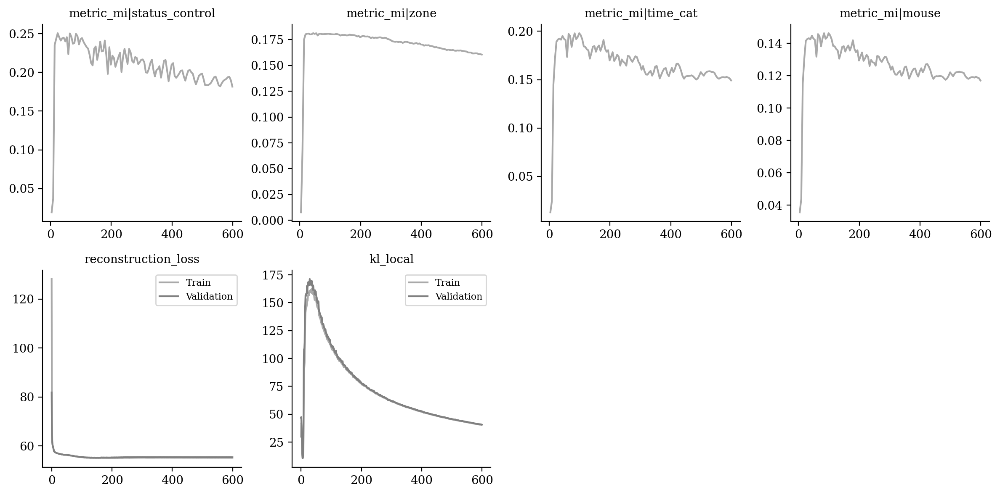

In [15]:
vae.plot_training_history(
    ignore_first=0,
    n_col=4,
    metrics_name=["metric_mi|status_control", "metric_mi|zone", "metric_mi|time_cat", "metric_mi|mouse",
                 "reconstruction_loss", "kl_local"]
)

In [16]:
from tardis._disentanglementmanager import DisentanglementManager as DM

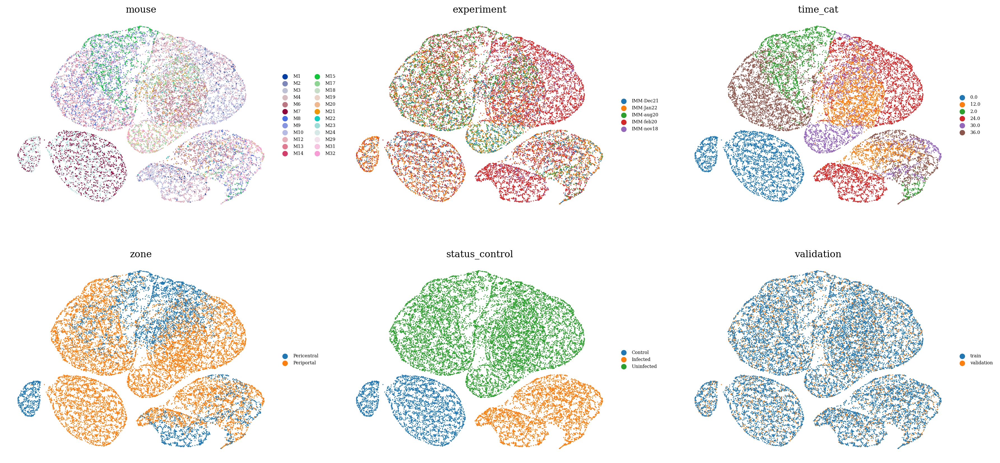

In [17]:
sublatent = DM.configurations.get_by_obs_key("status_control").reserved_latent_indices
latent = ad.AnnData(X=vae.get_latent_representation()[:, sublatent], obs=adata.obs.copy())
sc.pp.neighbors(latent)
sc.tl.umap(latent)

with warnings.catch_warnings():
    warnings.simplefilter("ignore")
    sc.pl.umap(
        latent, 
        color=['mouse', 'experiment', 'time_cat', 'zone', 'status_control', "validation"], 
        ncols=3,
        frameon=False,
        legend_fontsize="xx-small"
    )

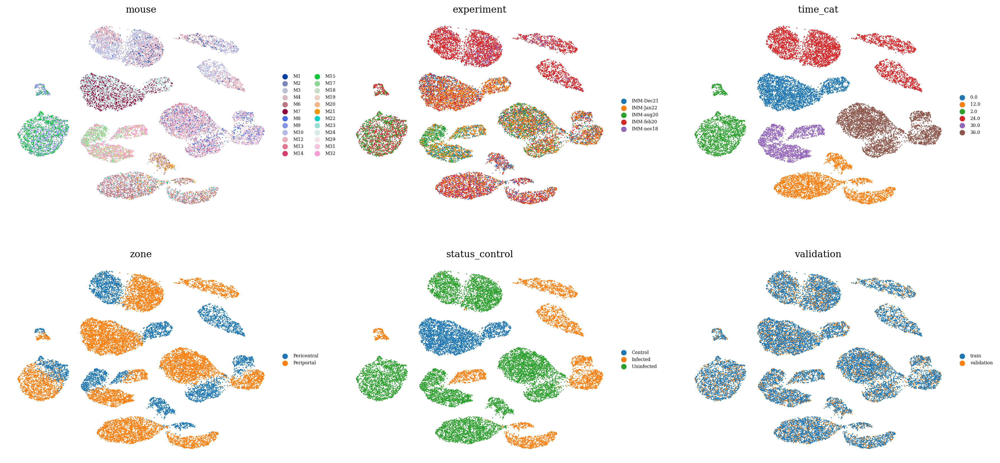

In [18]:
sublatent = DM.configurations.get_by_obs_key("time_cat").reserved_latent_indices
latent = ad.AnnData(X=vae.get_latent_representation()[:, sublatent], obs=adata.obs.copy())
sc.pp.neighbors(latent)
sc.tl.umap(latent)

with warnings.catch_warnings():
    warnings.simplefilter("ignore")
    sc.pl.umap(
        latent, 
        color=['mouse', 'experiment', 'time_cat', 'zone', 'status_control', "validation"], 
        ncols=3,
        frameon=False,
        legend_fontsize="xx-small"
    )

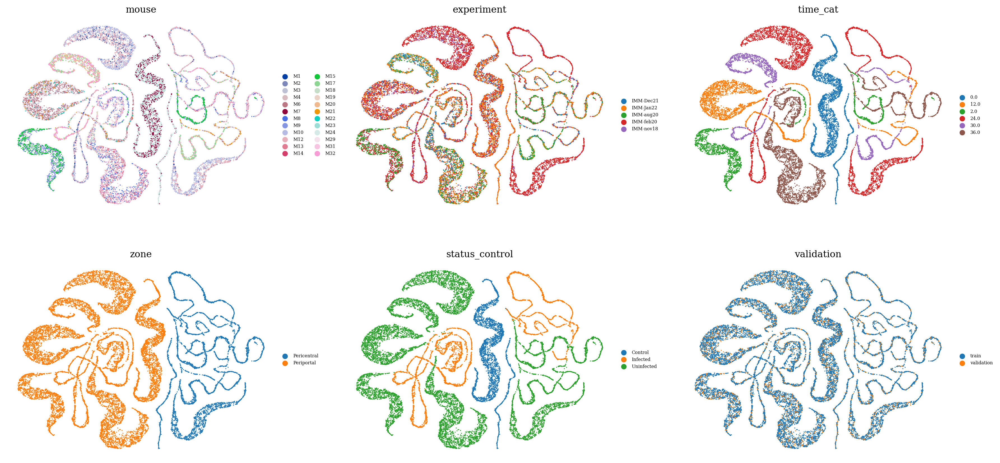

In [19]:
sublatent = DM.configurations.get_by_obs_key("zone").reserved_latent_indices
latent = ad.AnnData(X=vae.get_latent_representation()[:, sublatent], obs=adata.obs.copy())
sc.pp.neighbors(latent)
sc.tl.umap(latent)

with warnings.catch_warnings():
    warnings.simplefilter("ignore")
    sc.pl.umap(
        latent, 
        color=['mouse', 'experiment', 'time_cat', 'zone', 'status_control', "validation"], 
        ncols=3,
        frameon=False,
        legend_fontsize="xx-small"
    )

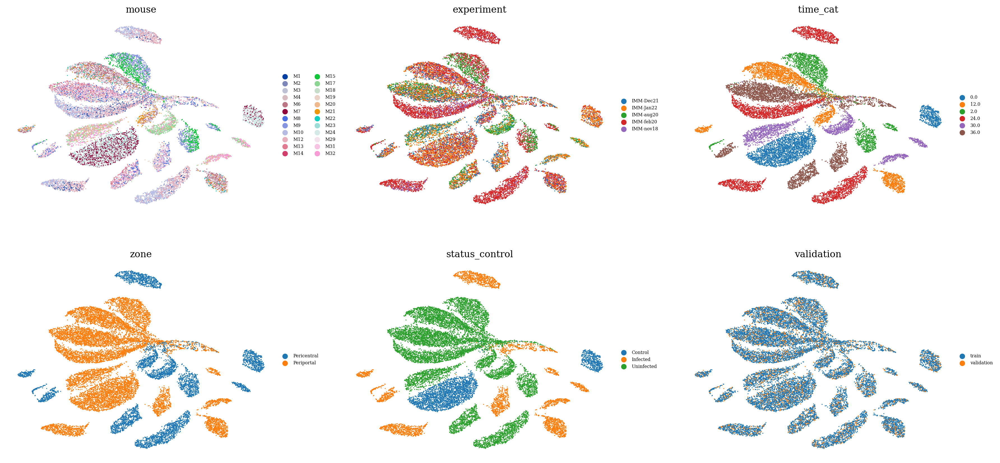

In [20]:
sublatent = DM.configurations.unreserved_latent_indices
latent = ad.AnnData(X=vae.get_latent_representation()[:, sublatent], obs=adata.obs.copy())
sc.pp.neighbors(latent)
sc.tl.umap(latent)

with warnings.catch_warnings():
    warnings.simplefilter("ignore")
    sc.pl.umap(
        latent, 
        color=['mouse', 'experiment', 'time_cat', 'zone', 'status_control', "validation"], 
        ncols=3,
        frameon=False,
        legend_fontsize="xx-small"
    )

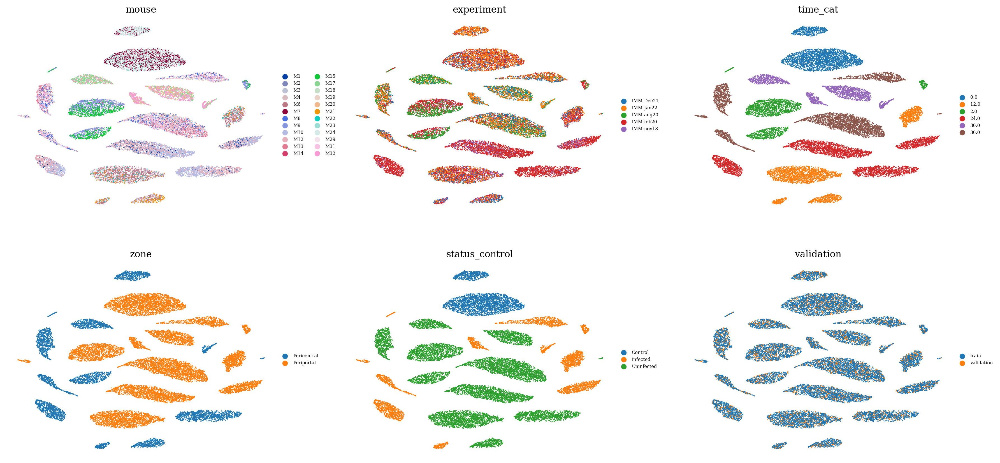

In [21]:
latent = ad.AnnData(X=vae.get_latent_representation(), obs=adata.obs.copy())
sc.pp.neighbors(latent)
sc.tl.umap(latent)

with warnings.catch_warnings():
    warnings.simplefilter("ignore")
    sc.pl.umap(
        latent, 
        color=['mouse', 'experiment', 'time_cat', 'zone', 'status_control', "validation"], 
        ncols=3,
        frameon=False,
        legend_fontsize="xx-small"
    )

In [22]:
data = vae.get_latent_representation()

import sklearn
factors_indices = sorted([[indice, config.obs_key] for config in DM.configurations.items for indice in config.reserved_latent_indices])
factors = np.vstack([sklearn.preprocessing.LabelEncoder().fit_transform(
    adata.obs[j].copy().astype(str).values.flatten()
) for i, j in factors_indices]).T

data = data[:, [i for i, j in factors_indices]]

maxMIG = vae.get_MI_precalculated(data=data, factors=factors, variation="maxMIG", discretization_bins=256)
maxMIG_mean = np.mean(maxMIG)
maxMIG_mean

0.7252190706799034

In [23]:
data = vae.get_latent_representation()

import sklearn
factors_indices = sorted([[indice, config.obs_key] for config in DM.configurations.items for indice in config.reserved_latent_indices])
factors = np.vstack([sklearn.preprocessing.LabelEncoder().fit_transform(
    adata.obs[j].copy().astype(str).values.flatten()
) for i, j in factors_indices]).T

data = data[:, [i for i, j in factors_indices]]

maxMIG = vae.get_MI_precalculated(data=data[vae.validation_indices, :], factors=factors[vae.validation_indices, :], variation="maxMIG", discretization_bins=256)
maxMIG_mean = np.mean(maxMIG)
maxMIG_mean

0.688928632354318

In [24]:
vae.get_MI_normalized_training("zone")

{('validation', 'reserved'): 0.9984310199034518,
 ('validation', 'unreserved'): 0.21847587871312507,
 ('train', 'reserved'): 0.9960081867939462,
 ('train', 'unreserved'): 0.1768796646184118}

In [25]:
vae.get_MI_normalized_training("status_control")

{('validation', 'reserved'): 0.9852946937464802,
 ('validation', 'unreserved'): 0.37802072381225754,
 ('train', 'reserved'): 0.9856213709833047,
 ('train', 'unreserved'): 0.3331937732588809}

In [26]:
vae.get_MI_normalized_training("time_cat")

{('validation', 'reserved'): 0.9835143141325564,
 ('validation', 'unreserved'): 0.31350943588707836,
 ('train', 'reserved'): 0.9825887840149548,
 ('train', 'unreserved'): 0.24751542351812872}